In [449]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pmdarima import auto_arima
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_percentage_error
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
import math
from statsmodels.tsa.seasonal import seasonal_decompose

In [450]:
import warnings

warnings.filterwarnings("ignore")

In [451]:
combined_df = pd.read_csv("datasets/final_data.csv")

In [452]:
combined_df

,Age,Sex,Country,Unemployment Rate (%),Year,Month
0,25+,Female,Ireland,0.096000,2014,4
1,25+,Total,Norway,0.028000,2014,10
2,25+,Male,Iceland,0.052000,2021,1
3,25+,Male,Iceland,0.049000,2021,2
4,25+,Male,Iceland,0.048000,2021,3
...,...,...,...,...,...,...
30822,25+,Total,United States of America,0.058255,2014,1
30823,15-24,Male,United States of America,0.164923,2014,1
30824,25+,Male,United States of America,0.062145,2014,1
30825,15-24,Female,United States of America,0.133269,2014,1


## Common part

In [453]:
def prepare_data(combined_df, country, age, sex):
    # Filter the data based on provided country, age, and sex
    data_filtered = combined_df[
        (combined_df['Country'] == country) &
        (combined_df['Age'] == age) &
        (combined_df['Sex'] == sex)
    ].copy()

    # Prepare the Date column
    data_filtered['Date'] = pd.to_datetime(data_filtered['Year'].astype(str) + '-' + data_filtered['Month'].astype(str), format='%Y-%m')

    # Drop unnecessary columns and set the index
    data_filtered.drop(['Country', 'Sex', 'Age', 'Year', 'Month'], axis=1, inplace=True)
    data_filtered.set_index('Date', inplace=True)
    data_filtered.rename(columns={'Unemployment Rate (%)': 'Value'}, inplace=True)
    data_filtered = data_filtered.sort_values(by='Date')

    return data_filtered

forecast_results_df = pd.DataFrame(columns=['Model', 'Country', 'Age', 'Sex', 'Date', 'Forecast', 'MSE', 'RMSE', 'MAPE'])

def save_forecast_results(model_name, country, age, sex, predictions, mse, rmse, mape):
    global forecast_results_df

    # Створюємо DataFrame для збереження результатів прогнозу
    results = pd.DataFrame({
        'Model': model_name,
        'Country': country,
        'Age': age,
        'Sex': sex,
        'Date': predictions.index,
        'Forecast': predictions.values,
        'MSE': mse,
        'RMSE': rmse,
        'MAPE': mape
    })

    if not results.empty and not results.isna().all().all():
        forecast_results_df = pd.concat([forecast_results_df, results], ignore_index=True)
    else:
        print("Skipping empty or all-NA DataFrame in concatenation.")


# Вносимо зміни в `model_arima` і `model_sarima`, щоб викликати `save_forecast_results`
def model_arima(data_filtered, country, age, sex):
    # Fit auto_arima to determine the best ARIMA order
    stepwise_fit = auto_arima(data_filtered['Value'],
                              start_p=1, start_q=1,
                              max_p=3, max_q=3, m=12,
                              start_P=0, seasonal=False,
                              d=2, D=2, trace=True,
                              error_action='ignore',
                              suppress_warnings=True,
                              stepwise=True)

    print(stepwise_fit.summary())

    # Extract the best ARIMA parameters
    order = stepwise_fit.order

    # Fit the ARIMA model with the selected order
    arima_model = ARIMA(data_filtered['Value'], order=order)
    results_arima = arima_model.fit()

    # Predict using ARIMA
    arima_predictions = results_arima.predict(start='2022-01-01', end='2025-12-01').rename('ARIMA Predictions')

    # Plot ARIMA Predictions
    plt.figure(figsize=(10, 6))
    plt.plot(data_filtered, label='Original Data')
    plt.plot(arima_predictions, label='ARIMA Predictions')
    plt.legend()
    plt.title('Time Series Forecasting with ARIMA')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.show()

    actual = data_filtered['Value']['2022-01-01':'2024-06-01']
    arima_predictions_trimmed = arima_predictions.loc['2022-01-01':'2024-06-01']

    # Ensure consistent lengths
    actual = actual.dropna()
    arima_predictions_trimmed = arima_predictions_trimmed.loc[actual.index]

    mse_arima = mean_squared_error(actual, arima_predictions_trimmed)
    rmse_arima = math.sqrt(mse_arima)
    mape_arima = mean_absolute_percentage_error(actual, arima_predictions_trimmed)
    print(f'ARIMA - MSE: {mse_arima}, RMSE: {rmse_arima}, MAPE: {mape_arima:.2%}')
    save_forecast_results(
        model_name='ARIMA',
        country=country,
        age=age,
        sex=sex,
        predictions=arima_predictions,
        mse=mse_arima,
        rmse=rmse_arima,
        mape=mape_arima
    )

def model_sarima(data_filtered, country, age, sex):
    # Fit auto_arima to determine the best SARIMA order
    stepwise_fit = auto_arima(data_filtered['Value'],
                              start_p=1, start_q=1,
                              max_p=5, max_q=5, m=12,
                              start_P=0, seasonal=True,
                              d=1, D=1, trace=True,
                              error_action='ignore',
                              suppress_warnings=True,
                              stepwise=True)

    print(stepwise_fit.summary())

    # Extract the best SARIMA parameters
    order = stepwise_fit.order
    seasonal_order = stepwise_fit.seasonal_order

    # Fit the SARIMA model with the selected order
    sarima_model = SARIMAX(data_filtered['Value'], order=order, seasonal_order=seasonal_order)
    results_sarima = sarima_model.fit()

    # Predict using SARIMA
    sarima_predictions = results_sarima.predict(start='2022-01-01', end='2025-12-01').rename('SARIMA Predictions')

    # Plot SARIMA Predictions
    plt.figure(figsize=(10, 6))
    plt.plot(data_filtered, label='Original Data')
    plt.plot(sarima_predictions, label='SARIMA Predictions')
    plt.legend()
    plt.title('Time Series Forecasting with SARIMA')
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.show()

    actual = data_filtered['Value']['2022-01-01':'2024-06-01']
    sarima_predictions_trimmed = sarima_predictions.loc['2022-01-01':'2024-06-01']

    # Ensure consistent lengths
    actual = actual.dropna()
    sarima_predictions_trimmed = sarima_predictions_trimmed.loc[actual.index]

    mse_sarima = mean_squared_error(actual, sarima_predictions_trimmed)
    rmse_sarima = math.sqrt(mse_sarima)
    mape_sarima = mean_absolute_percentage_error(actual, sarima_predictions_trimmed)
    print(f'SARIMA - MSE: {mse_sarima}, RMSE: {rmse_sarima}, MAPE: {mape_sarima:.2%}')
    save_forecast_results(
        model_name='SARIMA',
        country=country,
        age=age,
        sex=sex,
        predictions=sarima_predictions,
        mse=mse_sarima,
        rmse=rmse_sarima,
        mape=mape_sarima
    )

In [454]:
def calculate_seasonal_strength(data, column='Value', period=12, threshold=0.7):
    decomposition = seasonal_decompose(data[column], model='additive', period=period)
    seasonal_component = decomposition.seasonal
    residual_component = decomposition.resid

    # Calculate seasonal strength
    original_variance = np.var(data[column].dropna())
    residual_variance = np.var(residual_component.dropna())
    seasonal_strength = 1 - (residual_variance / original_variance)

    # Determine seasonality strength
    seasonality_detected = seasonal_strength > threshold

    print(f"Seasonal Strength: {seasonal_strength:.4f}")
    if seasonality_detected:
        print("Strong seasonality detected.")
    else:
        print("Weak or no seasonality detected.")

    return seasonal_strength, seasonality_detected

## ITALY

### 15-24, Male

In [455]:
data_filtered = prepare_data(combined_df, country='Italy', age='15-24', sex='Male')

In [456]:
data_filtered

,Value
Date,
2014-01-01,0.421
2014-02-01,0.421
2014-03-01,0.421
2014-04-01,0.417
2014-05-01,0.417
...,...
2023-05-01,0.209
2023-06-01,0.209
2023-07-01,0.213


In [457]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9876
Strong seasonality detected.


(0.9876485747761745, True)

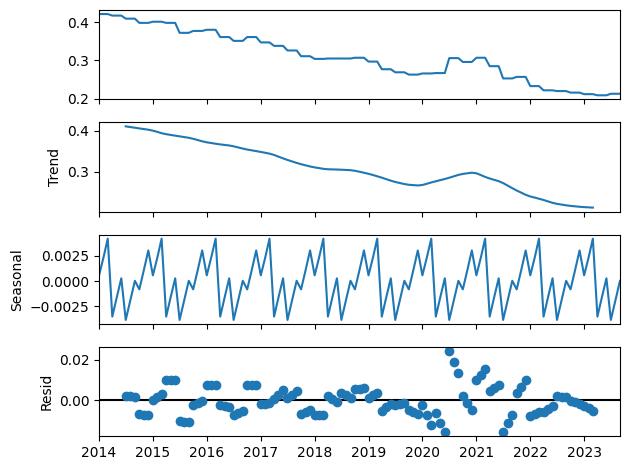

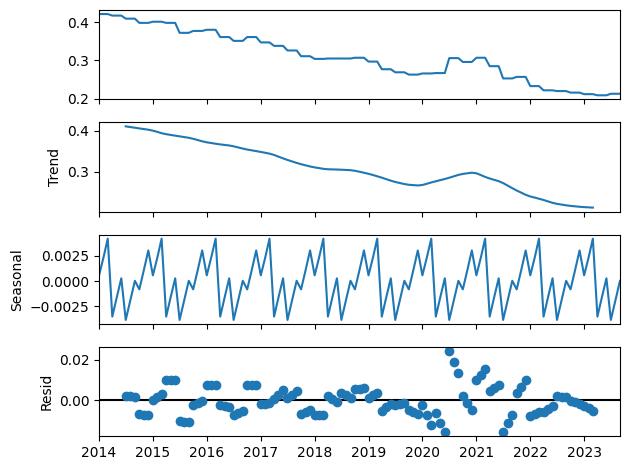

In [458]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Trend (Тренд): Верхня частина графіка показує наявність спадного тренду з деякими коливаннями, що свідчить про поступове зниження рівня показника з часом.

Seasonal (Сезонність): Сезонна компонента демонструє регулярні коливання на певних інтервалах, що вказує на циклічні зміни в даних. Цей компонент свідчить про сезонний характер часового ряду.

Resid (Залишок): Компонента залишків показує відхилення, які не пояснюються трендом або сезонністю.

Зважаючи на наявність чіткої сезонності, використання SARIMA (Seasonal ARIMA) буде більш підходящим для вашої задачі, ніж класична ARIMA. Модель SARIMA дозволяє враховувати як трендові, так і сезонні коливання в даних, що забезпечить точніший прогноз для вашого часового ряду з регулярною сезонністю.

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=4.42 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-624.247, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-671.441, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-622.247, Time=0.07 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-694.574, Time=0.92 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-690.746, Time=0.16 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-702.294, Time=0.35 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.79 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-693.404, Time=1.50 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-702.947, Time=1.24 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-704.981, Time=0.78 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.25 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-696.944, Time=0.63 sec
 ARIMA(0,1,0)(1,1,1)[12]             : 

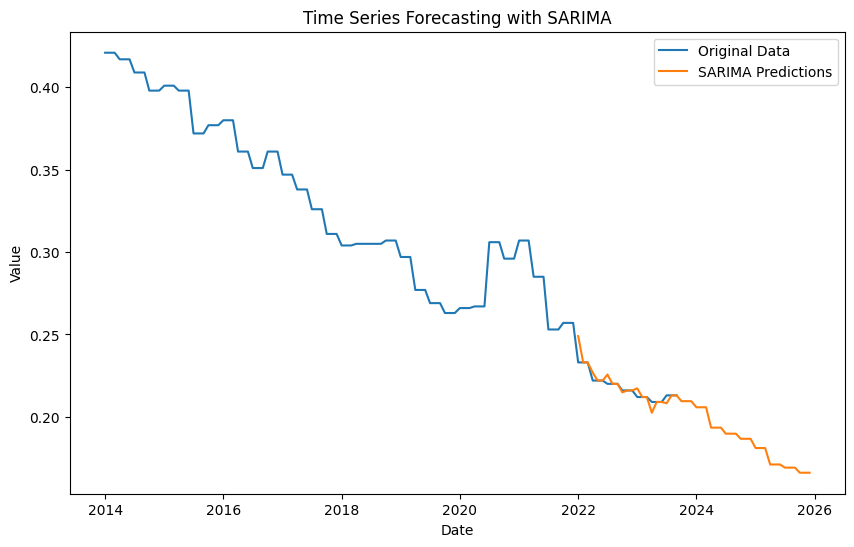

SARIMA - MSE: 1.932869311833409e-05, RMSE: 0.004396440960405825, MAPE: 0.95%


In [459]:
model_sarima(data_filtered, 'Italy', '15-24', 'Male')

In [460]:
forecast_results_df

,Model,Country,Age,Sex,Date,Forecast,MSE,RMSE,MAPE
0,SARIMA,Italy,15-24,Male,2022-01-01,0.248991,0.000019,0.004396,0.009529
1,SARIMA,Italy,15-24,Male,2022-02-01,0.233000,0.000019,0.004396,0.009529
2,SARIMA,Italy,15-24,Male,2022-03-01,0.233000,0.000019,0.004396,0.009529
3,SARIMA,Italy,15-24,Male,2022-04-01,0.226813,0.000019,0.004396,0.009529
4,SARIMA,Italy,15-24,Male,2022-05-01,0.222000,0.000019,0.004396,0.009529
5,SARIMA,Italy,15-24,Male,2022-06-01,0.222000,0.000019,0.004396,0.009529
6,SARIMA,Italy,15-24,Male,2022-07-01,0.225633,0.000019,0.004396,0.009529
7,SARIMA,Italy,15-24,Male,2022-08-01,0.220000,0.000019,0.004396,0.009529
8,SARIMA,Italy,15-24,Male,2022-09-01,0.220000,0.000019,0.004396,0.009529
9,SARIMA,Italy,15-24,Male,2022-10-01,0.214848,0.000019,0.004396,0.009529


### 15-24, Female

In [461]:
data_filtered = prepare_data(combined_df, country='Italy', age='15-24', sex='Female')

In [462]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9759
Strong seasonality detected.


(0.9759137610718212, True)

In [463]:
data_filtered

,Value
Date,
2014-01-01,0.446
2014-02-01,0.446
2014-03-01,0.446
2014-04-01,0.441
2014-05-01,0.441
...,...
2023-05-01,0.256
2023-06-01,0.256
2023-07-01,0.260


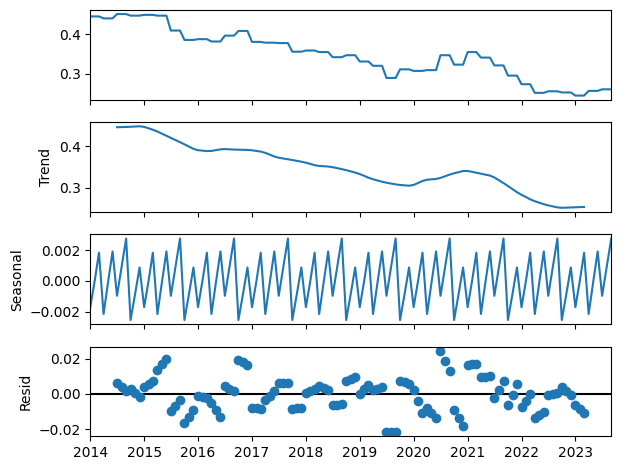

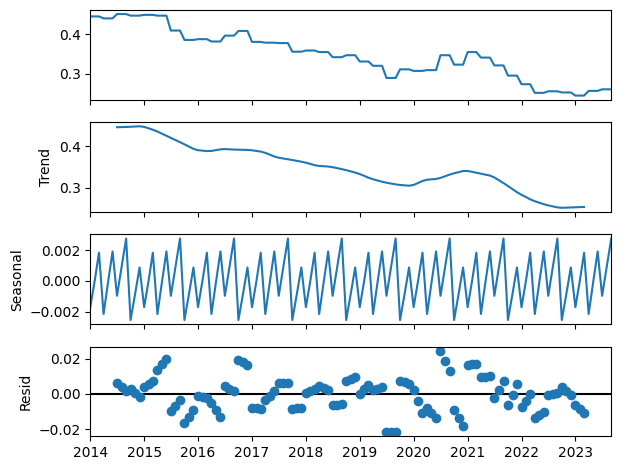

In [464]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Тренд: У часовому ряді є чіткий спадний тренд, що свідчить про загальне зниження показника з часом.

Сезонність: Сезонна компонента демонструє регулярні коливання, що вказує на наявність повторюваних сезонних циклів у даних.

Залишок: Компонента залишків показує невеликі відхилення від тренду і сезонності, але вони не виглядають суттєвими.

Зважаючи на наявність як тренду, так і сезонності, SARIMA (Seasonal ARIMA) буде оптимальним вибором для цього часового ряду. Модель SARIMA дозволяє враховувати і трендові, і сезонні коливання, що зробить прогноз точнішим у порівнянні з класичною ARIMA, яка не враховує сезонність.

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=8.10 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-551.720, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-594.867, Time=0.96 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.46 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-549.720, Time=0.08 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-630.424, Time=0.24 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-648.279, Time=2.48 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-639.654, Time=0.68 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-642.621, Time=0.73 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.43 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-650.798, Time=1.12 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.76 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-632.536, Time=0.41 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=-644.780, Time=1.06 sec
 ARIMA(0,1,0)(1,1,0)[12]             : 

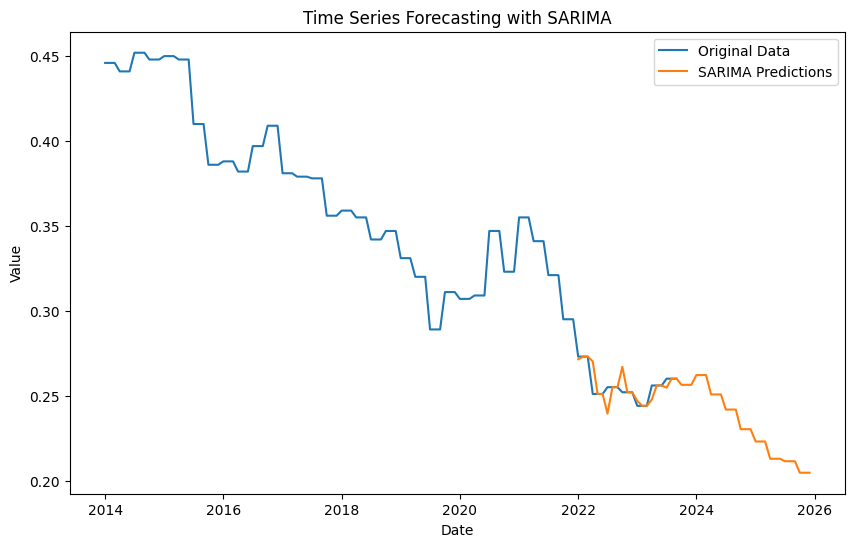

SARIMA - MSE: 4.4951099107027934e-05, RMSE: 0.006704558084395118, MAPE: 1.27%


In [465]:
model_sarima(data_filtered, 'Italy', '15-24', 'Female')

In [466]:
forecast_results_df

,Model,Country,Age,Sex,Date,Forecast,MSE,RMSE,MAPE
0,SARIMA,Italy,15-24,Male,2022-01-01,0.248991,0.000019,0.004396,0.009529
1,SARIMA,Italy,15-24,Male,2022-02-01,0.233000,0.000019,0.004396,0.009529
2,SARIMA,Italy,15-24,Male,2022-03-01,0.233000,0.000019,0.004396,0.009529
3,SARIMA,Italy,15-24,Male,2022-04-01,0.226813,0.000019,0.004396,0.009529
4,SARIMA,Italy,15-24,Male,2022-05-01,0.222000,0.000019,0.004396,0.009529
...,...,...,...,...,...,...,...,...,...
91,SARIMA,Italy,15-24,Female,2025-08-01,0.211366,0.000045,0.006705,0.012740
92,SARIMA,Italy,15-24,Female,2025-09-01,0.211366,0.000045,0.006705,0.012740
93,SARIMA,Italy,15-24,Female,2025-10-01,0.204605,0.000045,0.006705,0.012740
94,SARIMA,Italy,15-24,Female,2025-11-01,0.204605,0.000045,0.006705,0.012740


### 15-24, Total

In [467]:
data_filtered = prepare_data(combined_df, country='Italy', age='15-24', sex='Total')

In [468]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9753
Strong seasonality detected.


(0.9753402524993018, True)

In [469]:
data_filtered

,Value
Date,
2014-01-01,0.432
2014-02-01,0.429
2014-03-01,0.433
2014-04-01,0.432
2014-05-01,0.427
...,...
2024-05-01,0.206
2024-06-01,0.205
2024-07-01,0.198


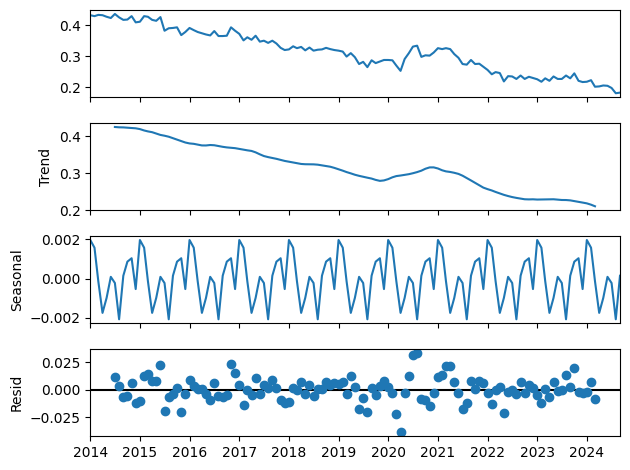

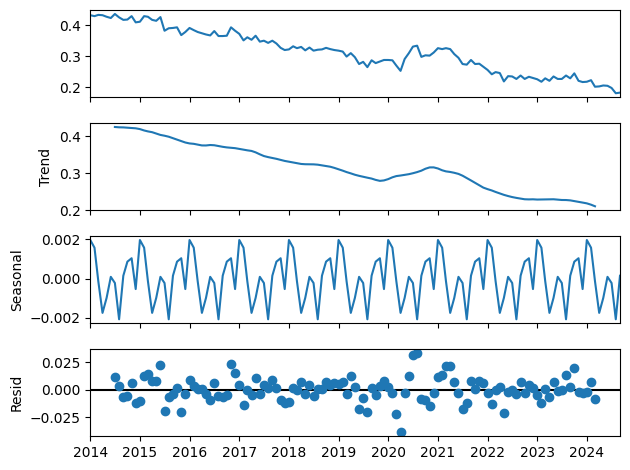

In [470]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Сезонність: Видно регулярні циклічні зміни, що означає наявність сезонної компоненти.
Тренд: Спостерігається загальна тенденція зниження, яка також може бути змодельована в SARIMA.
Випадкові залишки: Резідуальні коливання виглядають близькими до нуля, що може вказувати на те, що основні патерни враховані, але залишкові випадкові коливання все одно потребують сезонної корекції для підвищення точності.

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=3.14 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-560.713, Time=0.12 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-617.898, Time=5.61 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-563.828, Time=0.02 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-648.712, Time=0.88 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.09 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-661.904, Time=0.20 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-678.685, Time=1.21 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=0.62 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=inf, Time=1.48 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-660.104, Time=0.90 sec
 ARIMA(2,1,0)(1,1,2)[12]             : AIC=inf, Time=0.91 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=2

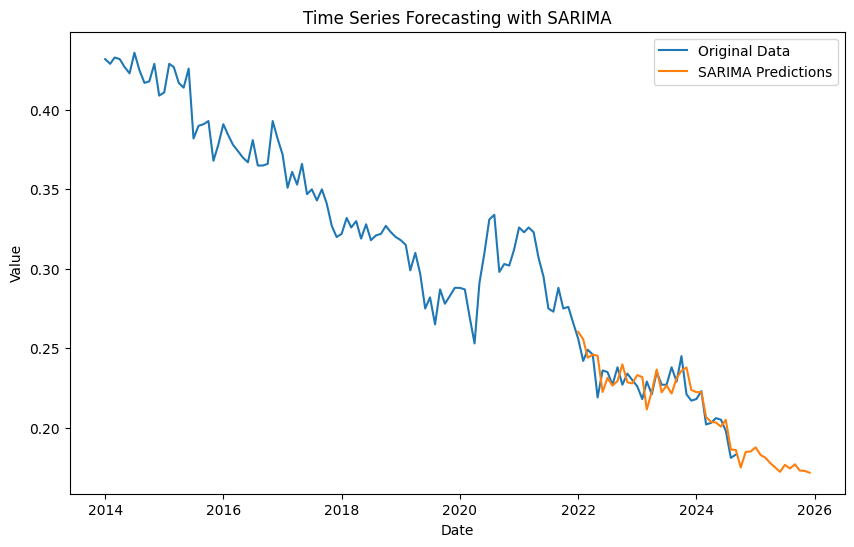

SARIMA - MSE: 9.092666630932751e-05, RMSE: 0.009535547509678064, MAPE: 3.10%


In [471]:
model_sarima(data_filtered, 'Italy', '15-24', 'Total')

### 25+, Female

In [472]:
data_filtered = prepare_data(combined_df, country='Italy', age='25+', sex='Female')

In [473]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9437
Strong seasonality detected.


(0.9436783534048339, True)

In [474]:
data_filtered

,Value
Date,
2014-01-01,0.117
2014-02-01,0.117
2014-03-01,0.117
2014-04-01,0.116
2014-05-01,0.116
...,...
2023-05-01,0.077
2023-06-01,0.077
2023-07-01,0.079


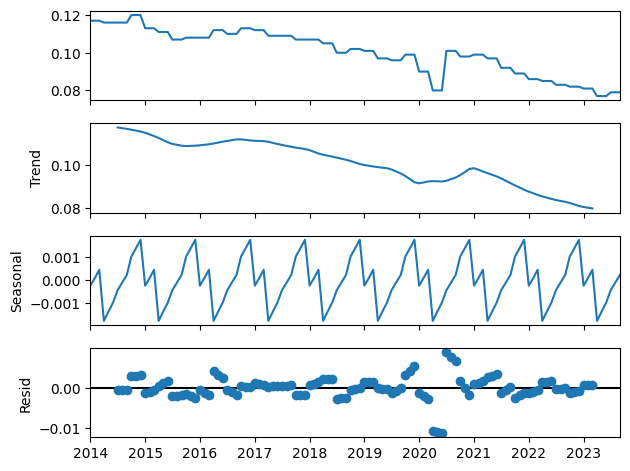

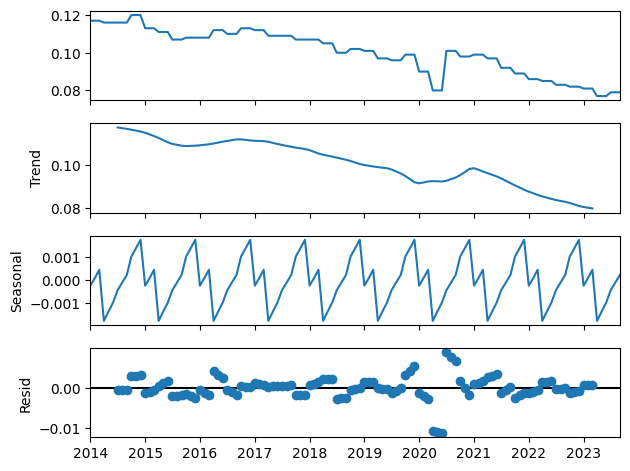

In [475]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=4.15 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-844.199, Time=0.22 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-864.994, Time=5.26 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.30 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-842.199, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-888.471, Time=1.00 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-894.201, Time=0.68 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-892.915, Time=2.05 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-884.930, Time=2.09 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.10 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-896.201, Time=0.52 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-883.216, Time=0.29 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-890.471, Time=0.22 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=-886.930, Time=1.13 sec
 ARIMA(0,1,0)(1,1,0)[12]          

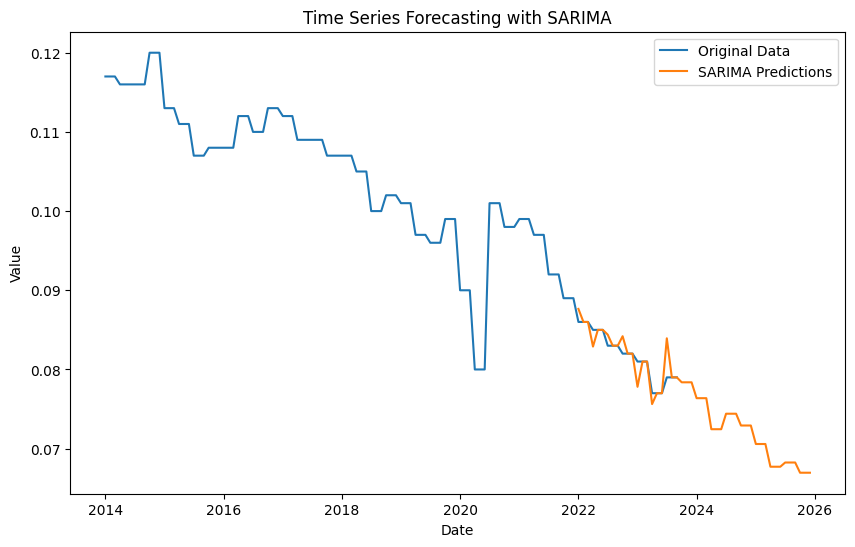

SARIMA - MSE: 2.3978657693587157e-06, RMSE: 0.0015485043653017951, MAPE: 0.99%


In [476]:
model_sarima(data_filtered, 'Italy', '25+', 'Female')

### 25+ Male

In [477]:
data_filtered = prepare_data(combined_df, country='Italy', age='25+', sex='Male')

In [478]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9824
Strong seasonality detected.


(0.9823771210175029, True)

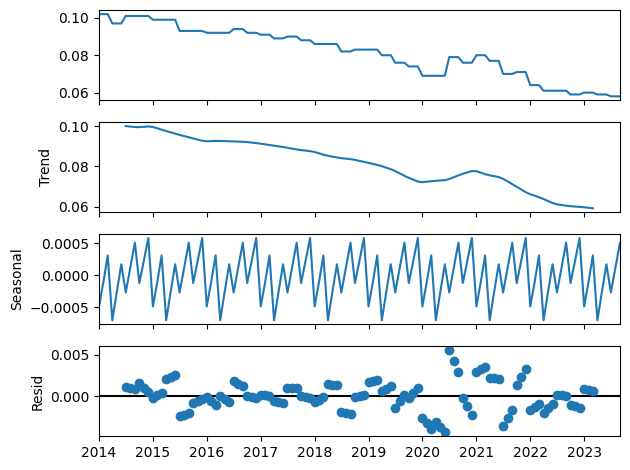

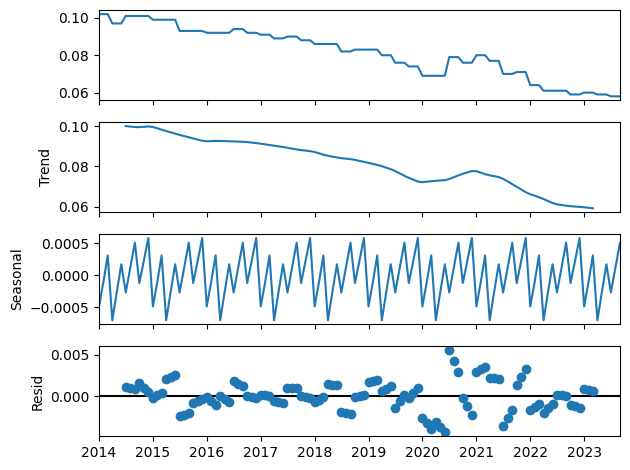

In [479]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.69 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-891.207, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-953.946, Time=0.42 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-889.206, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-997.273, Time=0.69 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1023.464, Time=1.34 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-934.335, Time=0.40 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-991.989, Time=1.38 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-994.206, Time=0.34 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-1025.530, Time=1.55 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-925.154, Time=0.10 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-999.273, Time=1.19 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=-993.991, Time=1.38 sec
 ARIMA(0,1,0)(1,1,0)[12]   

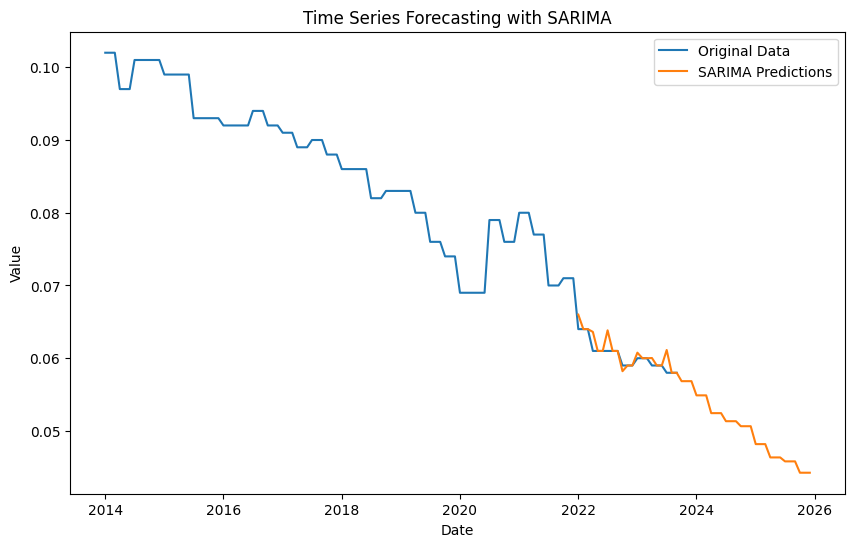

SARIMA - MSE: 1.473991330930277e-06, RMSE: 0.0012140804466468755, MAPE: 1.04%


In [480]:
model_sarima(data_filtered, 'Italy', '25+', 'Male')

### 25+, Total

In [481]:
data_filtered = prepare_data(combined_df, country='Italy', age='25+', sex='Total')

In [482]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9742
Strong seasonality detected.


(0.974160216028246, True)

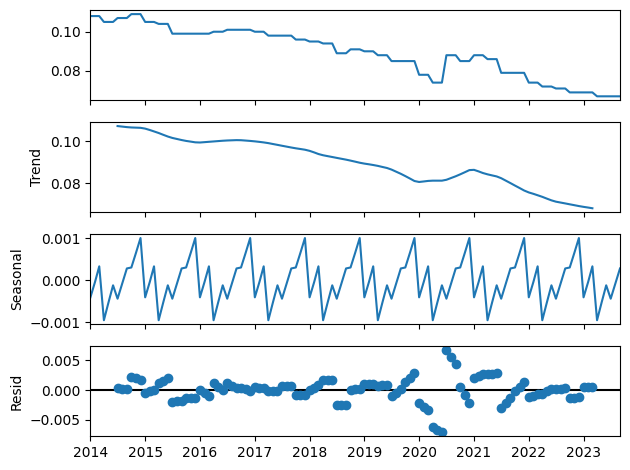

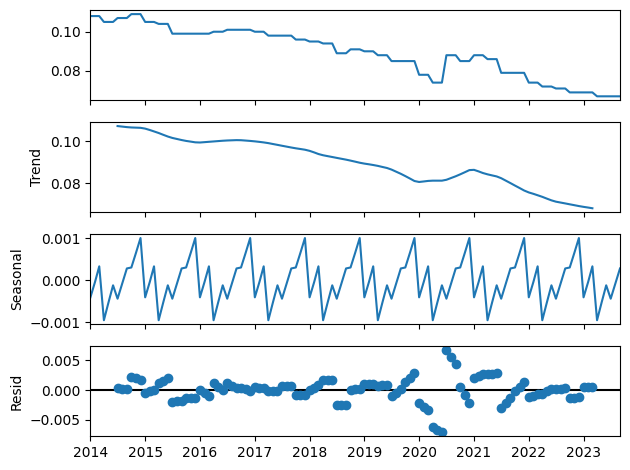

In [483]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.16 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-885.237, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-926.068, Time=0.26 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.56 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-883.236, Time=0.07 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-958.361, Time=0.25 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-966.677, Time=0.88 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-894.890, Time=0.17 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-959.934, Time=0.76 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-950.425, Time=0.82 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-967.331, Time=0.63 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-956.456, Time=0.46 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-960.361, Time=0.49 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=-961.935, Time=0.92 sec
 ARIMA(0,1,0)(1,1,0)[12]     

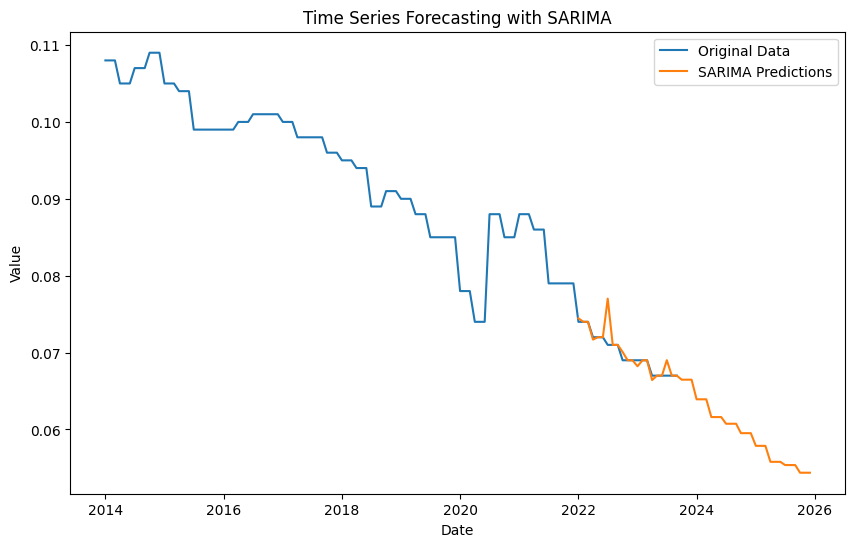

SARIMA - MSE: 2.0271999718575106e-06, RMSE: 0.001423797728561719, MAPE: 0.76%


In [484]:
model_sarima(data_filtered, 'Italy', '25+', 'Total')

## France

### 15-24, Male

In [485]:
data_filtered = prepare_data(combined_df, country='France', age='15-24', sex='Male')

In [486]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9266
Strong seasonality detected.


(0.9265549272135531, True)

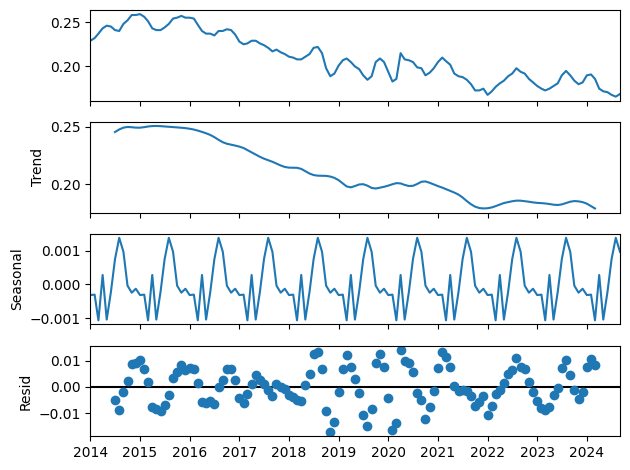

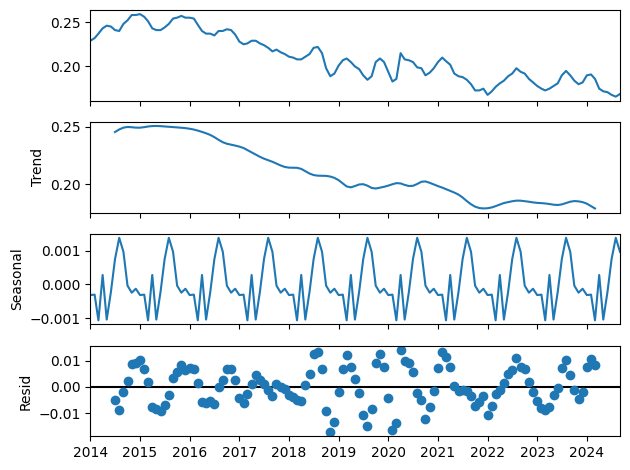

In [487]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-841.362, Time=1.15 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-761.563, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-813.978, Time=0.23 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-844.272, Time=0.52 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-786.026, Time=0.10 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-838.624, Time=0.98 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-844.738, Time=1.63 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-843.734, Time=0.80 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-829.890, Time=1.17 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-840.853, Time=0.48 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-843.086, Time=3.83 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-840.970, Time=0.50 sec
 ARIMA(1,1,2)(0,1,2)[12]             : AIC=-842.904, Time=1.75 sec
 ARIMA(0,1,1)(0,1,2)[12] intercept   : AIC=-842.048, Time=2.04 sec

Best model:  ARIMA

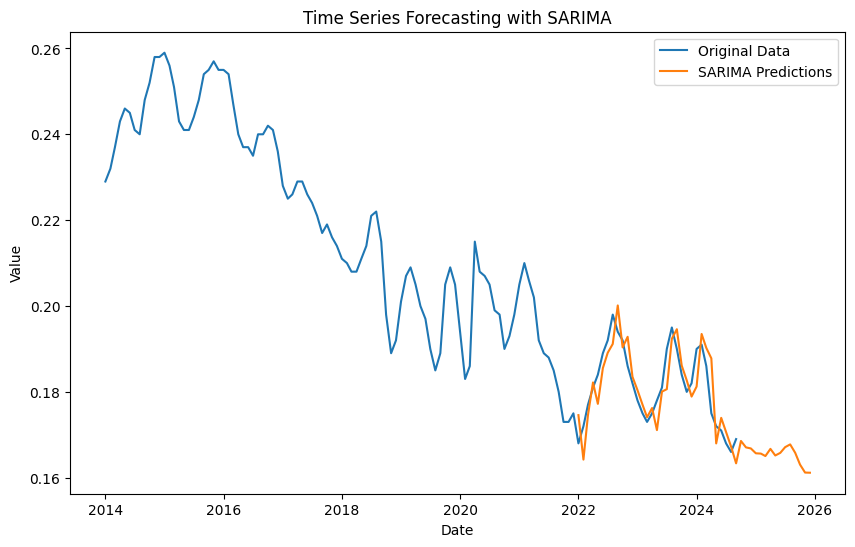

SARIMA - MSE: 2.6724457496672253e-05, RMSE: 0.005169570339658051, MAPE: 2.34%


In [488]:
model_sarima(data_filtered,'France', '15-24', 'Male')

### 15-24, Female

In [489]:
data_filtered = prepare_data(combined_df, country='France', age='15-24', sex='Female')

In [490]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9638
Strong seasonality detected.


(0.9637833589565912, True)

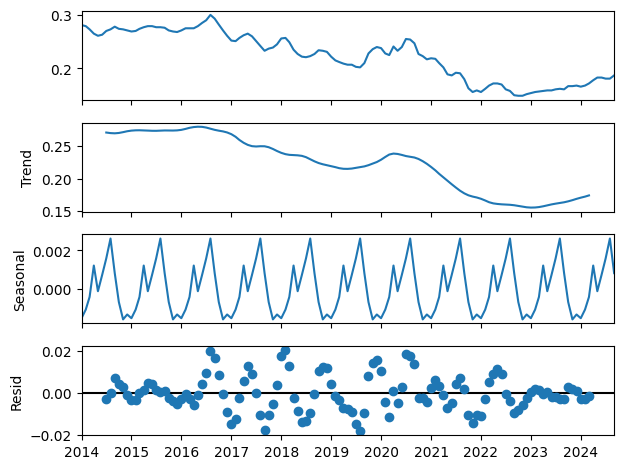

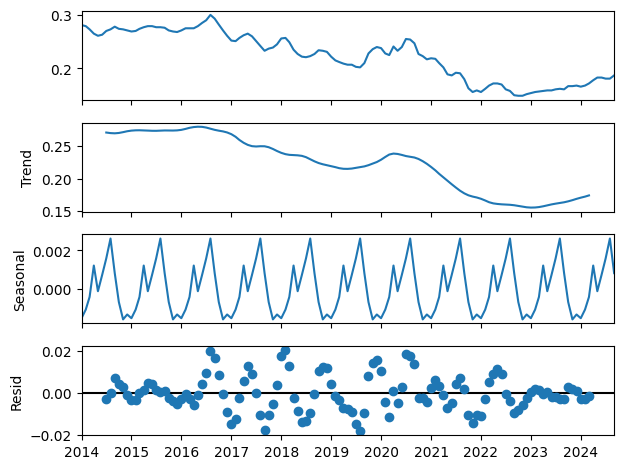

In [491]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-820.961, Time=0.97 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-751.558, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-803.891, Time=0.34 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.52 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-789.246, Time=0.27 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-809.514, Time=0.23 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-831.524, Time=2.27 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.27 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-829.285, Time=0.67 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-830.109, Time=1.44 sec
 ARIMA(1,1,2)(0,1,2)[12]             : AIC=-829.832, Time=2.17 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.12 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-834.084, Time=3.39 sec
 ARIMA(0,1,2)(0,1,1)[12]             : 

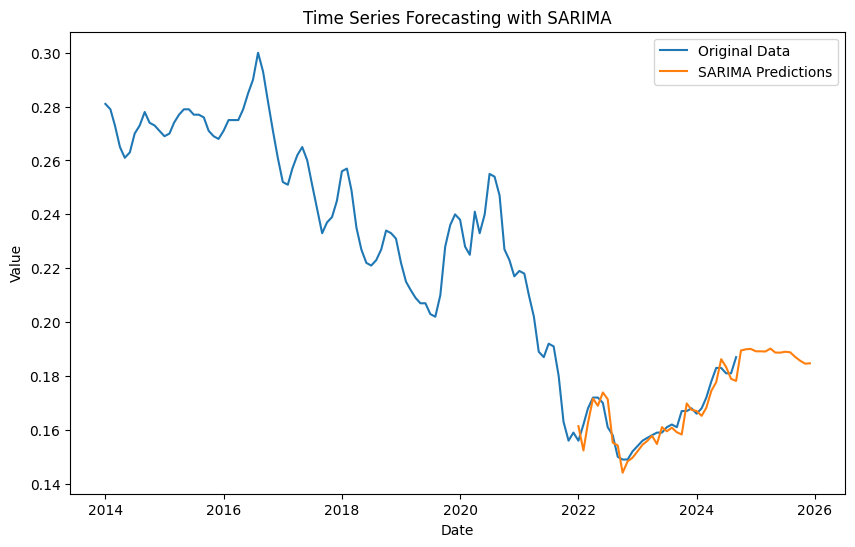

SARIMA - MSE: 1.779126367695269e-05, RMSE: 0.004217969141299245, MAPE: 2.05%


In [492]:
model_sarima(data_filtered,'France', '15-24', 'Female')

### 15-24, Total

In [493]:
data_filtered = prepare_data(combined_df, country='France', age='15-24', sex='Total')

In [494]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9722
Strong seasonality detected.


(0.9722125563602366, True)

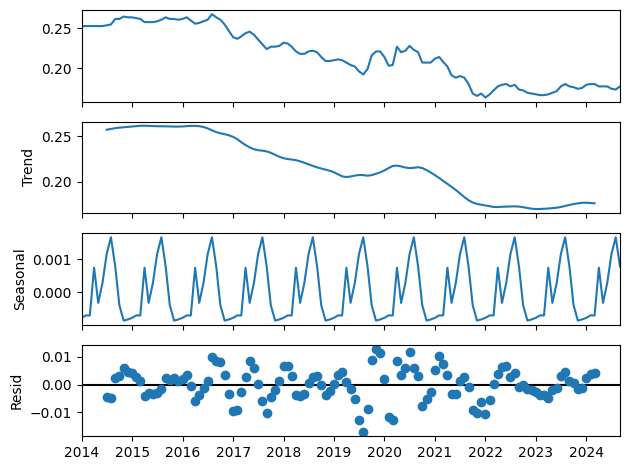

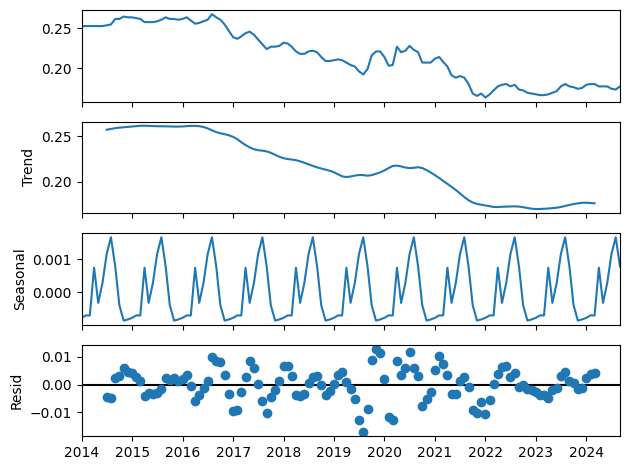

In [495]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-872.122, Time=0.78 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-799.108, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-844.454, Time=0.29 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-874.629, Time=0.35 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-818.211, Time=0.07 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=0.84 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-875.570, Time=1.75 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=0.84 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-866.772, Time=0.51 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-873.721, Time=1.49 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-874.050, Time=2.12 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-871.645, Time=0.84 sec
 ARIMA(1,1,2)(0,1,2)[12]             : AIC=-871.307, Time=1.35 sec
 ARIMA(0,1,1)(0,1,2)[12] intercept   : AIC=-864.500, Time=1.08 sec

Best model:  ARIMA(0,1,1)(0,

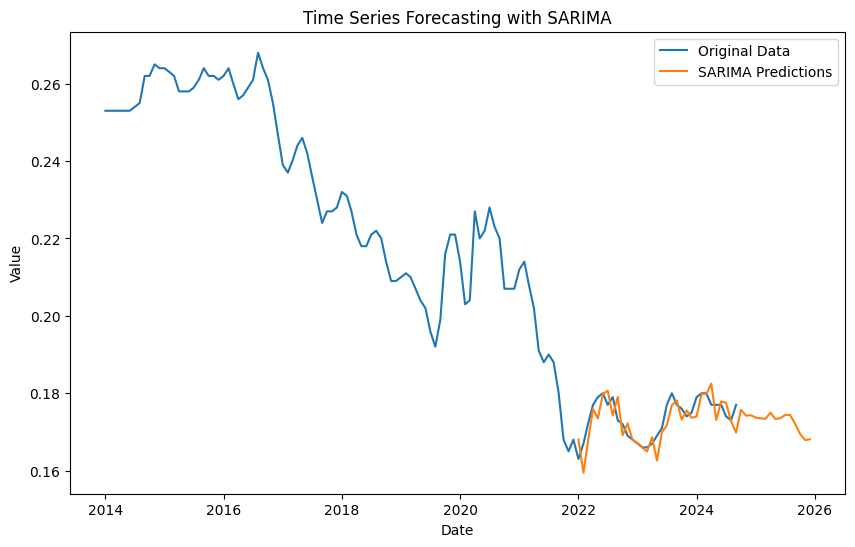

SARIMA - MSE: 1.3128772735203807e-05, RMSE: 0.003623364836061062, MAPE: 1.65%


In [496]:
model_sarima(data_filtered,'France', '15-24', 'Total')

### 25+, Male

In [497]:
data_filtered = prepare_data(combined_df, country='France', age='25+', sex='Male')

In [498]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9640
Strong seasonality detected.


(0.9639892730409885, True)

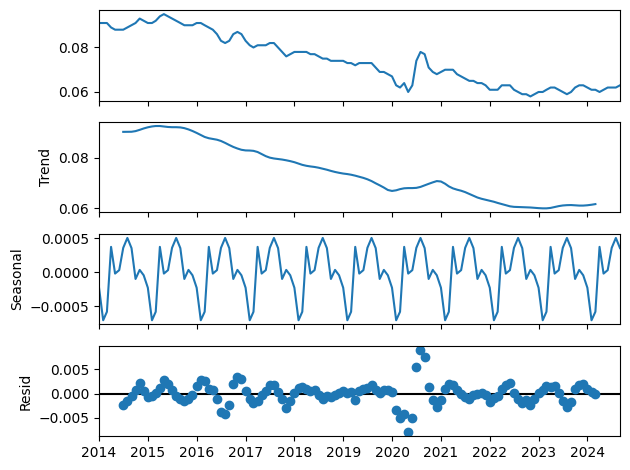

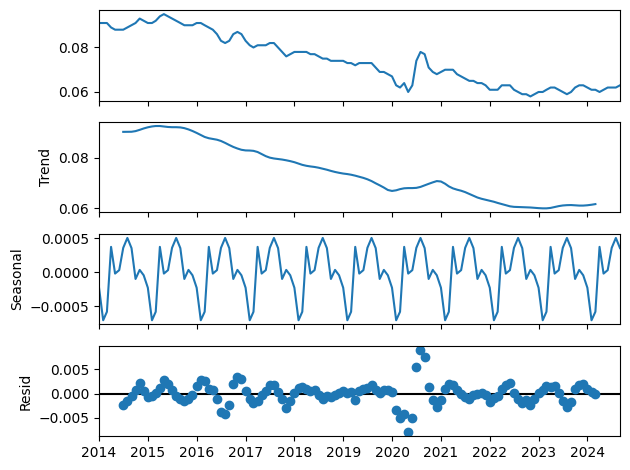

In [499]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1126.579, Time=1.19 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1051.992, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1101.728, Time=0.17 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1129.202, Time=0.44 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1083.885, Time=0.34 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1118.634, Time=0.31 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1132.662, Time=0.91 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1105.694, Time=0.59 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1047.994, Time=0.45 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1076.589, Time=0.48 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-1075.260, Time=0.83 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1068.467, Time=0.32 sec
 ARIMA(1,1,2)(0,1,2)[12]             : AIC=-1085.065, Time=0.45 sec
 ARIMA(0,1,1)(0,1,2)[12] intercept   : AIC=-1125.137, Time=1.77 sec

Best

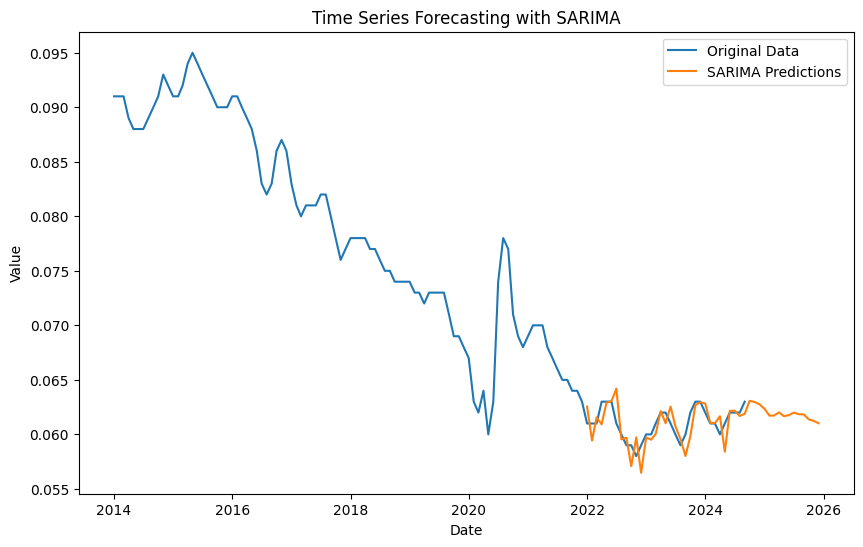

SARIMA - MSE: 1.927254009129947e-06, RMSE: 0.0013882557434168775, MAPE: 1.76%


In [500]:
model_sarima(data_filtered,'France', '25+', 'Male')

### 25+, Female

In [501]:
data_filtered = prepare_data(combined_df, country='France', age='25+', sex='Female')

In [502]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9124
Strong seasonality detected.


(0.9123691649836152, True)

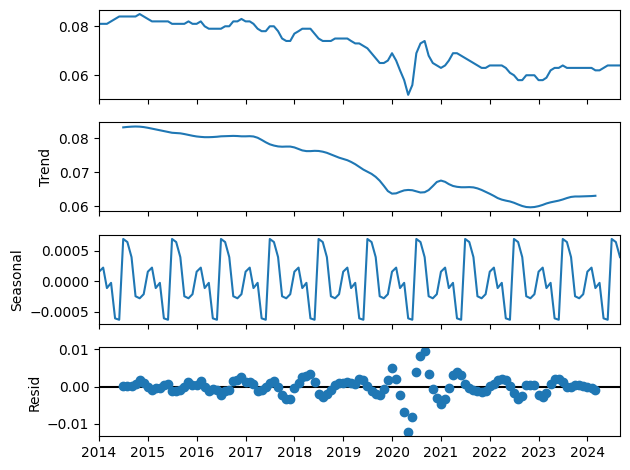

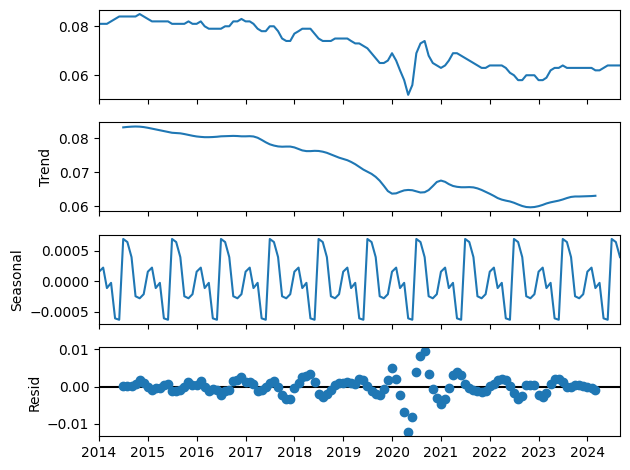

In [503]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=2.00 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1016.195, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1072.816, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1043.454, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-1089.156, Time=0.43 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1088.937, Time=0.39 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1093.195, Time=0.48 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=0.86 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1100.413, Time=1.11 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1079.682, Time=0.55 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=-1115.384, Time=1.56 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=inf, Time=0.64 sec
 ARIMA(2,1,0)(1,1,2)[12]           

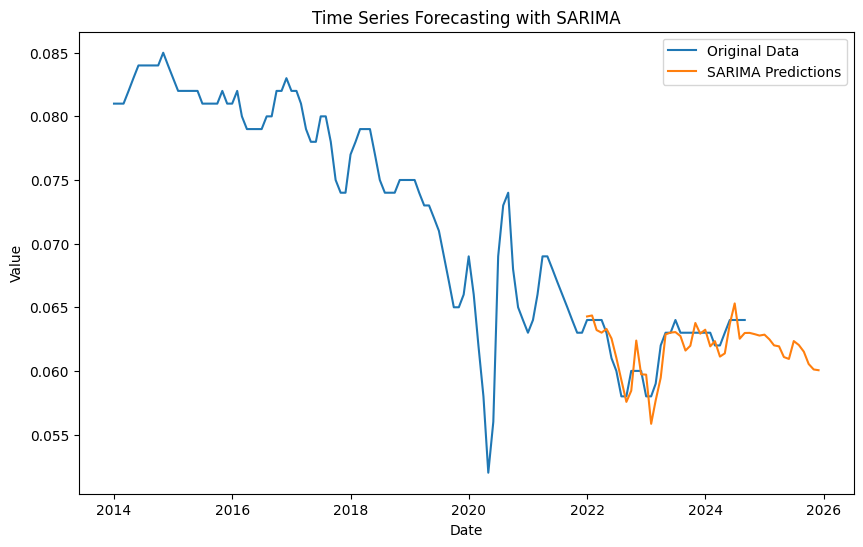

SARIMA - MSE: 1.350013516280128e-06, RMSE: 0.0011619008203285373, MAPE: 1.53%


In [504]:
model_sarima(data_filtered,'France', '25+', 'Female')

### 25+, Total

In [505]:
data_filtered = prepare_data(combined_df, country='France', age='25+', sex='Female')

In [506]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9124
Strong seasonality detected.


(0.9123691649836152, True)

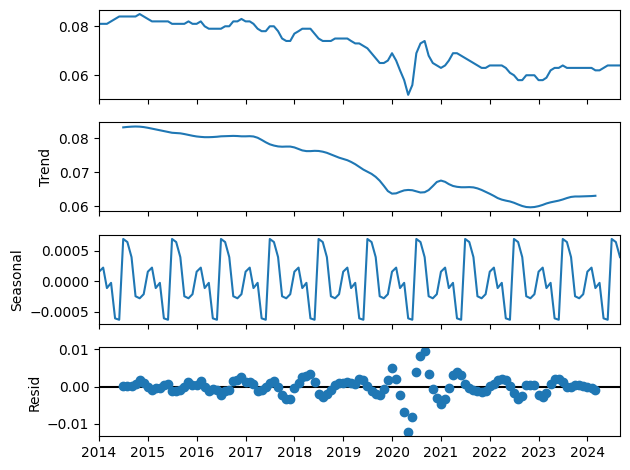

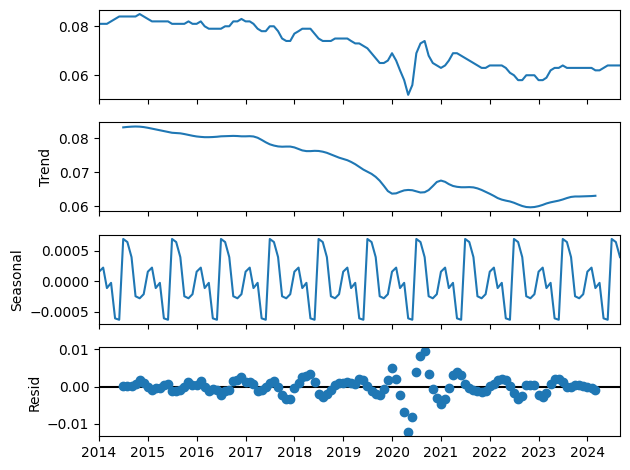

In [507]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.71 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1016.195, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1072.816, Time=0.17 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1043.454, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-1089.156, Time=0.41 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1088.937, Time=0.35 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1093.195, Time=0.50 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.49 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=0.91 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1100.413, Time=1.02 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1079.682, Time=0.48 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=-1115.384, Time=1.58 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=inf, Time=0.48 sec
 ARIMA(2,1,0)(1,1,2)[12]           

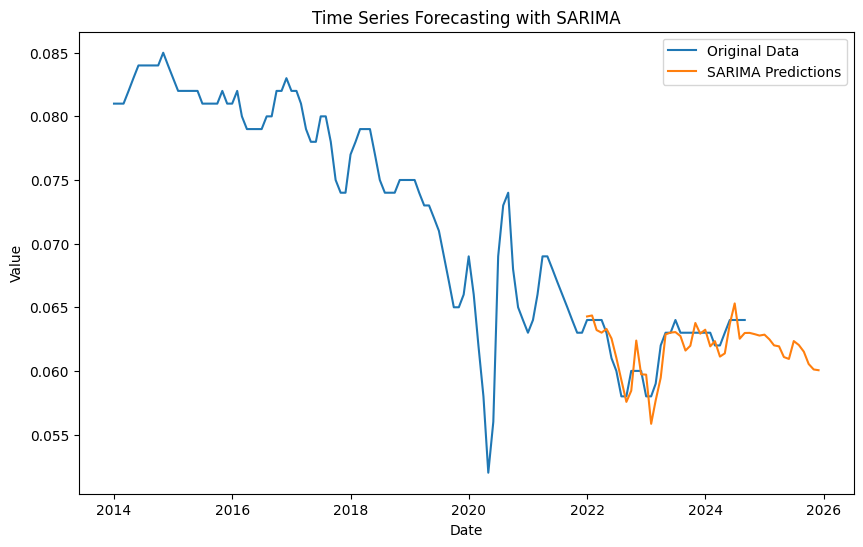

SARIMA - MSE: 1.350013516280128e-06, RMSE: 0.0011619008203285373, MAPE: 1.53%


In [508]:
model_sarima(data_filtered,'France', '25+', 'Total')

## Iceland

### 15-24,Male

In [509]:
data_filtered = prepare_data(combined_df, country='Iceland', age='15-24', sex='Male')

In [510]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9813
Strong seasonality detected.


(0.9812924578631829, True)

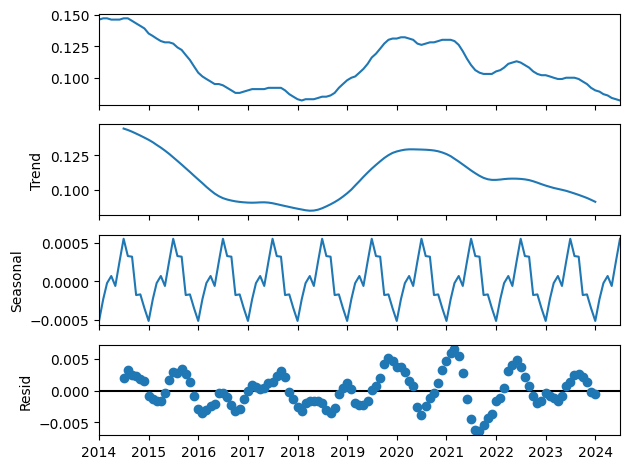

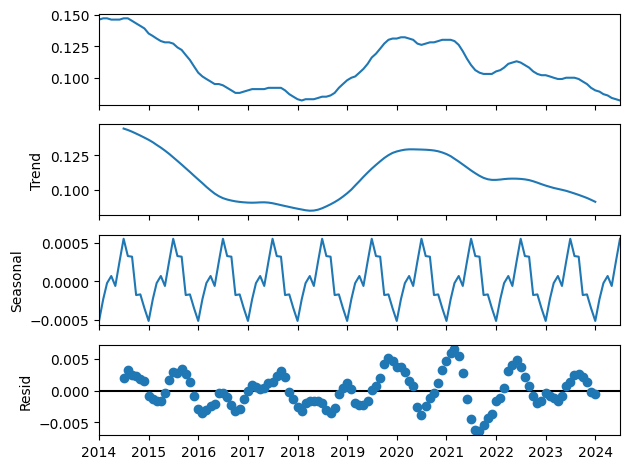

In [511]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1194.584, Time=0.98 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1017.119, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1171.174, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1108.473, Time=0.37 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1153.117, Time=0.05 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1188.021, Time=0.59 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1149.116, Time=0.31 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1171.530, Time=0.54 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1150.646, Time=0.48 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1194.391, Time=0.47 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1193.222, Time=0.61 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1192.446, Time=0.62 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1040.891, Time=0.14 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1131.884, Time=0.24 sec
 ARIM

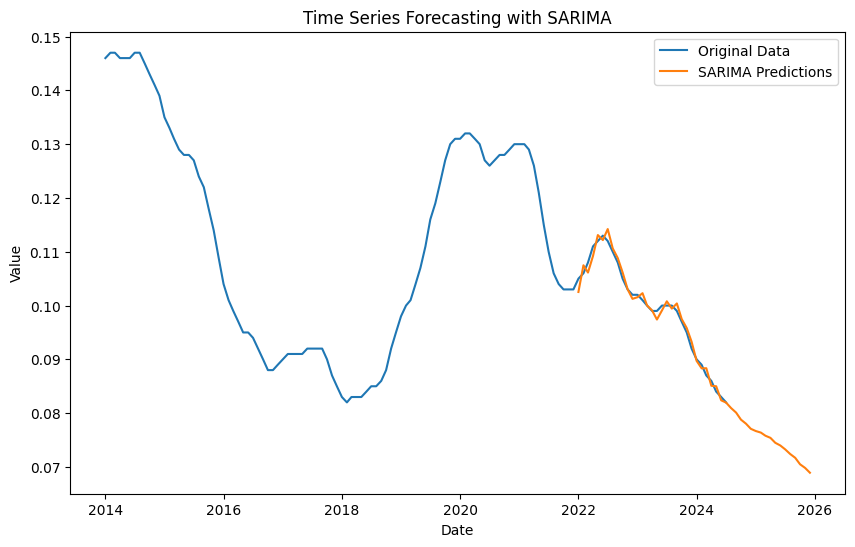

SARIMA - MSE: 1.3373665945225614e-06, RMSE: 0.0011564456729663357, MAPE: 0.98%


In [512]:
model_sarima(data_filtered,'Iceland', '15-24', 'Male')

### 15-24, Female

In [513]:
data_filtered = prepare_data(combined_df, country='Iceland', age='15-24', sex='Female')

In [514]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9397
Strong seasonality detected.


(0.9397327421595159, True)

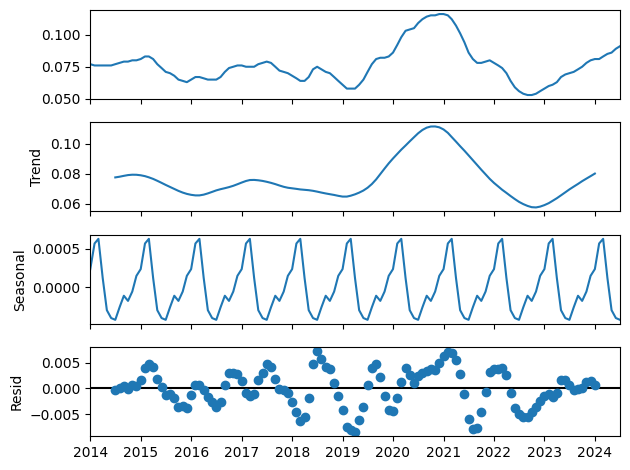

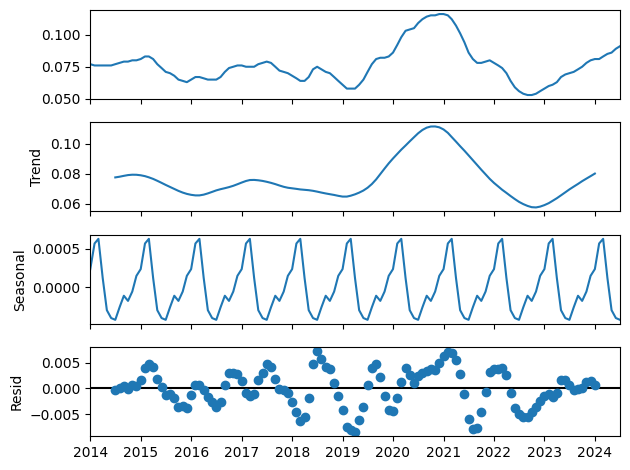

In [515]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1099.362, Time=0.81 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-944.048, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1080.867, Time=0.21 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1060.300, Time=0.65 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1070.022, Time=0.16 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1094.959, Time=0.52 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1066.022, Time=0.64 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1088.673, Time=0.16 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1101.786, Time=1.24 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=-1090.268, Time=1.14 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-1079.341, Time=1.20 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1059.583, Time=1.07 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1073.602, Time=0.52 sec
 ARIMA(2,1,1)(1,1,2)[12]             : AIC=-1098.345, Time=1.39 sec
 ARIMA

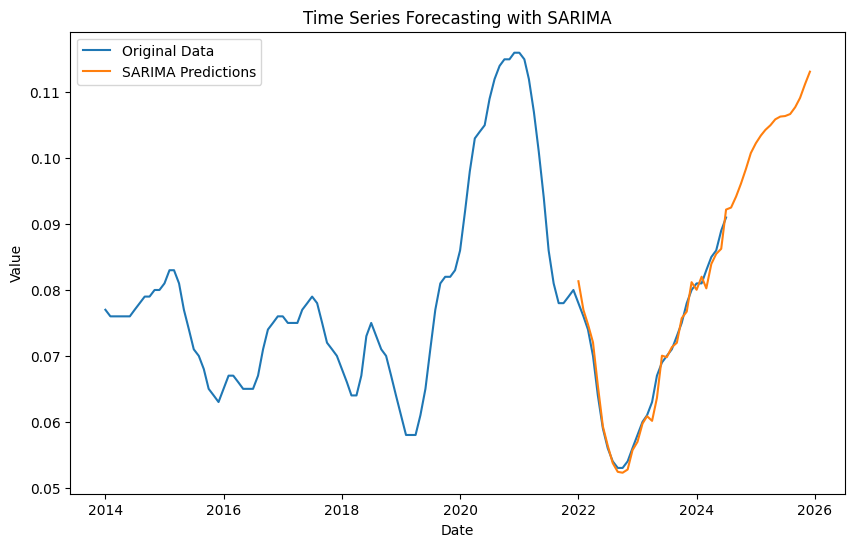

SARIMA - MSE: 2.2304543472893204e-06, RMSE: 0.001493470571283318, MAPE: 1.65%


In [516]:
model_sarima(data_filtered,'Iceland', '15-24', 'Female')

### 15-24, Total

In [517]:
data_filtered = prepare_data(combined_df, country='Iceland', age='15-24', sex='Total')

In [518]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9676
Strong seasonality detected.


(0.9676482702765785, True)

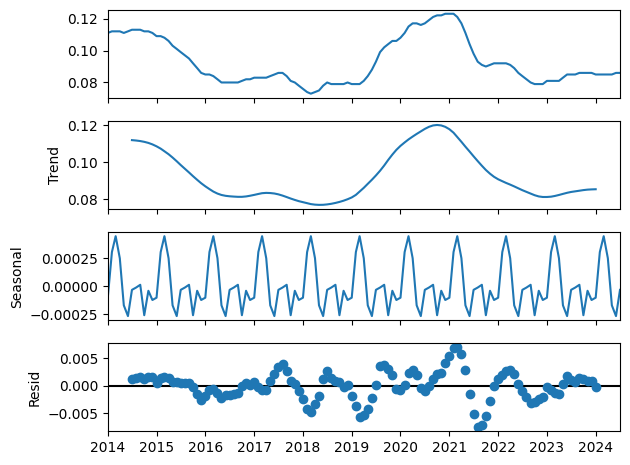

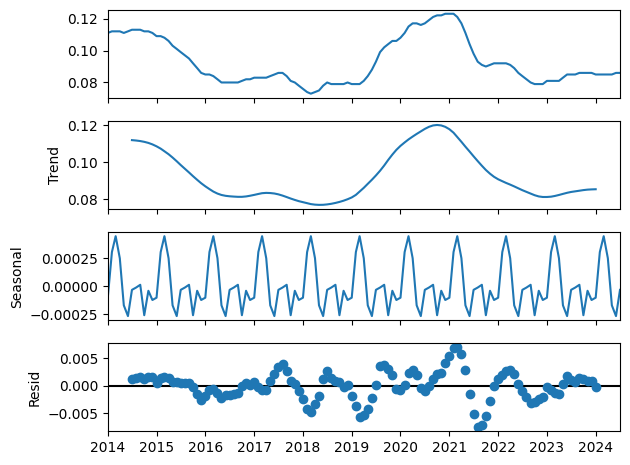

In [519]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1162.971, Time=1.13 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1023.826, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1151.350, Time=0.29 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1110.315, Time=0.14 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1136.794, Time=0.22 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1159.787, Time=0.39 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1132.794, Time=0.48 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1149.637, Time=0.30 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1137.727, Time=0.66 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1164.541, Time=0.35 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1138.745, Time=0.03 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1161.333, Time=0.30 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1134.747, Time=0.16 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1139.591, Time=0.48 sec
 ARIM

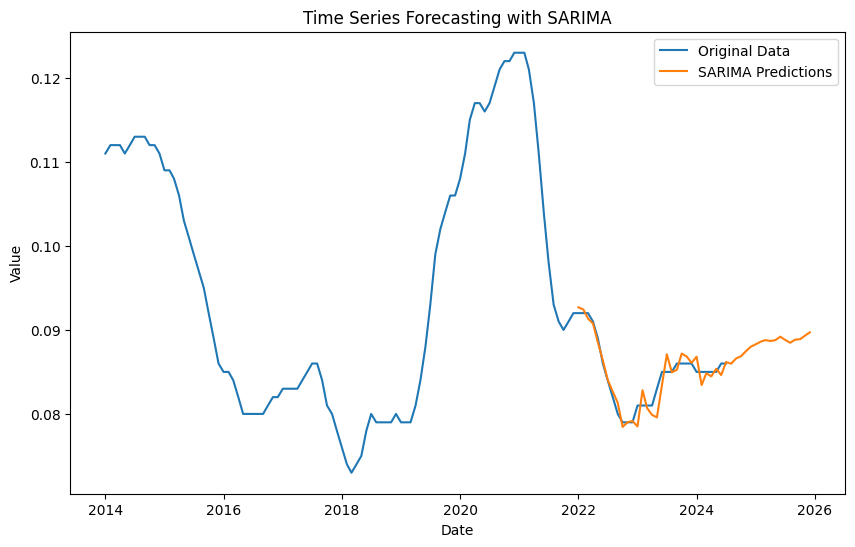

SARIMA - MSE: 1.4693793478064889e-06, RMSE: 0.001212179585625203, MAPE: 1.07%


In [520]:
model_sarima(data_filtered,'Iceland', '15-24', 'Total')

### 25+, Male

In [521]:
data_filtered = prepare_data(combined_df, country='Iceland', age='25+', sex='Male')

In [522]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9742
Strong seasonality detected.


(0.9742104425914374, True)

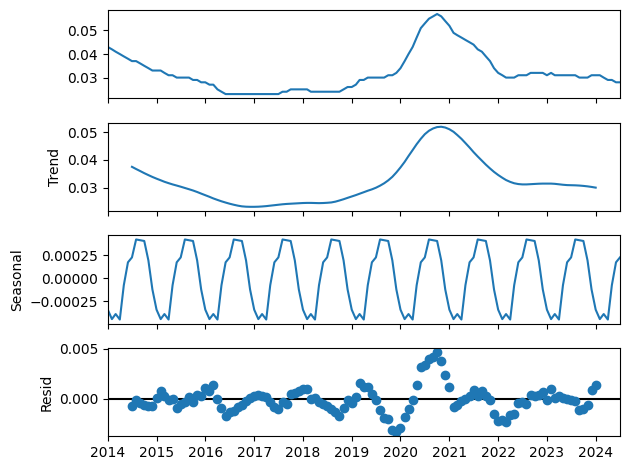

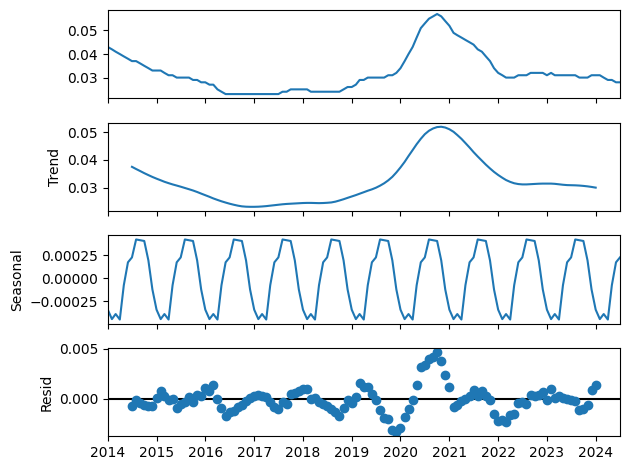

In [523]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1273.324, Time=1.06 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1130.026, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1242.520, Time=0.37 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1214.272, Time=0.18 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1234.247, Time=0.34 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1255.340, Time=0.36 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1230.248, Time=0.62 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1252.293, Time=0.26 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1245.806, Time=0.34 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1266.325, Time=0.23 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1272.038, Time=0.21 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1283.315, Time=0.49 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-1245.787, Time=0.19 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-1268.129, Time=0.33 sec
 ARIM

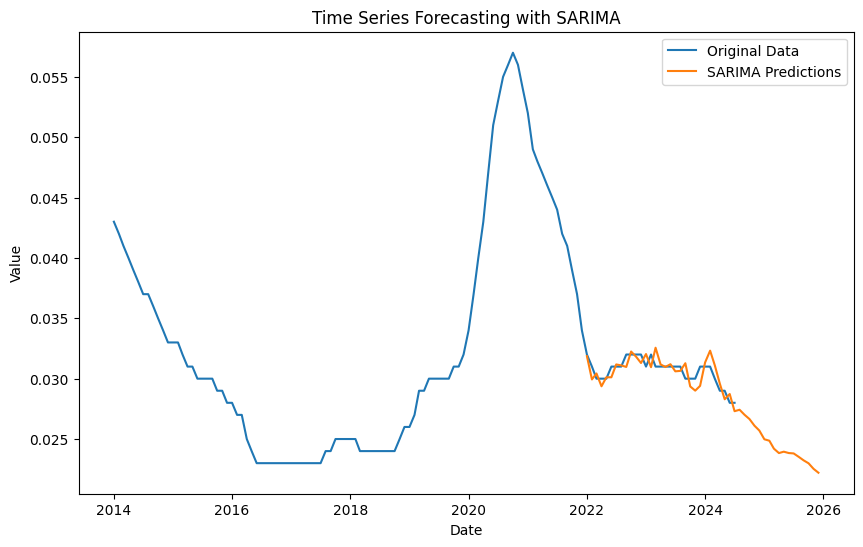

SARIMA - MSE: 6.410130391249079e-07, RMSE: 0.0008006328991022714, MAPE: 2.15%


In [524]:
model_sarima(data_filtered,'Iceland', '25+', 'Male')

### 25+, Female

In [525]:
data_filtered = prepare_data(combined_df, country='Iceland', age='25+', sex='Female')

In [526]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9738
Strong seasonality detected.


(0.9738122193325509, True)

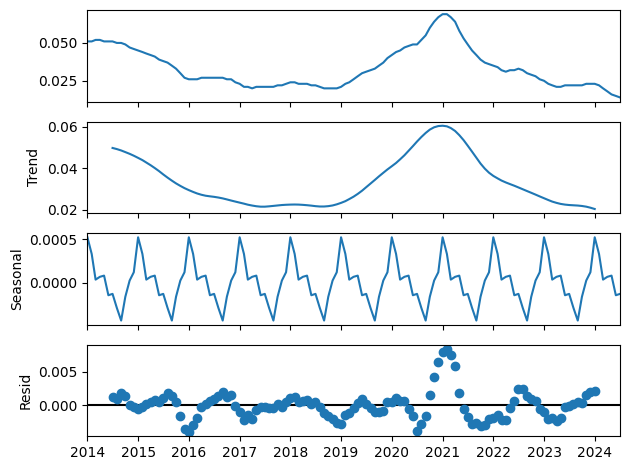

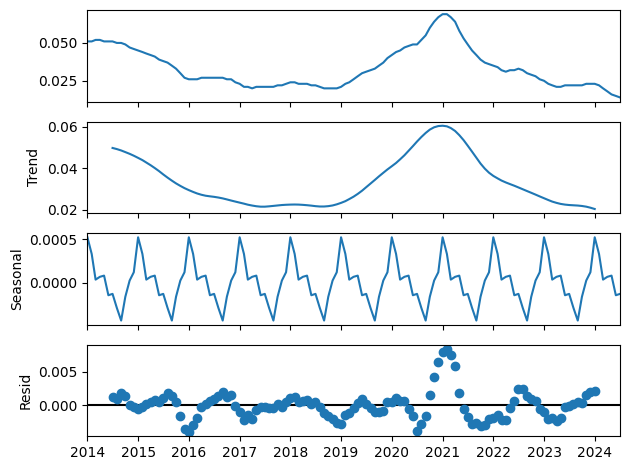

In [527]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1210.372, Time=1.64 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1048.573, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1190.181, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1134.567, Time=0.24 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1167.290, Time=0.16 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1196.507, Time=0.40 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1163.287, Time=0.67 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1185.943, Time=0.11 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1185.731, Time=0.74 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1210.929, Time=0.52 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1167.177, Time=0.07 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1197.521, Time=0.70 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1163.178, Time=0.72 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1186.809, Time=0.44 sec
 ARIM

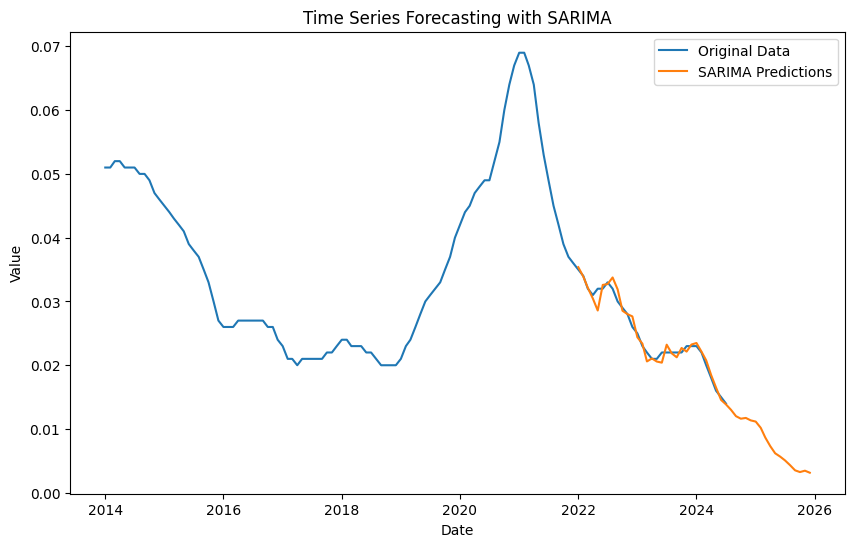

SARIMA - MSE: 1.0753427358109095e-06, RMSE: 0.0010369873363792392, MAPE: 2.97%


In [528]:
model_sarima(data_filtered,'Iceland', '25+', 'Female')

### 25+, Total

In [529]:
data_filtered = prepare_data(combined_df, country='Iceland', age='25+', sex='Total')

In [530]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9857
Strong seasonality detected.


(0.9856988512271608, True)

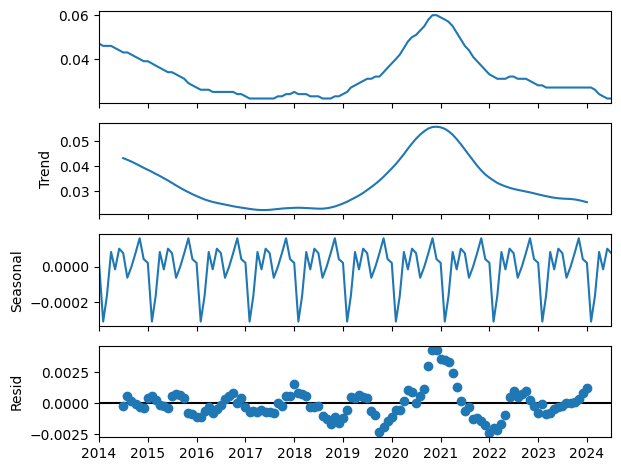

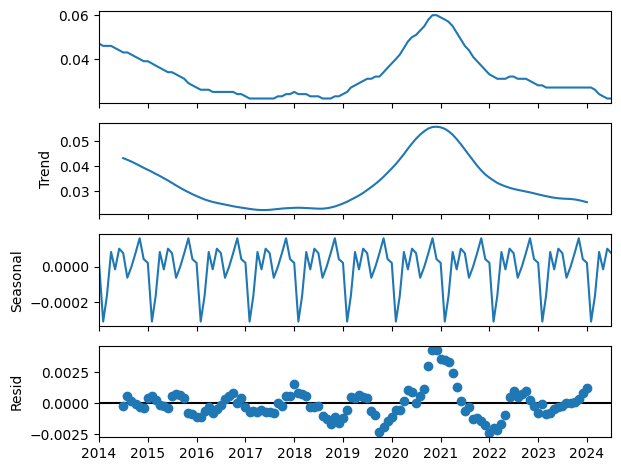

In [531]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1278.301, Time=0.94 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1118.047, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1263.937, Time=0.28 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1199.058, Time=0.27 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1244.302, Time=0.13 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1265.725, Time=0.41 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1240.301, Time=0.26 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1267.449, Time=0.31 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1263.316, Time=0.68 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1275.004, Time=0.32 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1279.133, Time=1.04 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1243.918, Time=0.52 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1266.966, Time=0.54 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1239.919, Time=1.13 sec
 ARIM

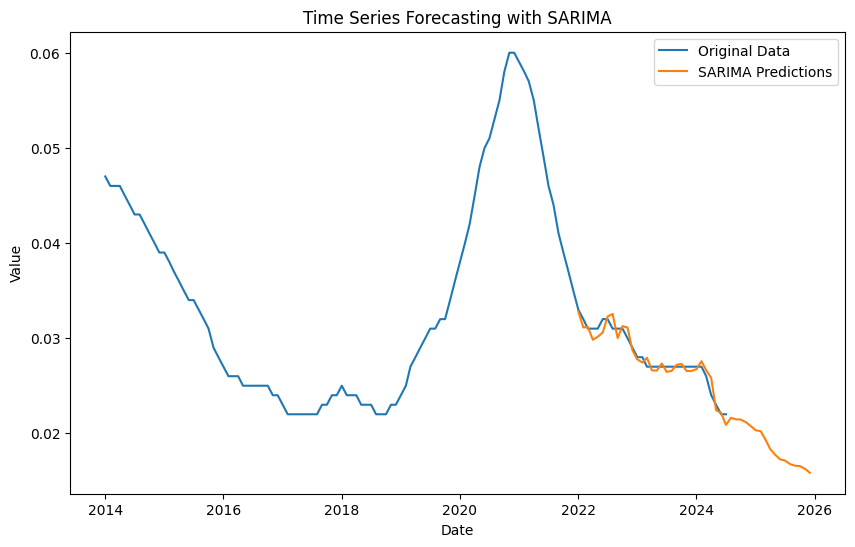

SARIMA - MSE: 5.617796133687642e-07, RMSE: 0.0007495195883822945, MAPE: 2.16%


In [532]:
model_sarima(data_filtered,'Iceland', '25+', 'Total')

## Greece

### 15-24, Female

In [533]:
data_filtered = prepare_data(combined_df, country='Greece', age='15-24', sex='Female')

In [534]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7946
Strong seasonality detected.


(0.7946129418391116, True)

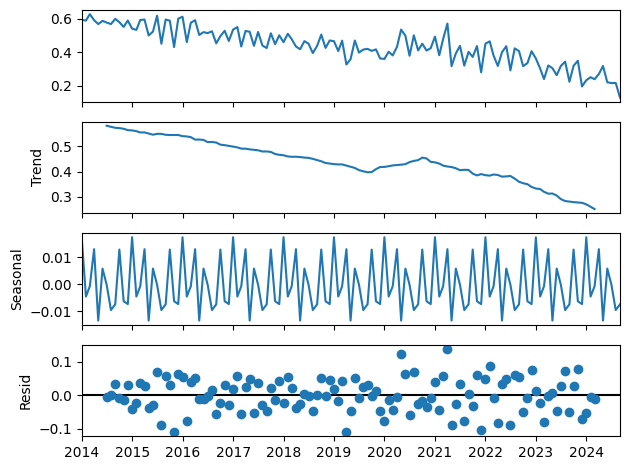

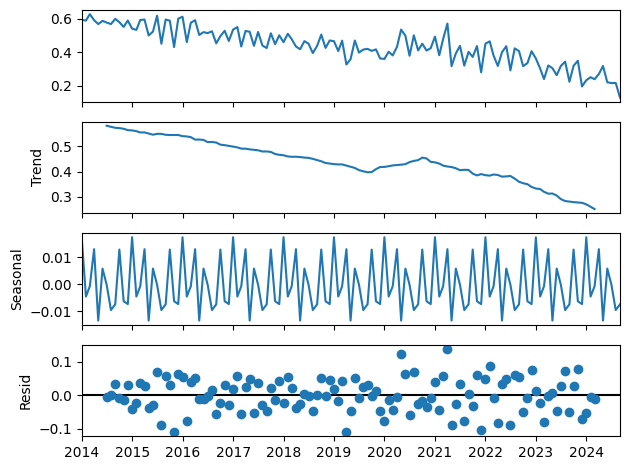

In [535]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.90 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-160.273, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-235.484, Time=0.39 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-187.091, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-252.718, Time=0.31 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-259.476, Time=0.77 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-260.133, Time=0.34 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.04 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-261.557, Time=0.37 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-234.346, Time=0.29 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=inf, Time=0.95 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-306.816, Time=0.65 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=i

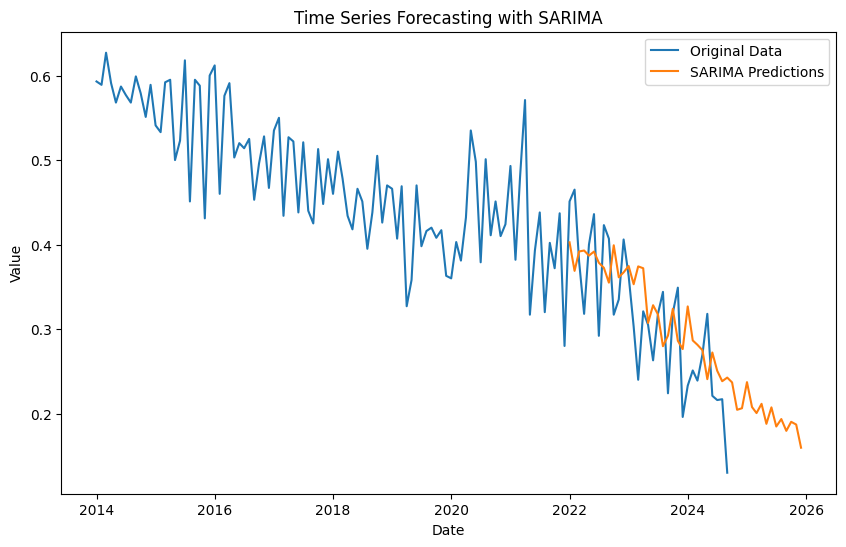

SARIMA - MSE: 0.003612498649939756, RMSE: 0.06010406516983486, MAPE: 17.26%


In [536]:
model_sarima(data_filtered,'Greece', '15-24', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.88 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-152.697, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-199.536, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.40 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-154.694, Time=0.02 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-306.604, Time=0.15 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-333.858, Time=0.16 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-379.192, Time=0.45 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-382.091, Time=0.36 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.24 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-373.510, Time=0.29 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.39 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.38 sec
 A

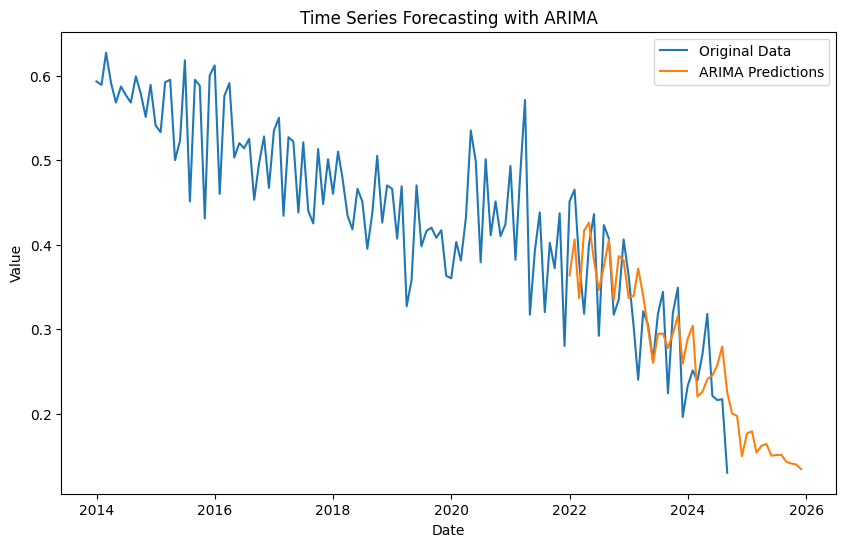

ARIMA - MSE: 0.0027118497474579476, RMSE: 0.05207542364165603, MAPE: 14.43%


In [537]:
model_arima(data_filtered,'Greece', '15-24', 'Female')

### 15-24, Male

In [538]:
data_filtered = prepare_data(combined_df, country='Greece', age='15-24', sex='Male')

In [539]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.8994
Strong seasonality detected.


(0.8993739750634893, True)

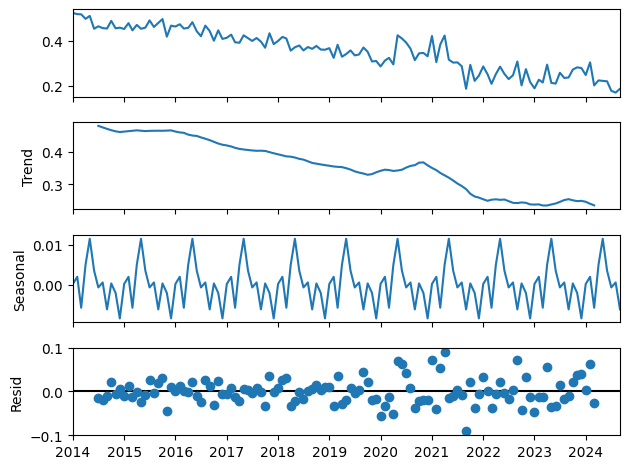

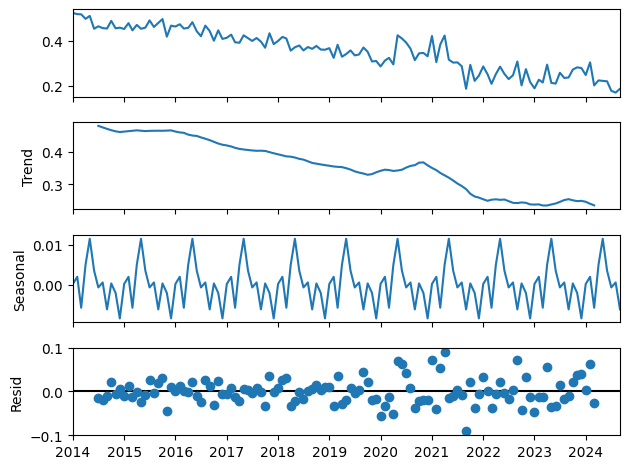

In [540]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.99 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-308.747, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-378.287, Time=0.58 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-334.778, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-382.606, Time=0.81 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.13 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-352.135, Time=0.15 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-400.836, Time=0.40 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-391.909, Time=0.20 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=1.02 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=0.58 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=-398.966, Time=0.80 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-398.9

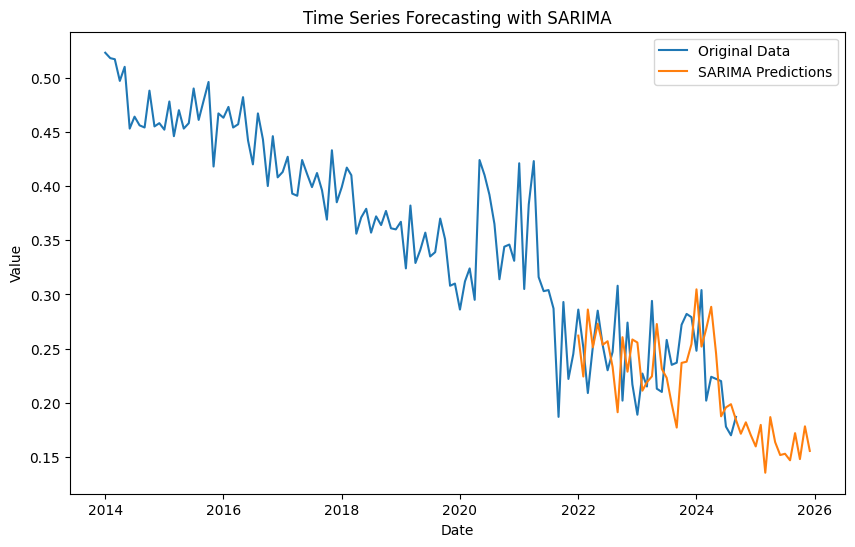

SARIMA - MSE: 0.002288796801954589, RMSE: 0.04784137123823469, MAPE: 16.83%


In [541]:
model_sarima(data_filtered,'Greece', '15-24', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.65 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-303.878, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-372.996, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.49 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-305.877, Time=0.03 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-435.662, Time=0.21 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-453.051, Time=0.15 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-478.797, Time=0.23 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.34 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-480.854, Time=0.25 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-480.976, Time=0.21 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.30 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.21 sec
 A

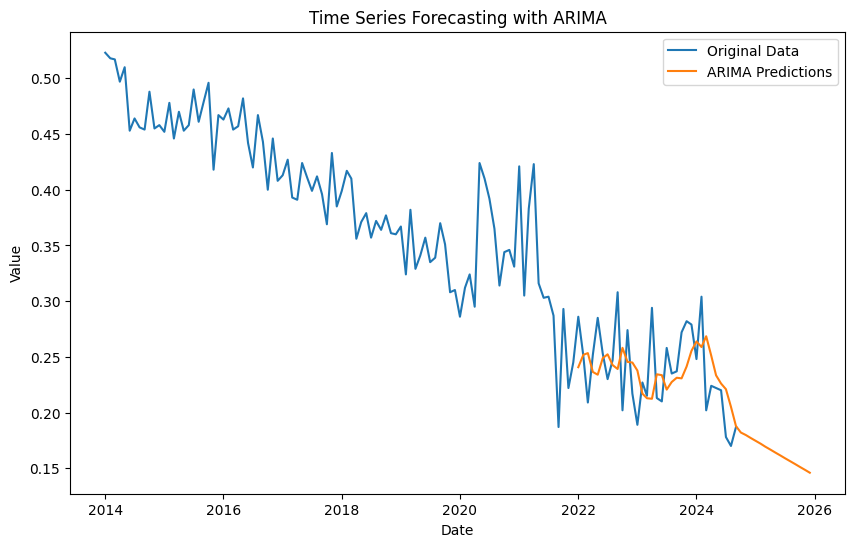

ARIMA - MSE: 0.0013357377593430685, RMSE: 0.03654774629635962, MAPE: 12.02%


In [542]:
model_arima(data_filtered,'Greece', '15-24', 'Male')

### 15-24, Total

In [543]:
data_filtered = prepare_data(combined_df, country='Greece', age='15-24', sex='Total')

In [544]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.8878
Strong seasonality detected.


(0.8877832829807306, True)

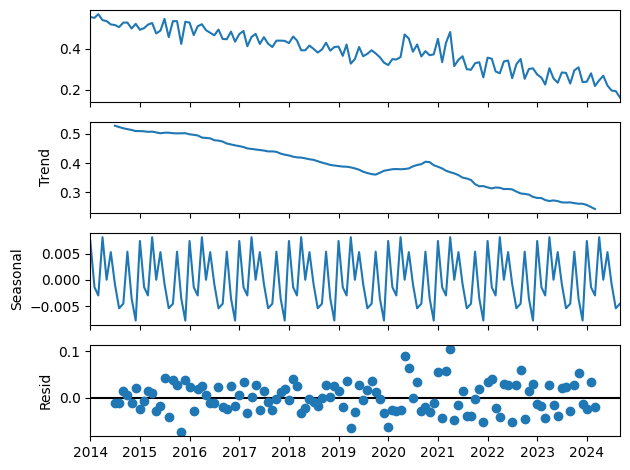

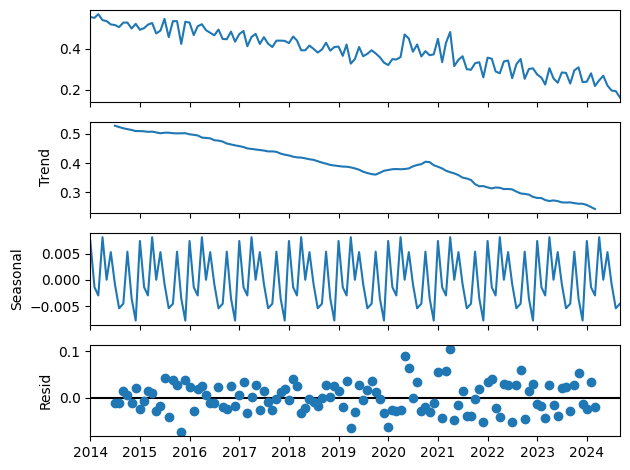

In [545]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.86 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-269.728, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-343.133, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-287.780, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-354.877, Time=0.28 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-365.910, Time=1.39 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-367.808, Time=0.47 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.48 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-366.501, Time=2.19 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-368.115, Time=0.40 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-343.610, Time=0.27 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=inf, Time=0.85 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=1.06 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-

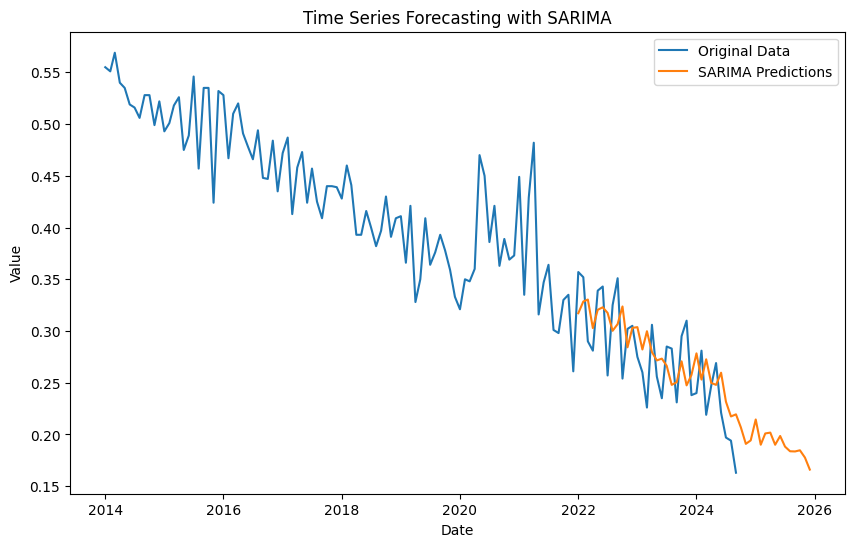

SARIMA - MSE: 0.0013167974716800062, RMSE: 0.03628770413900563, MAPE: 11.74%


In [546]:
model_sarima(data_filtered,'Greece', '15-24', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.95 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-280.350, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-320.545, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-282.350, Time=0.02 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-441.587, Time=0.17 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-457.478, Time=0.14 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-484.908, Time=0.22 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-491.208, Time=0.23 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.23 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-499.071, Time=0.36 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-495.501, Time=0.23 sec
 ARIMA(3,2,2)(0,0,0)[0]             : AIC=inf, Time=0.46 s

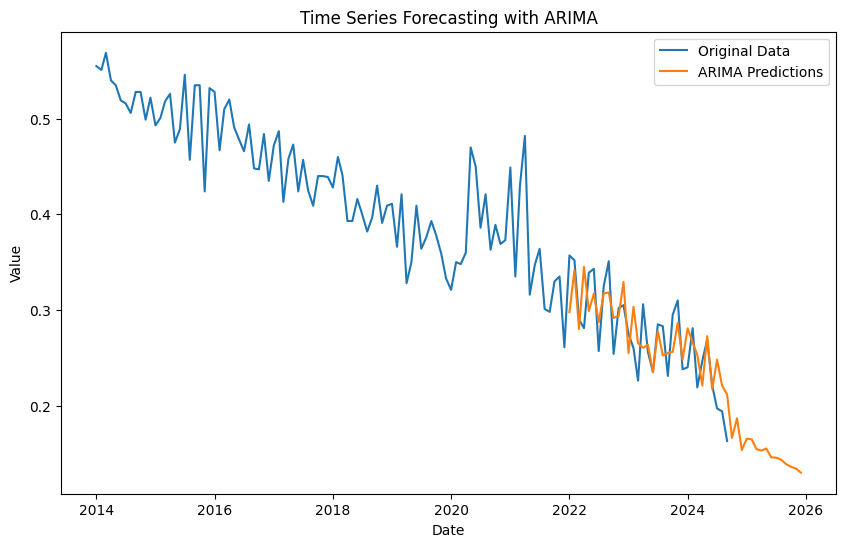

ARIMA - MSE: 0.000921714261375827, RMSE: 0.030359747386561487, MAPE: 9.11%


In [547]:
model_arima(data_filtered,'Greece', '15-24', 'Total')

### 25+, Female

In [548]:
data_filtered = prepare_data(combined_df, country='Greece', age='25+', sex='Female')

In [549]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9852
Strong seasonality detected.


(0.9851782174746432, True)

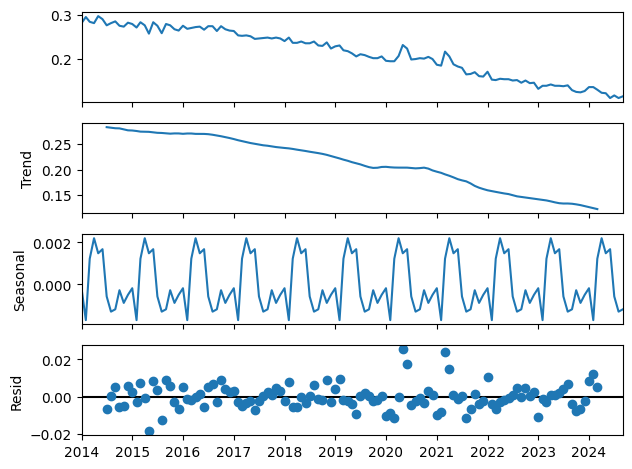

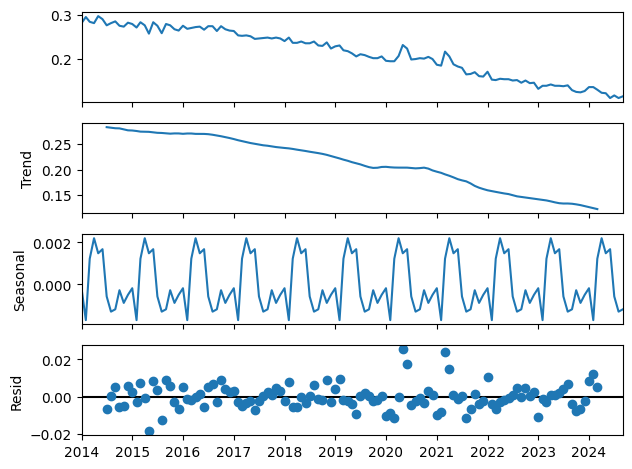

In [550]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-751.413, Time=2.18 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-661.162, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-708.555, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.58 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-685.172, Time=0.18 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-752.194, Time=0.64 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-727.928, Time=0.37 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-746.348, Time=1.13 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=0.60 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=1.26 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-734.986, Time=0.77 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=inf, Time=1.78 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-750.667, Time=0.79 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-734.202, Time=0.41 sec
 ARIMA(2,1,1)(1,1,1)[12]             : 

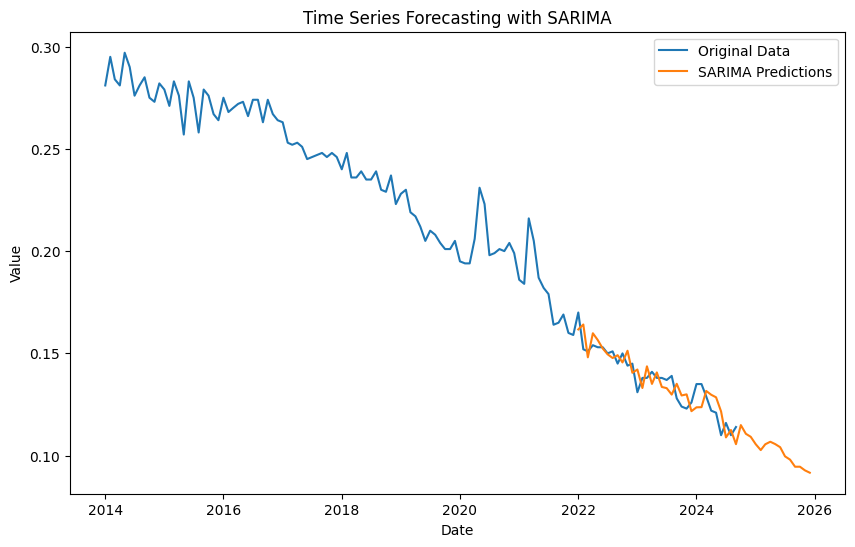

SARIMA - MSE: 4.649898698059936e-05, RMSE: 0.006819016569902097, MAPE: 4.45%


In [551]:
model_sarima(data_filtered,'Greece', '25+', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-821.073, Time=0.75 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-725.455, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-750.584, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-825.362, Time=0.13 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-727.451, Time=0.02 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=-827.330, Time=0.13 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=inf, Time=0.26 sec
 ARIMA(0,2,2)(0,0,0)[0]             : AIC=-857.107, Time=0.19 sec
 ARIMA(1,2,2)(0,0,0)[0]             : AIC=inf, Time=0.34 sec
 ARIMA(0,2,3)(0,0,0)[0]             : AIC=-856.040, Time=0.18 sec
 ARIMA(1,2,3)(0,0,0)[0]             : AIC=-862.691, Time=0.28 sec
 ARIMA(2,2,3)(0,0,0)[0]             : AIC=inf, Time=0.40 sec
 ARIMA(2,2,2)(0,0,0)[0]             : AIC=-864.166, Time=0

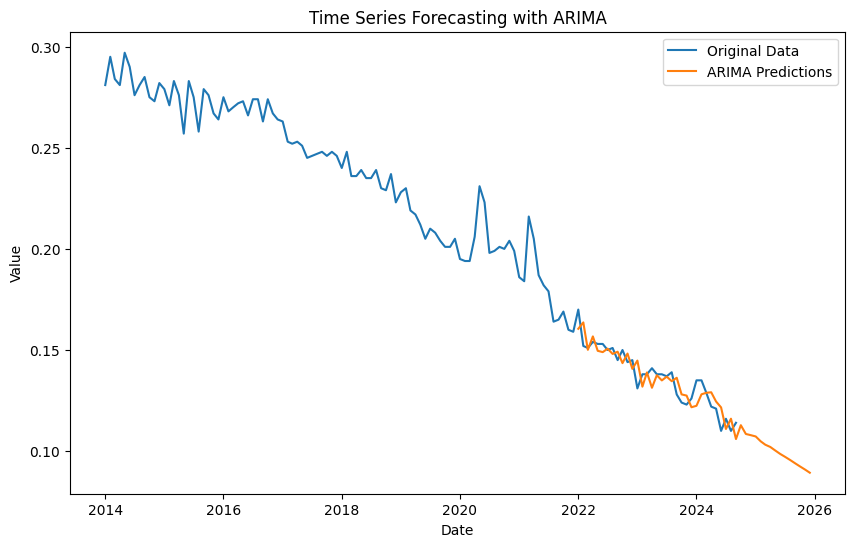

ARIMA - MSE: 4.148146880253912e-05, RMSE: 0.006440610902898818, MAPE: 3.83%


In [552]:
model_arima(data_filtered,'Greece', '25+', 'Female')

### 25+, Male

In [553]:
data_filtered = prepare_data(combined_df, country='Greece', age='25+', sex='Male')

In [554]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9909
Strong seasonality detected.


(0.9908675588009553, True)

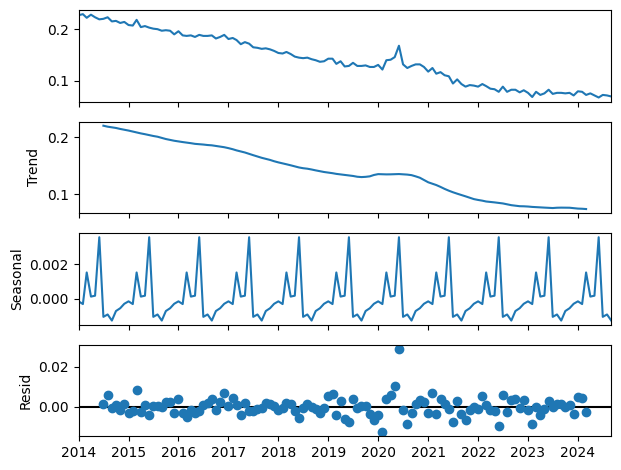

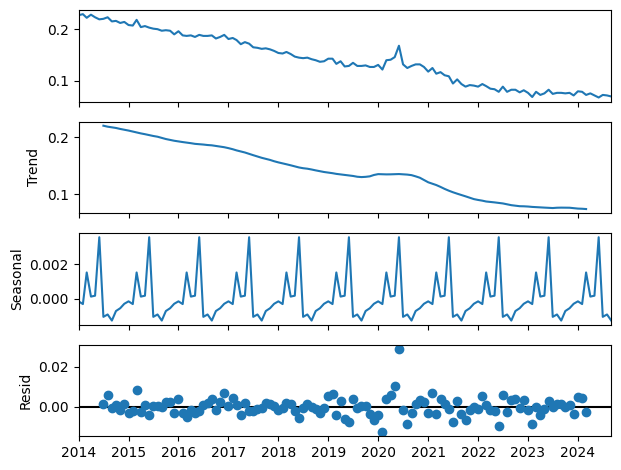

In [555]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.04 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-725.298, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-778.383, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.44 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-744.424, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-812.995, Time=1.75 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-814.970, Time=1.61 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-816.047, Time=0.27 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.21 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=3.17 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=0.78 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-830.134, Time=2.26 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=1.23 sec
 ARIMA(2,1,0)(2,1,2)[12]             : AIC=inf, Time=2.01 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=-830.064, T

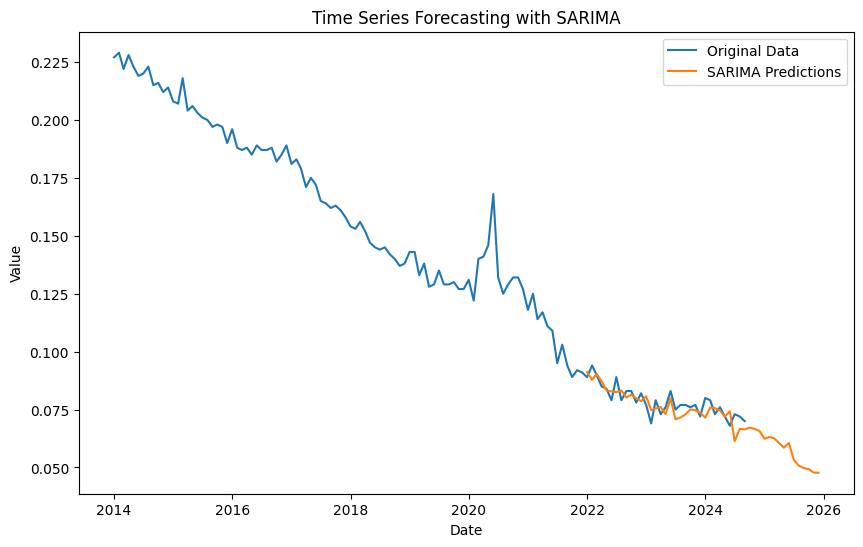

SARIMA - MSE: 1.4573247874121903e-05, RMSE: 0.00381749235416679, MAPE: 4.18%


In [556]:
model_sarima(data_filtered,'Greece', '25+', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-916.144, Time=0.72 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-786.852, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-848.507, Time=0.08 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-788.851, Time=0.01 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-906.735, Time=0.18 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-908.074, Time=0.30 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-919.782, Time=0.14 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-929.058, Time=0.09 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-925.774, Time=0.15 sec
 ARIMA(0,2,3)(0,0,0)[0]             : AIC=-930.999, Time=0.05 sec
 ARIMA(0,2,2)(0,0,0)[0]             : AIC=-937.200, Time=0.11 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=inf, Time=1.28 sec
 ARIMA(1,2,2)(0,0,0)[0]             : AIC=-922.947, Time=0.43 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=i

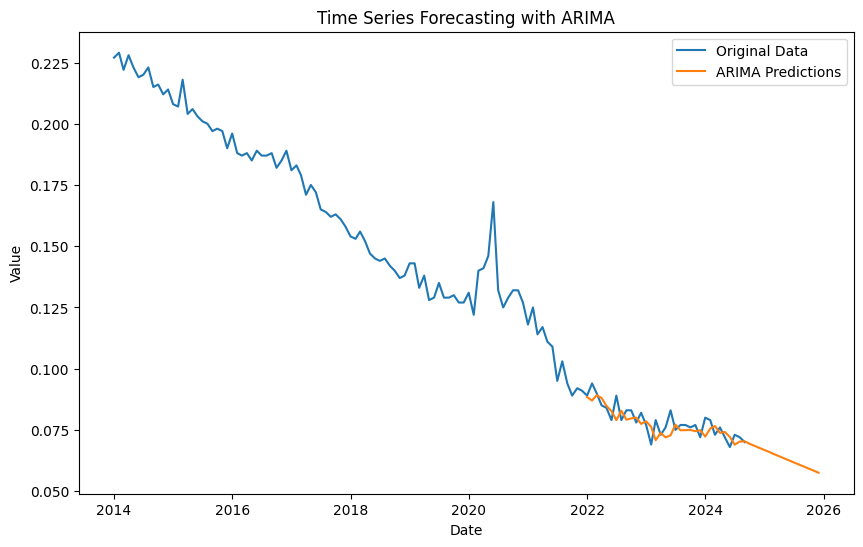

ARIMA - MSE: 2.0778329651870183e-05, RMSE: 0.004558325312202956, MAPE: 4.68%


In [557]:
model_arima(data_filtered,'Greece', '25+', 'Male')

### 25+, Total

In [558]:
data_filtered = prepare_data(combined_df, country='Greece', age='25+', sex='Total')

In [559]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9922
Strong seasonality detected.


(0.992198902478935, True)

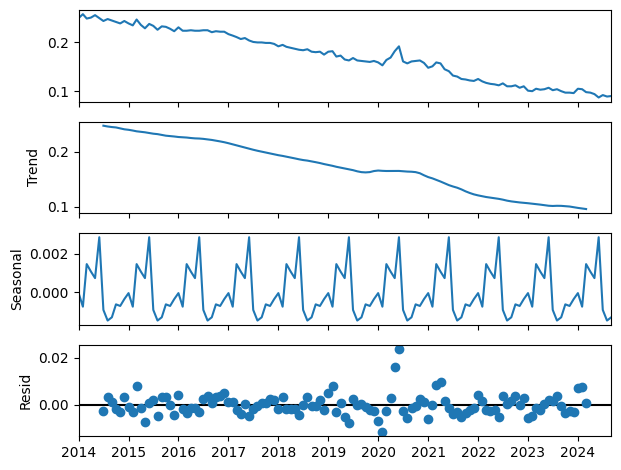

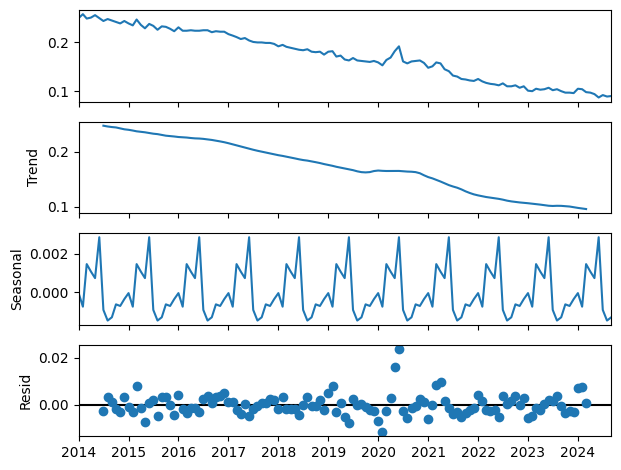

In [560]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.15 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-762.978, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-803.113, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-841.705, Time=0.26 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-771.624, Time=0.09 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-841.378, Time=0.63 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=0.67 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-805.767, Time=0.29 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.32 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=inf, Time=0.69 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-836.111, Time=0.23 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-849.419, Time=0.71 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-779.599, Time=0.13 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-

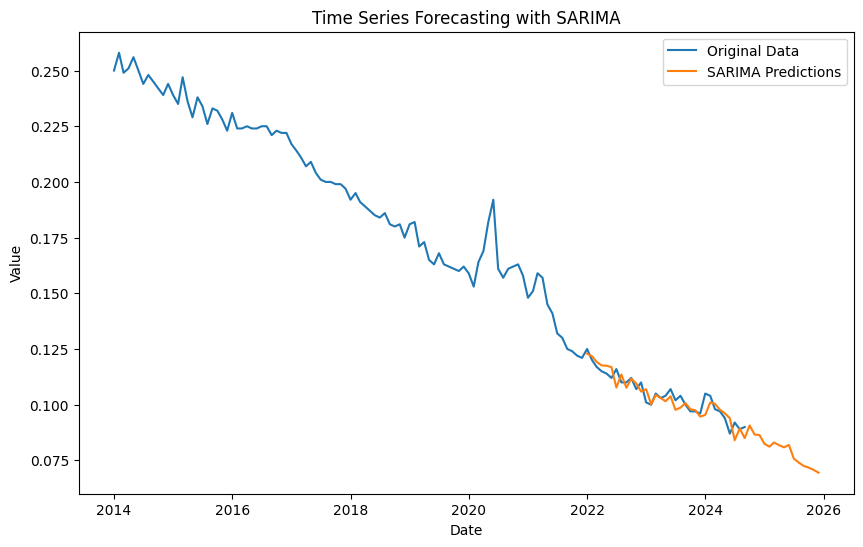

SARIMA - MSE: 1.4292484084168258e-05, RMSE: 0.0037805401841758354, MAPE: 2.81%


In [561]:
model_sarima(data_filtered,'Greece', '25+', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-937.223, Time=1.17 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-849.313, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-877.131, Time=0.06 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-929.154, Time=0.06 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-851.307, Time=0.03 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-946.564, Time=0.24 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-918.929, Time=0.06 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-933.459, Time=0.32 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-947.932, Time=0.69 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-949.251, Time=0.26 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-952.301, Time=0.23 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-955.422, Time=0.31 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-956.367, Time=0.31 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : 

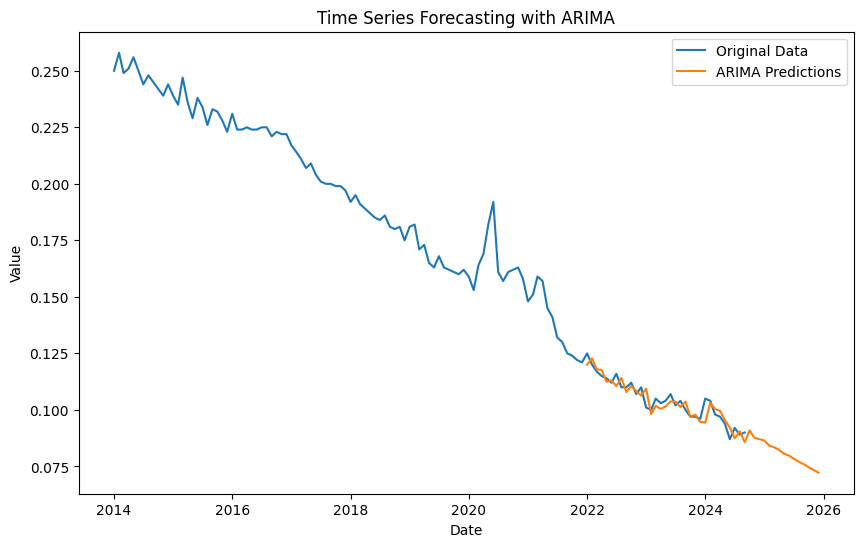

ARIMA - MSE: 1.3356930813101607e-05, RMSE: 0.003654713506295891, MAPE: 2.76%


In [562]:
model_arima(data_filtered,'Greece', '25+', 'Total')

# Spain

### 15-24, Female

In [563]:
data_filtered = prepare_data(combined_df, country='Spain', age='15-24', sex='Female')

In [564]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9709
Strong seasonality detected.


(0.9708672509726848, True)

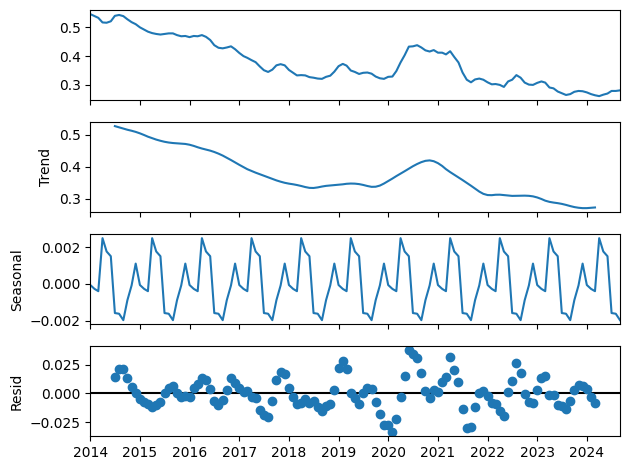

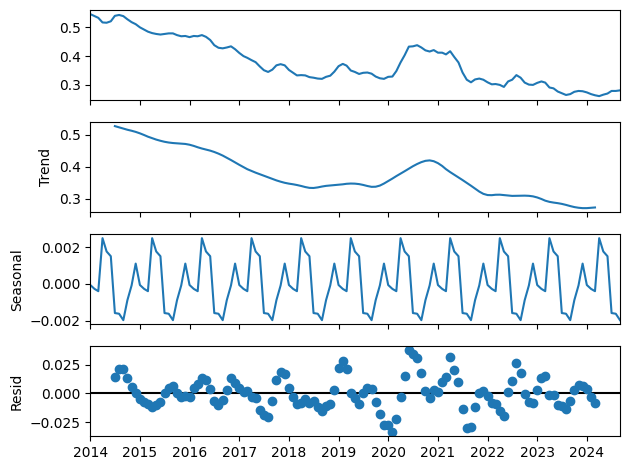

In [565]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.44 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-627.468, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-709.661, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.45 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-682.491, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-715.254, Time=0.51 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-711.131, Time=1.05 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.71 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-671.571, Time=0.40 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-714.386, Time=0.47 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-713.942, Time=0.95 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-701.155, Time=0.52 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-711.125, Time=0.94 sec
 ARIMA(1,1,0)(2,1,0)[12] intercept   : AIC=-713.325, Time=0.56 sec

Best model:  ARIMA(1,1,0)(2,1,0)[

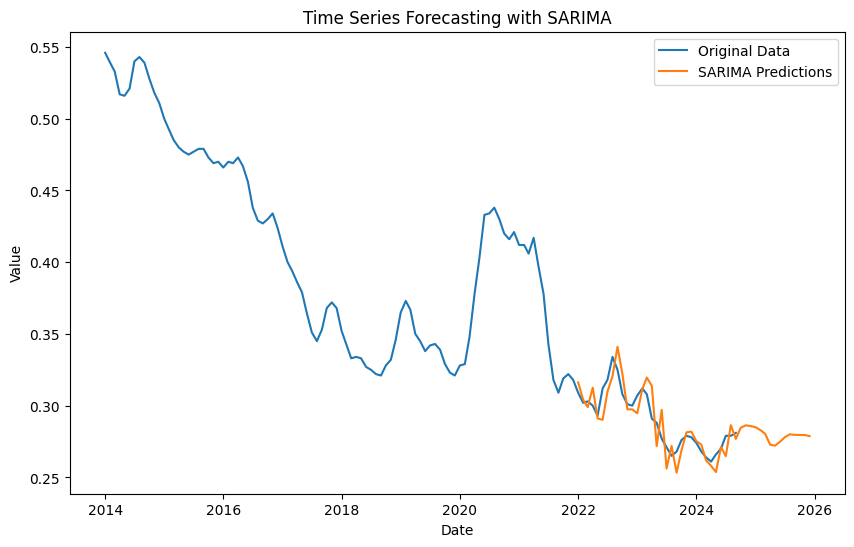

SARIMA - MSE: 0.00012229461370157245, RMSE: 0.011058689511039383, MAPE: 3.03%


In [566]:
model_sarima(data_filtered,'Spain', '15-24', 'Female')

### 15-24, Male

In [567]:
data_filtered = prepare_data(combined_df, country='Spain', age='15-24', sex='Male')

In [568]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9881
Strong seasonality detected.


(0.9881290159075603, True)

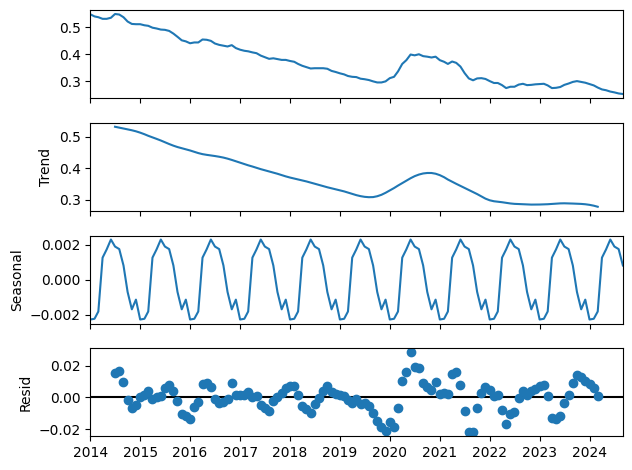

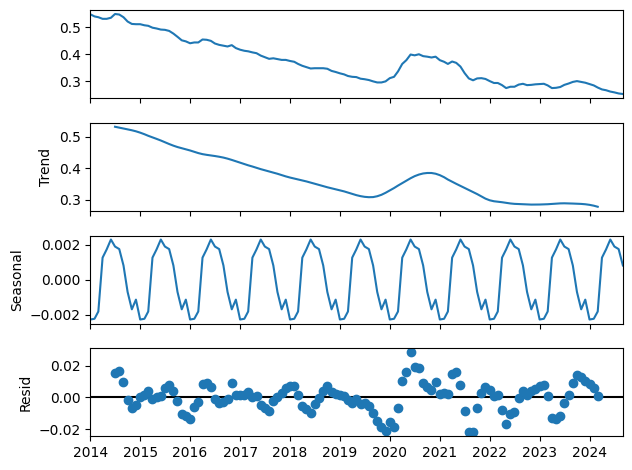

In [569]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.97 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-721.011, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-786.476, Time=0.24 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.64 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-763.124, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-794.333, Time=0.54 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-791.479, Time=1.95 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-791.480, Time=0.07 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-755.933, Time=0.23 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-793.455, Time=1.58 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-792.755, Time=1.45 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-780.556, Time=0.76 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-793.138, Time=1.38 sec
 ARIMA(1,1,0)(2,1,0)[12] intercept   : AIC=-793.056, Time=1.10 sec

Best model:  ARIMA(1,1,0)(2,

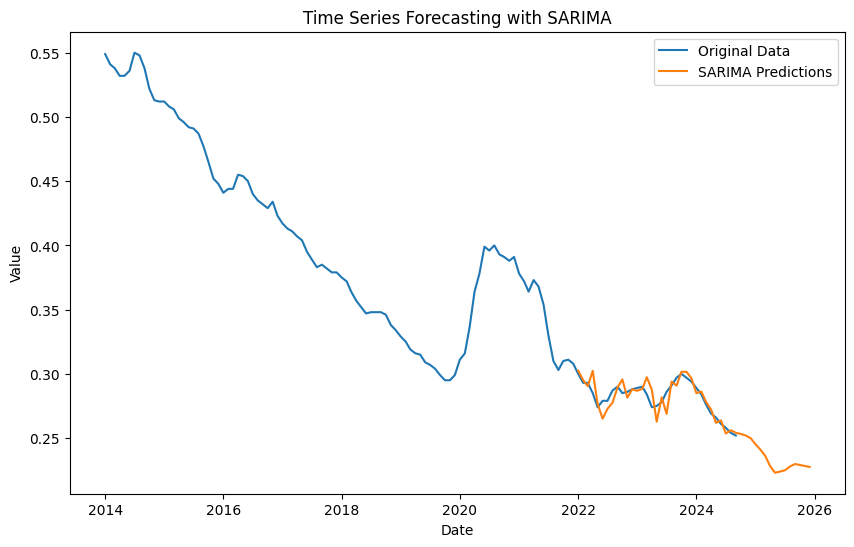

SARIMA - MSE: 5.840278225882044e-05, RMSE: 0.007642171305252221, MAPE: 2.04%


In [570]:
model_sarima(data_filtered,'Spain', '15-24', 'Male')

### 15-24, Total

In [571]:
data_filtered = prepare_data(combined_df, country='Spain', age='15-24', sex='Total')

In [572]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9841
Strong seasonality detected.


(0.9841243763892986, True)

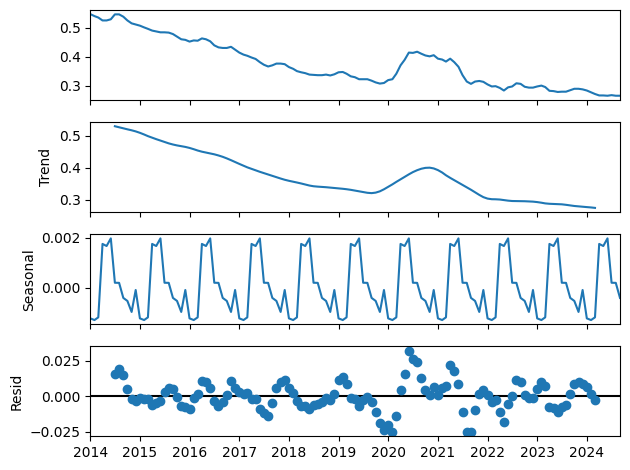

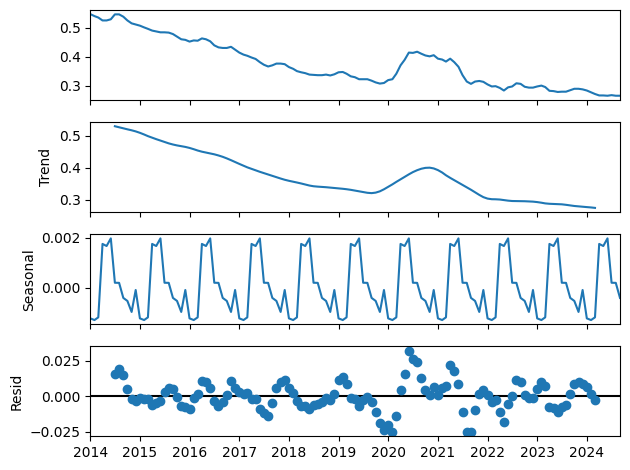

In [573]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-790.597, Time=1.03 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-693.396, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-763.057, Time=0.21 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-775.151, Time=0.40 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-739.582, Time=0.05 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=0.85 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=0.78 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-761.241, Time=0.64 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-785.818, Time=0.82 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=1.20 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=inf, Time=0.67 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-804.020, Time=2.37 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-753.691, Time=0.07 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-804.290, Time=1.26 sec
 ARIMA(1,1,2)(1,1,0)[12]             : 

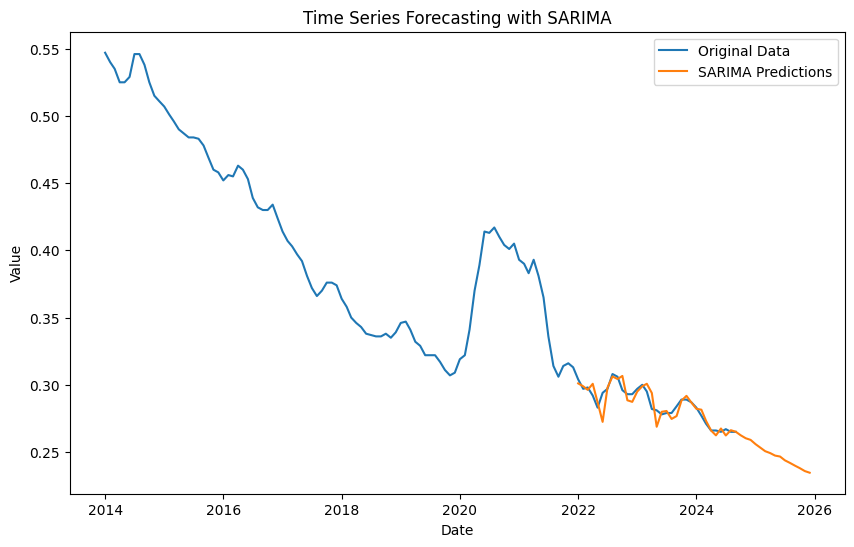

SARIMA - MSE: 4.015778550753096e-05, RMSE: 0.00633701708278674, MAPE: 1.52%


In [574]:
model_sarima(data_filtered,'Spain', '15-24', 'Total')

### 25+, Male

In [575]:
data_filtered = prepare_data(combined_df, country='Spain', age='25+', sex='Male')

In [576]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9942
Strong seasonality detected.


(0.9941591319475841, True)

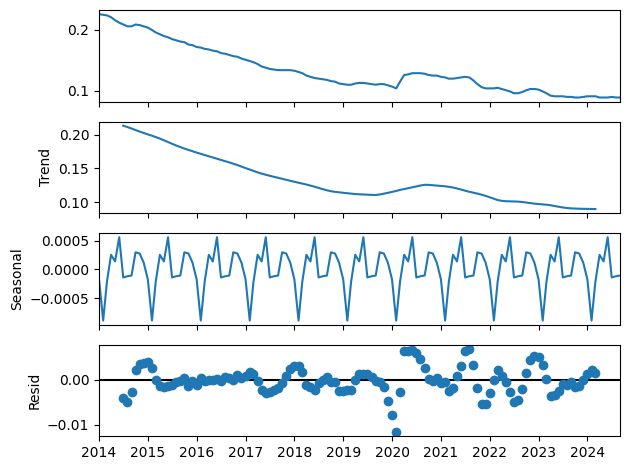

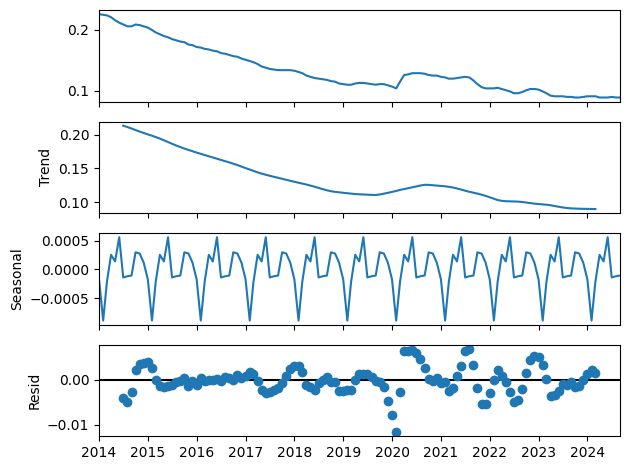

In [577]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1083.325, Time=2.04 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1008.896, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1065.771, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1080.418, Time=0.30 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1041.541, Time=0.22 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1073.917, Time=0.22 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1037.541, Time=0.73 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1067.471, Time=0.15 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.92 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1082.211, Time=0.26 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1081.725, Time=0.40 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1081.663, Time=0.52 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1043.474, Time=0.18 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1083.141, Time=0.49 sec
 ARIMA(2,1,

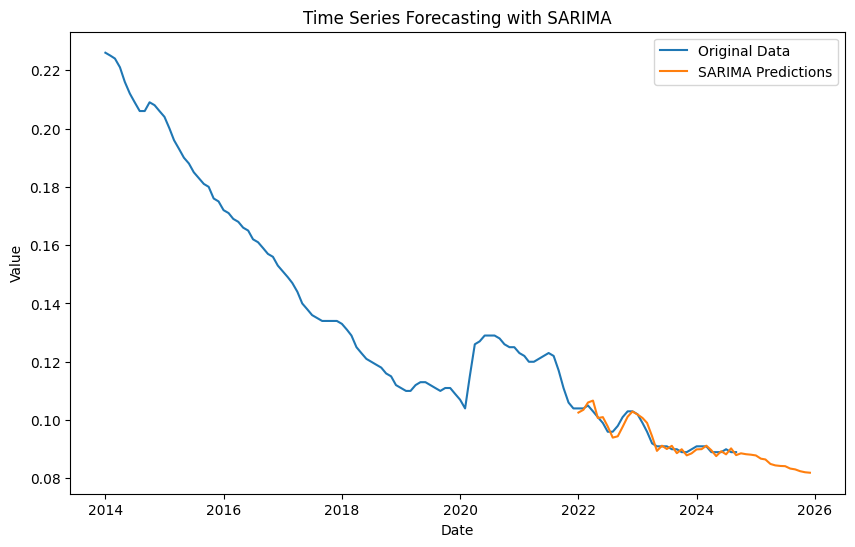

SARIMA - MSE: 2.9640421858850867e-06, RMSE: 0.0017216393890374044, MAPE: 1.46%


In [578]:
model_sarima(data_filtered,'Spain', '25+', 'Male')

### 25+, Female

In [579]:
data_filtered = prepare_data(combined_df, country='Spain', age='25+', sex='Female')

In [580]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9953
Strong seasonality detected.


(0.9952539764495535, True)

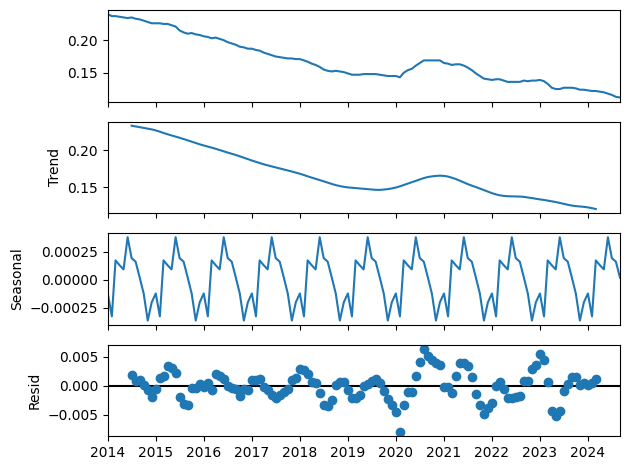

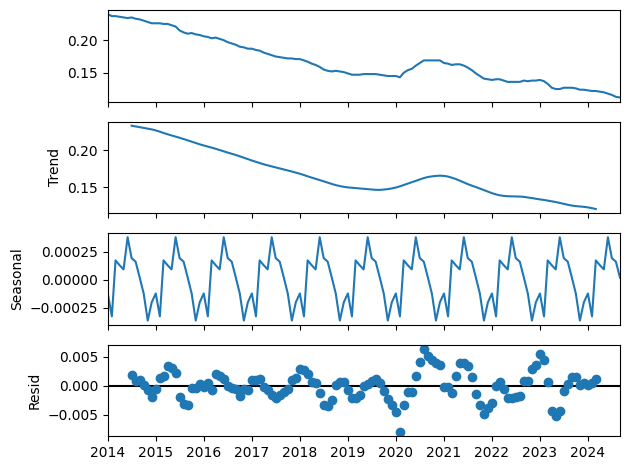

In [581]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1112.186, Time=0.94 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1026.865, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1090.382, Time=0.17 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1090.471, Time=0.60 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1065.494, Time=0.16 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1096.356, Time=0.55 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1061.494, Time=1.12 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1090.759, Time=0.28 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=2.15 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1111.877, Time=0.20 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1105.727, Time=0.72 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1114.051, Time=0.29 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-1069.430, Time=0.09 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-1097.668, Time=0.60 sec
 ARIMA(1,1,

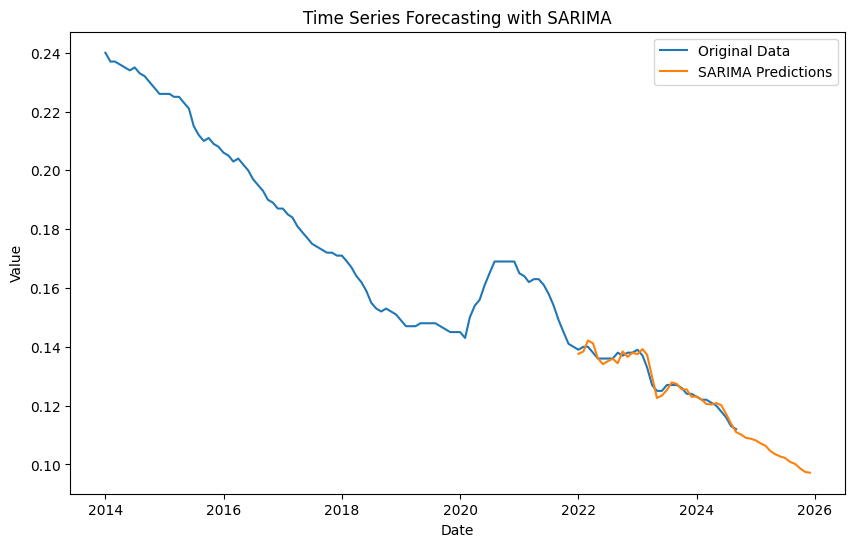

SARIMA - MSE: 3.255058608094217e-06, RMSE: 0.0018041780976650328, MAPE: 1.11%


In [582]:
model_sarima(data_filtered,'Spain', '25+', 'Female')

 ### 25+, Total

In [583]:
data_filtered = prepare_data(combined_df, country='Spain', age='25+', sex='Total')

In [584]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9956
Strong seasonality detected.


(0.995639970623257, True)

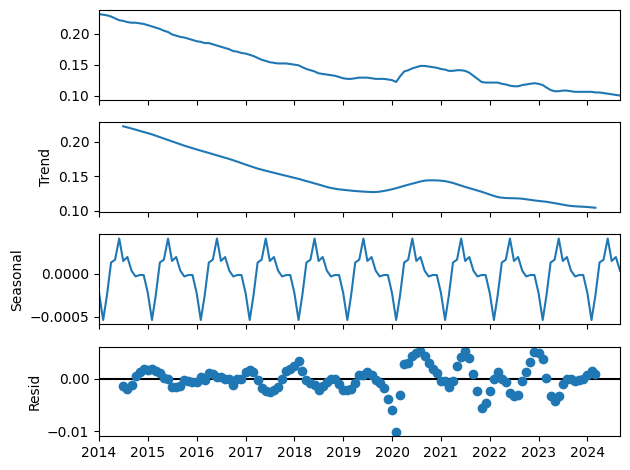

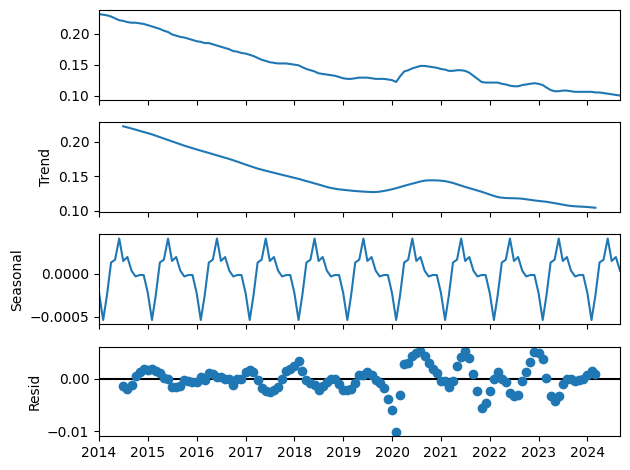

In [585]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1132.727, Time=1.20 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1046.399, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1113.441, Time=1.44 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1123.950, Time=1.59 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1086.284, Time=0.39 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1122.102, Time=0.77 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1082.284, Time=0.49 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1111.692, Time=0.39 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1106.811, Time=1.58 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1134.498, Time=0.62 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1088.223, Time=0.05 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1123.779, Time=0.19 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1084.223, Time=0.24 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1108.523, Time=0.36 sec
 ARIM

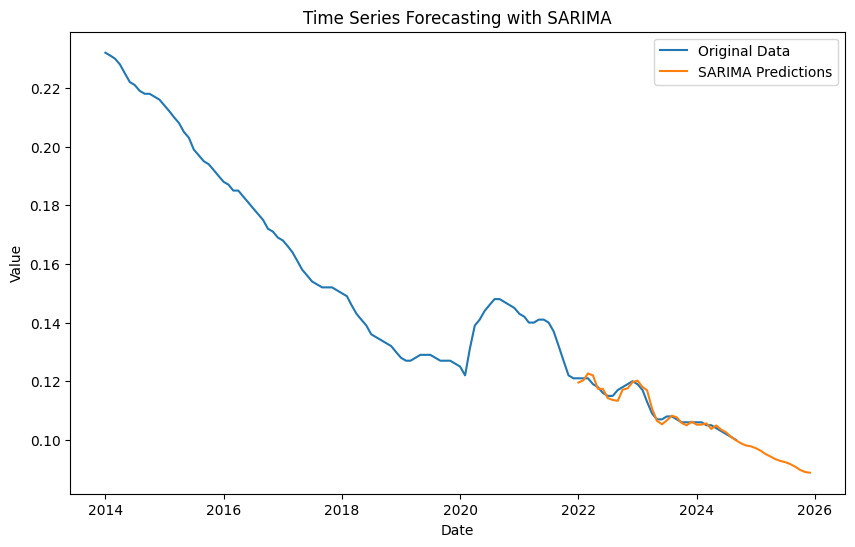

SARIMA - MSE: 2.2261697928432315e-06, RMSE: 0.0014920354529444773, MAPE: 1.05%


In [586]:
model_sarima(data_filtered,'Spain', '25+', 'Total')

# Slovenia

### 15-24, Male

In [587]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='15-24', sex='Male')

In [588]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9005
Strong seasonality detected.


(0.9004514690253576, True)

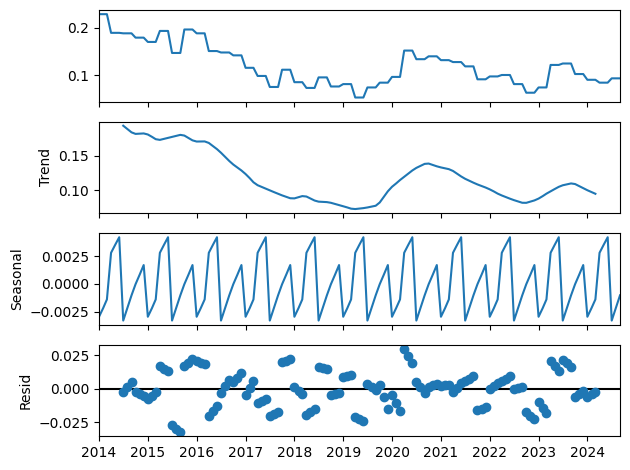

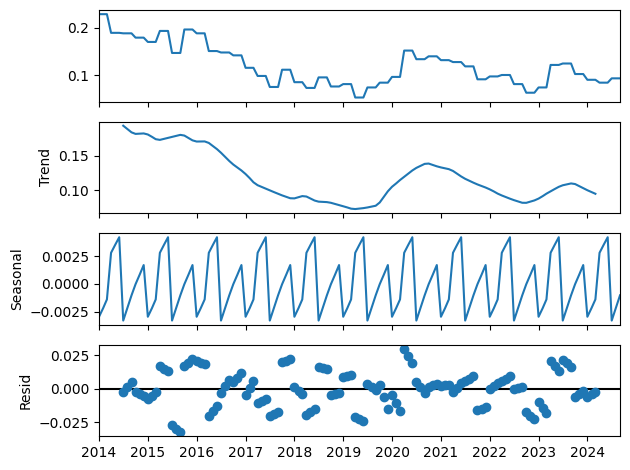

In [589]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-633.442, Time=2.40 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-573.636, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-632.756, Time=0.23 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-635.442, Time=0.35 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-571.636, Time=0.02 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-644.075, Time=0.91 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-632.755, Time=0.11 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=-648.565, Time=0.47 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-645.518, Time=0.58 sec
 ARIMA(0,1,1)(2,1,2)[12]             : AIC=inf, Time=1.54 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-642.166, Time=1.35 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-650.574, Time=0.52 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-646.063, Time=0.26 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-647.519, Time=0.40 sec
 ARIMA(0,1,0)(2,1,2)[12]

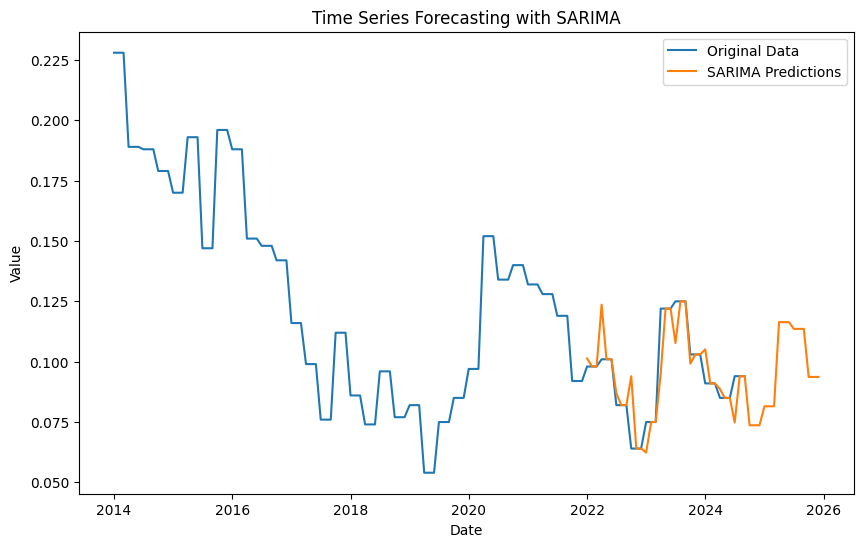

SARIMA - MSE: 9.52356840924417e-05, RMSE: 0.009758877194249433, MAPE: 5.16%


In [590]:
model_sarima(data_filtered,'Slovenia', '15-24', 'Male')

### 15-24, Female

In [591]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='15-24', sex='Female')

In [592]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.8323
Strong seasonality detected.


(0.8322960275578615, True)

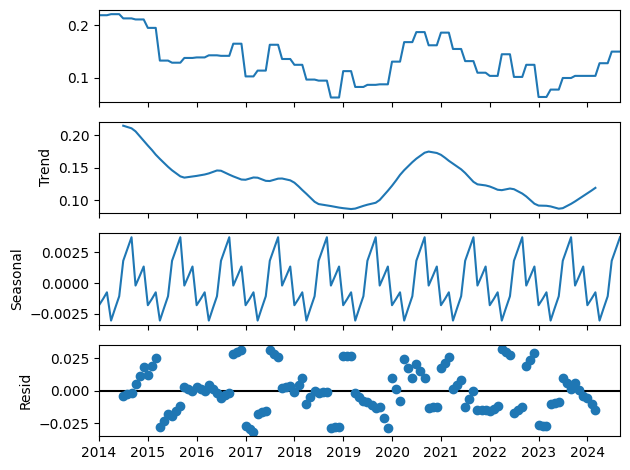

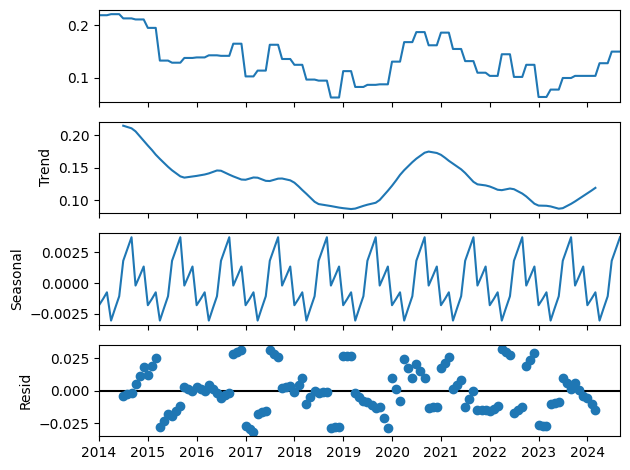

In [593]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.87 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-541.721, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-555.276, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.58 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-539.721, Time=0.08 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-572.055, Time=0.44 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.44 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=2.33 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-574.055, Time=0.41 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-559.426, Time=0.20 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.50 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.72 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-572.055, Time=0.48 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-570.055, Time=0.80 sec
 ARIMA(0,1,0)(2,1,0)[12] intercept   : AIC=-572.3

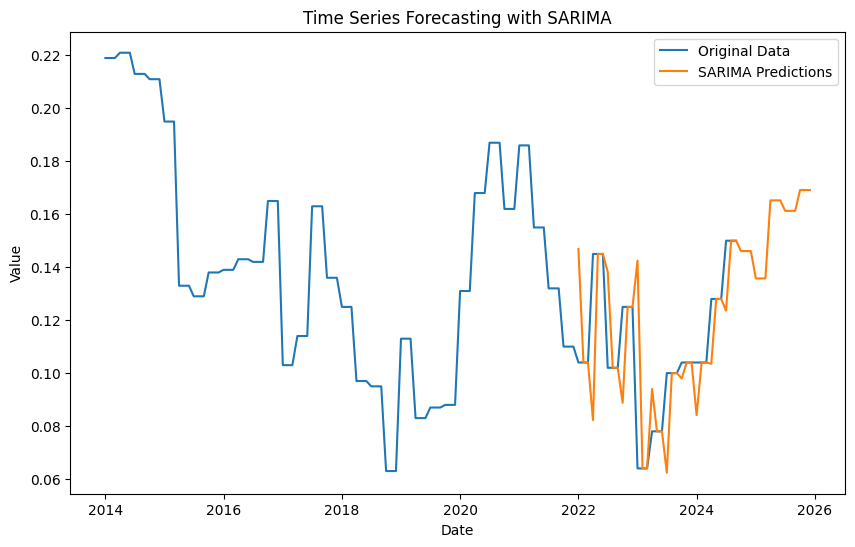

SARIMA - MSE: 0.0005753832088358028, RMSE: 0.023987146742282684, MAPE: 12.46%


In [594]:
model_sarima(data_filtered,'Slovenia', '15-24', 'Female')

### 15-24, Total

In [595]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='15-24', sex='Total')

In [596]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9136
Strong seasonality detected.


(0.9136172349650212, True)

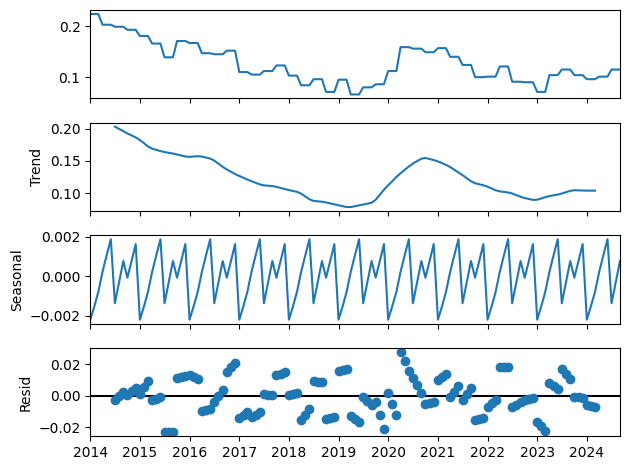

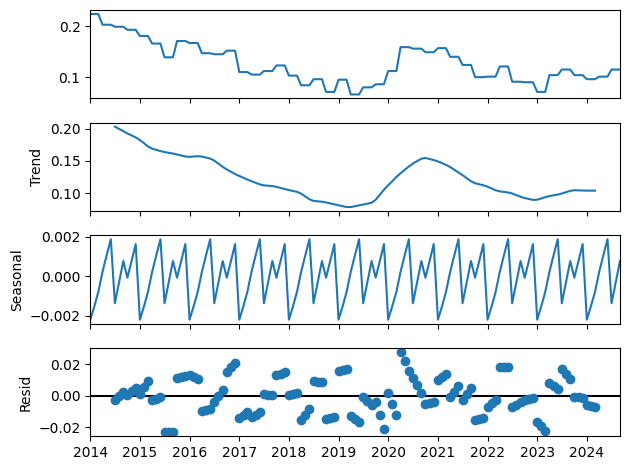

In [597]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-675.084, Time=1.01 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-640.767, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-661.878, Time=0.31 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-677.170, Time=0.30 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-638.767, Time=0.14 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-675.886, Time=0.66 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=0.70 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-661.879, Time=0.21 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=0.94 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-679.137, Time=0.19 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-677.887, Time=0.54 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-663.879, Time=0.10 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-675.879, Time=1.49 sec
 ARIMA(1,1,0)(0,1,1)[12]          

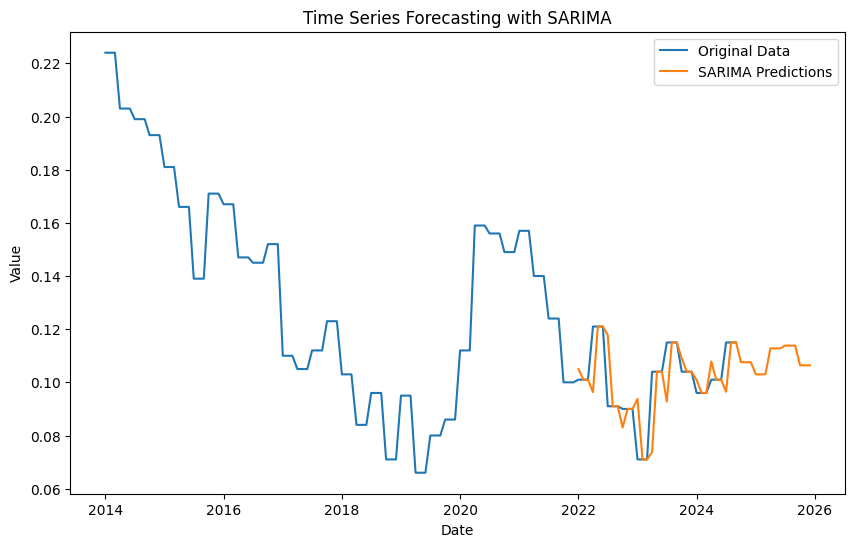

SARIMA - MSE: 0.00011407972570510407, RMSE: 0.010680811097716505, MAPE: 5.30%


In [598]:
model_sarima(data_filtered,'Slovenia', '15-24', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=2.03 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-690.917, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-725.165, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-692.917, Time=0.05 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-733.675, Time=0.09 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-742.058, Time=0.14 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-764.575, Time=0.33 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-763.641, Time=0.68 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-761.498, Time=0.14 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=-769.705, Time=0.23 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=0.11 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-744.043, Time=0.11 sec
 ARIMA(3,2,2)(0,0,0)[0]             : AIC=-767.002, T

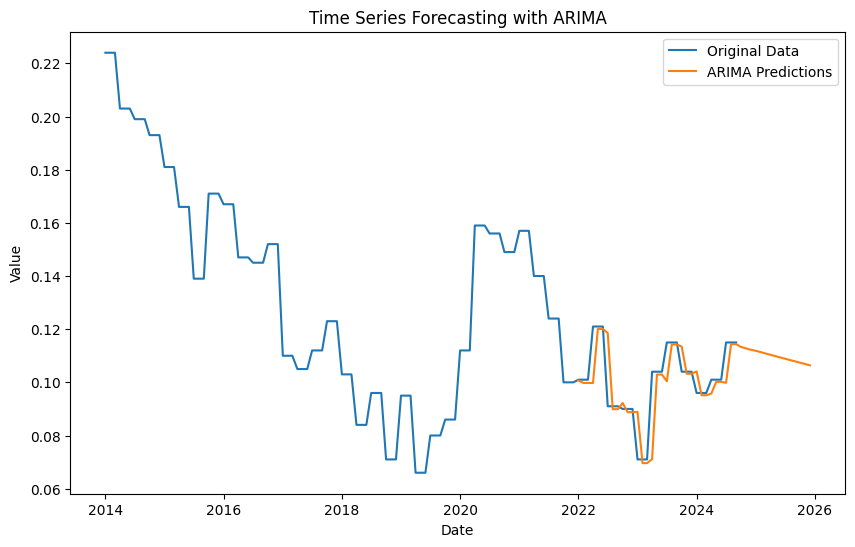

ARIMA - MSE: 0.00010114629136998959, RMSE: 0.010057151255200927, MAPE: 5.47%


In [599]:
model_arima(data_filtered,'Slovenia', '15-24', 'Total')

### 25+, Male

In [600]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='25+', sex='Male')

In [601]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9683
Strong seasonality detected.


(0.9683391424180268, True)

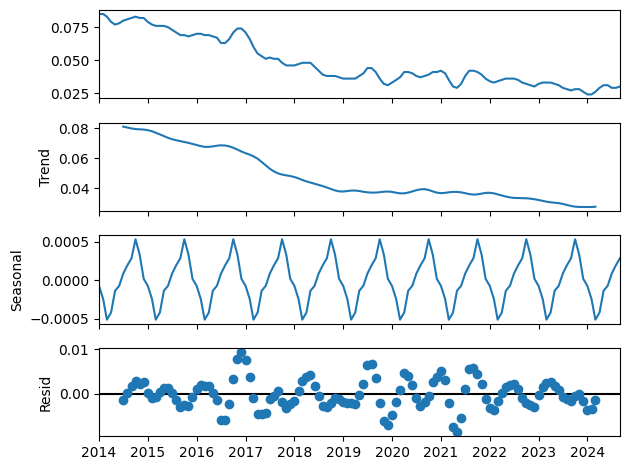

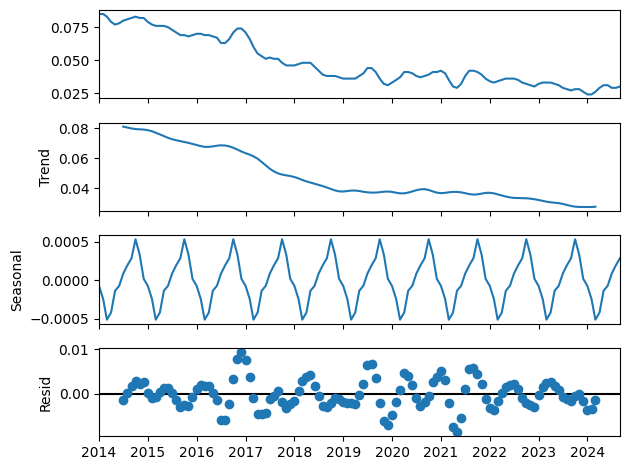

In [602]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1114.341, Time=1.36 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-984.582, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1111.094, Time=0.58 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1083.321, Time=0.79 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1061.257, Time=0.33 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1112.492, Time=1.95 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1112.880, Time=1.07 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1117.453, Time=0.71 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-1118.614, Time=1.71 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-1116.150, Time=0.82 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-1073.375, Time=0.88 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-1112.540, Time=0.96 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-1138.188, Time=1.69 sec
 ARIMA(2,1,1)(1,1,0)[12]             : AIC=-1132.950, Time=2.11 sec
 ARIMA

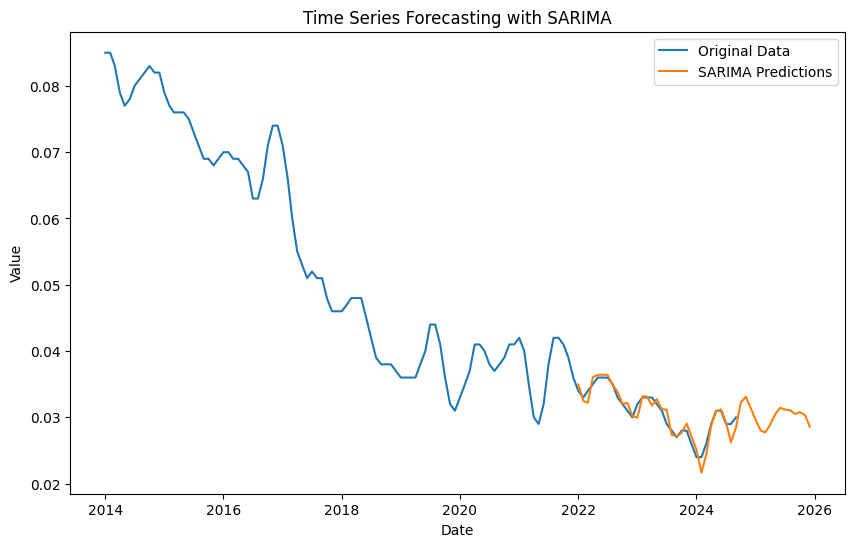

SARIMA - MSE: 1.0586672788916225e-06, RMSE: 0.0010289155839482763, MAPE: 2.67%


In [603]:
model_sarima(data_filtered,'Slovenia', '25+', 'Male')

### 25+, Female

In [604]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='25+', sex='Female')

In [605]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9821
Strong seasonality detected.


(0.982109509787186, True)

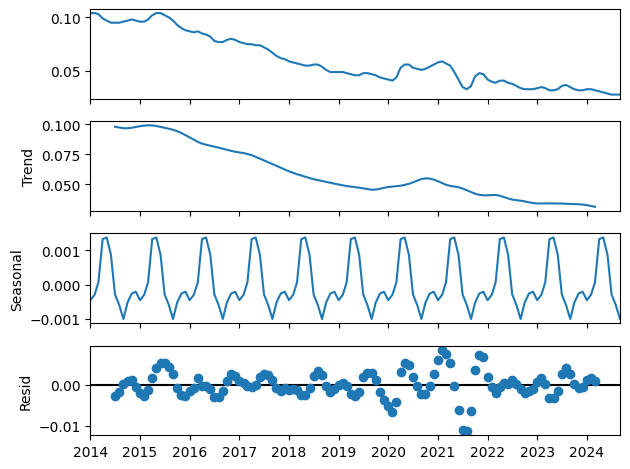

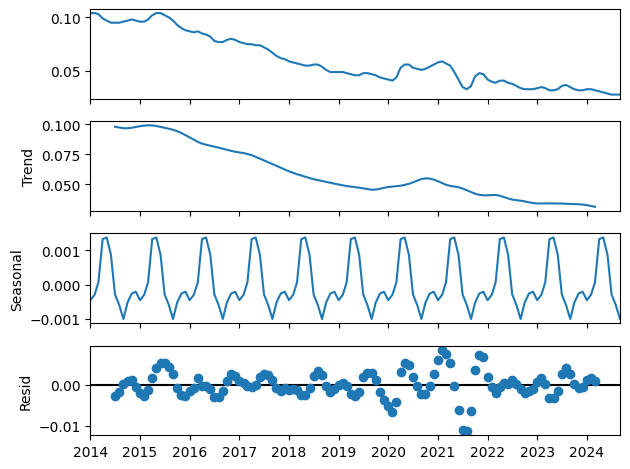

In [606]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1109.044, Time=0.85 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-983.910, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1071.274, Time=0.70 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1067.432, Time=0.39 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1057.631, Time=0.20 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1093.138, Time=1.80 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1053.630, Time=0.49 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1083.055, Time=0.32 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1078.179, Time=0.66 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1098.492, Time=0.25 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1123.539, Time=0.30 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1077.711, Time=0.33 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1107.631, Time=0.59 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1073.712, Time=0.67 sec
 ARIMA

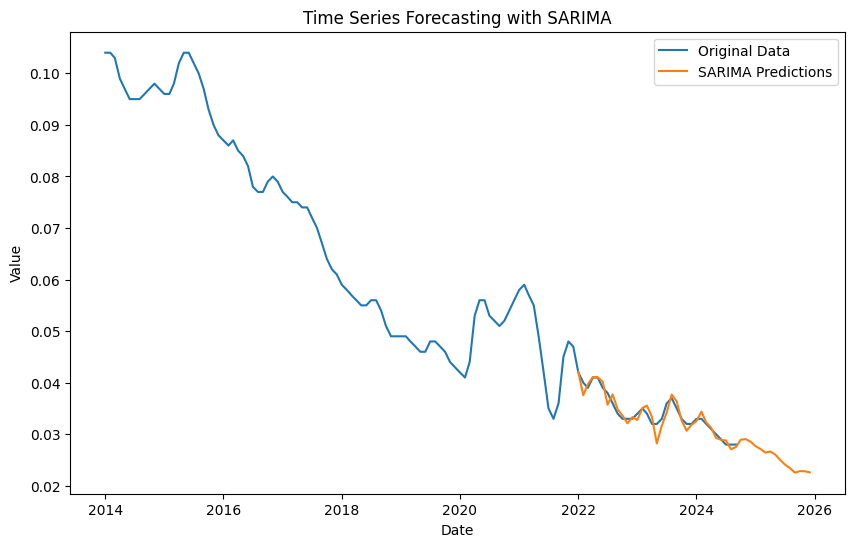

SARIMA - MSE: 1.6649745659534388e-06, RMSE: 0.0012903389345259016, MAPE: 2.83%


In [607]:
model_sarima(data_filtered,'Slovenia', '25+', 'Female')

### 25+, Total

In [608]:
data_filtered = prepare_data(combined_df, country='Slovenia', age='25+', sex='Total')

In [609]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9859
Strong seasonality detected.


(0.9858657057630562, True)

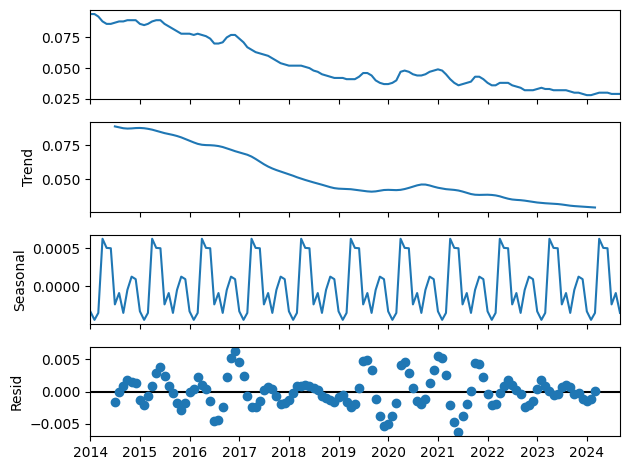

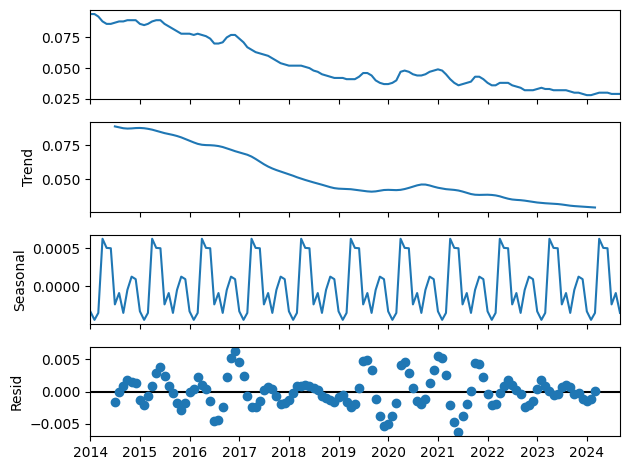

In [610]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1148.351, Time=0.69 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1031.448, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1140.176, Time=1.40 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1142.416, Time=1.08 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1084.930, Time=0.54 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1139.586, Time=1.21 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1080.931, Time=0.27 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1143.185, Time=0.39 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1120.670, Time=1.04 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1144.618, Time=0.40 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1091.186, Time=0.29 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1139.458, Time=0.36 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1096.167, Time=0.21 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1154.119, Time=0.20 sec
 ARIM

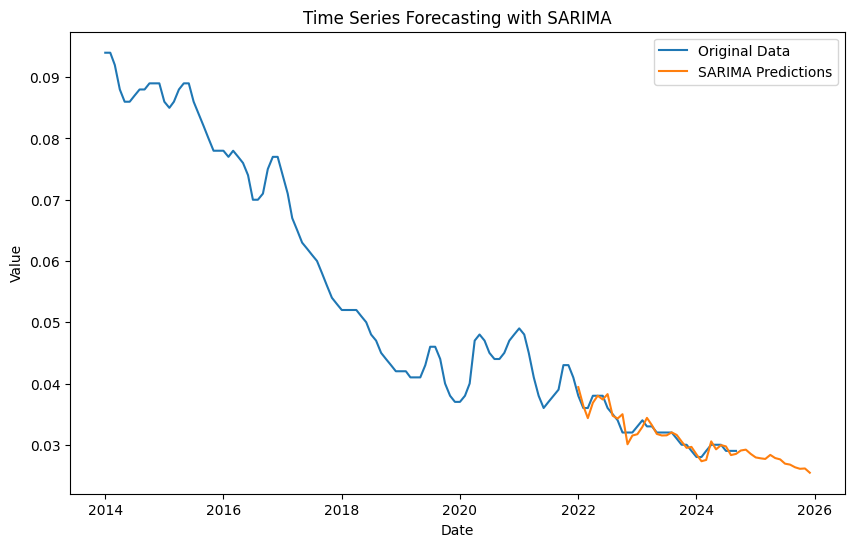

SARIMA - MSE: 1.1641632633165566e-06, RMSE: 0.0010789639768391513, MAPE: 2.51%


In [611]:
model_sarima(data_filtered,'Slovenia', '25+', 'Total')

# Norway

## 15-24, Male

In [612]:
data_filtered = prepare_data(combined_df, country='Norway', age='15-24', sex='Male')

In [613]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.5148
Weak or no seasonality detected.


(0.5147907743840574, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.12 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-502.190, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-554.606, Time=0.23 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.65 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-522.634, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-560.186, Time=0.37 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.23 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-532.083, Time=0.17 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-592.743, Time=1.73 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-587.497, Time=0.29 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=1.25 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=0.69 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=-592.008, Time=0.59 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-594.5

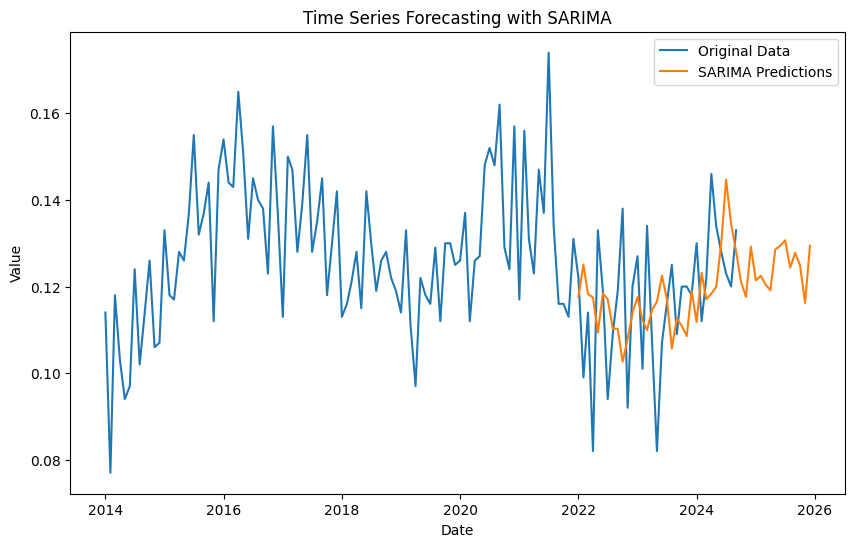

SARIMA - MSE: 0.0003006376325433226, RMSE: 0.017338905171415023, MAPE: 12.44%


In [614]:
model_sarima(data_filtered,'Norway', '15-24', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-649.511, Time=0.78 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-497.901, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-554.474, Time=0.06 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-499.883, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-692.302, Time=0.21 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-624.323, Time=0.15 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-687.986, Time=0.30 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-675.347, Time=0.32 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-616.194, Time=0.15 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-638.901, Time=0.21 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-664.959, Time=0.22 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=0.15 sec

Best model:  ARIMA(2,2,1)(0,0,0)[0] intercept
Total fit time: 2.943 seconds
                               S

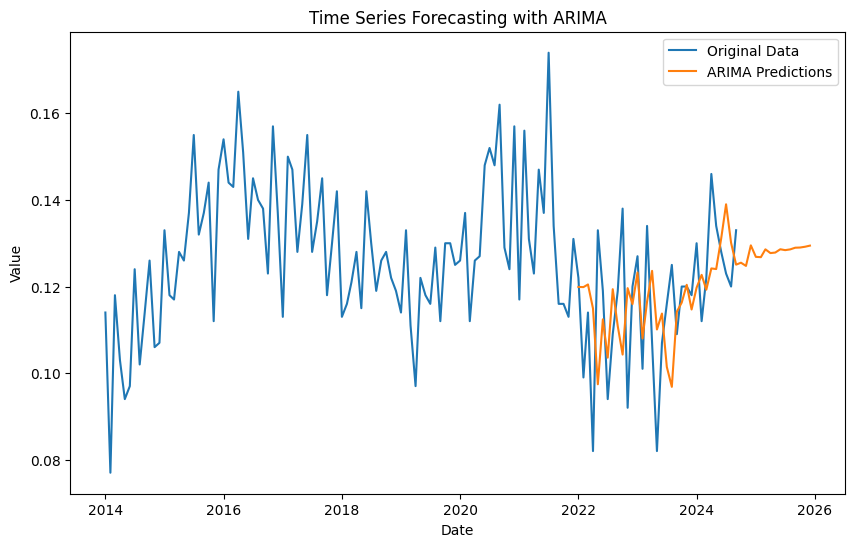

ARIMA - MSE: 0.0002802283818640502, RMSE: 0.01674002335315128, MAPE: 11.83%


In [615]:
model_arima(data_filtered,'Norway', '15-24', 'Male')

## 15-24, Female

In [616]:
data_filtered = prepare_data(combined_df, country='Norway', age='15-24', sex='Female')

In [617]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.4668
Weak or no seasonality detected.


(0.46678533794176846, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.84 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-493.096, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-547.491, Time=0.48 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-524.999, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-557.720, Time=0.46 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=0.85 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-529.057, Time=0.46 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-576.795, Time=0.46 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-565.586, Time=0.42 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=1.88 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=0.72 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=-575.547, Time=0.49 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-575.6

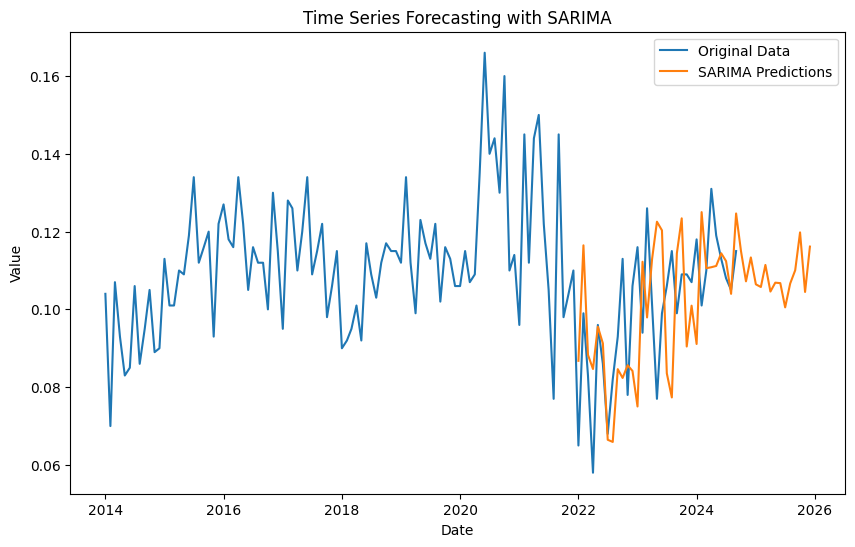

SARIMA - MSE: 0.00044459834980642947, RMSE: 0.021085500938000726, MAPE: 18.12%


In [618]:
model_sarima(data_filtered,'Norway', '15-24', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.80 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-492.729, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-555.384, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-494.716, Time=0.02 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-612.057, Time=0.16 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-634.977, Time=0.07 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-667.242, Time=0.25 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.43 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-672.197, Time=0.28 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-633.216, Time=0.31 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-656.618, Time=0.80 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-670.604, Time=1.06 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-666.209, T

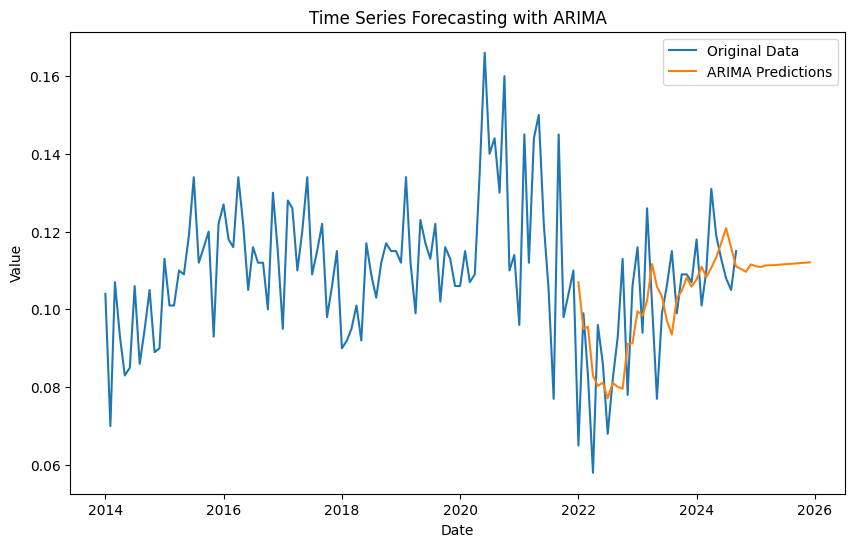

ARIMA - MSE: 0.00025470708141367074, RMSE: 0.015959545150588433, MAPE: 13.60%


In [619]:
model_arima(data_filtered,'Norway', '15-24', 'Female')

## 15-24,Total

In [620]:
data_filtered = prepare_data(combined_df, country='Norway', age='15-24', sex='Total')

In [621]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.5183
Weak or no seasonality detected.


(0.5183349130237538, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.99 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-521.788, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-575.829, Time=0.25 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.43 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-549.140, Time=0.07 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-582.616, Time=0.66 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.04 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.58 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-551.254, Time=0.27 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-613.130, Time=0.71 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-605.226, Time=0.31 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=1.11 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=0.72 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=-611.891, Time=0.84 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-611.8

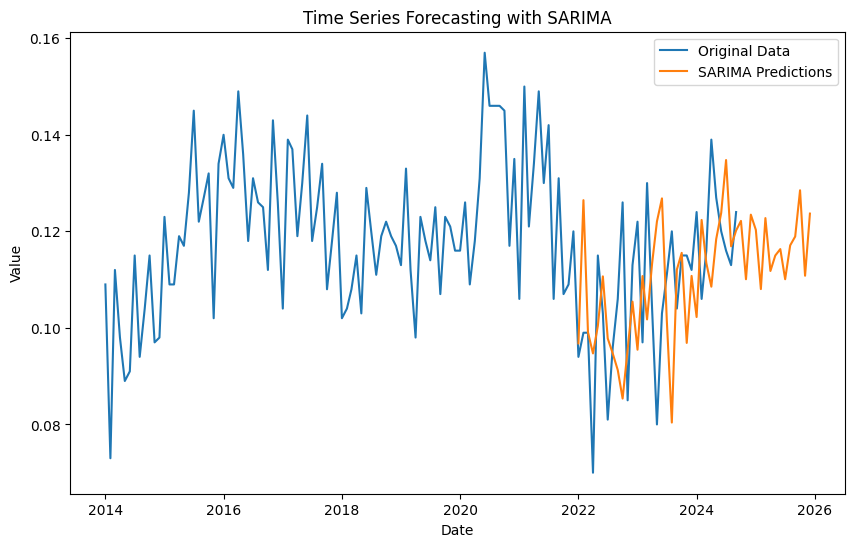

SARIMA - MSE: 0.000396470135584266, RMSE: 0.019911557839211527, MAPE: 14.98%


In [622]:
model_sarima(data_filtered,'Norway', '15-24', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.86 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-514.698, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-576.466, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-516.680, Time=0.02 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-647.893, Time=0.14 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-674.658, Time=0.10 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-706.319, Time=0.29 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.37 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-703.362, Time=0.15 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=-715.320, Time=0.19 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=0.19 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-676.591, Time=0.03 sec
 ARIMA(3,2,2)(0,0,0)[0]             : AIC=inf, Time=0.33 s

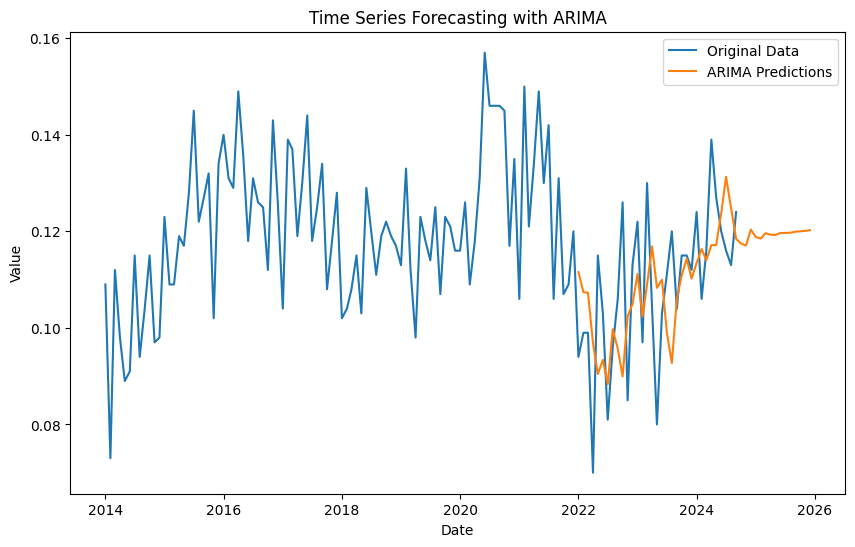

ARIMA - MSE: 0.00023436741955079583, RMSE: 0.01530906331395869, MAPE: 11.88%


In [623]:
model_arima(data_filtered,'Norway', '15-24', 'Total')

## 25+, Female

In [624]:
data_filtered = prepare_data(combined_df, country='Norway', age='25+', sex='Female')

In [625]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6649
Weak or no seasonality detected.


(0.6648842364410725, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-949.135, Time=1.48 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-858.586, Time=0.10 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-908.397, Time=0.18 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-951.192, Time=0.30 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-885.733, Time=0.09 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-937.237, Time=0.20 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-946.984, Time=0.50 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-918.704, Time=0.20 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-937.239, Time=0.83 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-921.858, Time=0.21 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-949.344, Time=0.15 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-942.070, Time=0.14 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-947.314, Time=0.26 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=-949.260, Time=0.30 sec

Best model:  ARIMA

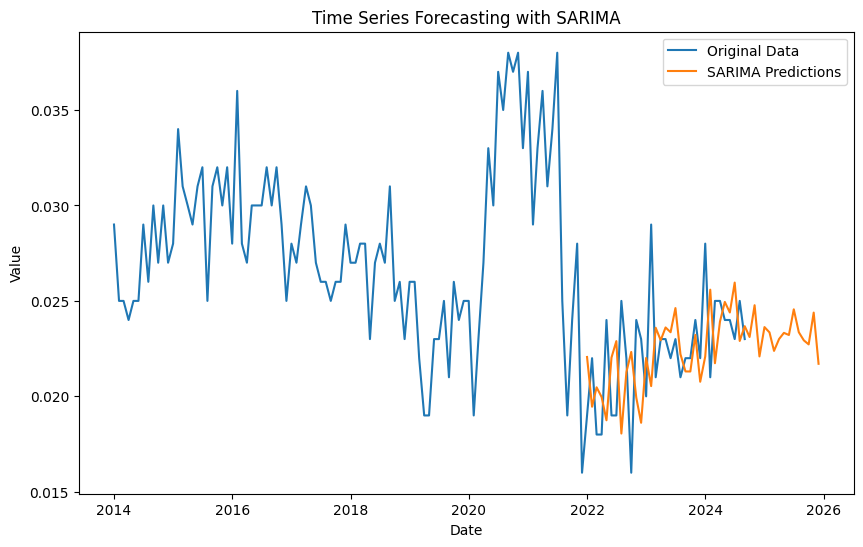

SARIMA - MSE: 1.2099690384279591e-05, RMSE: 0.0034784609217697977, MAPE: 12.40%


In [626]:
model_sarima(data_filtered,'Norway', '25+', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1024.010, Time=0.84 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-910.801, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-969.331, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.17 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-912.801, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1061.702, Time=0.23 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1018.028, Time=0.06 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1053.529, Time=0.11 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-1059.582, Time=0.30 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-1056.118, Time=0.10 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-1043.290, Time=0.22 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-1044.322, Time=0.36 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=-1057.707, Time=0.15 sec

Best model:  ARIMA(2,2,1)(0,0,0)[0] intercept
Total fit time: 2.634 seconds
                  

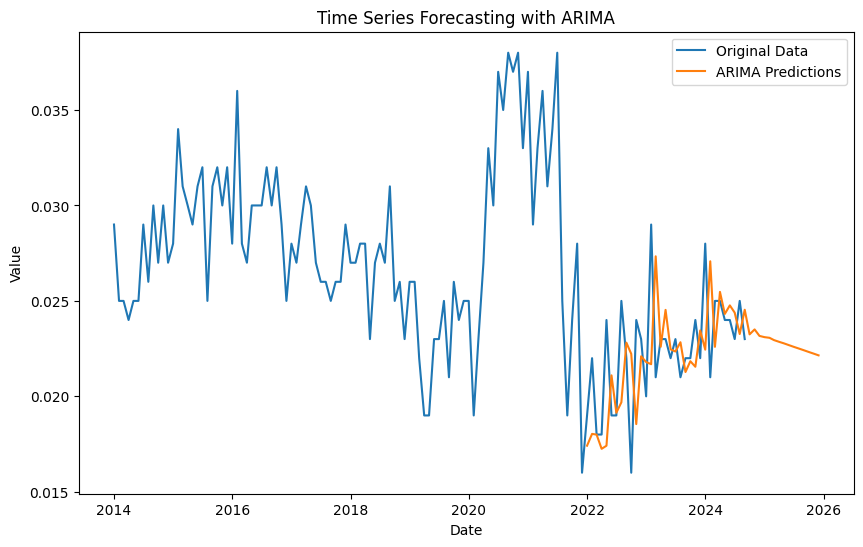

ARIMA - MSE: 1.1708425555390902e-05, RMSE: 0.003421757670465707, MAPE: 11.08%


In [627]:
model_arima(data_filtered,'Norway', '25+', 'Female')

## 25+, Male

In [628]:
data_filtered = prepare_data(combined_df, country='Norway', age='25+', sex='Male')

In [629]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7521
Strong seasonality detected.


(0.7521496533174586, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-883.217, Time=1.08 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-810.532, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-846.944, Time=0.20 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.51 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-839.253, Time=0.15 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-873.979, Time=0.97 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-883.413, Time=0.45 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-881.975, Time=0.91 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-884.132, Time=0.53 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.11 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-882.249, Time=0.83 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-852.978, Time=1.10 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-884.856, Time=0.95 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-875.602, Time=0.35 sec
 ARIMA(0,1,2)(1,1,2)[12]     

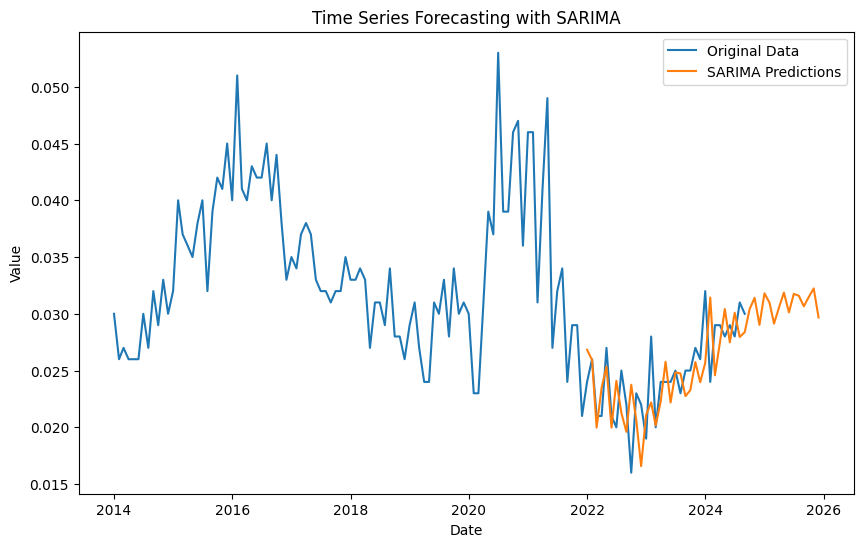

SARIMA - MSE: 1.1332018648288718e-05, RMSE: 0.003366306380632743, MAPE: 11.52%


In [630]:
model_sarima(data_filtered,'Norway', '25+', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-950.269, Time=0.62 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-831.597, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-884.342, Time=0.07 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-833.596, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-993.398, Time=0.14 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-963.532, Time=0.06 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1001.305, Time=0.21 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-985.354, Time=0.09 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-981.663, Time=0.38 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-1000.387, Time=0.15 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=-1004.671, Time=0.77 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=-1007.557, Time=0.15 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=inf, Time=0.15 sec
 ARIMA(2,2,0)(0,0,0)[0]             : A

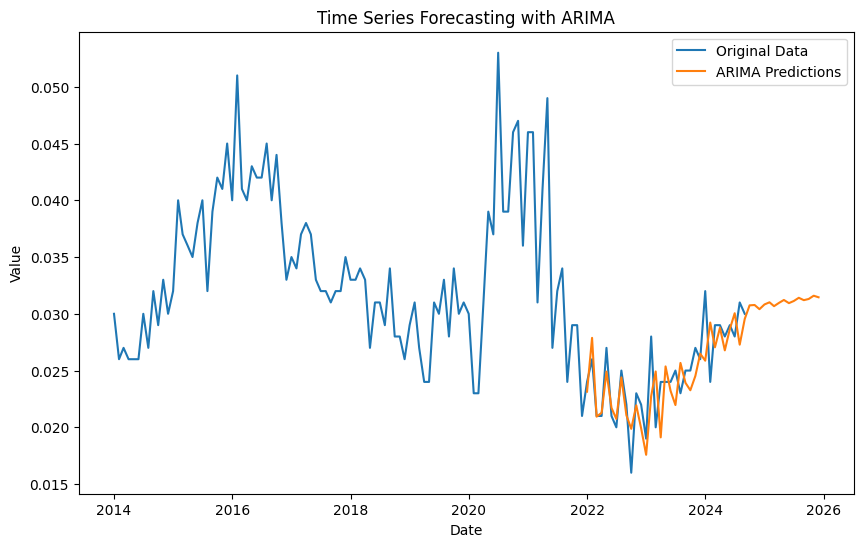

ARIMA - MSE: 6.96600697841294e-06, RMSE: 0.0026393194157609914, MAPE: 8.42%


In [631]:
model_arima(data_filtered,'Norway', '25+', 'Male')

## 25+, Total

In [632]:
data_filtered = prepare_data(combined_df, country='Norway', age='25+', sex='Total')

In [633]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7582
Strong seasonality detected.


(0.7581618330270845, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-937.345, Time=1.17 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-869.224, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-906.194, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=2.11 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-893.318, Time=0.90 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-920.444, Time=1.02 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-924.373, Time=0.64 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-909.457, Time=0.96 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-926.684, Time=0.97 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-928.813, Time=0.29 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-930.748, Time=0.31 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-930.608, Time=0.23 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-906.973, Time=0.24 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-937.637, Time=0.66 sec
 ARIMA(0,1,2)(0,1,0)[12]

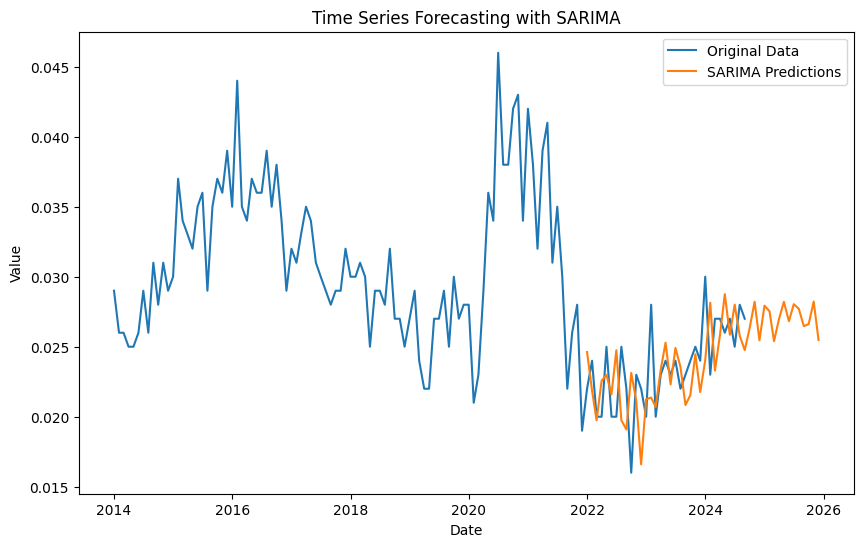

SARIMA - MSE: 1.068251780467772e-05, RMSE: 0.0032684121228323884, MAPE: 11.56%


In [634]:
model_sarima(data_filtered,'Norway', '25+', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.67 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-897.274, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-955.954, Time=0.08 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-899.273, Time=0.02 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1023.091, Time=0.08 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-1038.741, Time=0.13 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1051.583, Time=0.16 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1048.027, Time=0.18 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-1046.444, Time=0.37 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-1053.079, Time=0.22 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-1046.925, Time=0.43 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-1046.960, Time=0.50 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-1040.463, Time=0.18 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept 

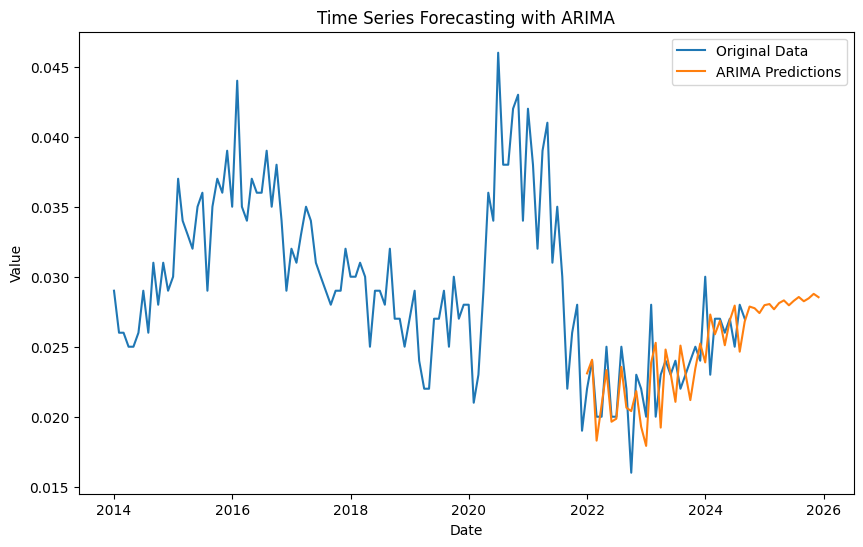

ARIMA - MSE: 6.398172567688888e-06, RMSE: 0.0025294609243253566, MAPE: 8.43%


In [635]:
model_arima(data_filtered,'Norway', '25+', 'Total')

# Latvia

## 15-24, Female

In [636]:
data_filtered = prepare_data(combined_df, country='Latvia', age='15-24', sex='Female')

In [637]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7596
Strong seasonality detected.


(0.7596440413530112, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.19 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-537.251, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-632.196, Time=0.22 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.47 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-594.929, Time=0.04 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-654.745, Time=0.99 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=0.92 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-600.295, Time=0.07 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-703.166, Time=1.01 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=-674.077, Time=0.35 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=-714.236, Time=3.84 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-708.935, Time=1.65 sec
 ARIMA(2,1,0)(2,1,2)[12]             : AIC=-704.637, Time=2.04 sec
 ARIMA(2,1,0)(1,1,2)[12]             : 

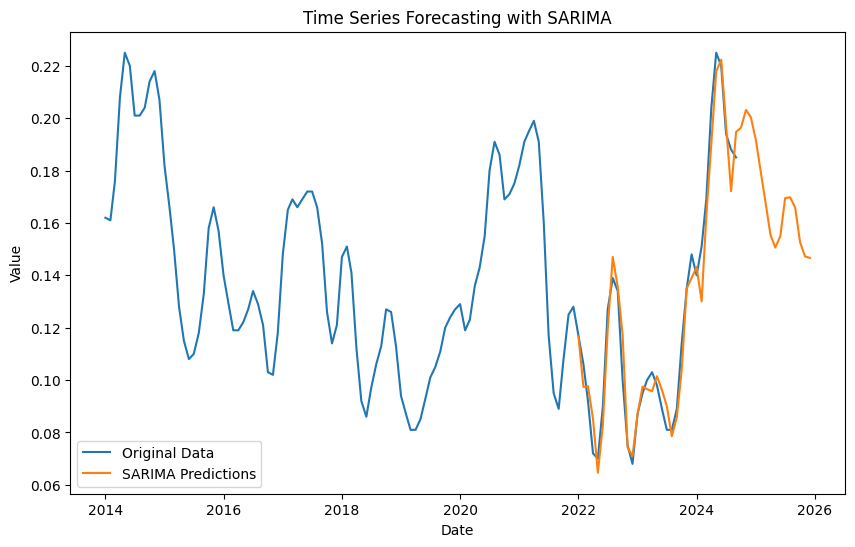

SARIMA - MSE: 6.475428278391764e-05, RMSE: 0.008047004584559253, MAPE: 5.76%


In [638]:
model_sarima(data_filtered,'Latvia', '15-24', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.66 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-745.625, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-753.777, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-756.242, Time=0.08 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-747.625, Time=0.03 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-758.535, Time=0.23 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-776.295, Time=0.12 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-805.751, Time=0.25 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-781.237, Time=0.23 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-811.583, Time=0.27 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-808.431, Time=0.44 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-816.333, Time=0.43 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-799.707, Time=0.34 sec
 ARIMA(3,2,3)(0,0,0)[0]             : AIC=-822.327, Time=0.29 sec
 ARIMA(2,2,3)(0,0,0)[0]             : 

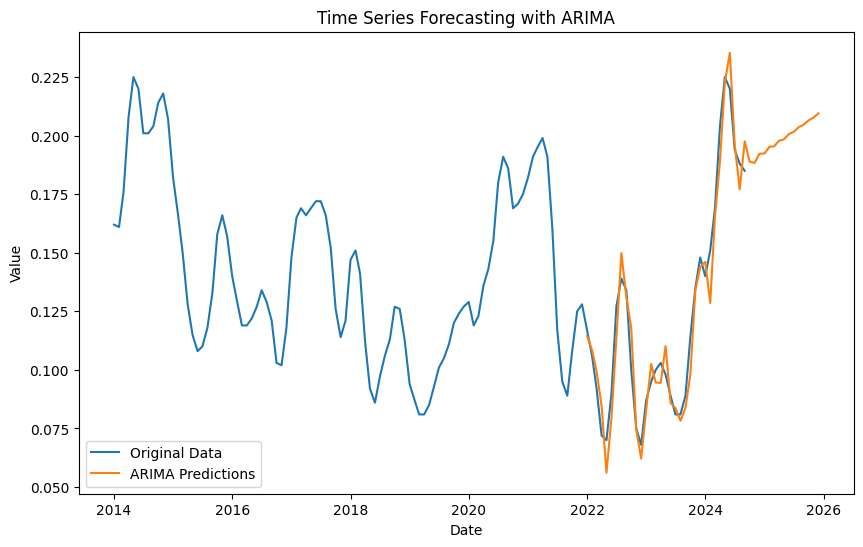

ARIMA - MSE: 9.557707381374752e-05, RMSE: 0.009776352786890801, MAPE: 7.28%


In [639]:
model_arima(data_filtered,'Latvia', '15-24', 'Female')

## 15-24, Male

In [640]:
data_filtered = prepare_data(combined_df, country='Latvia', age='15-24', sex='Male')

In [641]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.4867
Weak or no seasonality detected.


(0.48671863469056353, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-686.100, Time=1.10 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-523.421, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-642.107, Time=0.59 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.83 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-635.323, Time=0.42 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-679.628, Time=0.39 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=0.62 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-681.504, Time=0.53 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-685.517, Time=2.85 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-649.192, Time=0.34 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-719.605, Time=1.08 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-677.653, Time=0.06 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-712.926, Time=0.67 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=inf, Time=2.47 sec
 ARIMA(2,1,1)(1,1,0)[12]          

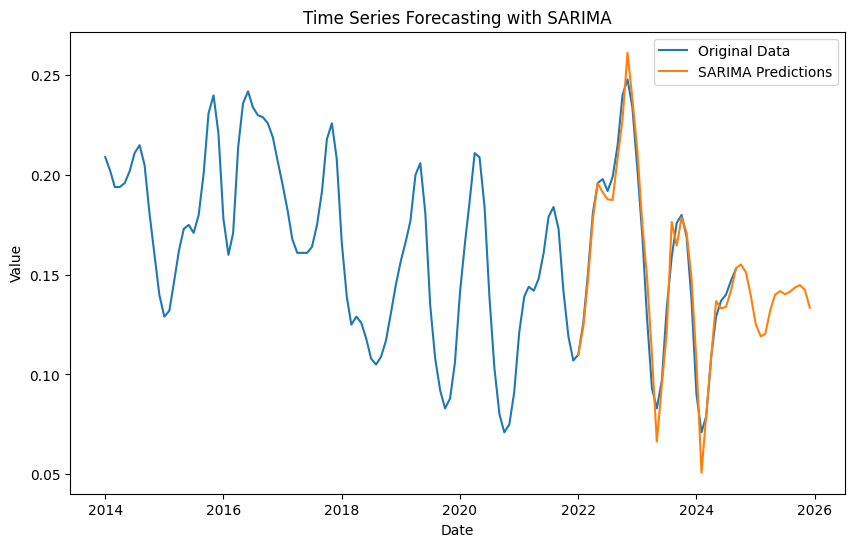

SARIMA - MSE: 0.00010520171851832388, RMSE: 0.01025678889898412, MAPE: 6.31%


In [642]:
model_sarima(data_filtered,'Latvia', '15-24', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-757.041, Time=1.05 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-721.536, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-751.699, Time=0.06 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-753.812, Time=0.61 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-723.529, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-803.824, Time=0.14 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-771.180, Time=0.11 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-793.060, Time=0.40 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-779.776, Time=0.40 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-785.229, Time=0.32 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-791.458, Time=0.04 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-781.042, Time=0.61 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=-811.898, Time=0.23 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=-759.039, Time=0.10 sec
 ARIMA(2,2,0)(0,0,0)[0]          

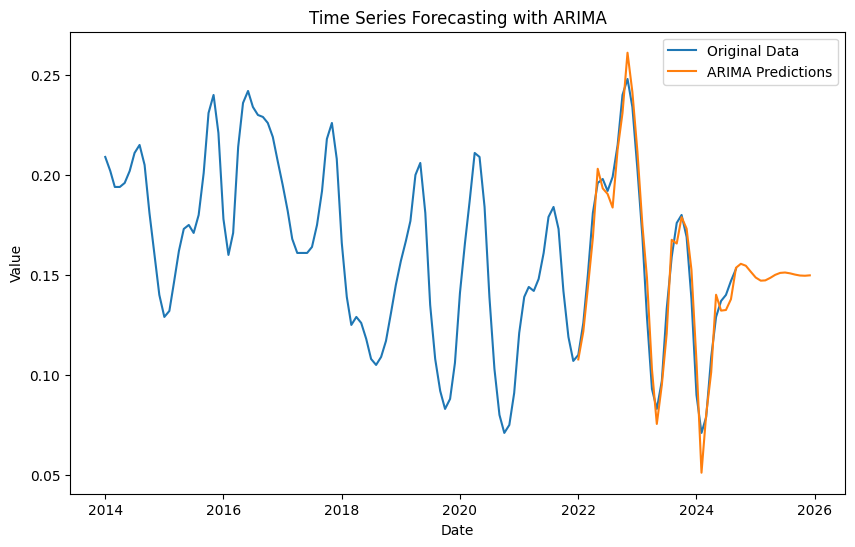

ARIMA - MSE: 9.825601202317745e-05, RMSE: 0.009912417062612804, MAPE: 6.35%


In [643]:
model_arima(data_filtered,'Latvia', '15-24', 'Male')

## 15-24, Total

In [644]:
data_filtered = prepare_data(combined_df, country='Latvia', age='15-24', sex='Total')

In [645]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6432
Weak or no seasonality detected.


(0.6431984976613868, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=2.65 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-647.176, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-745.106, Time=0.92 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-712.708, Time=1.26 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-718.059, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-747.645, Time=0.99 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-751.874, Time=2.94 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-751.667, Time=0.33 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=inf, Time=1.22 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.02 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=0.79 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=-791.182, Time=1.85 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-794.323, Time=0.90 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=-805.454, Time=1.23 sec
 ARIMA(2,1,0)(0,1,0)[12]             : 

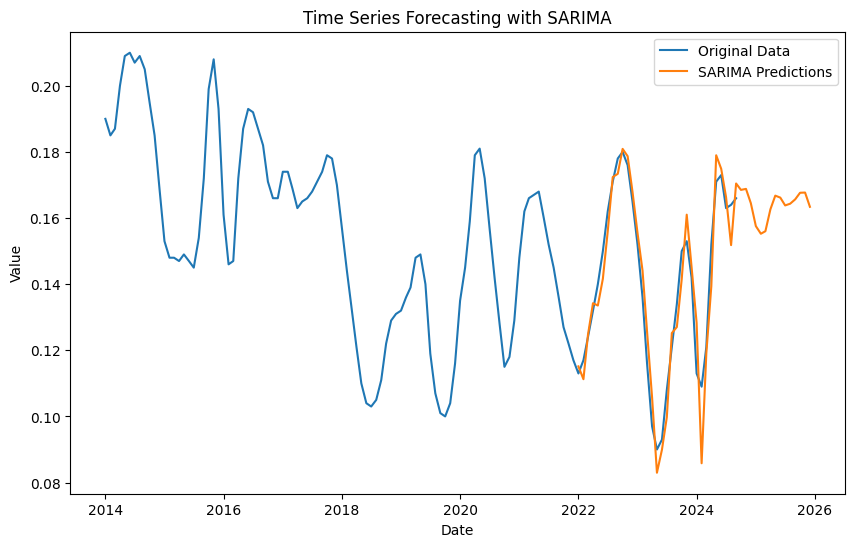

SARIMA - MSE: 6.065533496383537e-05, RMSE: 0.0077881535015583364, MAPE: 4.90%


In [646]:
model_sarima(data_filtered,'Latvia', '15-24', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-861.397, Time=0.72 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-847.265, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-860.557, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-862.406, Time=0.05 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-849.259, Time=0.02 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-867.153, Time=0.52 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-872.609, Time=0.35 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-881.874, Time=0.28 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-885.885, Time=0.24 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-868.223, Time=0.07 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-885.912, Time=0.10 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-887.808, Time=0.10 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-889.807, Time=0.07 sec
 ARIMA(2,2,0)(0,0,0)[0]             : AIC=-870.223, Time=0.04 sec
 ARIMA(3,2,1)(0,0,0)[0]          

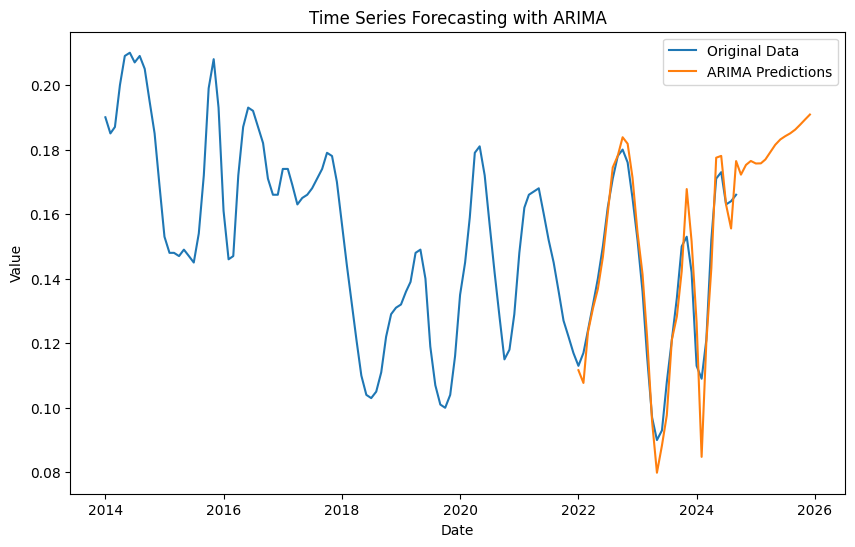

ARIMA - MSE: 6.111413964419242e-05, RMSE: 0.0078175533029326, MAPE: 4.61%


In [647]:
model_arima(data_filtered,'Latvia', '15-24', 'Total')

## 25+, Male

In [648]:
data_filtered = prepare_data(combined_df, country='Latvia', age='25+', sex='Male')

In [649]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9287
Strong seasonality detected.


(0.9287275949532755, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1041.088, Time=0.95 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-918.480, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1022.548, Time=0.26 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-939.434, Time=0.33 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-998.560, Time=0.14 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1033.046, Time=1.08 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1027.290, Time=0.85 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1032.469, Time=0.30 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1033.536, Time=1.33 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1024.930, Time=0.37 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1058.356, Time=0.53 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1018.310, Time=0.19 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1041.260, Time=8.47 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1037.406, Time=6.84 sec
 ARIMA(2

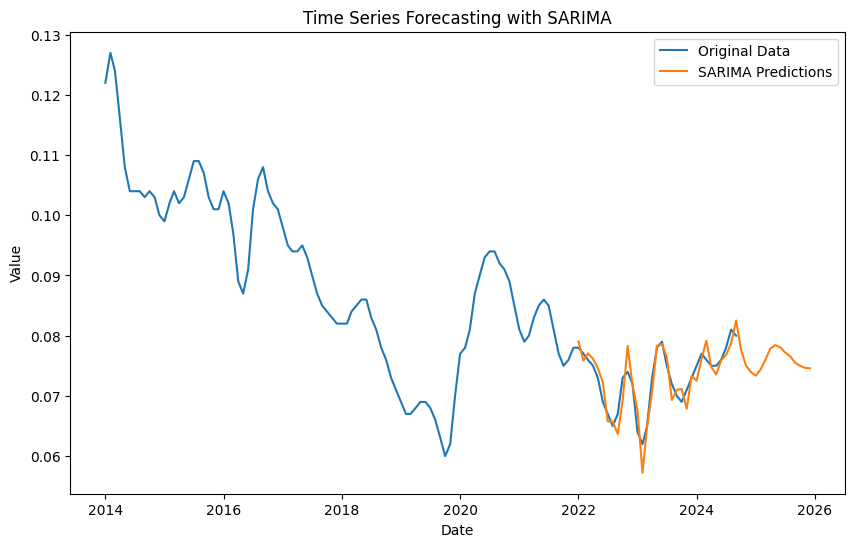

SARIMA - MSE: 4.973406468883462e-06, RMSE: 0.0022301135551544143, MAPE: 2.51%


In [650]:
model_sarima(data_filtered,'Latvia', '25+', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1122.685, Time=0.74 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1131.992, Time=0.10 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1138.164, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-1137.454, Time=1.26 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1133.954, Time=0.02 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1149.287, Time=0.09 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-1177.261, Time=0.35 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1174.910, Time=0.38 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1125.992, Time=0.27 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-1179.264, Time=0.10 sec
 ARIMA(2,2,0)(0,0,0)[0]             : AIC=-1151.263, Time=0.27 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=-1176.912, Time=0.25 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=-1127.956, Time=0.27 sec

Best model:  ARIMA(3,2,0)(0,0,0)[0]          
Total fit time: 4.164 seconds
         

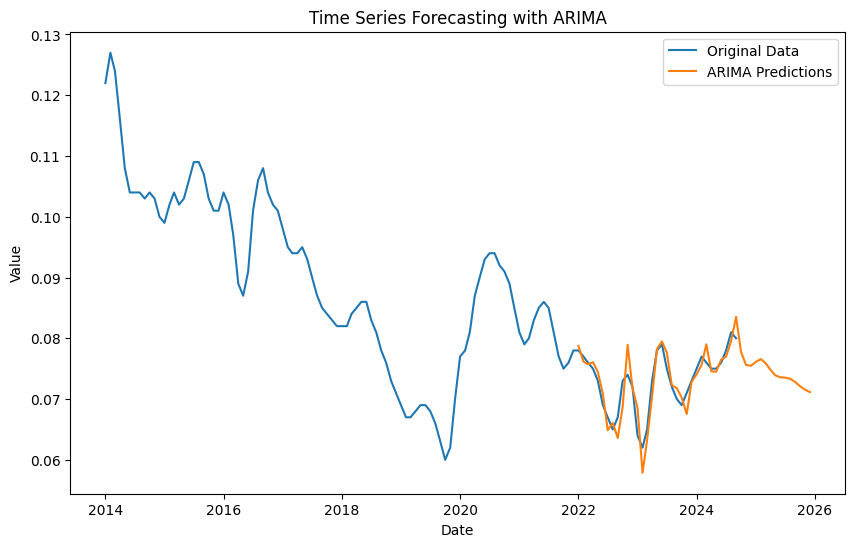

ARIMA - MSE: 5.081328430475051e-06, RMSE: 0.002254180212510759, MAPE: 2.48%


In [651]:
model_arima(data_filtered,'Latvia', '25+', 'Male')

## 25+, Female

In [652]:
data_filtered = prepare_data(combined_df, country='Latvia', age='25+', sex='Female')

In [653]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9488
Strong seasonality detected.


(0.9488473117690015, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.61 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-968.168, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1076.033, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.42 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1033.705, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-1100.432, Time=0.58 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1097.209, Time=0.45 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1090.370, Time=0.57 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-1047.506, Time=0.25 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=-1098.957, Time=0.64 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-1091.809, Time=0.73 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-910.487, Time=0.66 sec
 ARIMA(2,1,1)(2,1,0)[12]             : AIC=-1101.935, Time=0.98 sec
 ARIMA(2,1,1)(1,1,0)[12]             : AIC=-1098.148, Time=0.47 sec
 ARIMA(2,1,1)(2,1,1

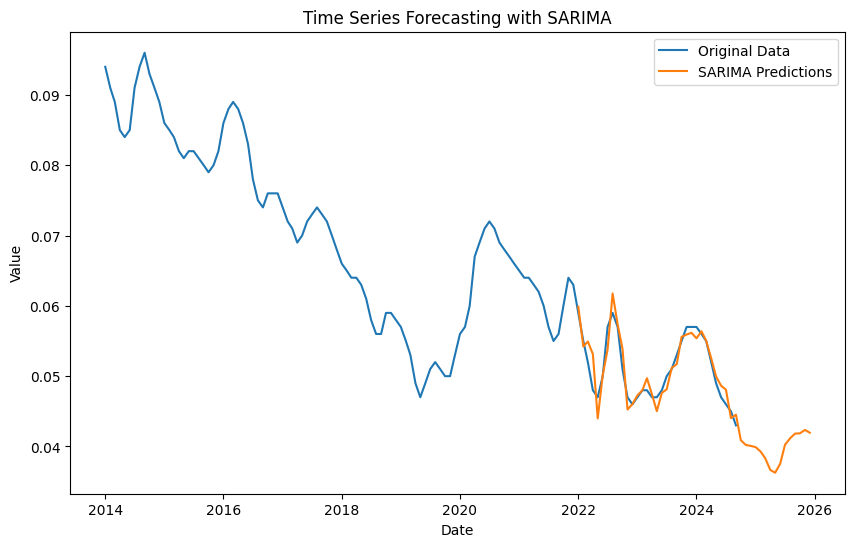

SARIMA - MSE: 3.2055454212836544e-06, RMSE: 0.0017904037034377621, MAPE: 2.58%


In [654]:
model_sarima(data_filtered,'Latvia', '25+', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1208.276, Time=0.55 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1222.099, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1222.851, Time=0.06 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-1223.247, Time=0.66 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1224.097, Time=0.03 sec

Best model:  ARIMA(0,2,0)(0,0,0)[0]          
Total fit time: 1.355 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  129
Model:               SARIMAX(0, 2, 0)   Log Likelihood                 613.048
Date:                Sun, 08 Dec 2024   AIC                          -1224.097
Time:                        18:54:15   BIC                          -1221.252
Sample:                    01-01-2014   HQIC                         -1222.941
                         - 09-01-2024                                  

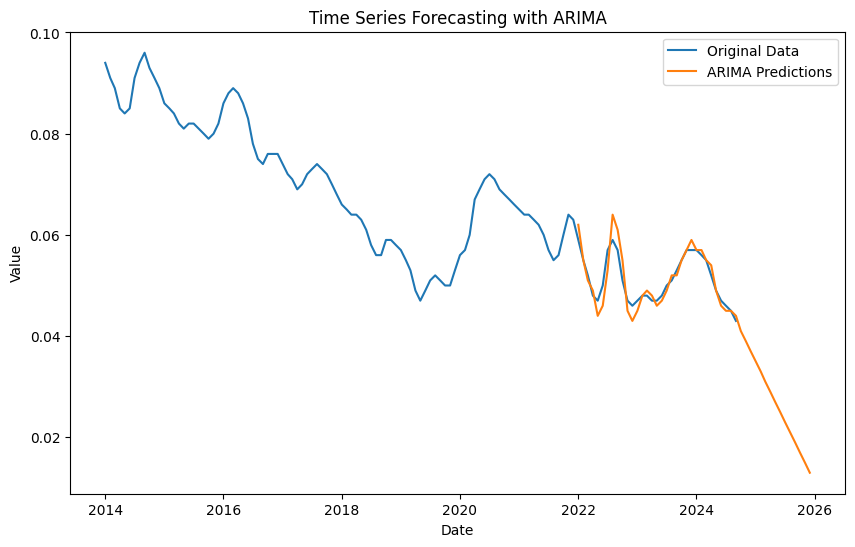

ARIMA - MSE: 4.766666666666694e-06, RMSE: 0.0021832697191750483, MAPE: 3.15%


In [655]:
model_arima(data_filtered,'Latvia', '25+', 'Female')

## 25+, Total

In [656]:
data_filtered = prepare_data(combined_df, country='Latvia', age='25+', sex='Total')

In [657]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9716
Strong seasonality detected.


(0.9715671806491789, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1135.026, Time=1.63 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1022.457, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1121.286, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1106.137, Time=0.46 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1084.044, Time=0.42 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1131.427, Time=0.29 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1125.220, Time=0.60 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1121.948, Time=0.28 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.18 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1129.785, Time=0.27 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1137.491, Time=0.44 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1086.117, Time=0.09 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1128.446, Time=0.23 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1126.554, Time=0.37 sec
 ARIMA(2,1,

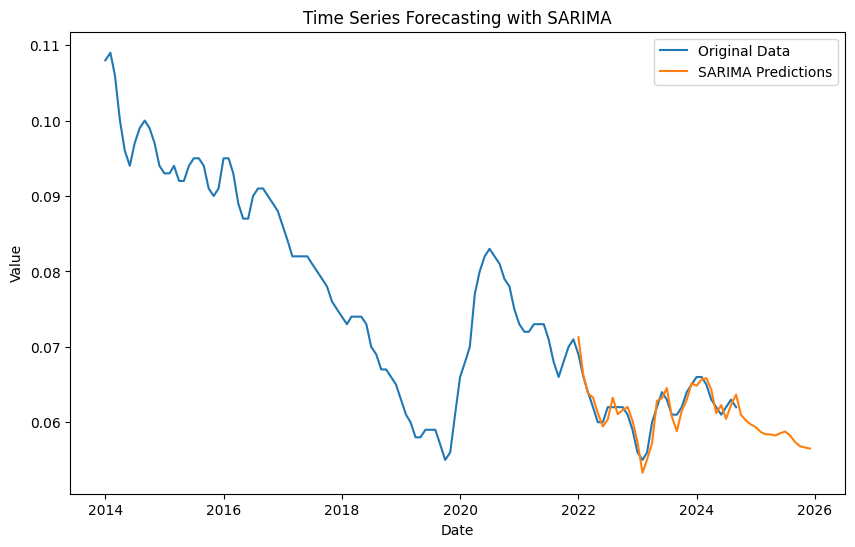

SARIMA - MSE: 1.5213417263377166e-06, RMSE: 0.0012334268224494377, MAPE: 1.73%


In [658]:
model_sarima(data_filtered,'Latvia', '25+', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1243.029, Time=0.70 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1247.031, Time=0.07 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1245.762, Time=0.10 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-1245.007, Time=0.18 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1249.020, Time=0.03 sec

Best model:  ARIMA(0,2,0)(0,0,0)[0]          
Total fit time: 1.091 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                  129
Model:               SARIMAX(0, 2, 0)   Log Likelihood                 625.510
Date:                Sun, 08 Dec 2024   AIC                          -1249.020
Time:                        18:54:36   BIC                          -1246.176
Sample:                    01-01-2014   HQIC                         -1247.864
                         - 09-01-2024                                  

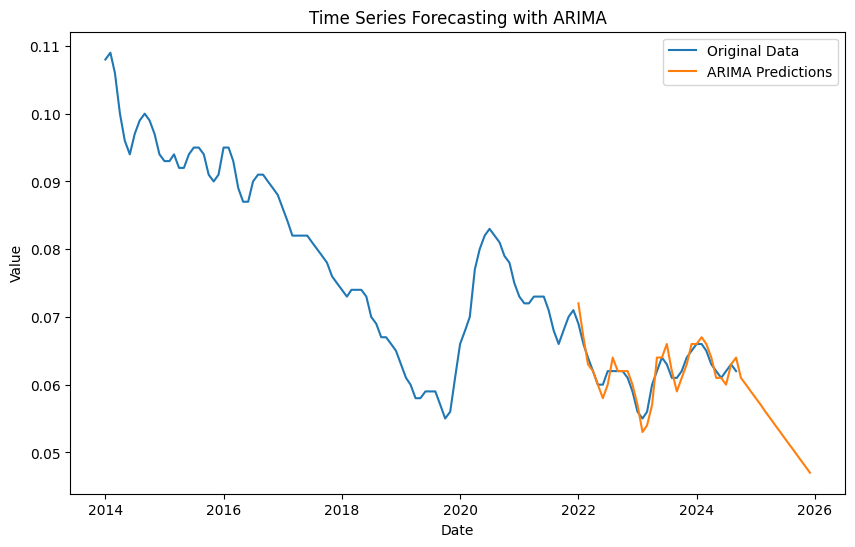

ARIMA - MSE: 2.2666337962985565e-06, RMSE: 0.0015055343889458508, MAPE: 1.95%


In [659]:
model_arima(data_filtered,'Latvia', '25+', 'Total')

# Lithuania

## 15-24,Male

In [660]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='15-24', sex='Male')

In [661]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7065
Strong seasonality detected.


(0.7065319097842284, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-570.881, Time=1.05 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-523.132, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-546.641, Time=0.35 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.79 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-531.068, Time=0.09 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-569.265, Time=0.61 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=1.60 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-545.909, Time=0.31 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-567.165, Time=1.41 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-571.828, Time=1.04 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-531.643, Time=0.06 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-569.817, Time=0.38 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-570.568, Time=0.77 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.33 sec
 ARIMA(0,1,0)(0,1,1)[12]          

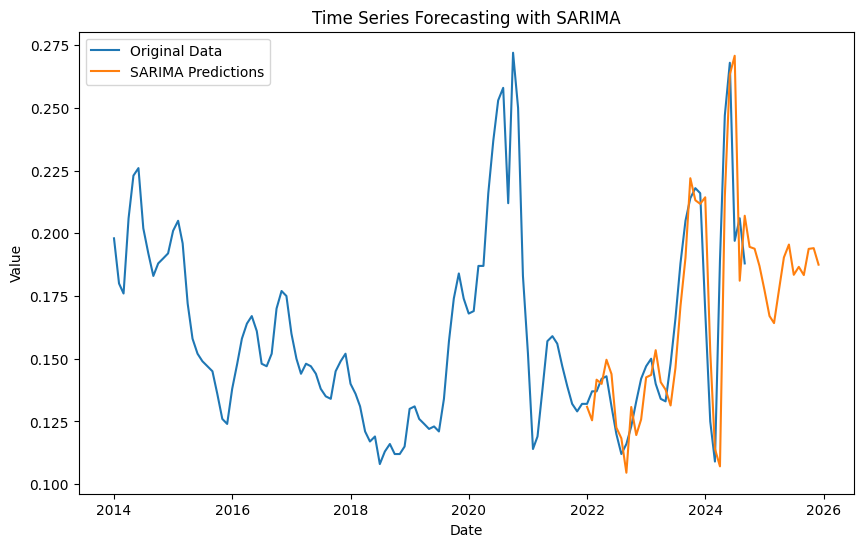

SARIMA - MSE: 0.0004429156593071398, RMSE: 0.021045561510854013, MAPE: 8.63%


In [662]:
model_sarima(data_filtered,'Latvia', '15-24', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.90 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-596.131, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-602.000, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-598.131, Time=0.03 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-603.908, Time=0.04 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-616.765, Time=0.06 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-654.484, Time=0.25 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-644.511, Time=0.19 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-650.542, Time=0.29 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.25 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=-657.800, Time=1.51 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=0.36 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-618.759, Time=0.10 sec
 ARIMA(3,2,2)(0,0,0)[0]             : AIC=-655.169, T

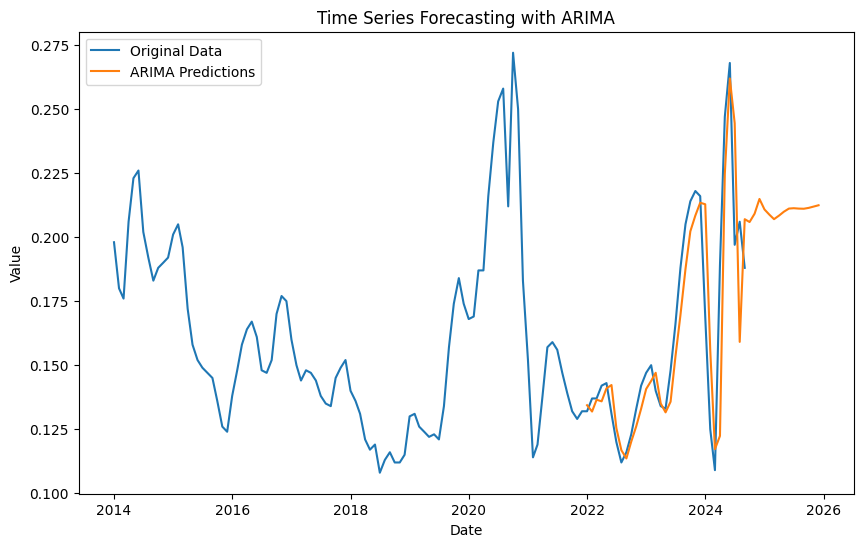

ARIMA - MSE: 0.00032109063652637453, RMSE: 0.017919002107438197, MAPE: 7.01%


In [663]:
model_arima(data_filtered,'Latvia', '15-24', 'Male')

## 15-24, Female

In [664]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='15-24', sex='Female')

In [665]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.8614
Strong seasonality detected.


(0.861356613428324, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-661.947, Time=1.34 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-596.731, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-638.425, Time=0.37 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.74 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-606.378, Time=0.14 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=1.29 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-662.087, Time=1.18 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-661.201, Time=1.27 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-663.365, Time=1.23 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-662.192, Time=1.37 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=0.67 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.31 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-661.789, Time=1.26 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=3.19 sec
 ARIMA(1,1,2)(0,1,2)[12]             : AIC=-

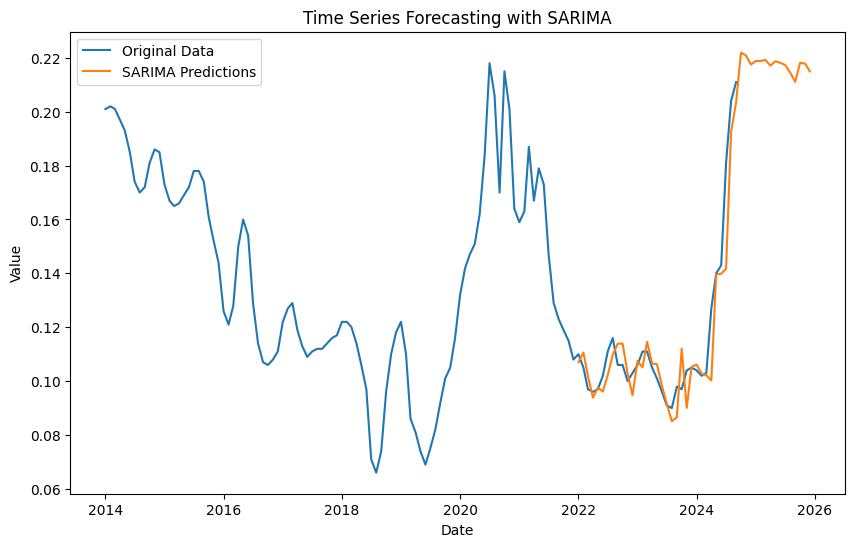

SARIMA - MSE: 6.04924705196659e-05, RMSE: 0.00777769056466416, MAPE: 5.13%


In [666]:
model_sarima(data_filtered,'Lithuania', '15-24', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.92 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-708.020, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-717.038, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-749.655, Time=0.15 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-710.019, Time=0.01 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-755.799, Time=0.06 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-762.471, Time=0.42 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-760.808, Time=0.38 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-758.392, Time=0.20 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-758.557, Time=0.04 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-756.676, Time=0.25 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-753.198, Time=0.12 sec
 ARIMA(1,2,2)(0,0,0)[0]             : AIC=-763.683, Time=0.18 sec
 ARIMA(0,2,2)(0,0,0)[0]             : AIC=-761.100, Time=0.13 sec
 ARIMA(1,2,1)(0,0,0)[0]             : 

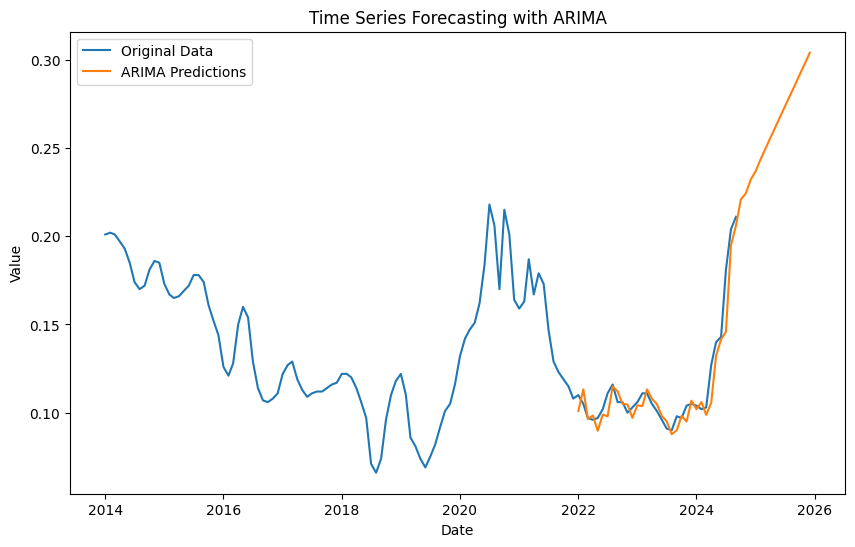

ARIMA - MSE: 4.3456736338090496e-05, RMSE: 0.006592172353487922, MAPE: 4.62%


In [667]:
model_arima(data_filtered,'Lithuania', '15-24', 'Female')

## 15-24, Total

In [668]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='15-24', sex='Total')

In [669]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.8138
Strong seasonality detected.


(0.8137645287815473, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.34 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-594.019, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-619.689, Time=0.17 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.74 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-597.912, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-629.254, Time=0.75 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-642.502, Time=1.60 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-642.846, Time=0.36 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.57 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.20 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=1.30 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=inf, Time=1.56 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.56 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-643.403, Time=1.08 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=inf, Time=0

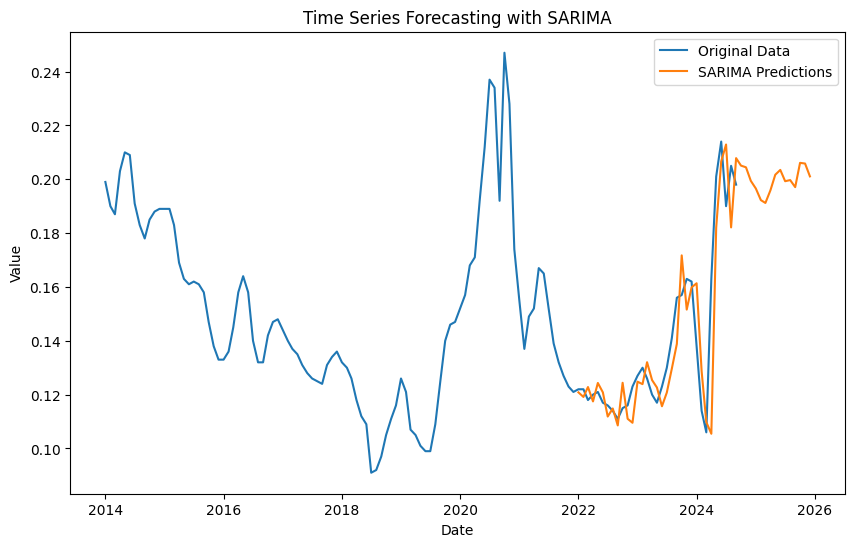

SARIMA - MSE: 0.00019787078784627308, RMSE: 0.014066655176205646, MAPE: 6.58%


In [670]:
model_sarima(data_filtered,'Lithuania', '15-24', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-724.735, Time=0.58 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-675.279, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-684.382, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.11 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-677.279, Time=0.03 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-719.984, Time=0.20 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-726.723, Time=0.15 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-725.003, Time=0.13 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.32 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-727.433, Time=0.36 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-729.830, Time=0.26 sec
 ARIMA(0,2,3)(0,0,0)[0]             : AIC=inf, Time=0.16 sec

Best model:  ARIMA(0,2,3)(0,0,0)[0] intercept
Total fit time: 2.361 seconds
                               SARIMAX Results                                
Dep. Variable:          

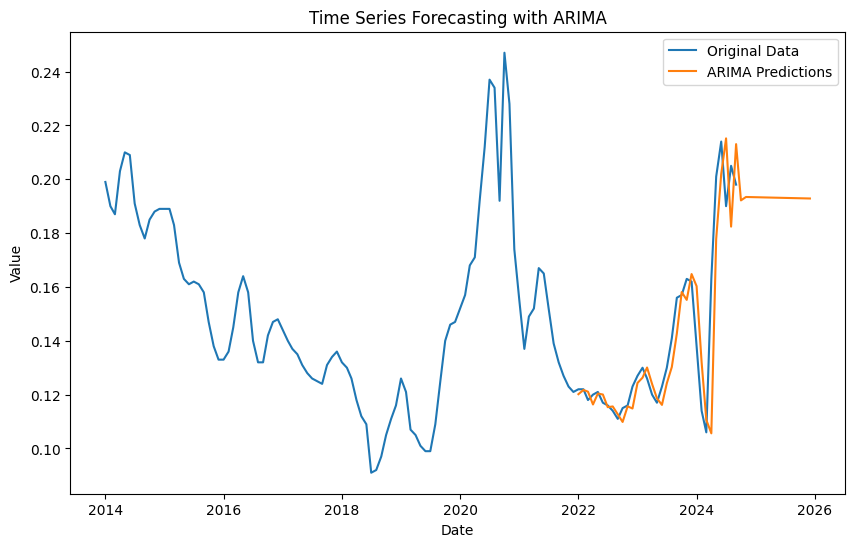

ARIMA - MSE: 0.00018159615775214982, RMSE: 0.013475761861659245, MAPE: 5.34%


In [671]:
model_arima(data_filtered,'Lithuania', '15-24', 'Total')

## 25+, Female

In [672]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='25+', sex='Female')

In [673]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9410
Strong seasonality detected.


(0.9409643607337057, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1011.326, Time=0.90 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-970.685, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1009.555, Time=1.05 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1012.975, Time=1.05 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-977.890, Time=0.49 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1014.621, Time=1.26 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1007.560, Time=2.24 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=-1011.614, Time=0.33 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-999.179, Time=0.83 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1009.197, Time=0.65 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-1013.673, Time=0.25 sec
 ARIMA(0,1,1)(2,1,2)[12]             : AIC=-1011.785, Time=0.96 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1008.964, Time=0.21 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1012.202, Time=0.48 sec
 ARIMA(0

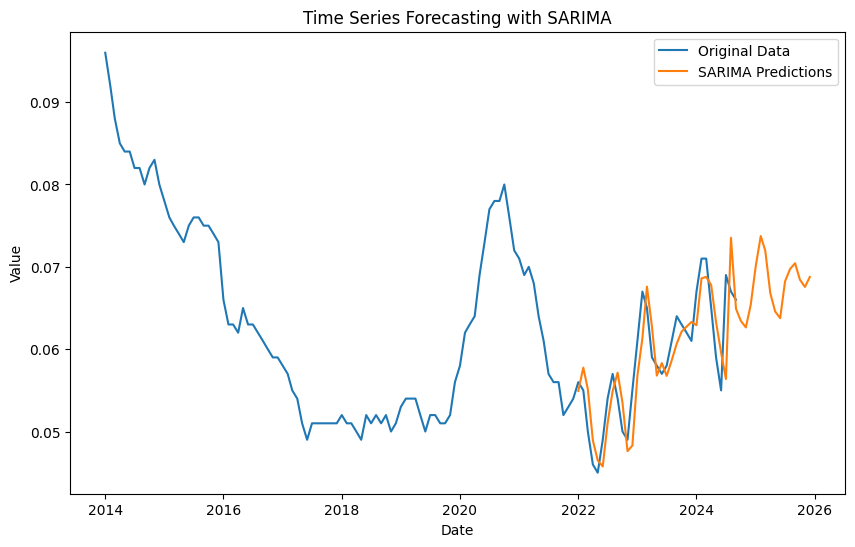

SARIMA - MSE: 1.0396416164542074e-05, RMSE: 0.0032243474013421806, MAPE: 5.02%


In [674]:
model_sarima(data_filtered,'Lithuania', '25+', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1127.130, Time=0.74 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-1079.944, Time=0.05 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-1086.445, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=-1093.864, Time=0.06 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-1081.939, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1092.037, Time=0.30 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-1123.584, Time=0.08 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-1123.687, Time=0.18 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1088.353, Time=0.06 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-1121.199, Time=0.18 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=-1079.915, Time=0.15 sec

Best model:  ARIMA(1,2,1)(0,0,0)[0] intercept
Total fit time: 1.875 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:       

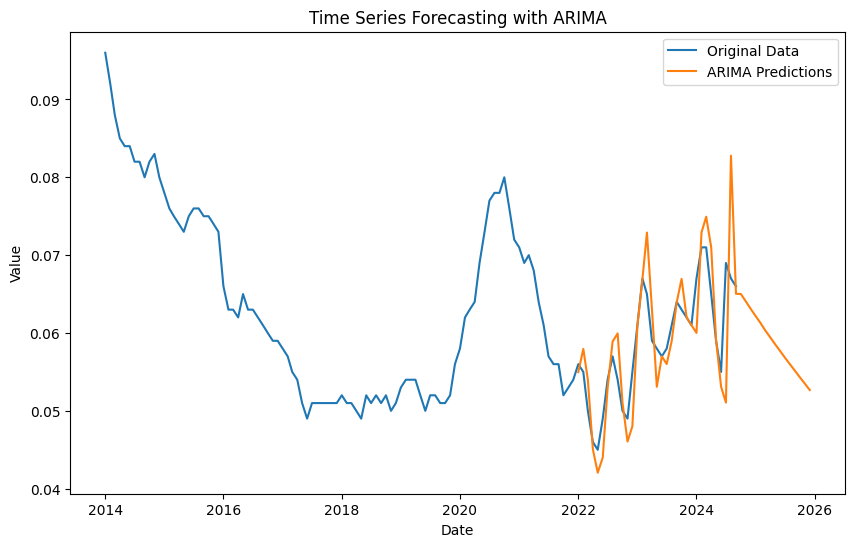

ARIMA - MSE: 1.3101509534845922e-05, RMSE: 0.0036196007424639976, MAPE: 4.79%


In [675]:
model_arima(data_filtered,'Lithuania',  '25+', 'Female')

## 25+, Male

In [676]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='25+', sex='Male')

In [677]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9531
Strong seasonality detected.


(0.9531364626282429, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-957.031, Time=0.98 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-931.494, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-943.655, Time=0.18 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-959.175, Time=0.39 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-930.721, Time=0.10 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-955.259, Time=0.52 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-965.114, Time=1.51 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=2.11 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.10 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=4.22 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=inf, Time=7.23 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=2.25 sec
 ARIMA(1,1,2)(0,1,2)[12]             : AIC=inf, Time=2.57 sec
 ARIMA(0,1,1)(0,1,2)[12] intercept   : AIC=inf, Time=5.73 sec

Best model:  ARIMA(0,1,1)(0,1,2)[12]          
Total 

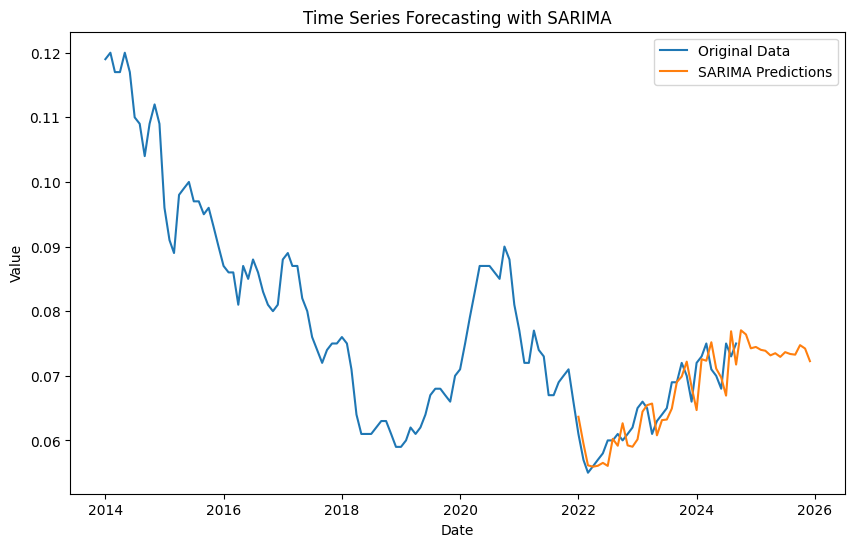

SARIMA - MSE: 7.5421410322101226e-06, RMSE: 0.0027462958748485427, MAPE: 3.43%


In [678]:
model_sarima(data_filtered,'Lithuania', '25+', 'Male')

## 25+, Total

In [679]:
data_filtered = prepare_data(combined_df, country='Lithuania', age='25+', sex='Total')

In [680]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9579
Strong seasonality detected.


(0.9579229100070005, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1005.052, Time=1.39 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-970.460, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-992.389, Time=0.53 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1007.675, Time=0.82 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-969.994, Time=0.48 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1006.311, Time=0.61 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1003.032, Time=0.53 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-991.765, Time=0.88 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-985.580, Time=1.00 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1006.037, Time=0.11 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1007.417, Time=0.37 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1008.131, Time=0.25 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-970.237, Time=0.09 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1006.807, Time=0.29 sec
 ARIMA(1,1,

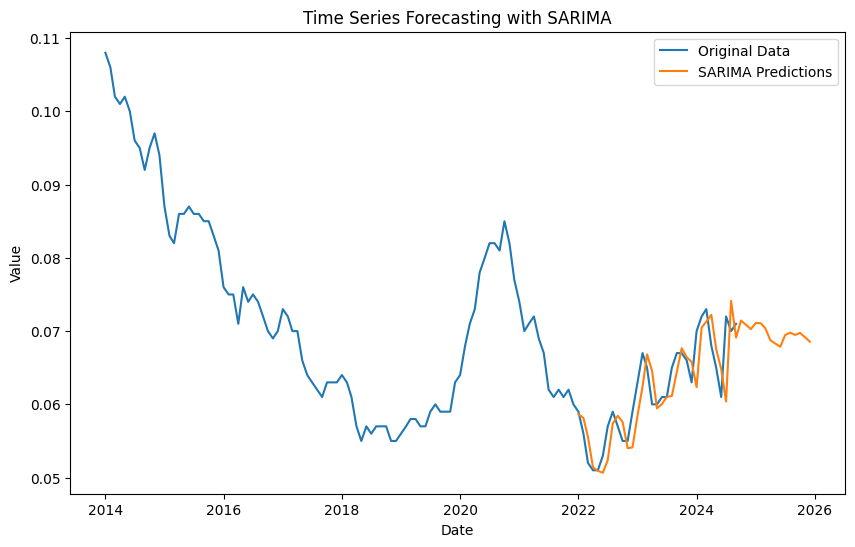

SARIMA - MSE: 9.335884146673009e-06, RMSE: 0.003055467909612701, MAPE: 3.97%


In [681]:
model_sarima(data_filtered,'Lithuania', '25+', 'Total')

# Slovakia

## 15-24, Female

In [682]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='15-24', sex='Female')

In [683]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9150
Strong seasonality detected.


(0.9149539977319746, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-741.036, Time=1.83 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-611.246, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-709.675, Time=0.26 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-728.058, Time=0.41 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-676.591, Time=0.38 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-730.369, Time=0.47 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=1.48 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-712.872, Time=0.50 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-737.828, Time=1.45 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-737.910, Time=0.09 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-745.543, Time=0.34 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-683.142, Time=0.43 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-743.791, Time=1.68 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=inf, Time=1.20 sec
 ARIMA(2,1,1)(1,1,0)[12]     

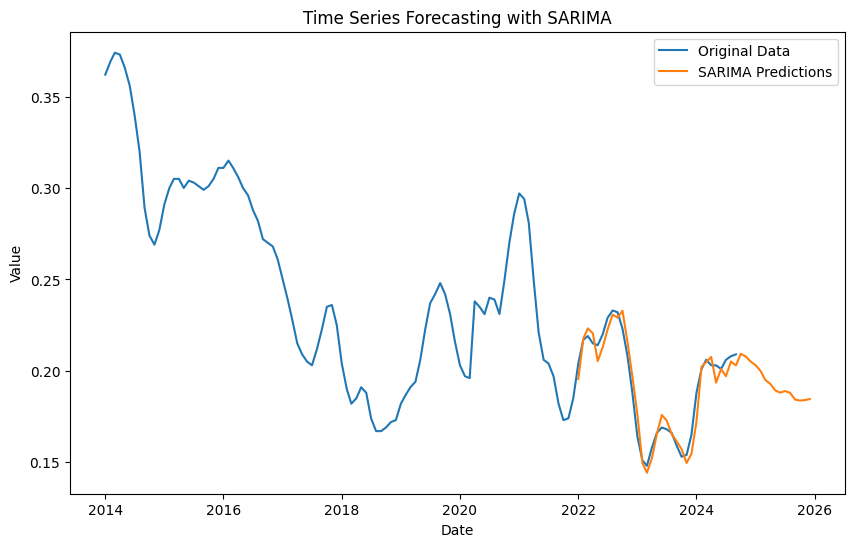

SARIMA - MSE: 4.3954430084916594e-05, RMSE: 0.0066298137292775125, MAPE: 2.87%


In [684]:
model_sarima(data_filtered,'Slovak Republic', '15-24', 'Female')

## 15-24, Male

In [685]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='15-24', sex='Male')

In [686]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9551
Strong seasonality detected.


(0.9550698633372218, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-815.710, Time=1.01 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-717.372, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-793.729, Time=0.22 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-813.601, Time=0.67 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-774.718, Time=0.10 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-817.197, Time=1.40 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-798.029, Time=0.32 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-803.191, Time=1.56 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-812.956, Time=1.14 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-814.136, Time=2.28 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-805.715, Time=1.35 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=-809.012, Time=6.28 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-804.161, Time=0.95 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-814.182, Time=0.91 sec
 ARIMA(2,1,1)(1,1,1

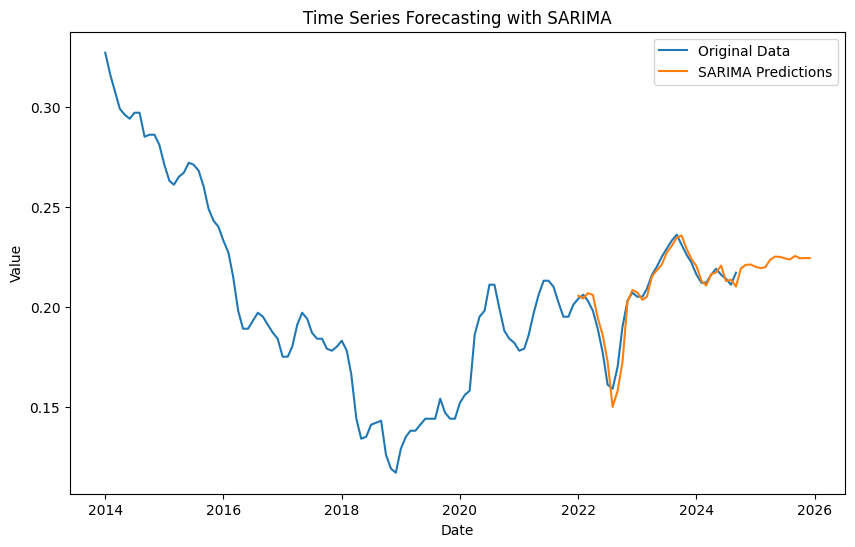

SARIMA - MSE: 3.327396815296963e-05, RMSE: 0.005768359225375066, MAPE: 2.17%


In [687]:
model_sarima(data_filtered,'Slovak Republic', '15-24', 'Male')

## 15-24, Total

In [688]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='15-24', sex='Total')

In [689]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9705
Strong seasonality detected.


(0.9705086691280204, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=7.29 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-758.603, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-806.924, Time=0.24 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-836.374, Time=0.57 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-782.930, Time=0.09 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-829.971, Time=0.54 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.76 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-806.318, Time=0.25 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.60 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-835.940, Time=0.65 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-839.621, Time=0.71 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-783.044, Time=0.05 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-822.517, Time=0.20 sec
 ARIMA(1,1,0)(0,1,2)[12]             : 

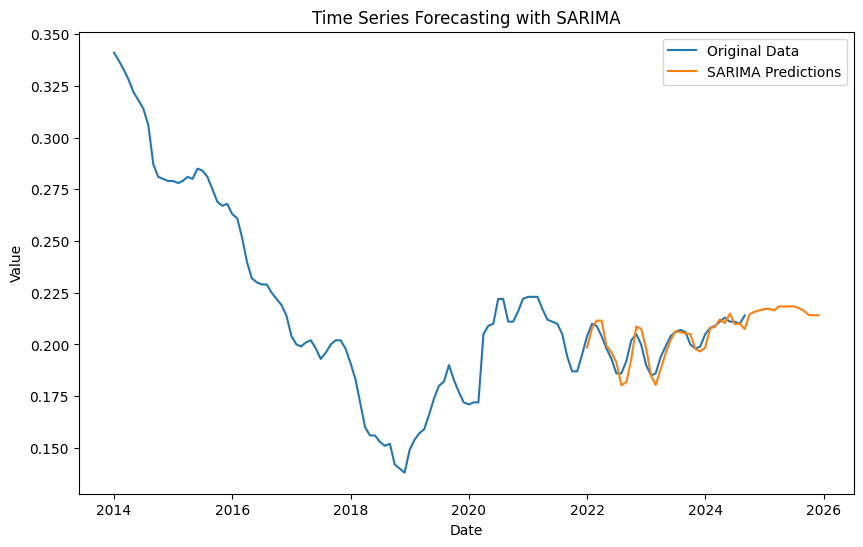

SARIMA - MSE: 2.2340972605636694e-05, RMSE: 0.004726623806231747, MAPE: 1.90%


In [690]:
model_sarima(data_filtered,'Slovak Republic', '15-24', 'Total')

## 25+, Female

In [691]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='25+', sex='Female')

In [692]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9963
Strong seasonality detected.


(0.9963075042842627, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1184.427, Time=0.67 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1119.968, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1174.996, Time=0.11 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1181.898, Time=0.39 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1162.163, Time=0.15 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1173.933, Time=0.35 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=0.42 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1172.906, Time=0.12 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1188.200, Time=0.57 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=-1173.900, Time=1.38 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-1178.221, Time=0.68 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1186.587, Time=0.44 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1190.409, Time=0.44 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=0.38 sec
 ARIMA(1,1,0)(1,1

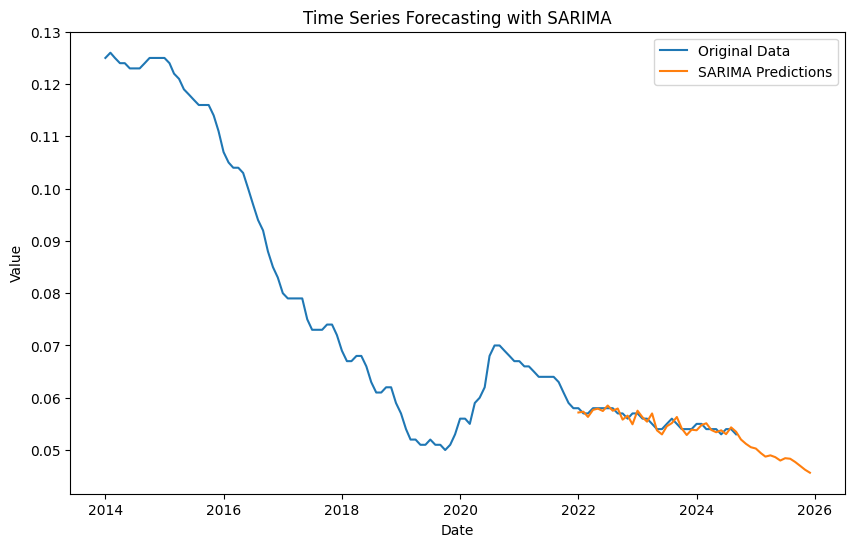

SARIMA - MSE: 7.522481434783733e-07, RMSE: 0.0008673223988104847, MAPE: 1.27%


In [693]:
model_sarima(data_filtered,'Slovak Republic', '25+', 'Female')

## 25+, Male

In [694]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='25+', sex='Male')

In [695]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9979
Strong seasonality detected.


(0.9978879030576164, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1247.347, Time=1.25 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1194.044, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1236.698, Time=0.68 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1233.878, Time=0.78 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1206.069, Time=0.62 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1243.602, Time=0.51 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1202.069, Time=2.98 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1243.971, Time=0.53 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1247.498, Time=0.64 sec
 ARIMA(1,1,1)(2,1,2)[12]             : AIC=-1245.986, Time=1.33 sec
 ARIMA(1,1,1)(2,1,1)[12]             : AIC=-1240.468, Time=0.68 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1230.910, Time=0.92 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1238.916, Time=0.51 sec
 ARIMA(2,1,1)(1,1,2)[12]             : AIC=-1245.402, Time=0.69 sec
 ARIM

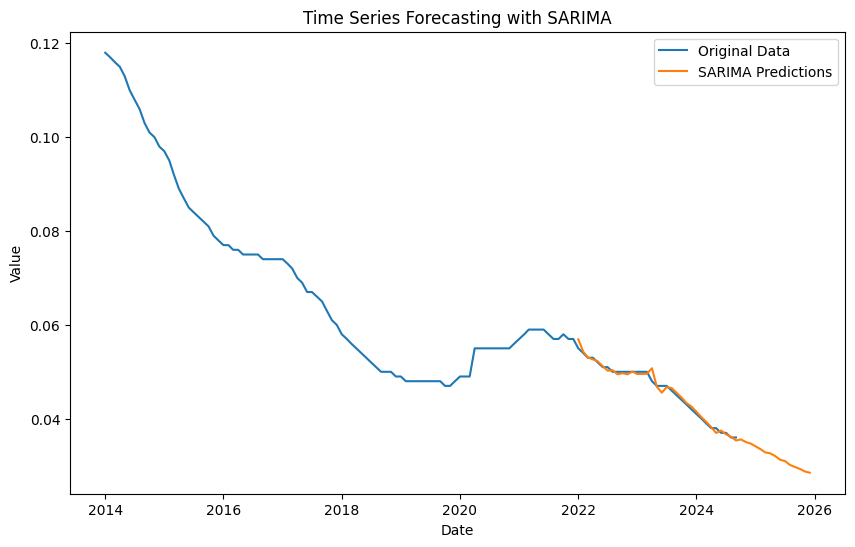

SARIMA - MSE: 6.266706944144647e-07, RMSE: 0.0007916253497800994, MAPE: 1.20%


In [696]:
model_sarima(data_filtered,'Slovak Republic', '25+', 'Male')

## 25+, Total

In [697]:
data_filtered = prepare_data(combined_df, country='Slovak Republic', age='25+', sex='Total')

In [698]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9985
Strong seasonality detected.


(0.9984636299417607, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1256.678, Time=2.20 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1213.562, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1238.446, Time=0.15 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1243.530, Time=0.14 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1225.629, Time=0.20 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1250.172, Time=0.21 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1221.629, Time=0.63 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1245.824, Time=0.15 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.38 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1247.902, Time=0.11 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1253.842, Time=0.19 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1254.007, Time=0.49 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1236.883, Time=0.16 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1247.257, Time=0.28 sec
 ARIMA(2,1,

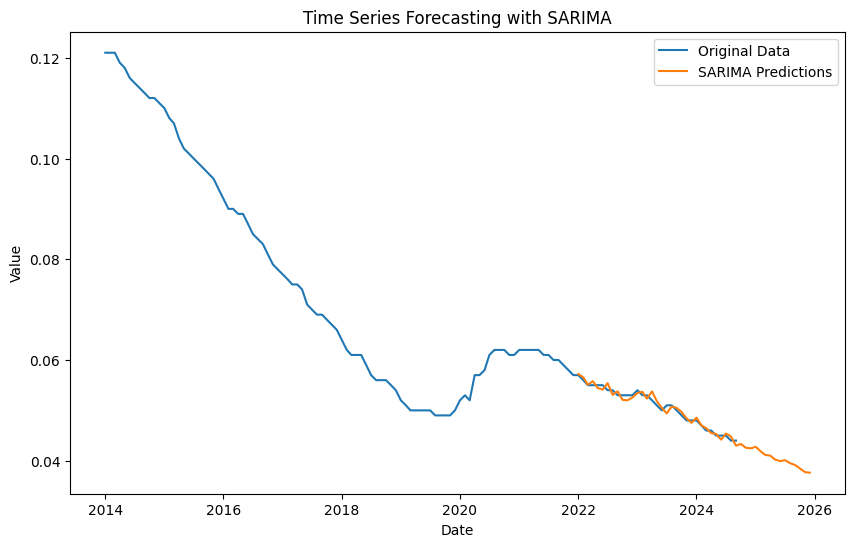

SARIMA - MSE: 5.997742708003341e-07, RMSE: 0.0007744509479627061, MAPE: 1.30%


In [699]:
model_sarima(data_filtered,'Slovak Republic', '25+', 'Total')

# Hungary

## 15-24, Female

In [700]:
data_filtered = prepare_data(combined_df, country='Hungary', age='15-24', sex='Female')

In [701]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9271
Strong seasonality detected.


(0.9271389426881999, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.44 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-725.163, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-759.690, Time=0.22 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.40 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-729.696, Time=0.07 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-777.208, Time=0.70 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-778.701, Time=1.57 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-785.907, Time=0.85 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.30 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.11 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-787.873, Time=1.38 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.10 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=inf, Time=0.63 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-782.632, Time=0.76 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-785.0

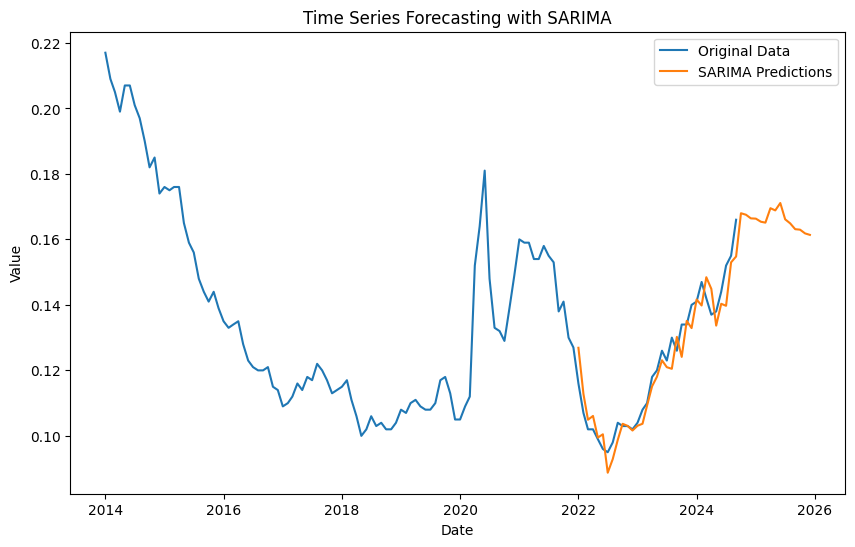

SARIMA - MSE: 2.6030913422855043e-05, RMSE: 0.005102049923594931, MAPE: 3.45%


In [702]:
model_sarima(data_filtered,'Hungary', '15-24', 'Female')

## 15-24, Male

In [703]:
data_filtered = prepare_data(combined_df, country='Hungary', age='15-24', sex='Male')

In [704]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9647
Strong seasonality detected.


(0.9646892366040152, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-821.505, Time=2.27 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-777.316, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-803.109, Time=0.27 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-826.724, Time=0.94 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-786.248, Time=0.09 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-820.291, Time=0.29 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-820.811, Time=0.56 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-803.730, Time=0.22 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-819.610, Time=0.84 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-834.621, Time=0.94 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-795.507, Time=0.20 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=-826.192, Time=0.68 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-835.530, Time=2.44 sec
 ARIMA(0,1,2)(1,1,2)[12]

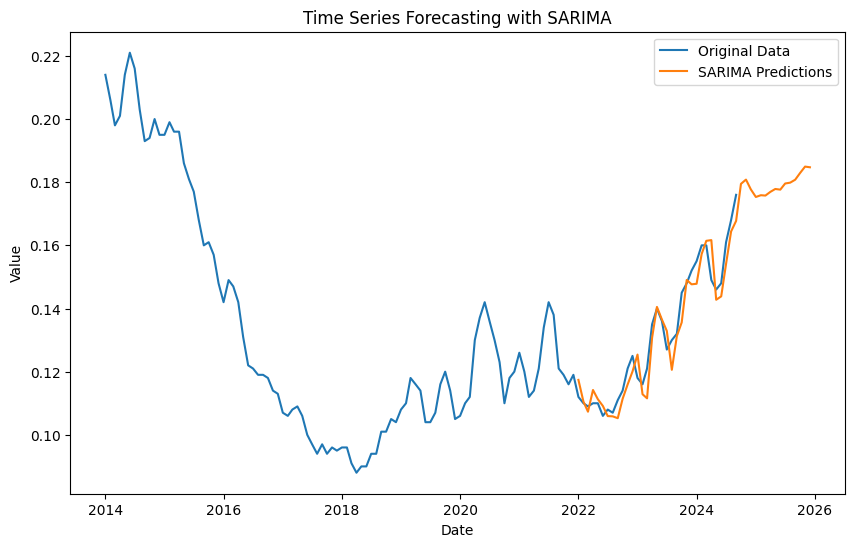

SARIMA - MSE: 2.703865360716412e-05, RMSE: 0.0051998705375388065, MAPE: 3.24%


In [705]:
model_sarima(data_filtered,'Hungary', '15-24', 'Male')

## 15-24, Total

In [706]:
data_filtered = prepare_data(combined_df, country='Hungary', age='15-24', sex='Total')

In [707]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9573
Strong seasonality detected.


(0.957276205179078, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-821.598, Time=0.45 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-774.289, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-804.387, Time=0.29 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-821.589, Time=0.19 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-778.524, Time=0.21 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=1.05 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-827.287, Time=1.82 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.14 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-825.850, Time=0.38 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-829.239, Time=0.95 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-823.624, Time=0.12 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.33 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-827.932, Time=0.66 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-817.555, Time=0.54 sec
 ARIMA(2,1,0)(0,1,2)[12]          

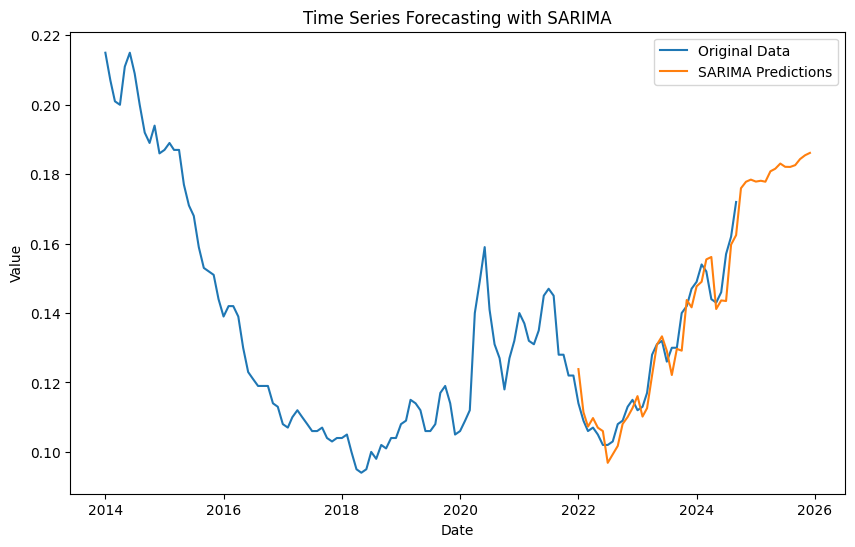

SARIMA - MSE: 2.4114268507181868e-05, RMSE: 0.004910628117377844, MAPE: 3.17%


In [708]:
model_sarima(data_filtered,'Hungary', '15-24', 'Total')

## 25+, Female

In [709]:
data_filtered = prepare_data(combined_df, country='Hungary', age='25+', sex='Female')

In [710]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9896
Strong seasonality detected.


(0.9896422360018663, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1166.264, Time=0.63 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1122.985, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1147.753, Time=0.32 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1169.049, Time=0.42 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1121.500, Time=0.06 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1165.163, Time=0.40 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1117.501, Time=0.22 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1147.802, Time=0.34 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1139.005, Time=0.69 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1170.264, Time=0.30 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1166.583, Time=0.39 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1118.984, Time=0.39 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1149.542, Time=0.09 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-1140.635, Time=0.94 sec
 ARIM

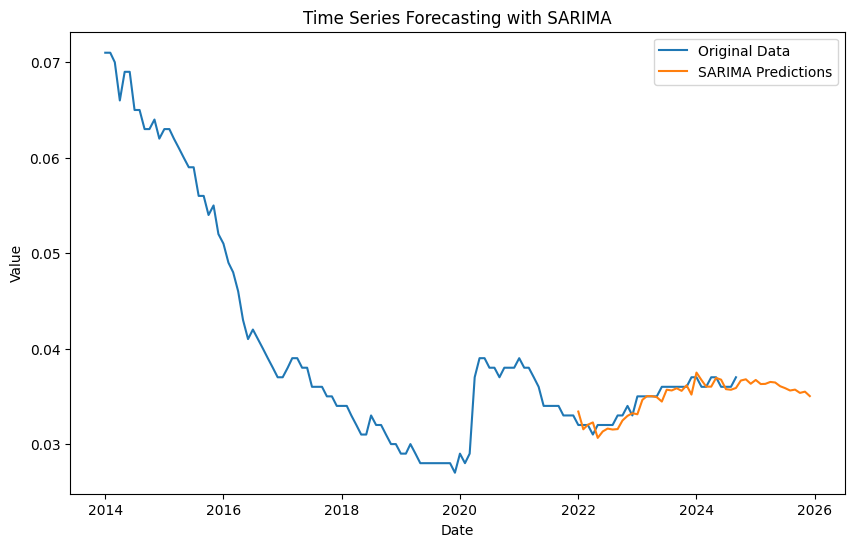

SARIMA - MSE: 7.329444117955374e-07, RMSE: 0.0008561217272067901, MAPE: 1.90%


In [711]:
model_sarima(data_filtered,'Hungary', '25+', 'Female')

## 25+, Male

In [712]:
data_filtered = prepare_data(combined_df, country='Hungary', age='25+', sex='Male')

In [713]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9929
Strong seasonality detected.


(0.9928584849989366, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1209.039, Time=0.97 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1174.267, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1196.860, Time=0.26 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1210.305, Time=0.26 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1172.481, Time=0.12 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1204.537, Time=0.47 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=0.85 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1196.433, Time=0.27 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.07 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1211.739, Time=0.29 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1206.226, Time=0.45 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.61 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1198.512, Time=0.20 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=inf, Time=1.73 sec
 ARIMA(1,1,0)(0,1,1)[12]     

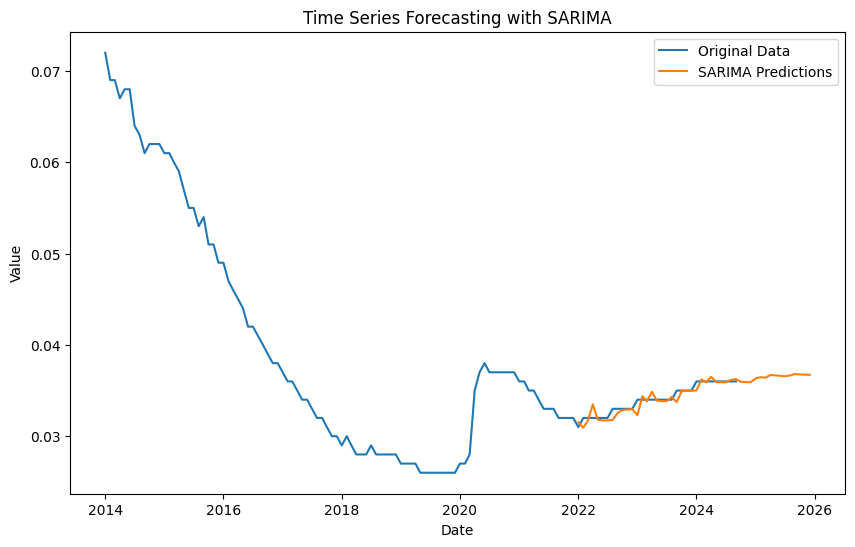

SARIMA - MSE: 4.165087473824761e-07, RMSE: 0.0006453748890237953, MAPE: 1.32%


In [714]:
model_sarima(data_filtered,'Hungary', '25+', 'Male')

## 25+, Total

In [715]:
data_filtered = prepare_data(combined_df, country='Hungary', age='25+', sex='Total')

In [716]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9928
Strong seasonality detected.


(0.9928035179818278, True)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1209.994, Time=1.04 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1170.855, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1195.386, Time=0.10 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1211.507, Time=0.33 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1169.142, Time=0.08 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1206.024, Time=0.55 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=0.81 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1195.266, Time=0.18 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1208.688, Time=1.28 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1212.711, Time=0.21 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1207.390, Time=0.41 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=1.08 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1196.894, Time=0.08 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-1209.548, Time=0.90 sec
 ARIMA(1,1,0)(0,1

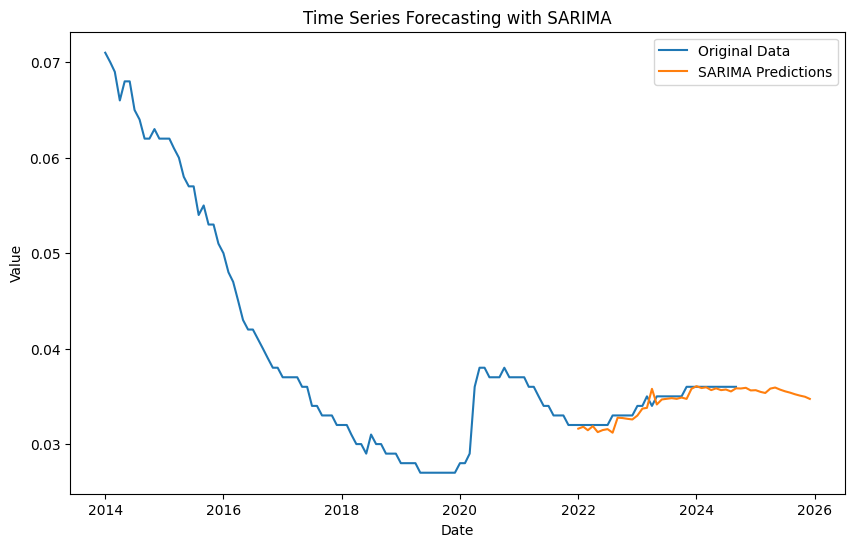

SARIMA - MSE: 4.6361221536440426e-07, RMSE: 0.0006808907514164106, MAPE: 1.46%


In [717]:
model_sarima(data_filtered,'Hungary', '25+', 'Total')

# USA

## 15-24, Male

In [718]:
data_filtered = prepare_data(combined_df, country='United States of America', age='15-24', sex='Male')

In [719]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6633
Weak or no seasonality detected.


(0.6632541493219417, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.82 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-547.148, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-573.776, Time=0.21 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.67 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-546.667, Time=0.02 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-579.640, Time=1.77 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=0.88 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-579.718, Time=0.41 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-574.390, Time=0.15 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.07 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-580.963, Time=0.66 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-574.594, Time=0.17 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=inf, T

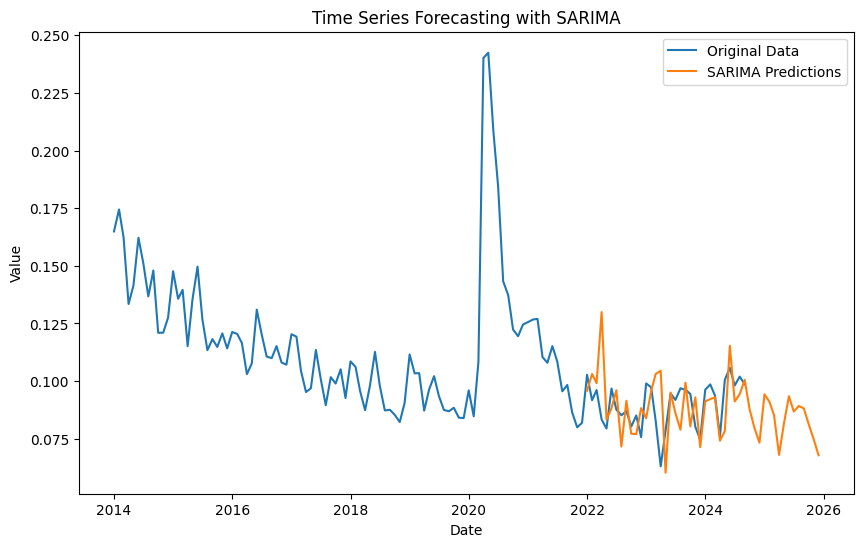

SARIMA - MSE: 0.00023472288631796732, RMSE: 0.01532066859892111, MAPE: 13.09%


In [720]:
model_sarima(data_filtered,'United States of America', '15-24', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-655.996, Time=0.91 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-589.692, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-601.714, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.10 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-591.690, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.35 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-660.228, Time=0.27 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-660.085, Time=0.15 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-658.467, Time=0.30 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-657.256, Time=0.23 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-662.590, Time=0.57 sec
 ARIMA(0,2,3)(0,0,0)[0]             : AIC=inf, Time=0.18 sec

Best model:  ARIMA(0,2,3)(0,0,0)[0] intercept
Total fit time: 3.146 seconds
                               SARIMAX Results                                
Dep. Variable:          

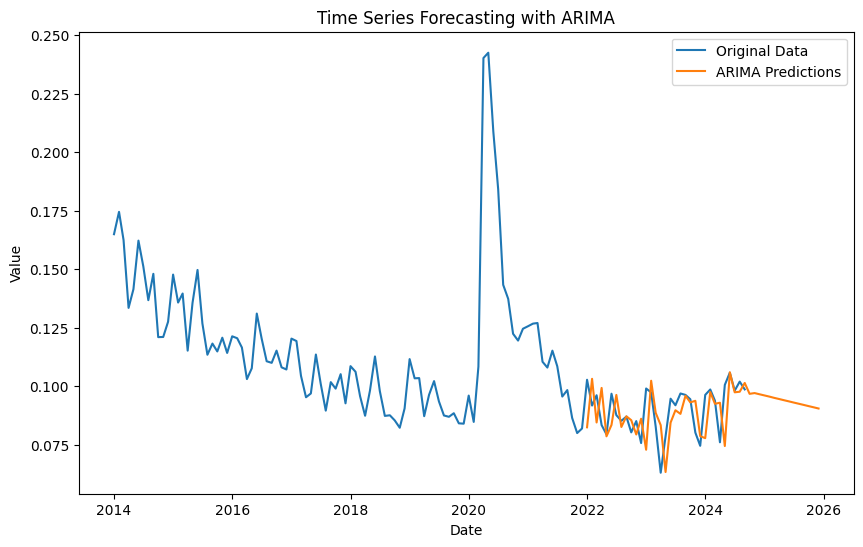

ARIMA - MSE: 0.00014832030310038685, RMSE: 0.012178682322007863, MAPE: 10.84%


In [721]:
model_arima(data_filtered,'United States of America', '15-24', 'Male')

## 15-24, Female

In [722]:
data_filtered = prepare_data(combined_df, country='United States of America', age='15-24', sex='Female')

In [723]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.5897
Weak or no seasonality detected.


(0.5896953440212638, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.18 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-472.505, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-496.818, Time=0.16 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-470.510, Time=0.02 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-504.482, Time=0.81 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=0.93 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=1.11 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-506.482, Time=0.37 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-498.817, Time=0.06 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.27 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.27 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-504.482, Time=1.98 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-510.964, Time=1.07 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=inf, T

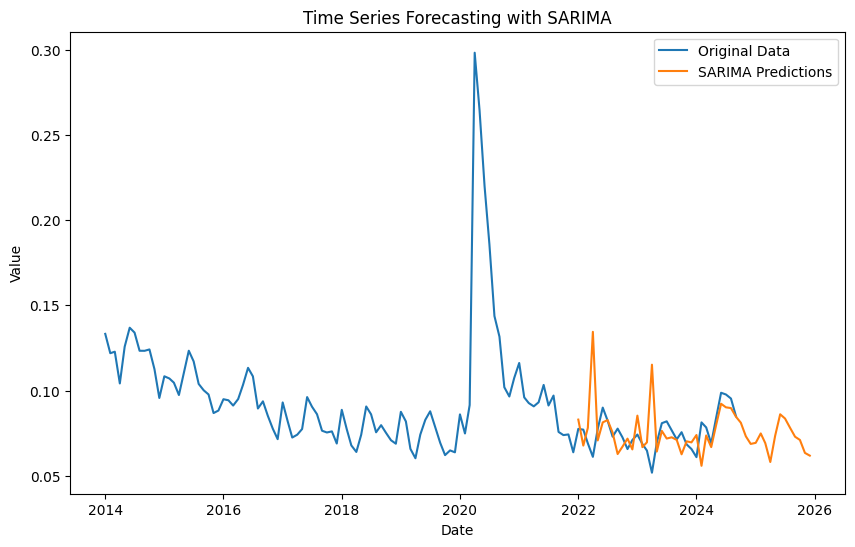

SARIMA - MSE: 0.0003823299117889367, RMSE: 0.019553258341998572, MAPE: 16.56%


In [724]:
model_sarima(data_filtered,'United States of America', '15-24', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.61 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-517.813, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-538.268, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.12 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-519.813, Time=0.04 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-557.324, Time=0.22 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-560.540, Time=0.09 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.50 sec
 ARIMA(3,2,0)(0,0,0)[0]             : AIC=-562.525, Time=0.03 sec
 ARIMA(2,2,0)(0,0,0)[0]             : AIC=-559.320, Time=0.03 sec
 ARIMA(3,2,1)(0,0,0)[0]             : AIC=inf, Time=0.22 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=0.16 sec

Best model:  ARIMA(3,2,0)(0,0,0)[0]          
Total fit time: 2.331 seconds
                               SARIMAX Results      

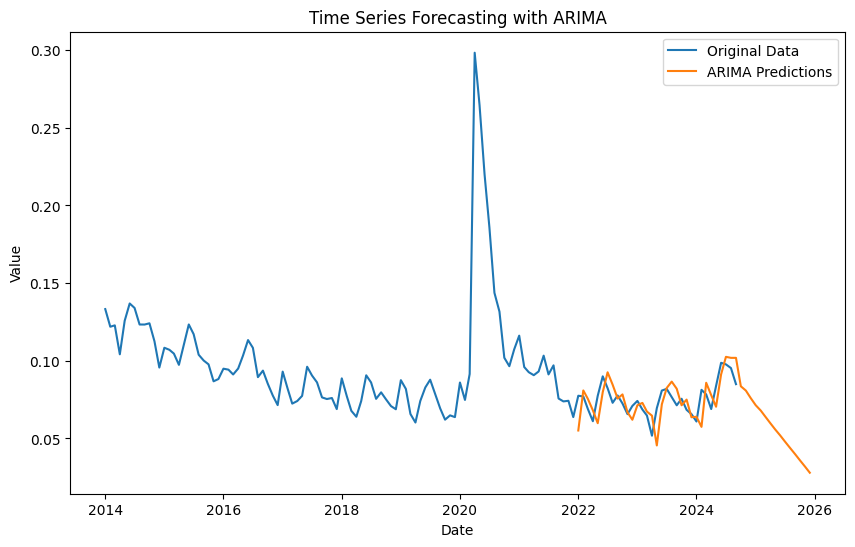

ARIMA - MSE: 0.00011541800001900422, RMSE: 0.01074327696836511, MAPE: 11.80%


In [725]:
model_arima(data_filtered,'United States of America', '15-24', 'Female')

## 15-24, Total

In [726]:
data_filtered = prepare_data(combined_df, country='United States of America', age='15-24', sex='Total')

In [727]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6263
Weak or no seasonality detected.


(0.6263438057495727, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=0.85 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-515.659, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-541.392, Time=0.21 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-514.452, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-548.098, Time=0.25 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=0.80 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.64 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-549.185, Time=0.49 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-542.619, Time=0.31 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.05 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.46 sec
 ARIMA(0,1,1)(2,1,0)[12]             : AIC=-548.647, Time=0.30 sec
 ARIMA(1,1,1)(2,1,0)[12]             : AIC=-546.809, Time=0.34 sec
 ARIMA(0,1,0)(2,1,0)[12] intercept   : AIC=-547.2

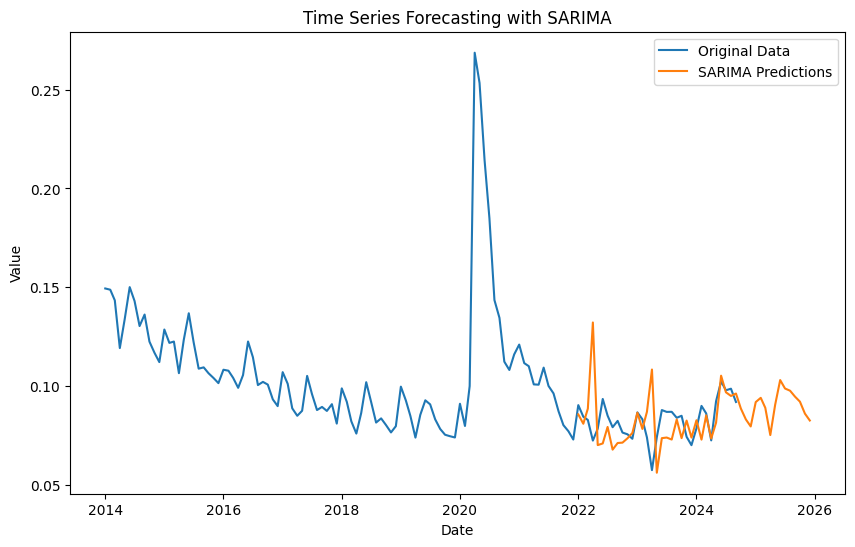

SARIMA - MSE: 0.00029533159913220394, RMSE: 0.017185214550077748, MAPE: 14.57%


In [728]:
model_sarima(data_filtered,'United States of America', '15-24', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.76 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-567.811, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-581.492, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-569.811, Time=0.02 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-601.689, Time=0.19 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-605.283, Time=0.36 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-636.931, Time=0.32 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-641.533, Time=0.19 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-634.467, Time=0.24 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.33 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-635.413, Time=0.35 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=0.19 sec

Best model:  ARIMA(2,2,1)(0,0,0)[0] intercept
Total fit time: 3.098 seconds
                               SARIMAX Res

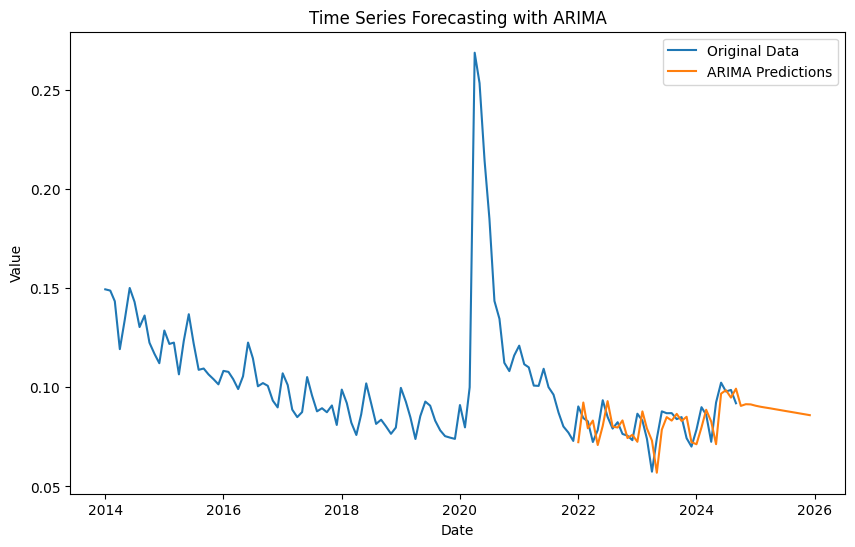

ARIMA - MSE: 8.777499150432641e-05, RMSE: 0.009368830850449079, MAPE: 9.51%


In [729]:
model_arima(data_filtered,'United States of America', '15-24', 'Total')

## 25+, Male

In [730]:
data_filtered = prepare_data(combined_df, country='United States of America', age='25+', sex='Male')

In [731]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6994
Weak or no seasonality detected.


(0.6994129379486602, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.26 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-700.183, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-726.114, Time=0.07 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.36 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-698.248, Time=0.05 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-733.001, Time=0.82 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=4.26 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-753.543, Time=1.44 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-750.714, Time=0.17 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.18 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=0.70 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=inf, Time=0.75 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.56 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=-750.861, Time=0.93 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-752.188, T

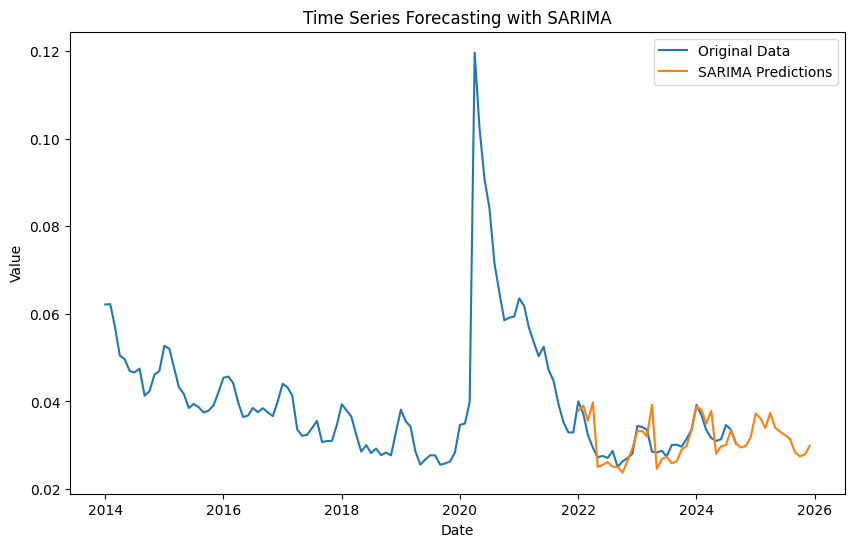

SARIMA - MSE: 1.2761958039963574e-05, RMSE: 0.0035723882823628754, MAPE: 8.29%


In [732]:
model_sarima(data_filtered,'United States of America', '25+', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-831.983, Time=0.22 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-770.122, Time=0.05 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-800.891, Time=0.04 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.58 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-772.121, Time=0.04 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-849.585, Time=0.28 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-817.523, Time=0.08 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-847.328, Time=0.77 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-848.025, Time=0.26 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.31 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-819.090, Time=0.07 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-843.127, Time=0.45 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=0.45 sec

Best model:  ARIMA(2,2,1)(0,0,0)[0] intercept
Total fit time: 3.603 seconds
                               SARIMA

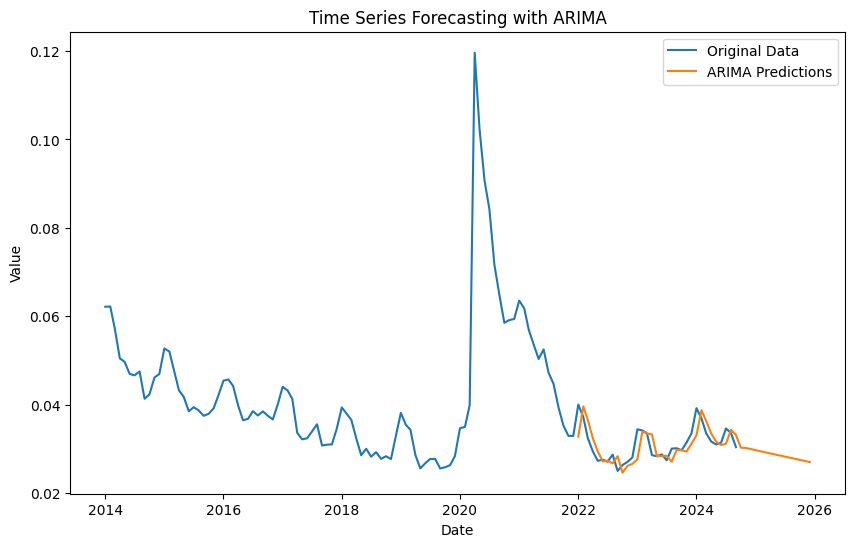

ARIMA - MSE: 8.37262217820293e-06, RMSE: 0.002893548371498726, MAPE: 6.62%


In [733]:
model_arima(data_filtered,'United States of America', '25+', 'Male')

## 25+, Female

In [734]:
data_filtered = prepare_data(combined_df, country='United States of America', age='25+', sex='Female')

In [735]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6430
Weak or no seasonality detected.


(0.6430222497351097, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-697.227, Time=3.12 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-641.211, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-667.227, Time=1.43 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-695.584, Time=0.56 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-637.212, Time=0.50 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=2.43 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=1.59 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-665.203, Time=0.58 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=3.31 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=1.62 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-694.823, Time=1.71 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=inf, Time=1.93 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.34 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=inf, Time=0.67 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=inf, Time=0

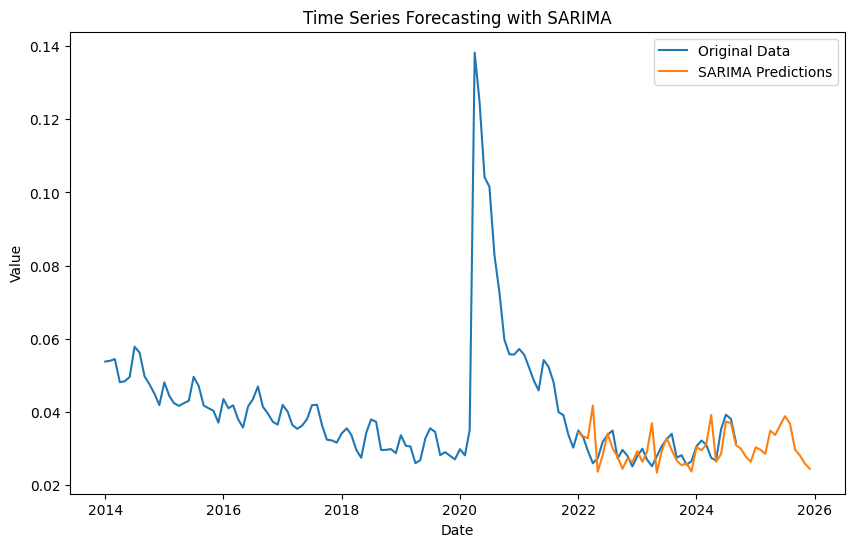

SARIMA - MSE: 2.4837842090641686e-05, RMSE: 0.0049837578282498525, MAPE: 11.44%


In [736]:
model_sarima(data_filtered,'United States of America', '25+', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.77 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-711.639, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-733.820, Time=0.02 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.19 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-713.637, Time=0.03 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-753.628, Time=0.14 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-755.214, Time=0.39 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-786.548, Time=0.32 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-777.787, Time=0.22 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-776.783, Time=0.38 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-786.990, Time=0.27 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-787.110, Time=0.22 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=-783.277, Time=0.18 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-779.859, Time=0.17 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-

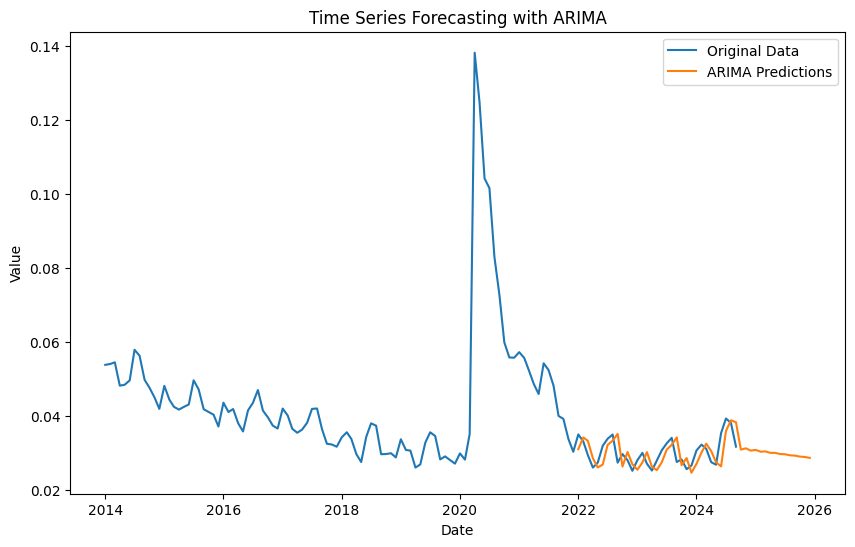

ARIMA - MSE: 1.2272455814523708e-05, RMSE: 0.0035032065046930517, MAPE: 9.89%


In [737]:
model_arima(data_filtered,'United States of America', '25+', 'Female')

## 25+, Total

In [738]:
data_filtered = prepare_data(combined_df, country='United States of America', age='25+', sex='Total')

In [739]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6655
Weak or no seasonality detected.


(0.6654966910814204, False)

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.30 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-672.409, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-698.234, Time=0.19 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.76 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-670.410, Time=0.02 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-707.515, Time=0.61 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.51 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-709.515, Time=0.46 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-700.583, Time=0.11 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=inf, Time=1.31 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-725.010, Time=0.21 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0

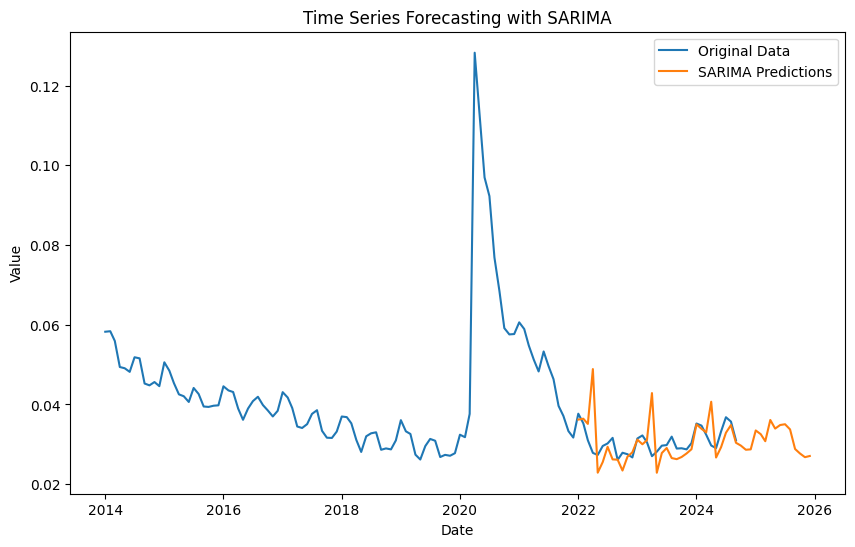

SARIMA - MSE: 3.4167023545532684e-05, RMSE: 0.005845256499550099, MAPE: 12.27%


In [740]:
model_sarima(data_filtered,'United States of America', '25+', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-809.234, Time=0.55 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-744.429, Time=0.04 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-770.406, Time=0.06 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-746.427, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-823.914, Time=0.27 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-788.985, Time=0.12 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-821.514, Time=0.26 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-821.924, Time=0.38 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-821.358, Time=0.24 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-790.826, Time=0.16 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-817.871, Time=0.40 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=inf, Time=0.21 sec

Best model:  ARIMA(2,2,1)(0,0,0)[0] intercept
Total fit time: 2.896 seconds
                               S

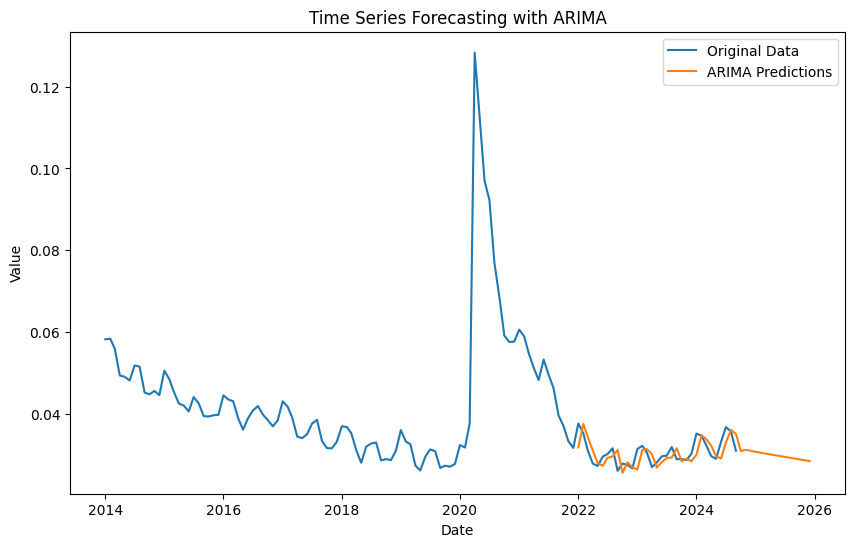

ARIMA - MSE: 7.152956555383368e-06, RMSE: 0.0026745011787964066, MAPE: 6.97%


In [741]:
model_arima(data_filtered,'United States of America', '25+', 'Total')

# Germany

## 15-24 Male

In [742]:
data_filtered = prepare_data(combined_df, country='Germany', age='15-24', sex='Male')


In [743]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9804
Strong seasonality detected.


(0.9803901146392153, True)

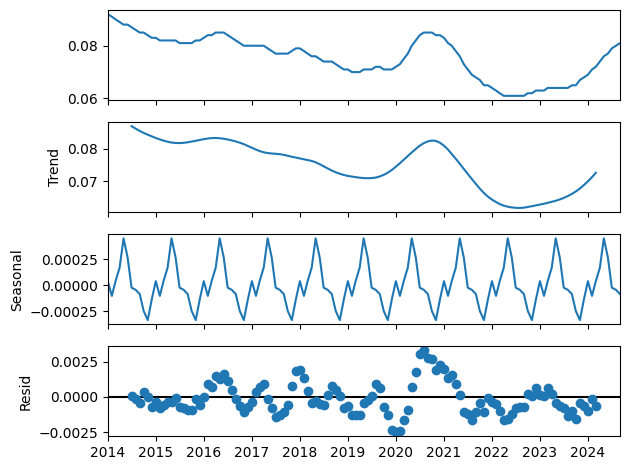

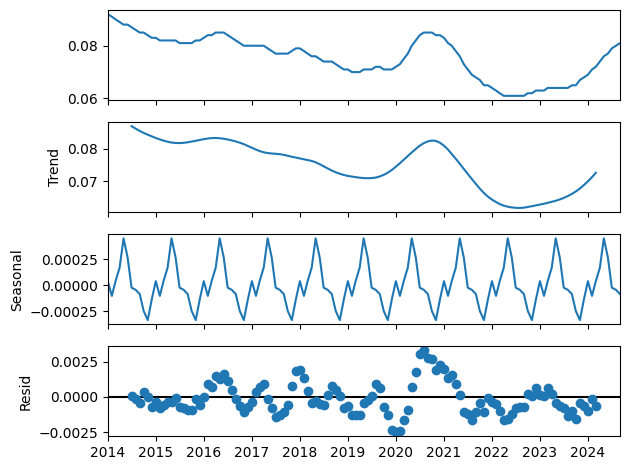

In [744]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1315.958, Time=1.74 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1175.571, Time=0.03 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1299.853, Time=0.47 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1260.870, Time=0.23 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1286.420, Time=0.35 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1306.203, Time=0.29 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1282.420, Time=0.63 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1305.955, Time=0.45 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1301.905, Time=1.10 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1308.713, Time=0.53 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1315.946, Time=0.71 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1319.254, Time=0.62 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-1289.934, Time=0.72 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-1310.409, Time=1.87 sec
 ARIM

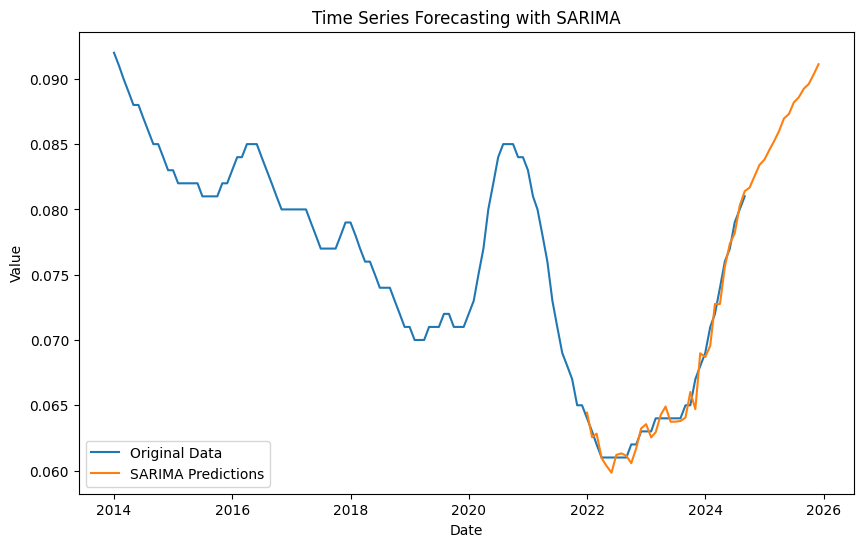

SARIMA - MSE: 6.887078926428319e-07, RMSE: 0.0008298842646073198, MAPE: 1.01%


In [745]:
model_sarima(data_filtered,'Germany', '15-24', 'Male')


## 15-24 Female

In [746]:
data_filtered = prepare_data(combined_df, country='Germany', age='15-24', sex='Female')


In [747]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9625
Strong seasonality detected.


(0.9624923988131292, True)

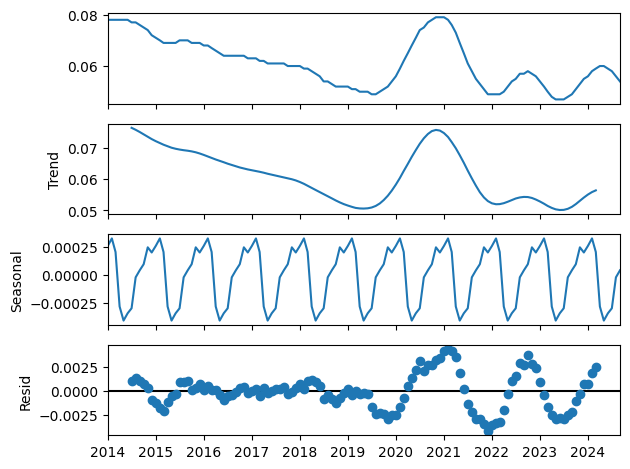

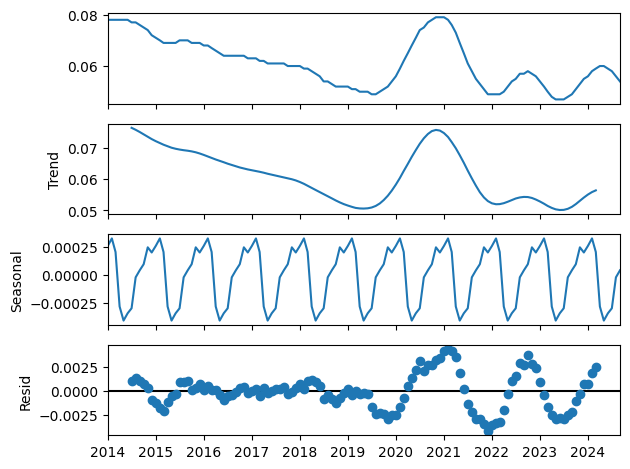

In [748]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1230.593, Time=0.74 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1061.582, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1247.621, Time=0.34 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1138.851, Time=0.23 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1233.864, Time=0.06 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-1245.188, Time=0.59 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1248.606, Time=0.32 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1231.857, Time=0.24 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-1247.681, Time=1.24 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1237.477, Time=0.23 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1229.868, Time=0.99 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=-1257.674, Time=0.72 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=-1115.489, Time=0.40 sec
 ARIMA(2,1,0)(2,1,2)[12]             : AIC=-1261.818, Time=0.57 sec
 ARIM

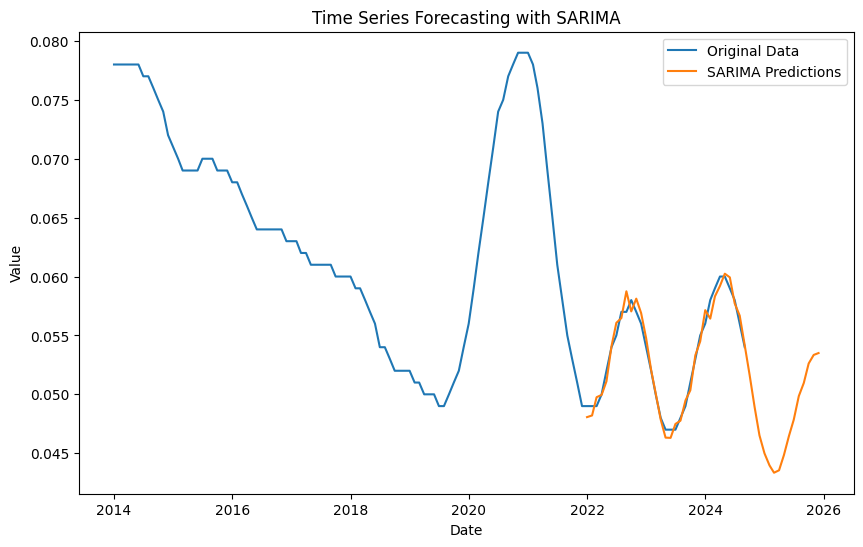

SARIMA - MSE: 6.343090202169796e-07, RMSE: 0.0007964351952400016, MAPE: 1.26%


In [749]:
model_sarima(data_filtered,'Germany', '15-24', 'Female')


## 15-24 Total

In [750]:
data_filtered = prepare_data(combined_df, country='Germany', age='15-24', sex='Total')


In [751]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9773
Strong seasonality detected.


(0.977264931991003, True)

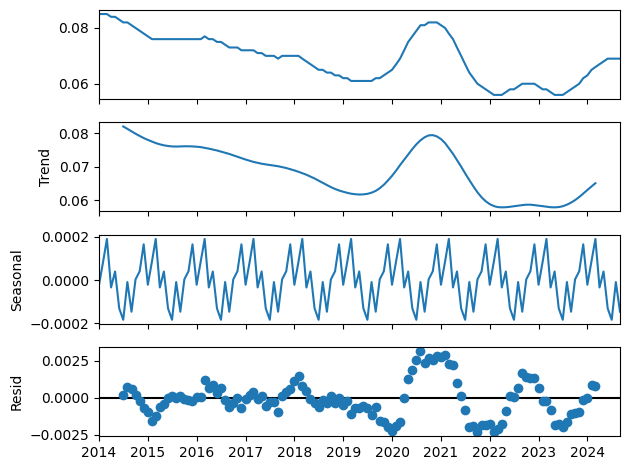

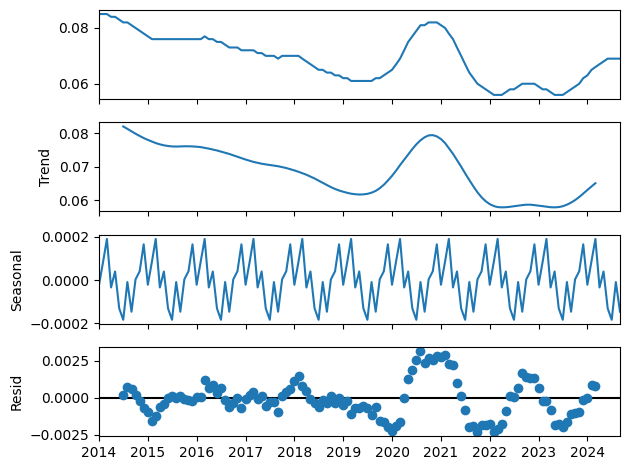

In [752]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1333.713, Time=0.72 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1131.651, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1294.705, Time=2.05 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1247.273, Time=1.49 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1278.034, Time=0.66 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1309.092, Time=0.69 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1274.029, Time=0.28 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1307.261, Time=0.70 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1300.431, Time=2.06 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1321.475, Time=0.19 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1144.870, Time=0.73 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1352.191, Time=0.52 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-1302.647, Time=0.07 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-1324.737, Time=2.04 sec
 ARIM

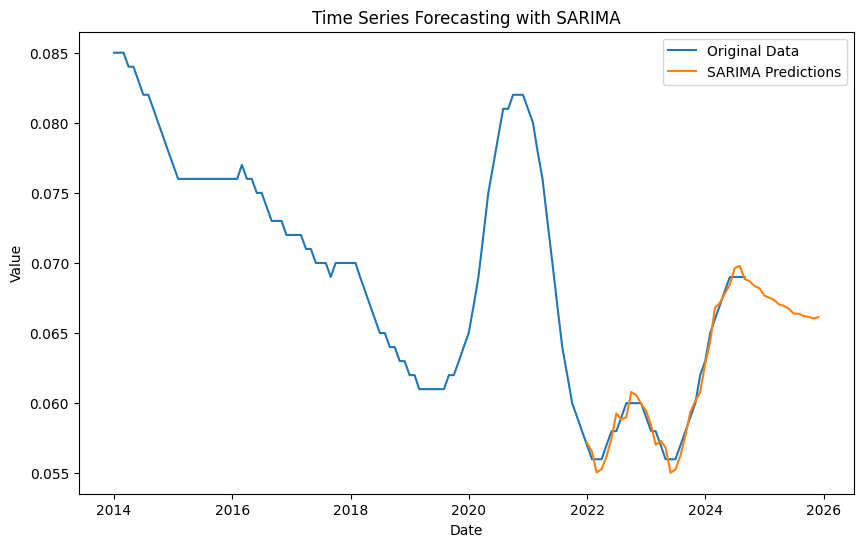

SARIMA - MSE: 4.479887087150975e-07, RMSE: 0.0006693195863823929, MAPE: 0.98%


In [753]:
model_sarima(data_filtered,'Germany', '15-24', 'Total')


## 25+ Male

In [754]:
data_filtered = prepare_data(combined_df, country='Germany', age='25+', sex='Male')


In [755]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9907
Strong seasonality detected.


(0.9906692475650001, True)

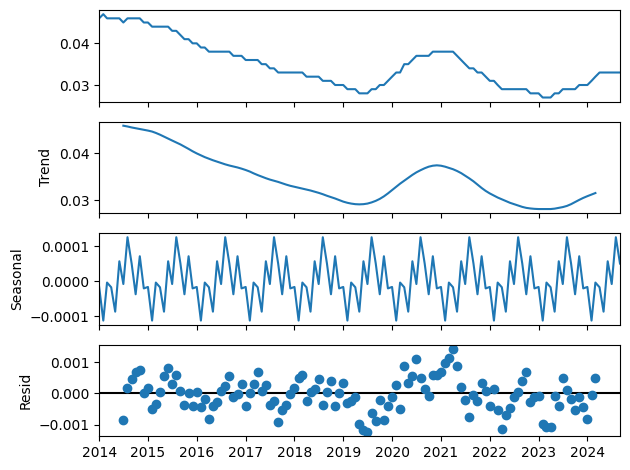

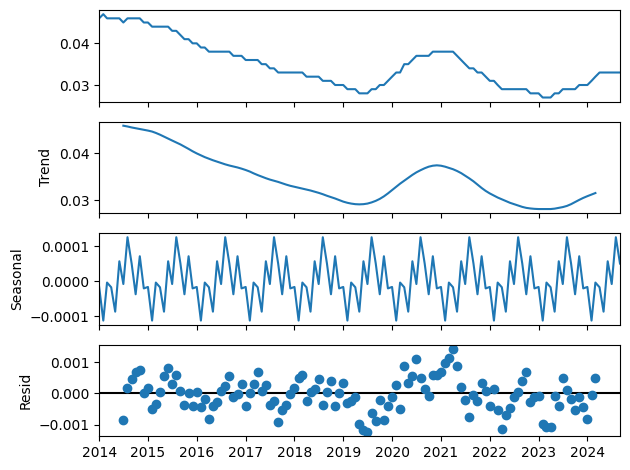

In [756]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1345.561, Time=1.13 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1289.788, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1311.346, Time=0.46 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1336.950, Time=0.66 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1296.801, Time=0.27 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1333.982, Time=0.62 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1292.800, Time=0.56 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1317.815, Time=0.40 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1312.607, Time=0.89 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1338.645, Time=0.38 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1357.365, Time=0.65 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1307.002, Time=0.26 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1347.386, Time=0.90 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1303.002, Time=0.61 sec
 ARIM

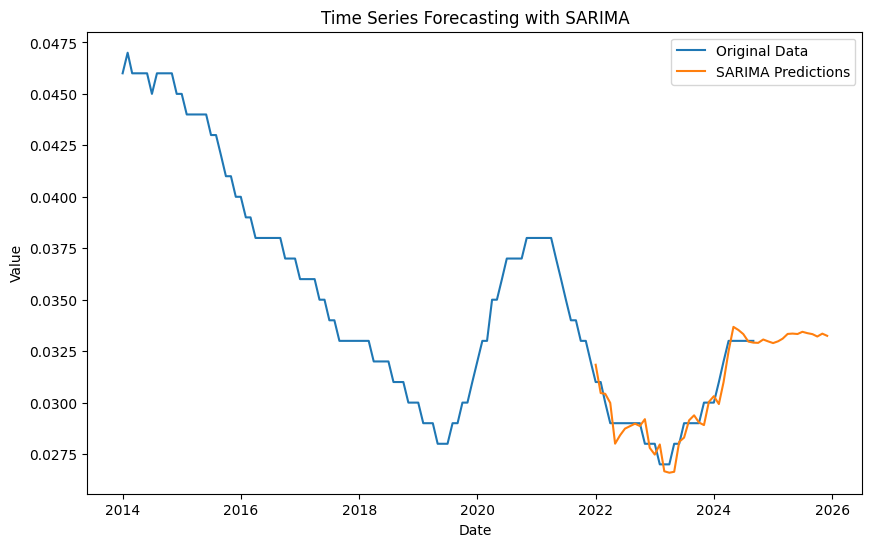

SARIMA - MSE: 4.501325197936181e-07, RMSE: 0.0006709191604013245, MAPE: 1.86%


In [757]:
model_sarima(data_filtered,'Germany', '25+', 'Male')


## 25+ Female

In [758]:
data_filtered = prepare_data(combined_df, country='Germany', age='25+', sex='Female')


In [759]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9873
Strong seasonality detected.


(0.9873291695769603, True)

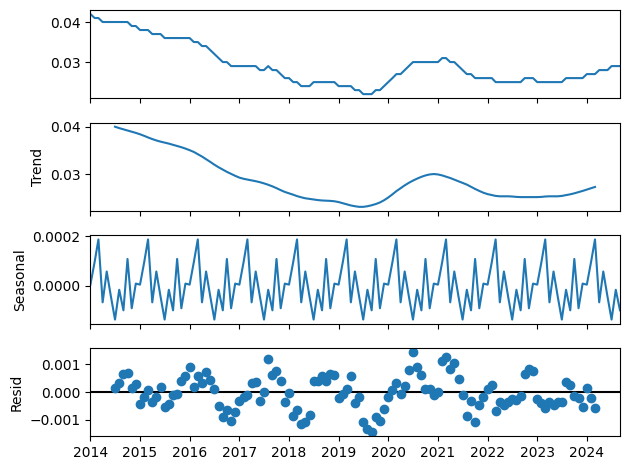

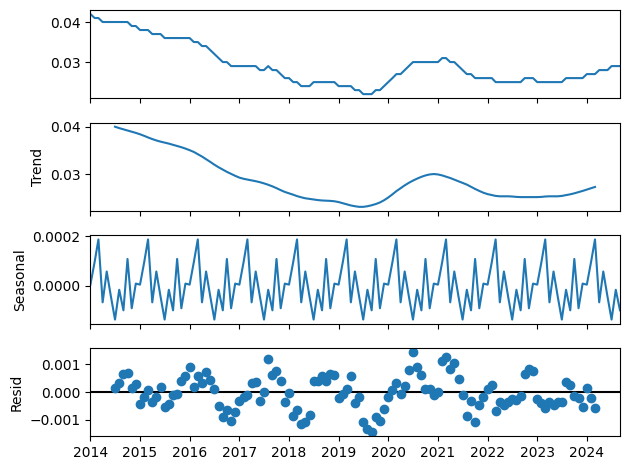

In [760]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1370.970, Time=1.14 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1304.784, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1346.052, Time=0.26 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1363.284, Time=0.65 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1312.670, Time=0.18 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1366.939, Time=0.93 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1330.693, Time=1.03 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1349.652, Time=0.44 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.22 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1366.066, Time=0.41 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1373.260, Time=0.81 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-1316.740, Time=0.79 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-1367.314, Time=1.63 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=-1333.603, Time=2.41 sec
 ARIMA(2,1,

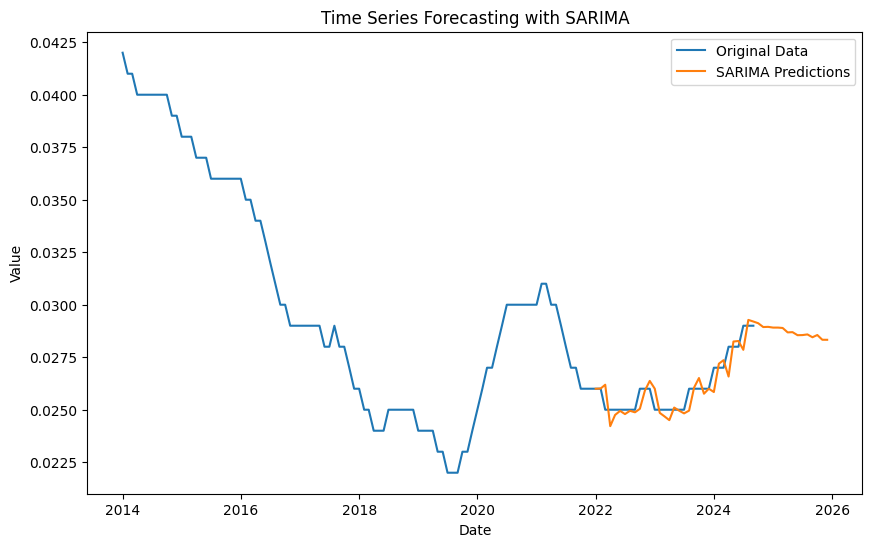

SARIMA - MSE: 3.2315969333236576e-07, RMSE: 0.0005684713654462868, MAPE: 1.52%


In [761]:
model_sarima(data_filtered,'Germany', '25+', 'Female')


## 25+ Total

In [762]:
data_filtered = prepare_data(combined_df, country='Germany', age='25+', sex='Total')

In [763]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9907
Strong seasonality detected.


(0.9907115192745352, True)

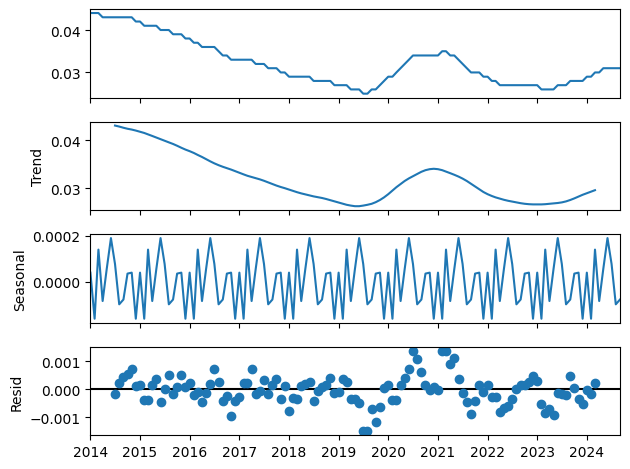

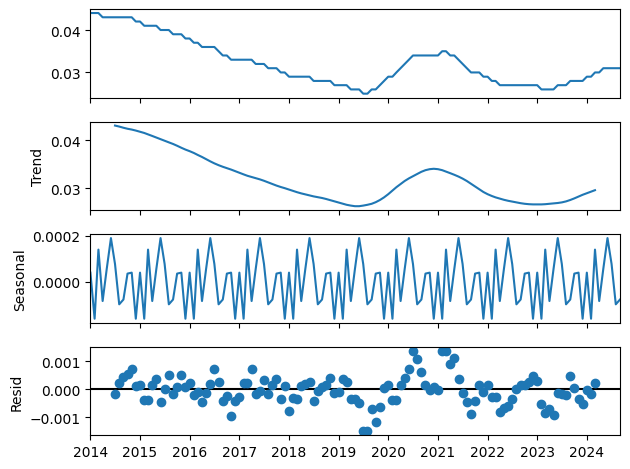

In [764]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1383.207, Time=1.35 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1315.975, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1342.343, Time=0.53 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1372.742, Time=0.62 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-998.619, Time=0.14 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1321.322, Time=0.90 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1337.925, Time=1.96 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1314.532, Time=0.61 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1313.041, Time=1.93 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1376.150, Time=0.35 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-1362.453, Time=0.67 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1387.113, Time=0.54 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-1329.880, Time=0.28 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-1378.616, Time=1.03 sec
 ARIMA

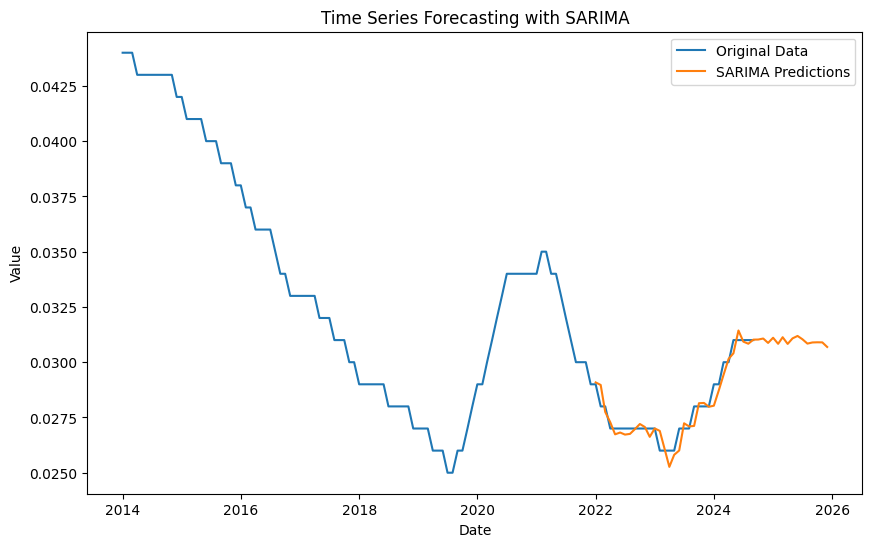

SARIMA - MSE: 2.2272056022025177e-07, RMSE: 0.00047193279205862756, MAPE: 1.28%


In [765]:
model_sarima(data_filtered,'Germany', '25+', 'Total')


# Ireland

## 15-24 Male

In [766]:
data_filtered = prepare_data(combined_df, country='Ireland', age='15-24', sex='Male')


In [767]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9206
Strong seasonality detected.


(0.9205856394501246, True)

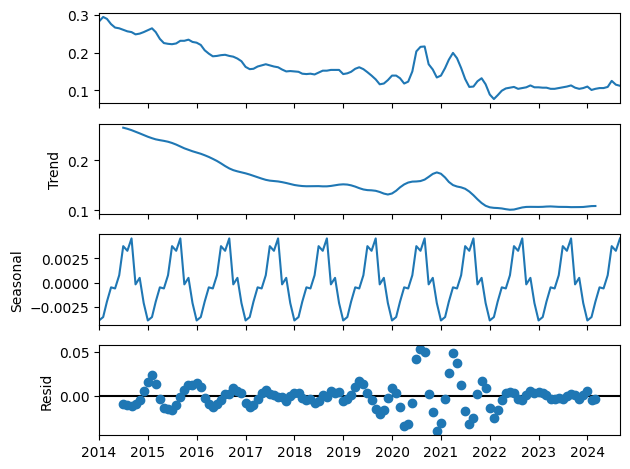

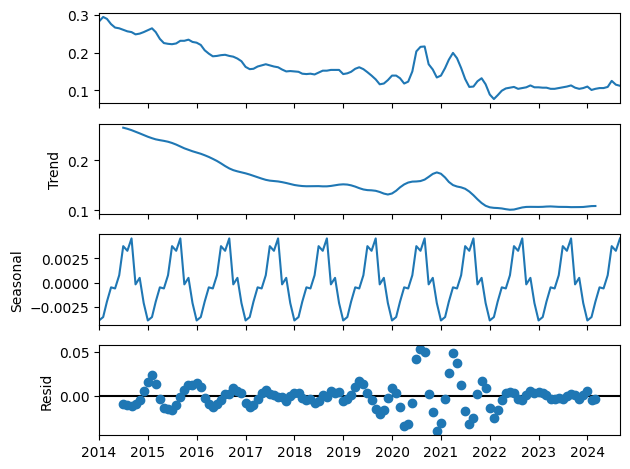

In [768]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-717.494, Time=2.51 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-604.514, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-683.729, Time=0.88 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-710.137, Time=1.07 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-654.521, Time=0.37 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-715.350, Time=0.79 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-717.391, Time=1.75 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-690.388, Time=0.36 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-714.954, Time=1.39 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-712.386, Time=0.19 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-723.542, Time=0.63 sec
 ARIMA(2,1,1)(0,1,0)[12]             : AIC=-679.179, Time=0.39 sec
 ARIMA(2,1,1)(1,1,1)[12]             : AIC=-741.275, Time=0.74 sec
 ARIMA(2,1,1)(1,1,0)[12]             : AIC=-729.050, Time=0.42 sec
 ARIMA(2,1,1)(2,1,1

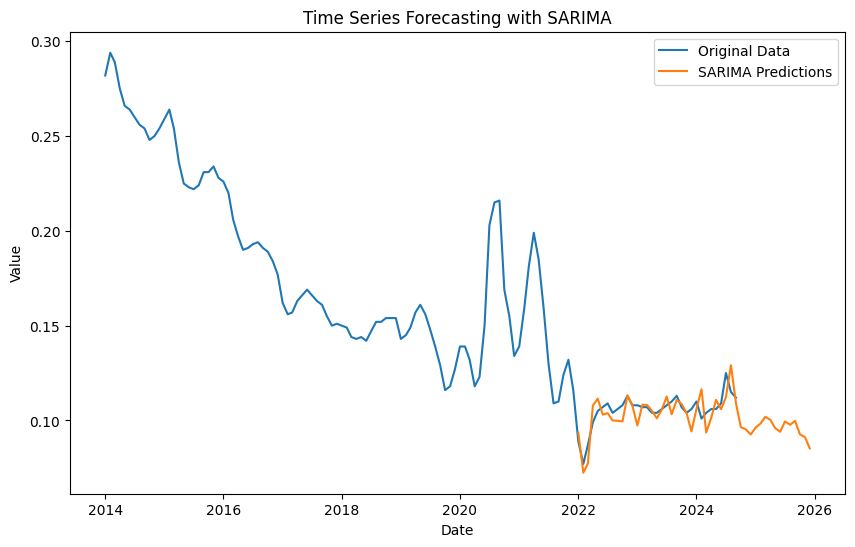

SARIMA - MSE: 3.9507934750815305e-05, RMSE: 0.006285533768170791, MAPE: 4.86%


In [769]:
model_sarima(data_filtered,'Ireland', '15-24', 'Male')


## 15-24 Female

In [770]:
data_filtered = prepare_data(combined_df, country='Ireland', age='15-24', sex='Female')

In [771]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.8630
Strong seasonality detected.


(0.8630013986084221, True)

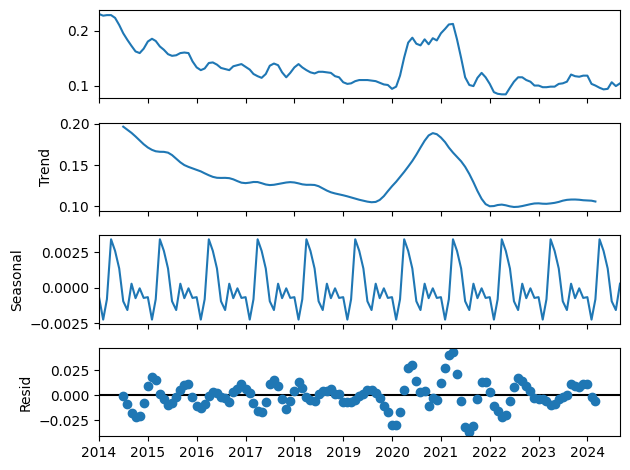

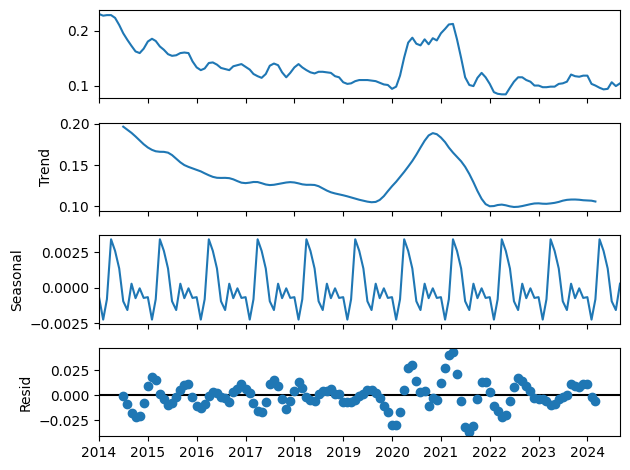

In [772]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()


Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-762.455, Time=0.87 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-648.430, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-732.871, Time=0.51 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-751.925, Time=0.94 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-713.230, Time=0.08 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-757.608, Time=1.06 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-760.142, Time=1.61 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-736.685, Time=0.26 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.37 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-760.483, Time=0.18 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-748.363, Time=1.61 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-772.820, Time=0.41 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-726.615, Time=0.28 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-742.072, Time=0.19 sec
 ARIMA(1,1,2)(0,1,2)[12]

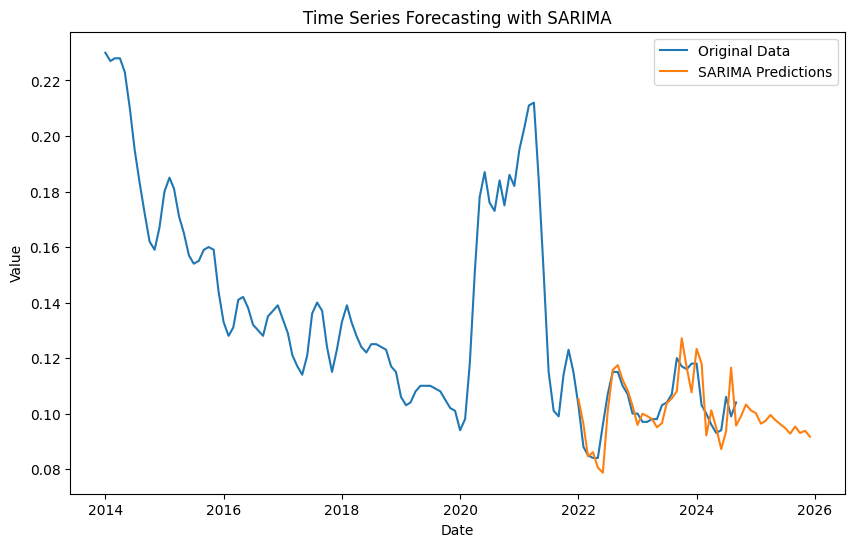

SARIMA - MSE: 4.248515000113321e-05, RMSE: 0.006518063362773732, MAPE: 4.70%


In [773]:
model_sarima(data_filtered,'Ireland', '15-24', 'Female')

## 15-24 Total

In [774]:
data_filtered = prepare_data(combined_df, country='Ireland', age='15-24', sex='Total')


In [775]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9250
Strong seasonality detected.


(0.9249566920421003, True)

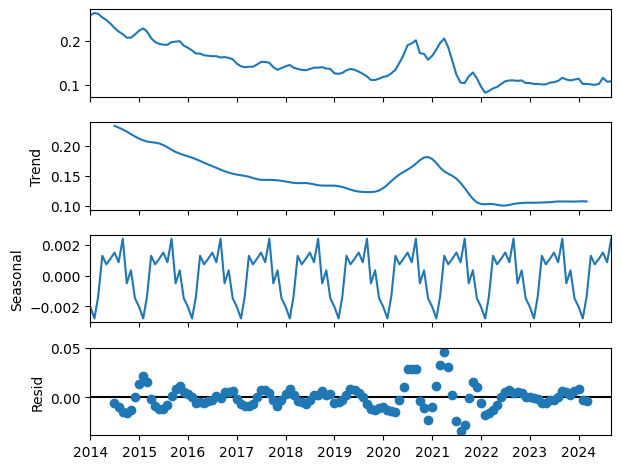

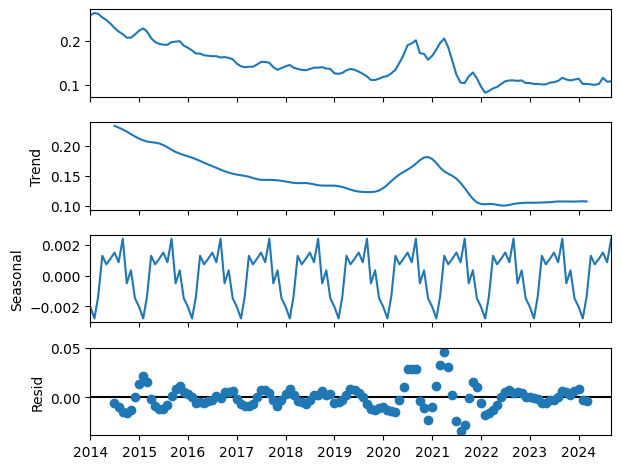

In [776]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-774.749, Time=0.80 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-664.197, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-746.802, Time=0.21 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-764.286, Time=0.61 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-712.839, Time=0.17 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-771.458, Time=1.12 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=inf, Time=1.24 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-748.082, Time=0.34 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.68 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.40 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=-767.301, Time=2.17 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-788.377, Time=0.66 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-732.759, Time=0.42 sec
 ARIMA(1,1,2)(1,1,1)[12]             : AIC=-789.292, Time=1.15 sec
 ARIMA(1,1,2)(1,1,0)[12]          

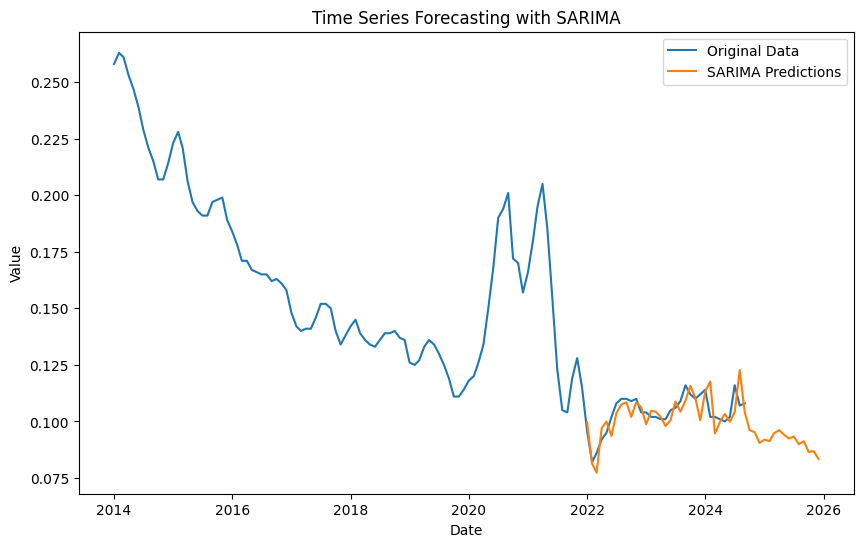

SARIMA - MSE: 2.9986760252125346e-05, RMSE: 0.005476016823579466, MAPE: 4.19%


In [777]:
model_sarima(data_filtered,'Ireland', '15-24', 'Total')

## 25+ Male

In [778]:
data_filtered = prepare_data(combined_df, country='Ireland', age='25+', sex='Male')

In [779]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9902
Strong seasonality detected.


(0.9901856874706663, True)

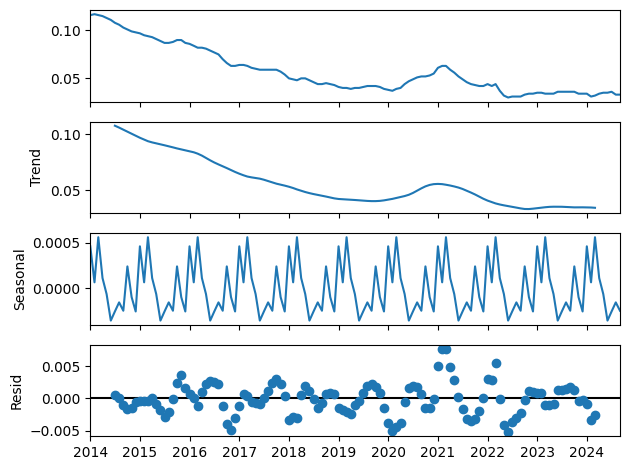

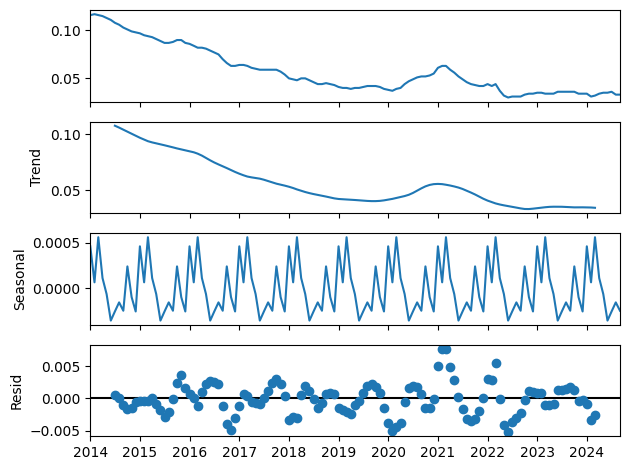

In [780]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1123.161, Time=0.78 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1037.677, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1111.401, Time=0.18 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1102.942, Time=0.63 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1082.571, Time=0.19 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1116.793, Time=0.37 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1078.571, Time=0.55 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1110.232, Time=0.19 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.13 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1125.019, Time=0.20 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1084.012, Time=0.04 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1118.365, Time=0.27 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1080.012, Time=0.15 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=1.05 sec
 ARIMA(0,1,0)(0,1

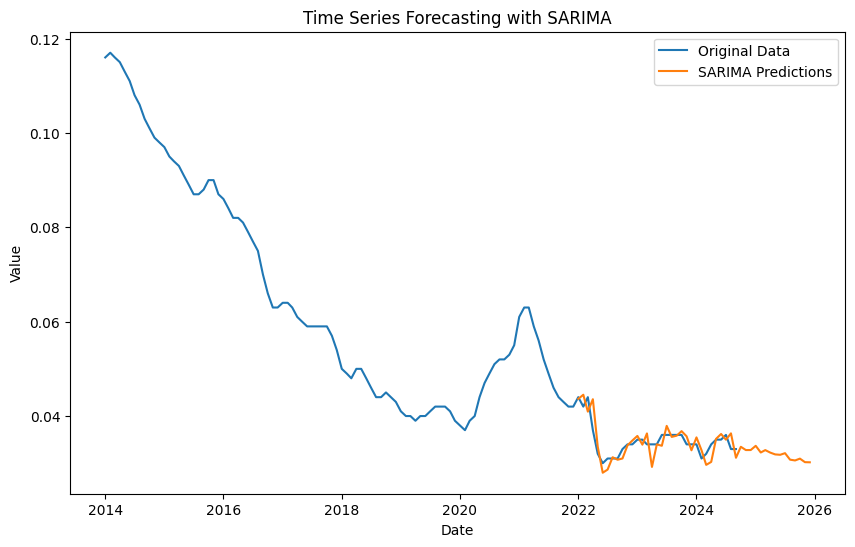

SARIMA - MSE: 4.8715092820471715e-06, RMSE: 0.0022071495830702486, MAPE: 4.80%


In [781]:

model_sarima(data_filtered,'Ireland', '25+', 'Male')

## 25+ Female

In [782]:
data_filtered = prepare_data(combined_df, country='Ireland', age='25+', sex='Female')

In [783]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9656
Strong seasonality detected.


(0.9656002998166398, True)

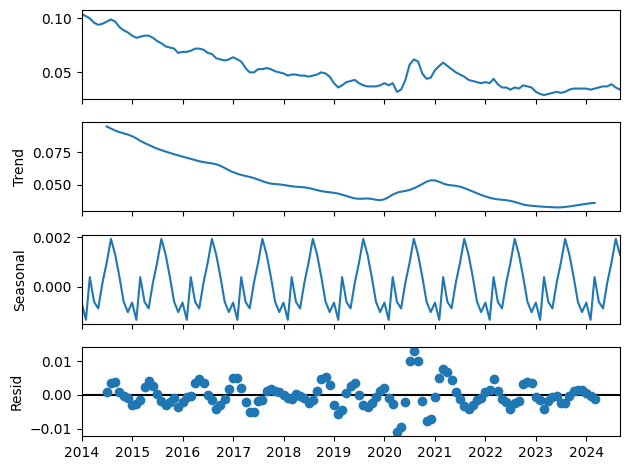

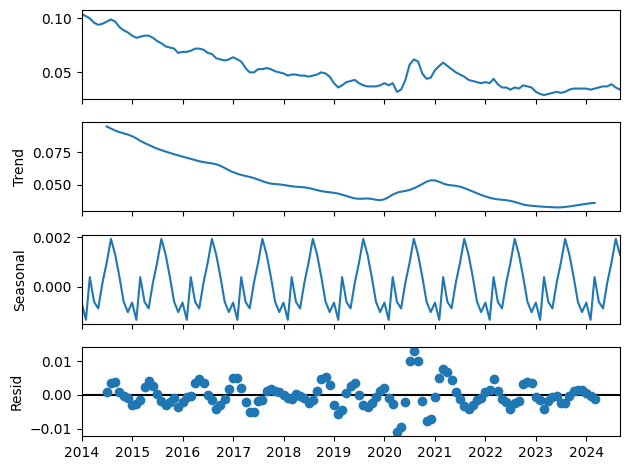

In [784]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1011.682, Time=0.57 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-929.221, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-972.075, Time=0.12 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1014.160, Time=0.32 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-954.900, Time=0.10 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-997.497, Time=0.48 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-991.662, Time=1.39 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-973.178, Time=0.09 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1005.724, Time=1.90 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-989.332, Time=0.21 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1027.857, Time=0.39 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-969.651, Time=0.09 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=-1011.455, Time=0.27 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-1023.102, Time=1.24 sec
 ARIMA(0,1,2)

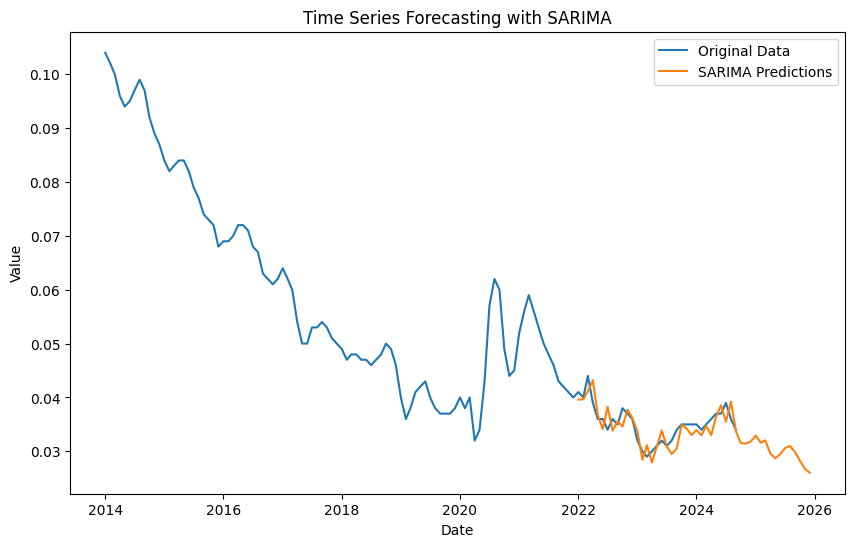

SARIMA - MSE: 4.061921834006389e-06, RMSE: 0.0020154210066401484, MAPE: 4.62%


In [785]:
model_sarima(data_filtered,'Ireland', '25+', 'Female')

## 25+ Total


In [786]:
data_filtered = prepare_data(combined_df, country='Ireland', age='25+', sex='Total')


In [787]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9872
Strong seasonality detected.


(0.9871508663377069, True)

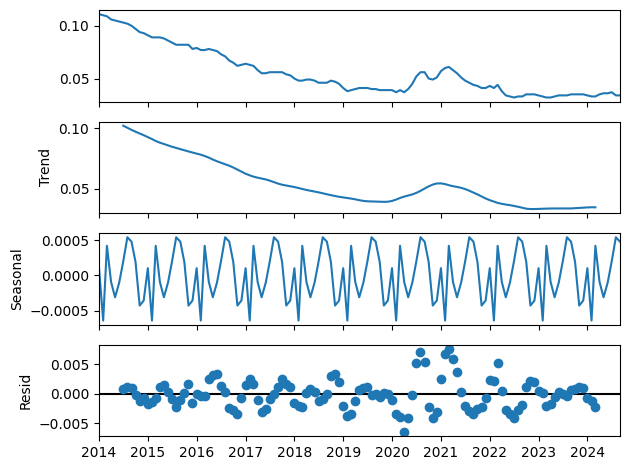

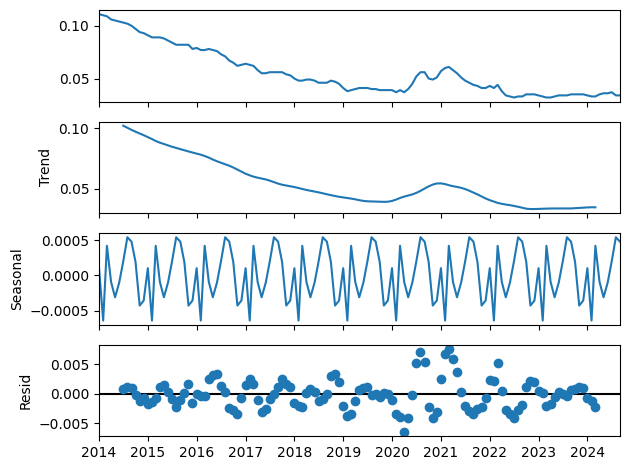

In [788]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1084.908, Time=0.79 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1021.639, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1061.227, Time=0.26 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1078.657, Time=0.26 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1044.572, Time=0.19 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1075.276, Time=0.23 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1040.572, Time=0.36 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1059.644, Time=0.11 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1055.575, Time=0.40 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1086.631, Time=0.61 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-1046.302, Time=0.09 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-1076.946, Time=0.18 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-1042.302, Time=0.62 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=-1057.143, Time=0.61 sec
 ARIM

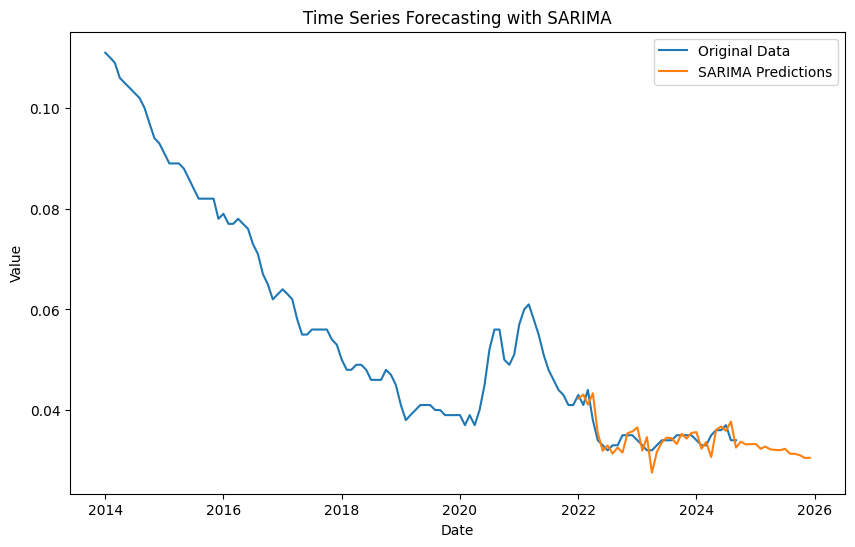

SARIMA - MSE: 4.172161573839986e-06, RMSE: 0.0020425869807281123, MAPE: 4.36%


In [789]:
model_sarima(data_filtered,'Ireland', '25+', 'Total')


# Netherlands

## 15-24 Male

In [790]:
data_filtered = prepare_data(combined_df, country='Netherlands', age='15-24', sex='Male')


In [791]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)


Seasonal Strength: 0.9593
Strong seasonality detected.


(0.9592510196497559, True)

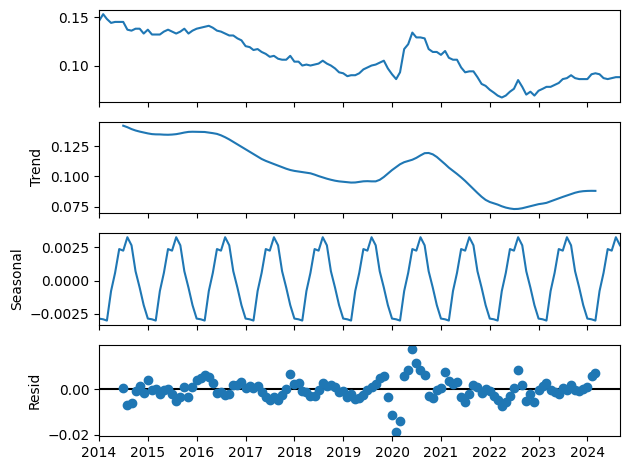

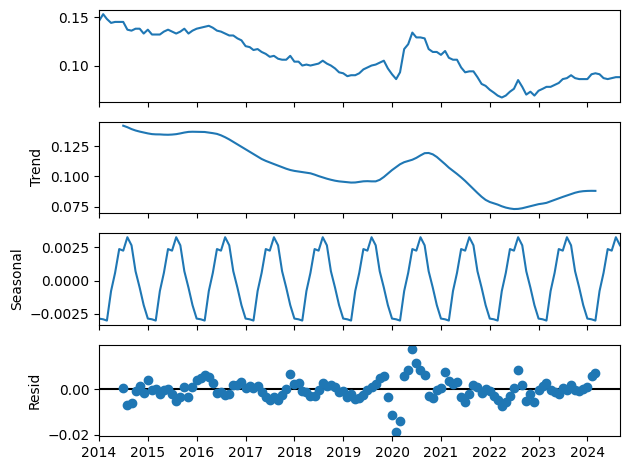

In [792]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-902.077, Time=0.94 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-852.081, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-881.002, Time=0.27 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-903.066, Time=0.35 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-853.366, Time=0.12 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-893.098, Time=0.38 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-902.639, Time=0.81 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-880.190, Time=0.65 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-900.941, Time=1.62 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-902.364, Time=0.09 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-903.701, Time=0.94 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-857.424, Time=0.10 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=-894.179, Time=0.45 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-902.294, Time=1.38 sec
 ARIMA(0,1,2)(1,1,0

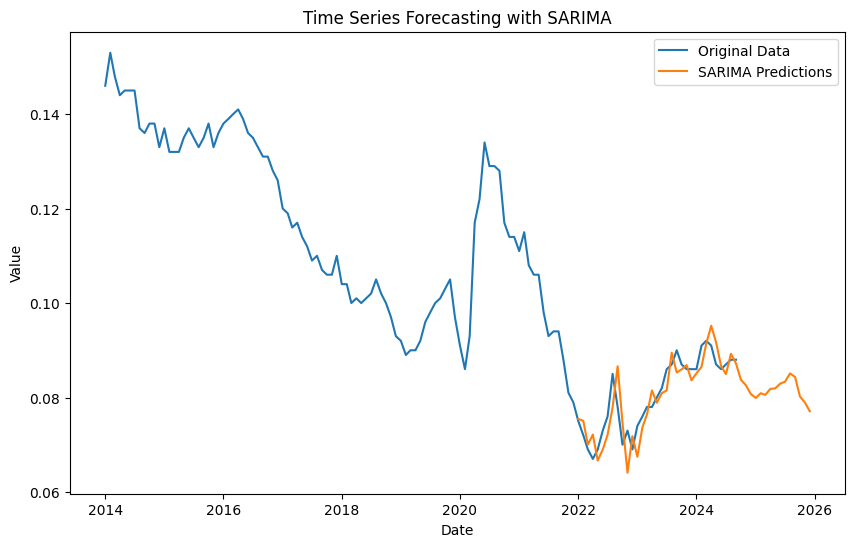

SARIMA - MSE: 1.6345300740016126e-05, RMSE: 0.004042932195822251, MAPE: 4.24%


In [793]:
model_sarima(data_filtered,'Netherlands', '15-24', 'Male')

## 15-24 Female

In [794]:
data_filtered = prepare_data(combined_df, country='Netherlands', age='15-24', sex='Female')

In [795]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9534
Strong seasonality detected.


(0.9534325113621783, True)

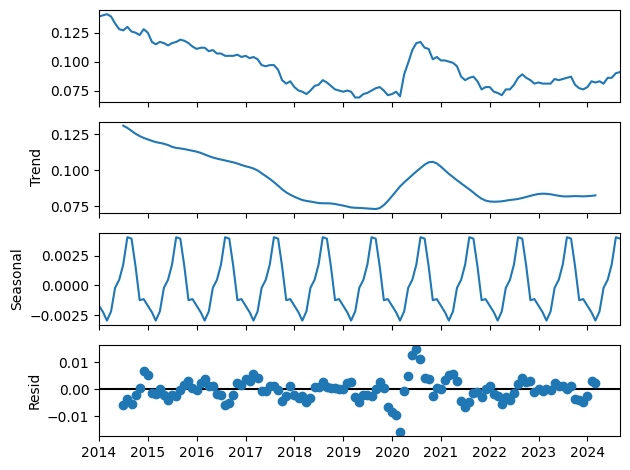

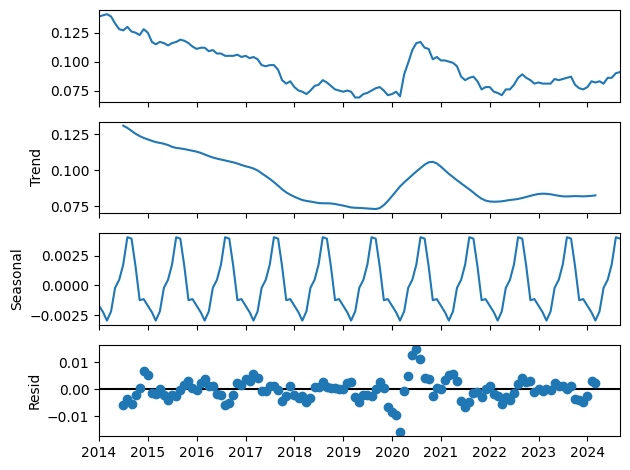

In [796]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-942.180, Time=0.49 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-879.428, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-913.642, Time=0.26 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-939.829, Time=0.09 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-890.052, Time=0.13 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-930.860, Time=0.56 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-943.628, Time=1.92 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.18 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-943.490, Time=1.17 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=0.88 sec
 ARIMA(2,1,1)(0,1,2)[12]             : AIC=inf, Time=1.68 sec
 ARIMA(1,1,2)(0,1,2)[12]             : AIC=-940.541, Time=0.94 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-940.544, Time=0.78 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=-936.608, Time=0.81 sec
 ARIMA(2,1,0)(0,1,2)[12]          

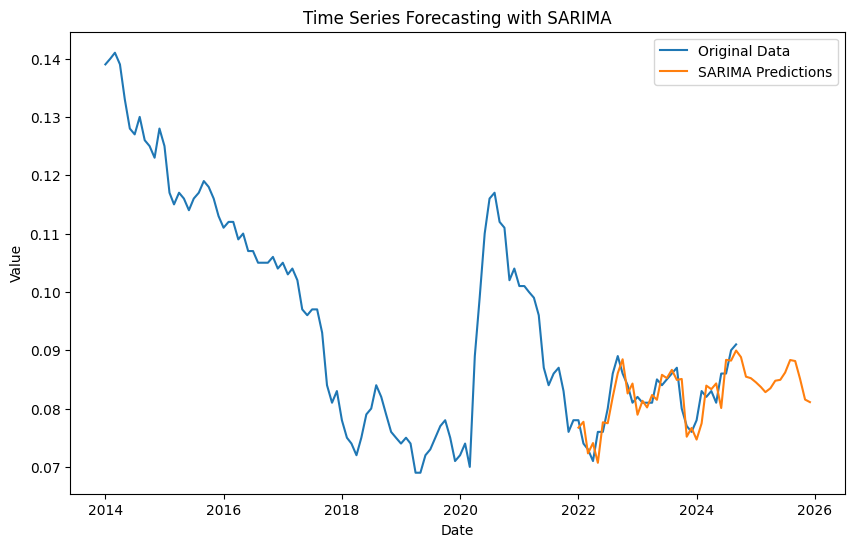

SARIMA - MSE: 8.640451001736071e-06, RMSE: 0.0029394644072919256, MAPE: 3.05%


In [797]:
model_sarima(data_filtered,'Netherlands', '15-24', 'Female')

## 15-24 Total

In [798]:
data_filtered = prepare_data(combined_df, country='Netherlands', age='15-24', sex='Total')

In [799]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9609
Strong seasonality detected.


(0.9608629366993835, True)

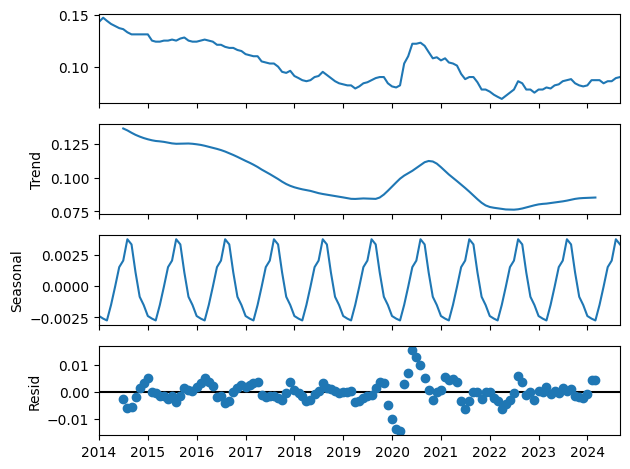

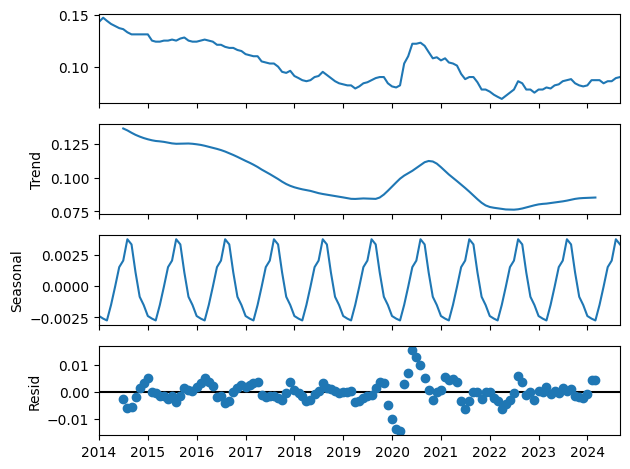

In [800]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-961.004, Time=1.46 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-895.249, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-933.700, Time=0.48 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-956.450, Time=0.57 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-906.949, Time=0.25 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-945.201, Time=0.34 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-952.797, Time=0.63 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-932.993, Time=1.41 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=inf, Time=1.50 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-962.039, Time=0.12 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-907.526, Time=0.08 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-946.095, Time=0.13 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-963.173, Time=0.98 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=0.55 sec
 ARIMA(0,1,0)(0,1,2)[12]     

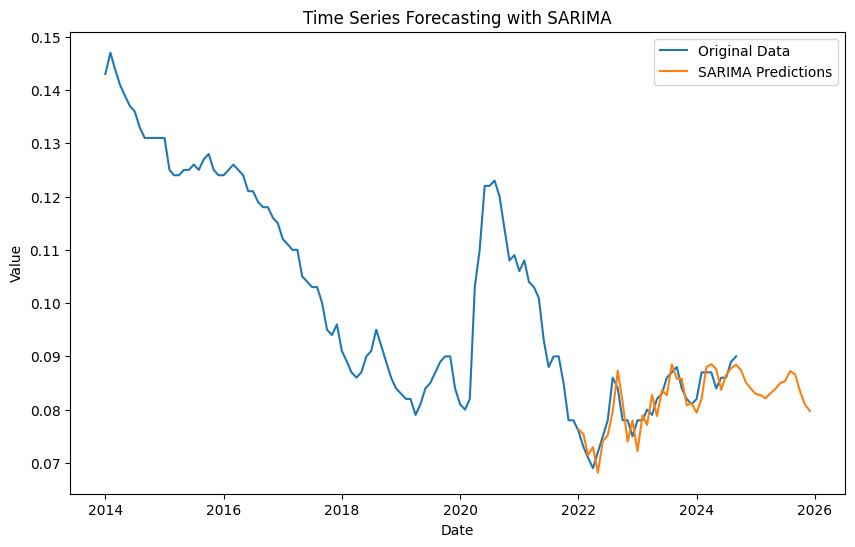

SARIMA - MSE: 9.196614321171223e-06, RMSE: 0.0030325920136363912, MAPE: 3.24%


In [801]:
model_sarima(data_filtered,'Netherlands', '15-24', 'Total')

## 25+ Male

In [802]:
data_filtered = prepare_data(combined_df, country='Netherlands', age='25+', sex='Male')

In [803]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9930
Strong seasonality detected.


(0.9930132500553801, True)

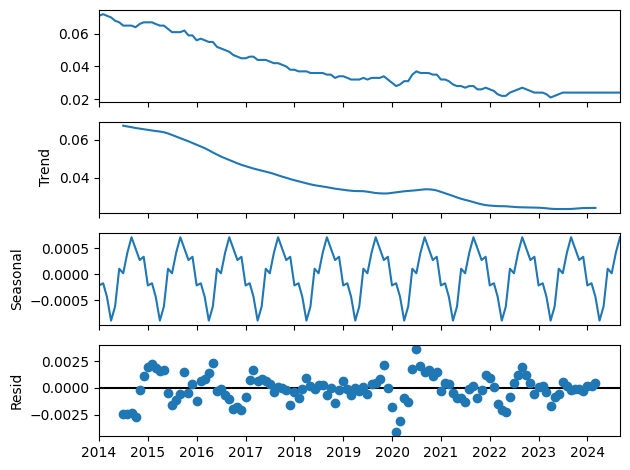

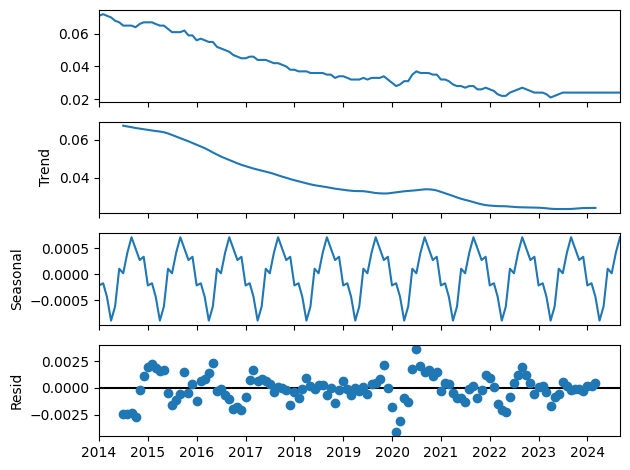

In [804]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1207.799, Time=0.87 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1169.186, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1199.591, Time=0.22 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1209.829, Time=0.21 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1167.185, Time=0.05 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1204.243, Time=0.35 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=0.35 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1199.613, Time=0.30 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1181.403, Time=0.24 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1211.777, Time=0.19 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1206.208, Time=0.13 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1201.594, Time=0.16 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-1188.950, Time=0.74 sec
 ARIMA(1,1,0)(0,1

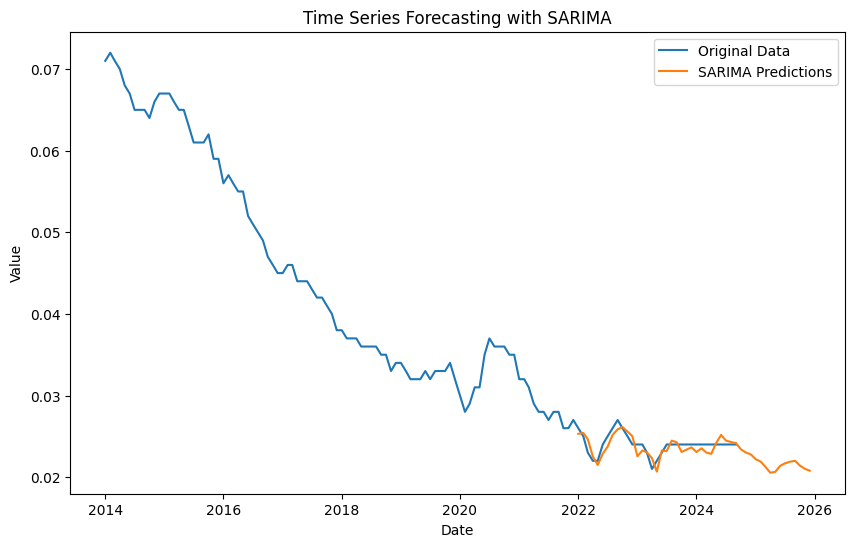

SARIMA - MSE: 7.791621124665658e-07, RMSE: 0.0008827015987674237, MAPE: 3.26%


In [805]:
model_sarima(data_filtered,'Netherlands', '25+', 'Male')

## 25+ Female

In [806]:
data_filtered = prepare_data(combined_df, country='Netherlands', age='25+', sex='Female')

In [807]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9912
Strong seasonality detected.


(0.9911522292730377, True)

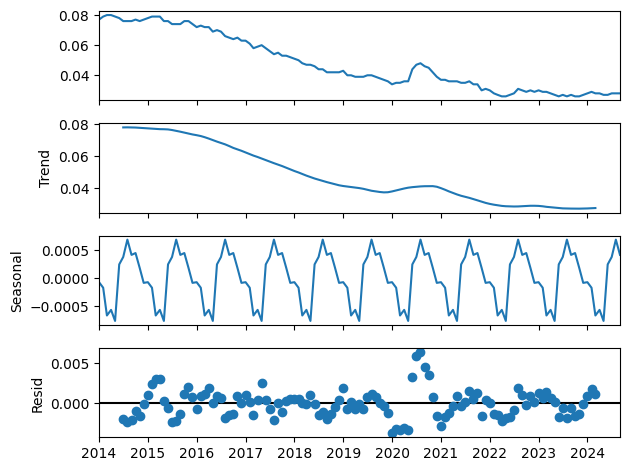

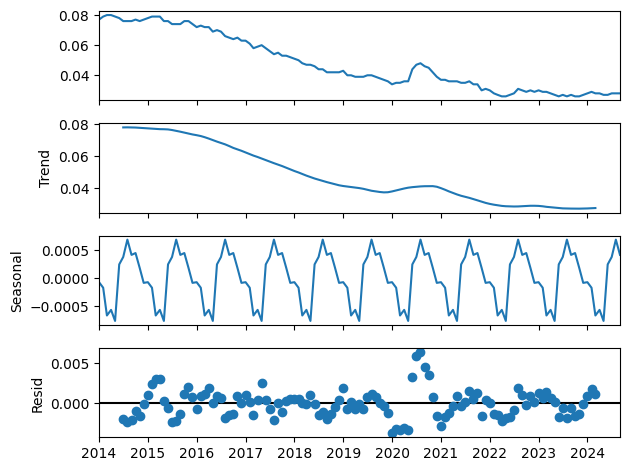

In [808]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1135.740, Time=0.60 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1110.597, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1126.229, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1137.710, Time=0.27 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1108.597, Time=0.06 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1128.313, Time=0.33 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1137.297, Time=0.42 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1126.238, Time=0.21 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-1135.253, Time=1.08 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1139.773, Time=0.17 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1130.365, Time=0.18 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1139.393, Time=1.83 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1128.277, Time=0.10 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=-1137.323, Time=0.48 sec
 ARIM

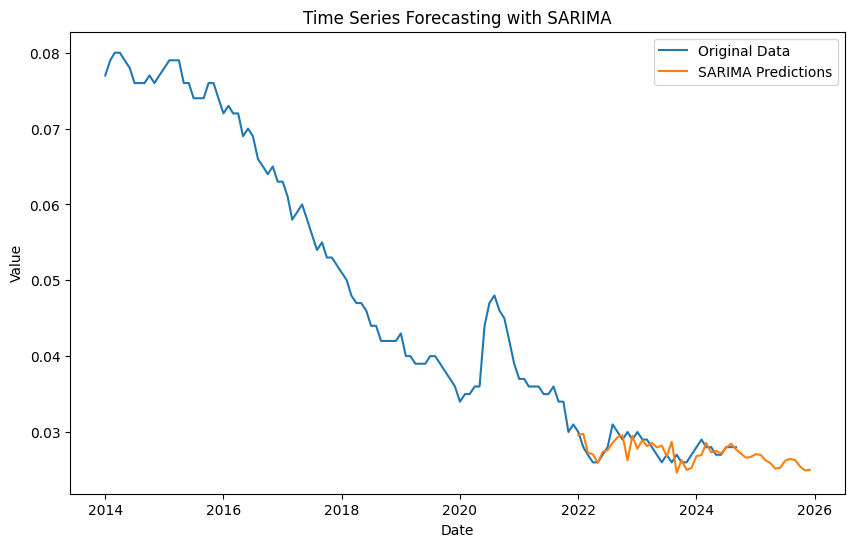

SARIMA - MSE: 2.036383396473793e-06, RMSE: 0.0014270190596042483, MAPE: 3.88%


In [809]:
model_sarima(data_filtered,'Netherlands', '25+', 'Female')

## 25+ Total

In [810]:
data_filtered = prepare_data(combined_df, country='Netherlands', age='25+', sex='Total')

In [811]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9933
Strong seasonality detected.


(0.9932578410826391, True)

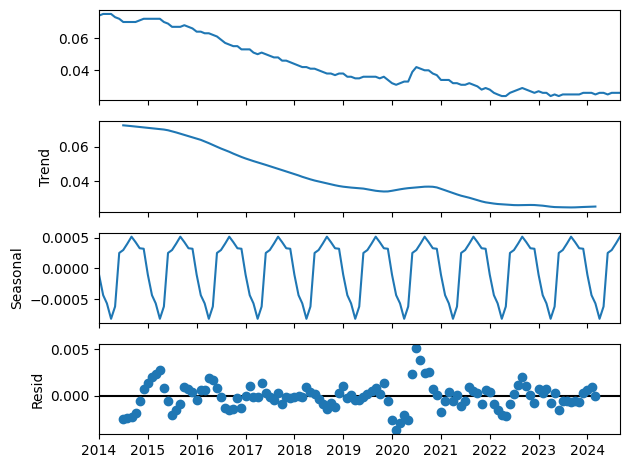

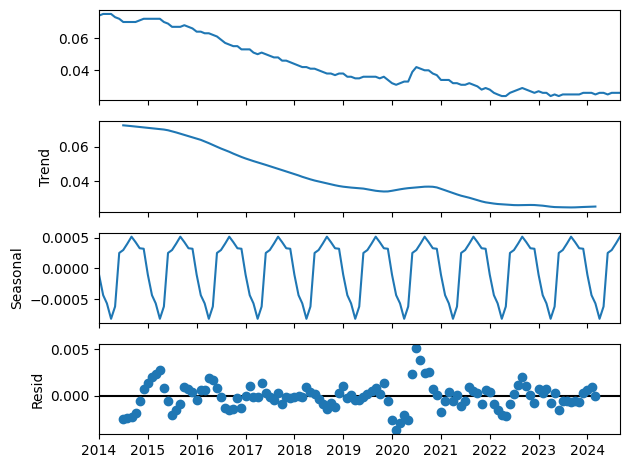

In [812]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1200.031, Time=0.77 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1166.321, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1193.435, Time=0.19 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1201.903, Time=0.17 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1164.351, Time=0.10 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1193.981, Time=0.19 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-1160.351, Time=0.28 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1187.672, Time=0.10 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=0.95 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1203.569, Time=0.12 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=-1195.672, Time=0.30 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=-1162.323, Time=0.62 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-1195.109, Time=0.16 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=inf, Time=0.62 sec
 ARIMA(1,1,0)(0,1

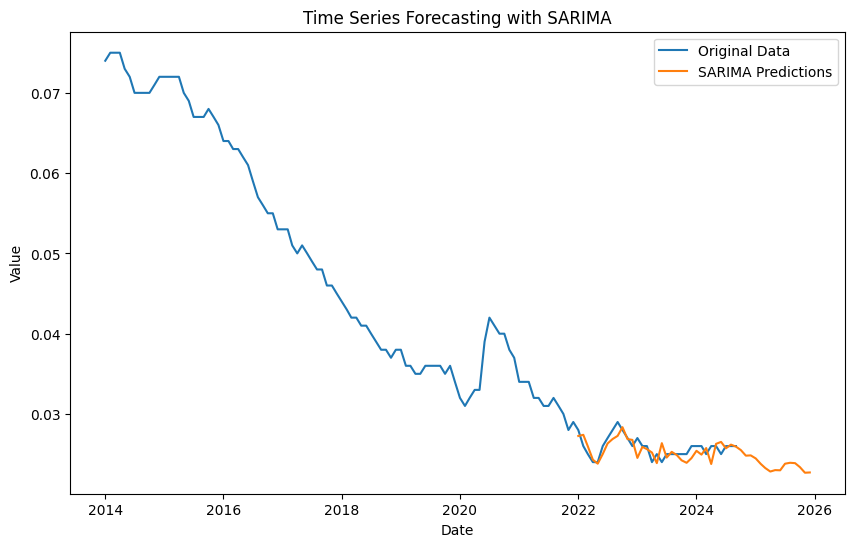

SARIMA - MSE: 1.2757146163614254e-06, RMSE: 0.001129475372180122, MAPE: 3.56%


In [813]:
model_sarima(data_filtered,'Netherlands', '25+', 'Total')


# Chechia

## 15-24 Male

In [814]:
data_filtered = prepare_data(combined_df, country='Czechia', age='15-24', sex='Male')

In [815]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9232
Strong seasonality detected.


(0.9232486061835156, True)

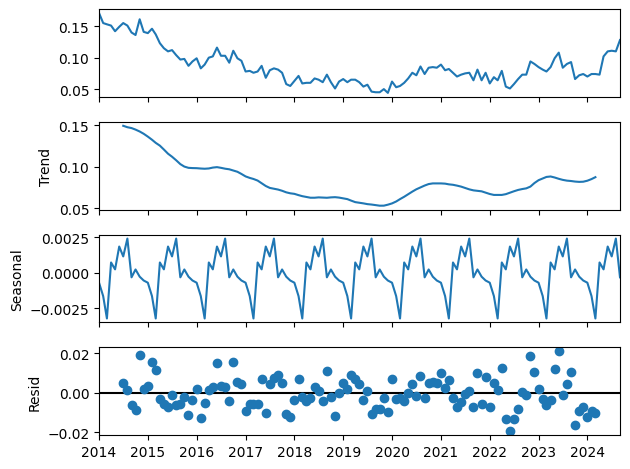

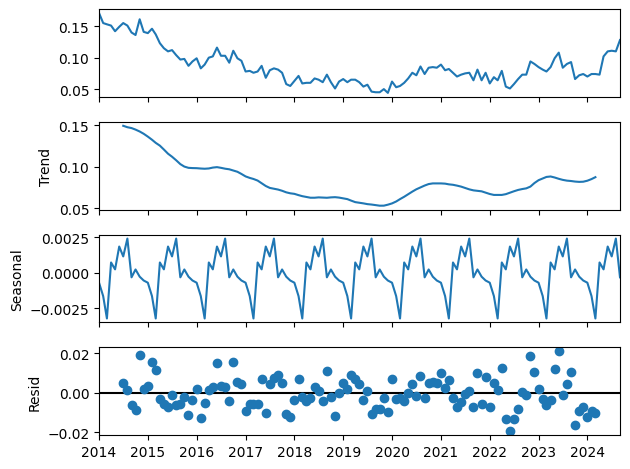

In [816]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.18 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-647.748, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-681.876, Time=0.37 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-702.246, Time=0.54 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-657.436, Time=0.04 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=0.51 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=-700.285, Time=1.16 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-681.382, Time=0.15 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.36 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.38 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-700.598, Time=0.50 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-701.731, Time=0.59 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-698.220, Time=0.97 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=-705.330, Time=0.78 sec
 ARIMA(0,1,1)(0,1,0)[12] intercept   : 

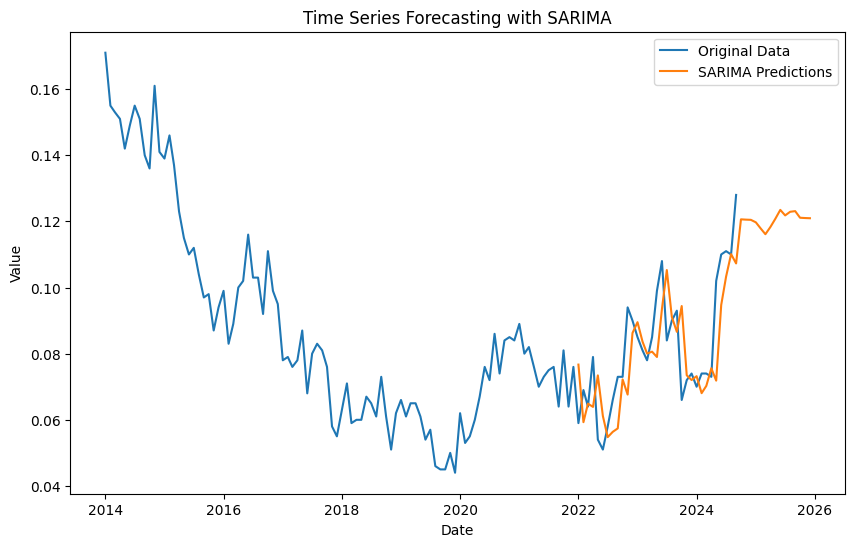

SARIMA - MSE: 0.0001783254434562386, RMSE: 0.013353855003565023, MAPE: 13.04%


In [817]:
model_sarima(data_filtered,'Czechia', '15-24', 'Male')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.87 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-683.788, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-742.610, Time=0.03 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.16 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-685.753, Time=0.03 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-763.127, Time=0.12 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-780.532, Time=0.12 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-799.011, Time=0.42 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-803.335, Time=0.12 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-801.034, Time=0.15 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-785.847, Time=0.28 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-797.548, Time=0.25 sec
 ARIMA(2,2,1)(0,0,0)[0]             : AIC=-803.839, Time=0.39 sec
 ARIMA(1,2,1)(0,0,0)[0]             : AIC=-805.642, Time=0.10 sec
 ARIMA(0,2,1)(0,0,0)[0]             : AIC=-

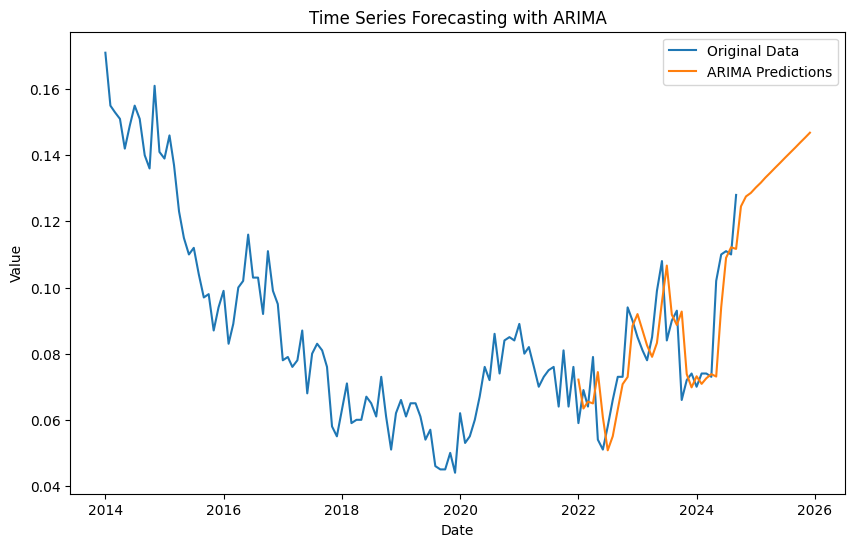

ARIMA - MSE: 0.00015197258326454506, RMSE: 0.012327716060347313, MAPE: 12.33%


In [818]:
model_arima(data_filtered,'Czechia', '15-24', 'Male')

## 15-24 Female

In [819]:
data_filtered = prepare_data(combined_df, country='Czechia', age='15-24', sex='Female')

In [820]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.8926
Strong seasonality detected.


(0.892557710483314, True)

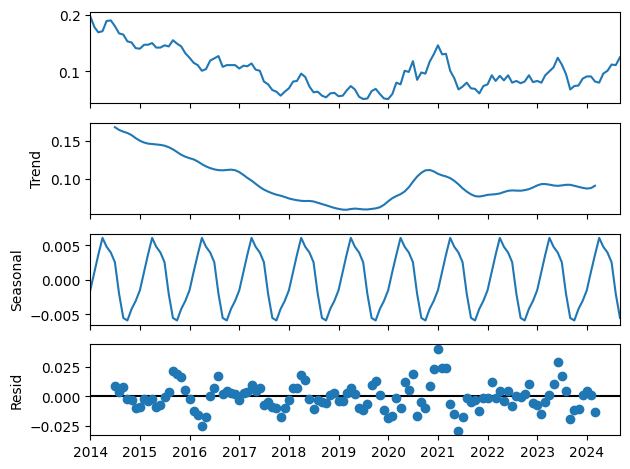

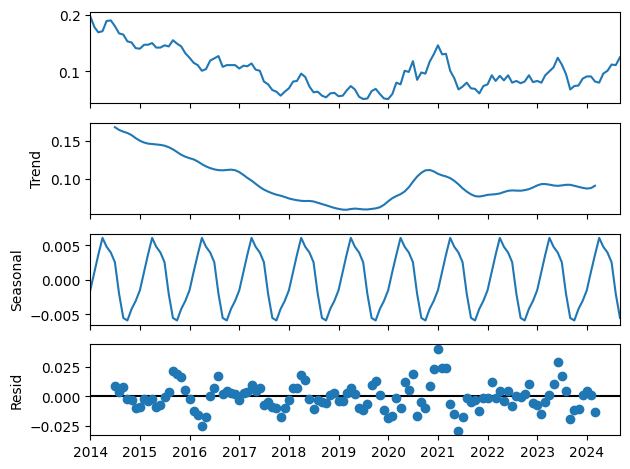

In [821]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.65 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-626.128, Time=0.05 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-650.834, Time=0.86 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.49 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-624.399, Time=0.09 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-662.060, Time=0.51 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=1.74 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=0.66 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=-663.758, Time=0.79 sec
 ARIMA(0,1,0)(1,1,0)[12]             : AIC=-652.820, Time=0.19 sec
 ARIMA(0,1,0)(2,1,1)[12]             : AIC=-680.234, Time=0.70 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.68 sec
 ARIMA(0,1,0)(2,1,2)[12]             : AIC=inf, Time=1.32 sec
 ARIMA(0,1,0)(1,1,2)[12]             : AIC=inf, Time=0.62 sec
 ARIMA(0,1,1)(2,1,1)[12]             : AIC=-679.781, T

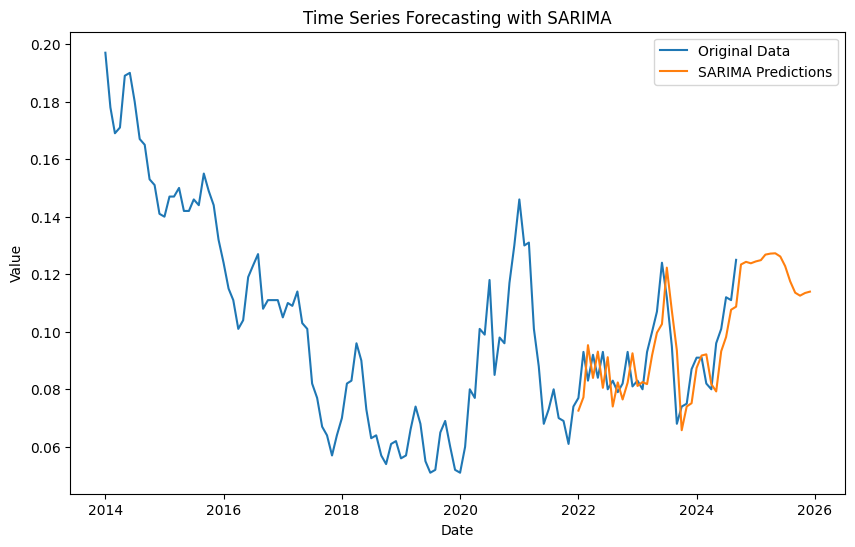

SARIMA - MSE: 0.00011693039008736212, RMSE: 0.010813435628298812, MAPE: 10.40%


In [822]:
model_sarima(data_filtered,'Czechia', '15-24', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-769.215, Time=0.55 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-710.685, Time=0.02 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-764.887, Time=0.06 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.22 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-712.644, Time=0.02 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-785.262, Time=0.29 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-765.002, Time=0.05 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-797.352, Time=0.21 sec
 ARIMA(3,2,0)(0,0,0)[0] intercept   : AIC=-783.738, Time=0.17 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-797.925, Time=0.08 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.70 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-810.813, Time=0.38 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-811.275, Time=0.27 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-813.381, Time=0.15 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-

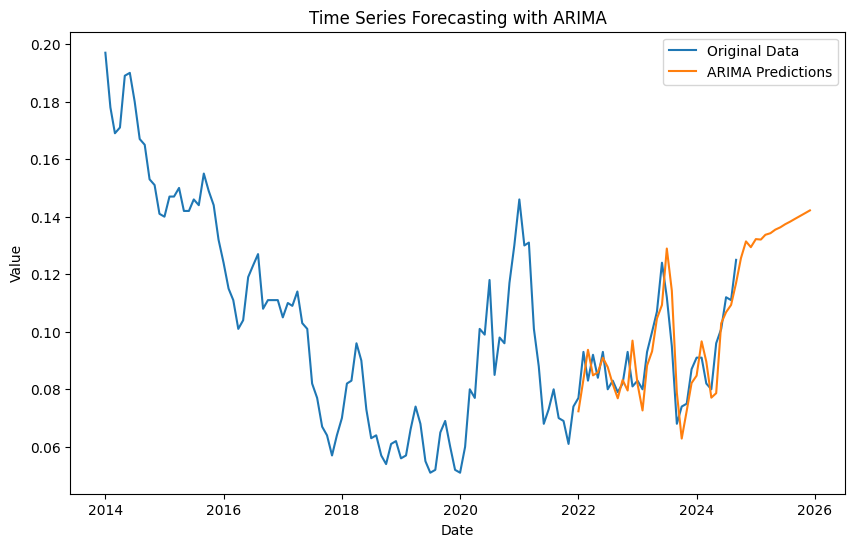

ARIMA - MSE: 8.338877056348845e-05, RMSE: 0.009131745209076328, MAPE: 8.28%


In [823]:
model_arima(data_filtered,'Czechia', '15-24', 'Female')

## 15-24 Total

In [824]:
data_filtered = prepare_data(combined_df, country='Czechia', age='15-24', sex='Total')

In [825]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9424
Strong seasonality detected.


(0.9424389627292279, True)

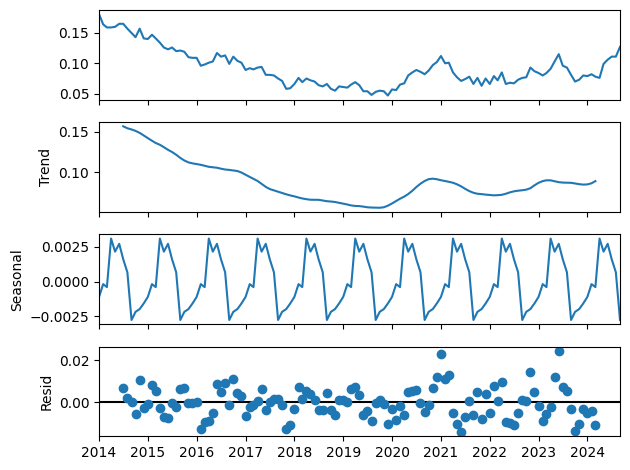

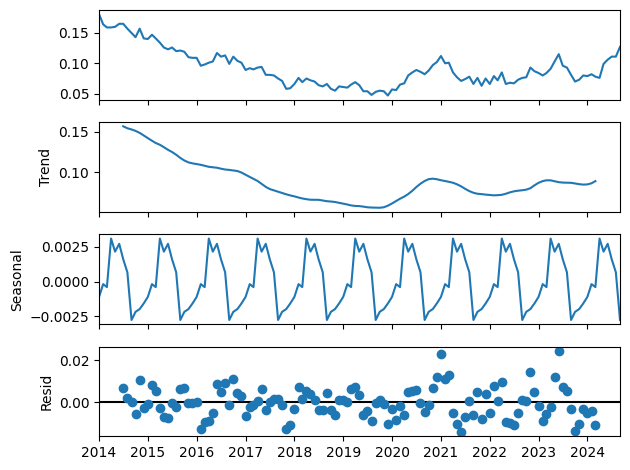

In [826]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.46 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-692.427, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-727.304, Time=0.35 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.52 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-694.408, Time=0.02 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-734.492, Time=0.22 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-731.179, Time=1.15 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-747.261, Time=0.47 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.82 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=2.14 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=-747.617, Time=1.70 sec
 ARIMA(0,1,0)(0,1,2)[12]             : AIC=inf, Time=2.35 sec
 ARIMA(2,1,0)(0,1,2)[12]             : AIC=-749.772, Time=1.71 sec
 ARIMA(2,1,0)(0,1,1)[12]             : AIC=inf, Time=0.71 sec
 ARIMA(2,1,0)(1,1,2)[12]             : AIC=inf, T

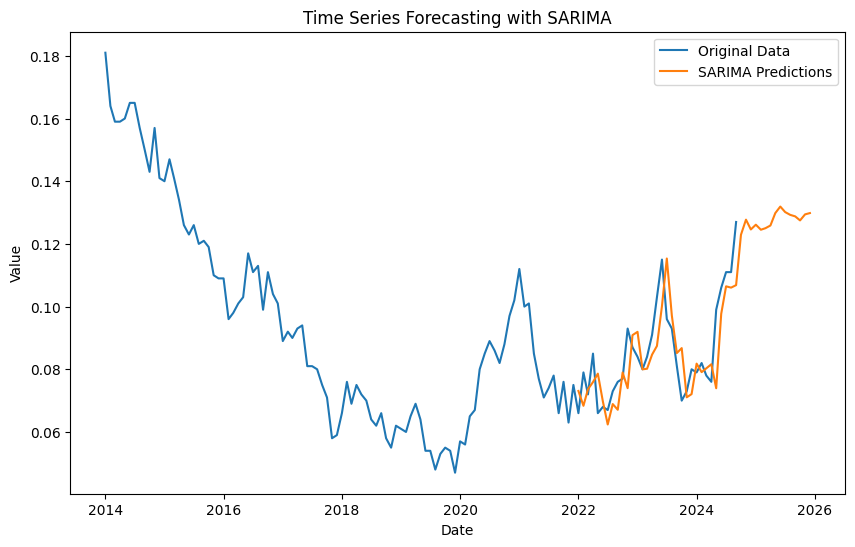

SARIMA - MSE: 9.984048382950782e-05, RMSE: 0.009992021008259931, MAPE: 9.21%


In [827]:
model_sarima(data_filtered,'Czechia', '15-24', 'Total')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-841.876, Time=0.66 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-761.190, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-827.376, Time=0.07 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=1.23 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-763.129, Time=0.04 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-837.952, Time=0.79 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-857.325, Time=0.34 sec
 ARIMA(0,2,2)(0,0,0)[0] intercept   : AIC=inf, Time=1.34 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-856.095, Time=0.71 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-858.664, Time=0.10 sec
 ARIMA(0,2,3)(0,0,0)[0] intercept   : AIC=-858.372, Time=0.32 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-856.540, Time=0.19 sec
 ARIMA(1,2,3)(0,0,0)[0]             : AIC=-859.404, Time=0.13 sec
 ARIMA(0,2,3)(0,0,0)[0]             : AIC=-858.639, Time=0.14 sec
 ARIMA(1,2,2)(0,0,0)[0]             : AIC=-

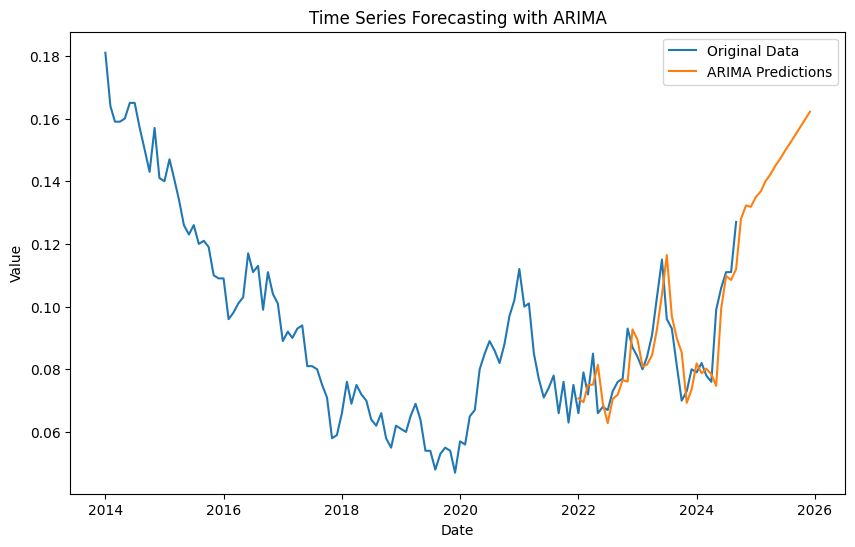

ARIMA - MSE: 8.640196201187594e-05, RMSE: 0.009295265569733655, MAPE: 8.44%


In [828]:
model_arima(data_filtered,'Czechia', '15-24', 'Total')

## 25+ Male

In [829]:
data_filtered = prepare_data(combined_df, country='Czechia', age='25+', sex='Male')

In [830]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9831
Strong seasonality detected.


(0.9831331293472053, True)

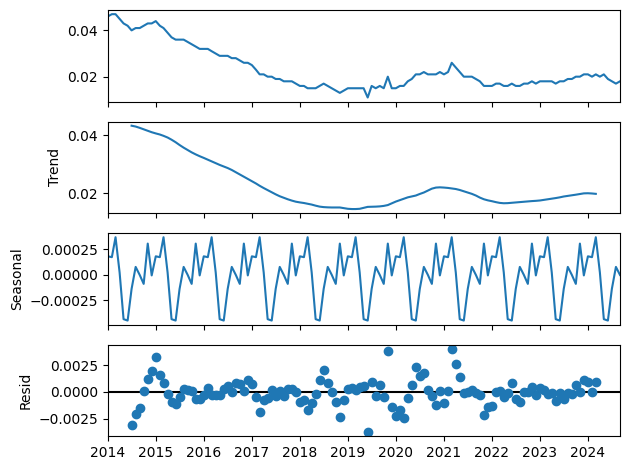

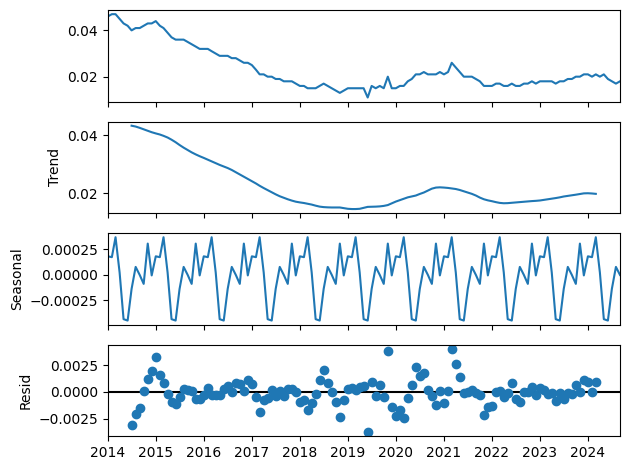

In [831]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1167.868, Time=1.04 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1107.882, Time=0.08 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1150.785, Time=0.14 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1165.729, Time=0.44 sec
 ARIMA(1,1,1)(0,1,0)[12]             : AIC=-1113.236, Time=0.10 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=-1160.059, Time=0.88 sec
 ARIMA(1,1,1)(0,1,2)[12]             : AIC=-1137.744, Time=0.71 sec
 ARIMA(1,1,1)(1,1,0)[12]             : AIC=-1152.189, Time=0.16 sec
 ARIMA(1,1,1)(1,1,2)[12]             : AIC=-1142.383, Time=0.86 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-1167.071, Time=0.20 sec
 ARIMA(2,1,1)(0,1,1)[12]             : AIC=inf, Time=1.83 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-1164.535, Time=1.12 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1166.309, Time=0.31 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1166.580, Time=0.48 sec
 ARIMA(2,1,

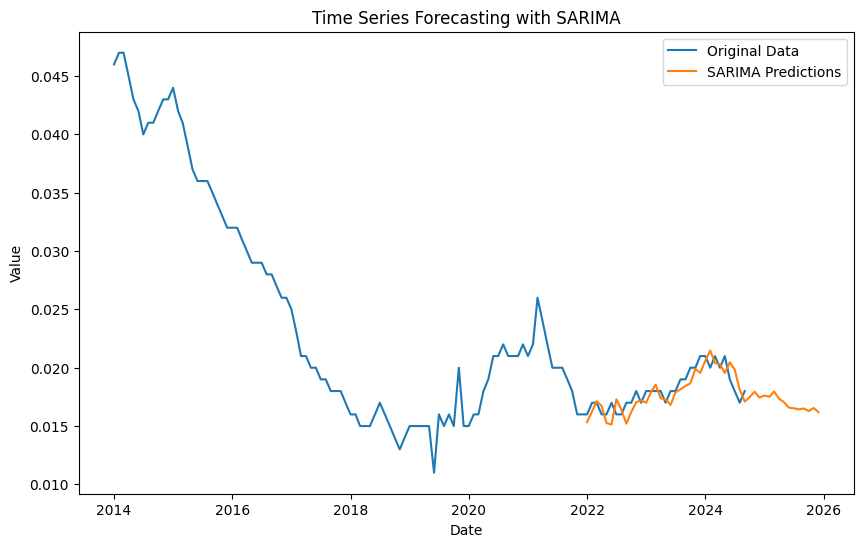

SARIMA - MSE: 9.142257990772126e-07, RMSE: 0.0009561515565417506, MAPE: 4.43%


In [832]:
model_sarima(data_filtered,'Czechia', '25+', 'Male')

## 25+ Female

In [833]:
data_filtered = prepare_data(combined_df, country='Czechia', age='25+', sex='Female')

In [834]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9625
Strong seasonality detected.


(0.9625145637458079, True)

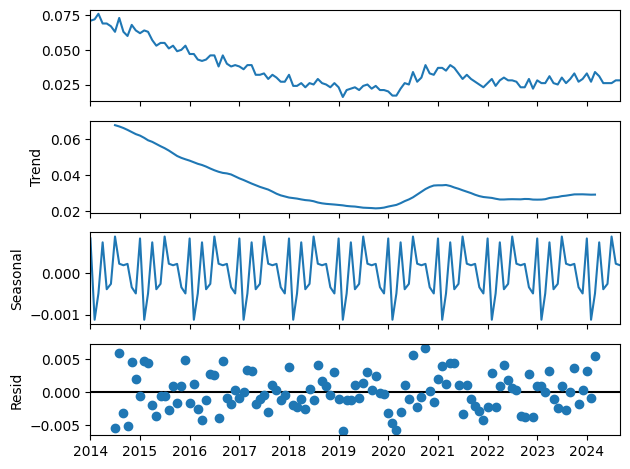

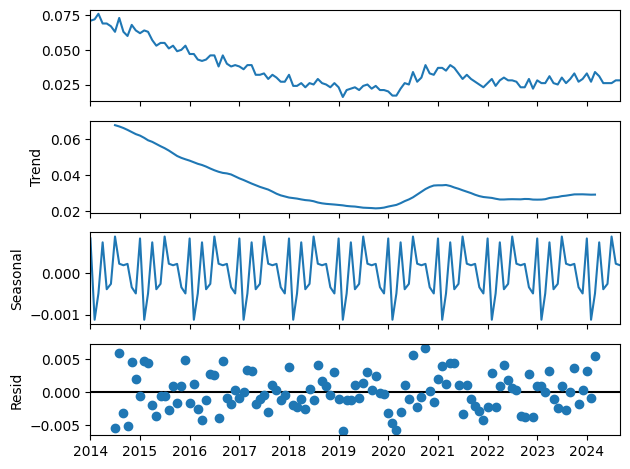

In [835]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-936.842, Time=0.52 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-898.577, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-923.239, Time=0.51 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-942.930, Time=0.39 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-920.759, Time=0.12 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-936.981, Time=0.47 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=0.96 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-929.394, Time=0.18 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=-941.902, Time=0.85 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-915.733, Time=0.23 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-937.147, Time=0.12 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-935.918, Time=0.21 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-940.306, Time=0.56 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=-942.311, Time=0.21 sec

Best model:  ARIMA(0,1,

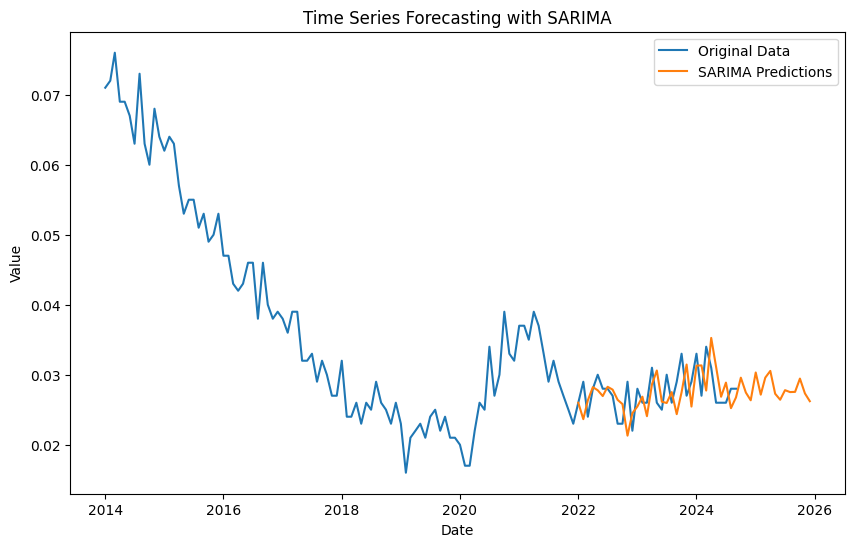

SARIMA - MSE: 1.2471474585236637e-05, RMSE: 0.0035314974989707464, MAPE: 10.54%


In [836]:
model_sarima(data_filtered,'Czechia', '25+', 'Female')

Performing stepwise search to minimize aic
 ARIMA(1,2,1)(0,0,0)[0] intercept   : AIC=-1047.002, Time=0.64 sec
 ARIMA(0,2,0)(0,0,0)[0] intercept   : AIC=-909.182, Time=0.03 sec
 ARIMA(1,2,0)(0,0,0)[0] intercept   : AIC=-959.679, Time=0.05 sec
 ARIMA(0,2,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.14 sec
 ARIMA(0,2,0)(0,0,0)[0]             : AIC=-911.182, Time=0.03 sec
 ARIMA(2,2,1)(0,0,0)[0] intercept   : AIC=-1062.712, Time=0.15 sec
 ARIMA(2,2,0)(0,0,0)[0] intercept   : AIC=-1041.641, Time=0.11 sec
 ARIMA(3,2,1)(0,0,0)[0] intercept   : AIC=-1061.031, Time=0.05 sec
 ARIMA(2,2,2)(0,0,0)[0] intercept   : AIC=-1070.938, Time=0.24 sec
 ARIMA(1,2,2)(0,0,0)[0] intercept   : AIC=-1028.784, Time=0.31 sec
 ARIMA(3,2,2)(0,0,0)[0] intercept   : AIC=-1066.225, Time=0.14 sec
 ARIMA(2,2,3)(0,0,0)[0] intercept   : AIC=-1068.732, Time=0.16 sec
 ARIMA(1,2,3)(0,0,0)[0] intercept   : AIC=-1034.349, Time=0.10 sec
 ARIMA(3,2,3)(0,0,0)[0] intercept   : AIC=-1065.506, Time=0.47 sec
 ARIMA(2,2,2)(0,0,0)[0]     

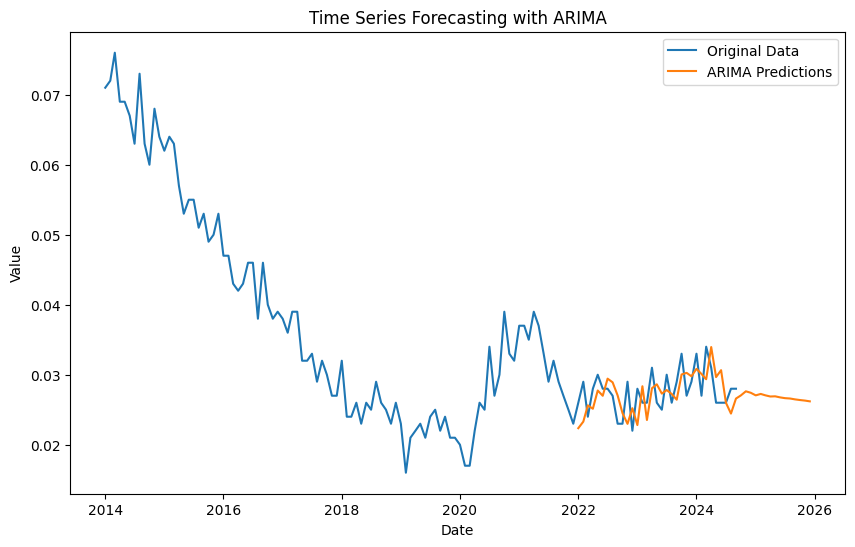

ARIMA - MSE: 1.0185213037251793e-05, RMSE: 0.0031914280560983656, MAPE: 10.57%


In [837]:
model_arima(data_filtered,'Czechia', '25+', 'Female')

## 25+ Total

In [838]:
data_filtered = prepare_data(combined_df, country='Czechia', age='25+', sex='Total')

In [839]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.9807
Strong seasonality detected.


(0.9806520512538839, True)

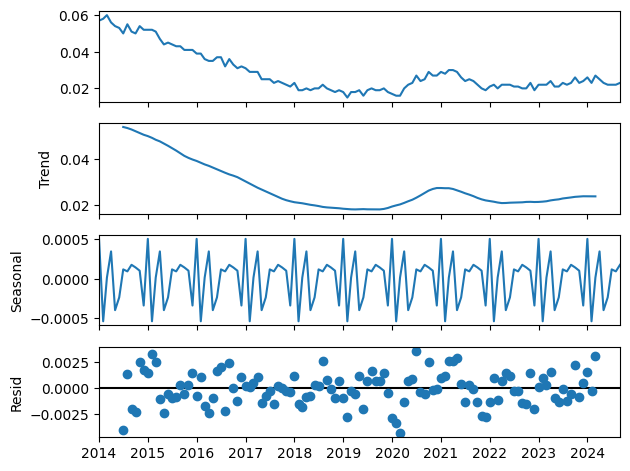

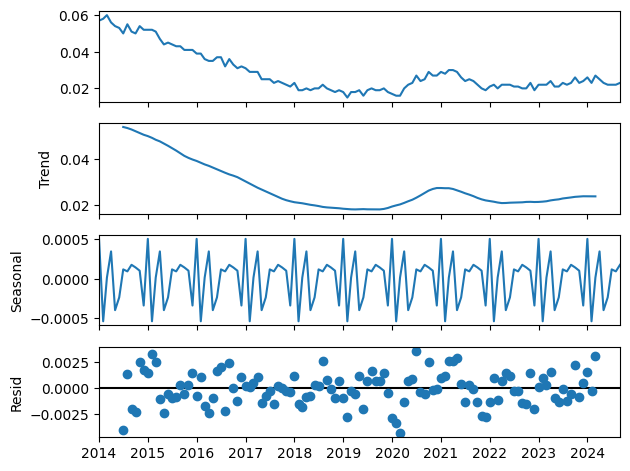

In [840]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-1074.627, Time=0.61 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-1046.974, Time=0.09 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-1067.184, Time=0.99 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-1076.378, Time=0.10 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-1055.537, Time=0.13 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-1074.420, Time=0.36 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-1068.014, Time=0.09 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.14 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-1071.840, Time=0.18 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-1079.462, Time=1.08 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-1053.567, Time=0.51 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=-1072.246, Time=0.77 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=inf, Time=0.87 sec
 ARIMA(0,1,2)(1,1,0)[12

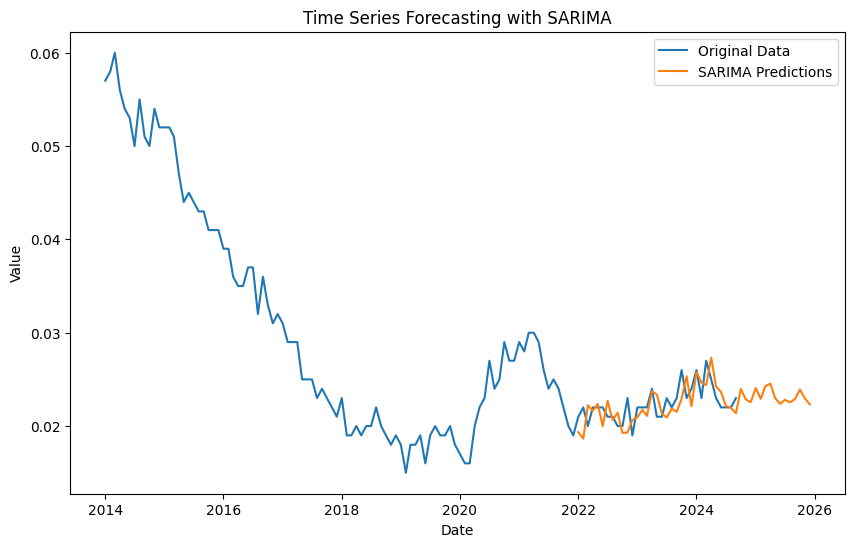

SARIMA - MSE: 3.2400259153647726e-06, RMSE: 0.0018000071986980421, MAPE: 6.73%


In [841]:
model_sarima(data_filtered,'Czechia', '25+', 'Total')


# Canada

## 15-24 Male

In [842]:
data_filtered = prepare_data(combined_df, country='Canada', age='15-24', sex='Male')

In [843]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7444
Strong seasonality detected.


(0.7444129387794072, True)

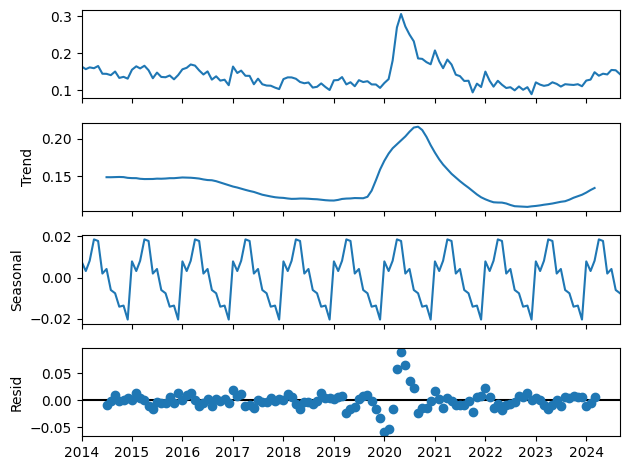

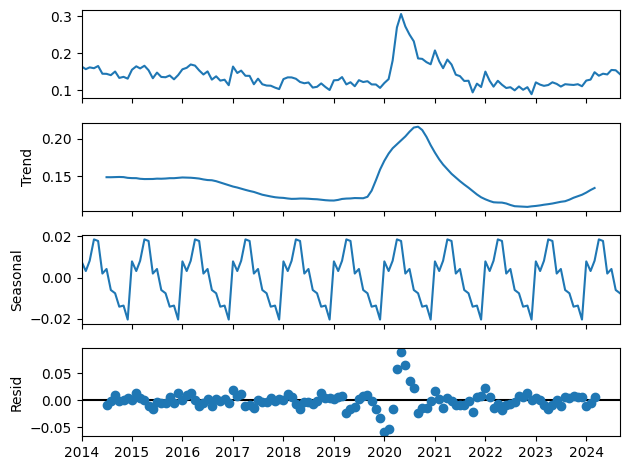

In [844]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=2.47 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-562.006, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-584.283, Time=0.42 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=0.39 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=-563.202, Time=0.03 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=-590.990, Time=0.34 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=-608.926, Time=1.32 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=-610.348, Time=0.66 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.53 sec
 ARIMA(1,1,0)(1,1,2)[12]             : AIC=inf, Time=0.70 sec
 ARIMA(1,1,0)(0,1,2)[12]             : AIC=inf, Time=0.56 sec
 ARIMA(1,1,0)(2,1,2)[12]             : AIC=inf, Time=1.54 sec
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=0.75 sec
 ARIMA(1,1,1)(1,1,1)[12]             : AIC=inf, Time=0.92 s

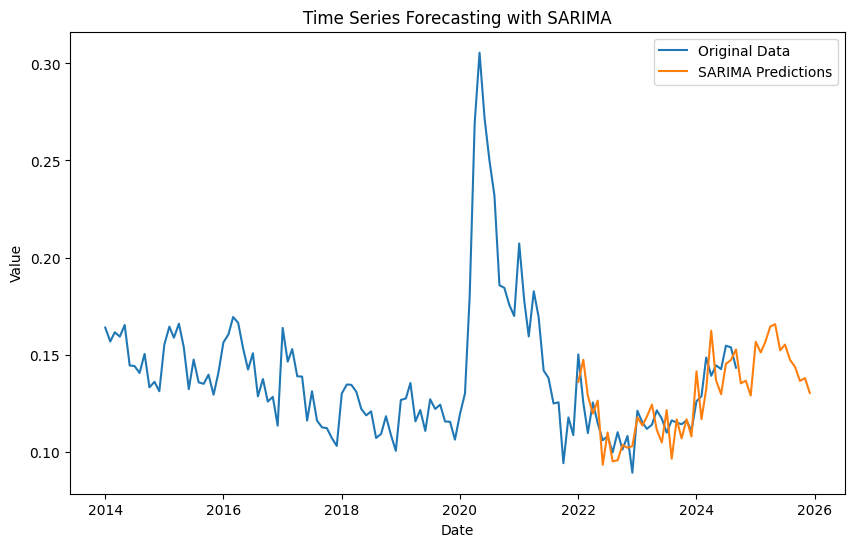

SARIMA - MSE: 0.00014229067271046816, RMSE: 0.011928565408734956, MAPE: 8.46%


In [845]:
model_sarima(data_filtered,'Canada', '15-24', 'Male')

## 15-24 Female

In [846]:
data_filtered = prepare_data(combined_df, country='Canada', age='15-24', sex='Female')

In [847]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.6949
Weak or no seasonality detected.


(0.6948793933249551, False)

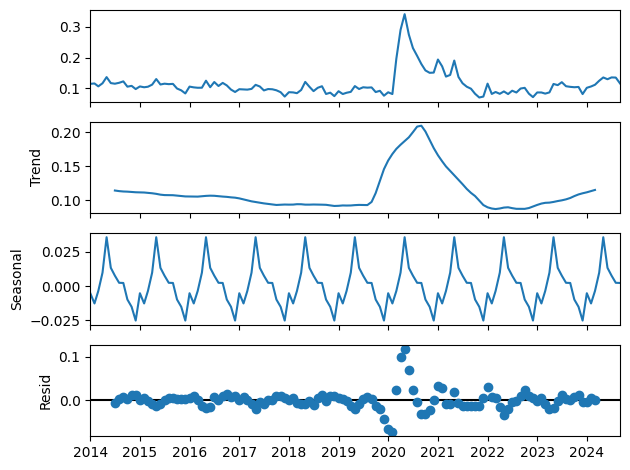

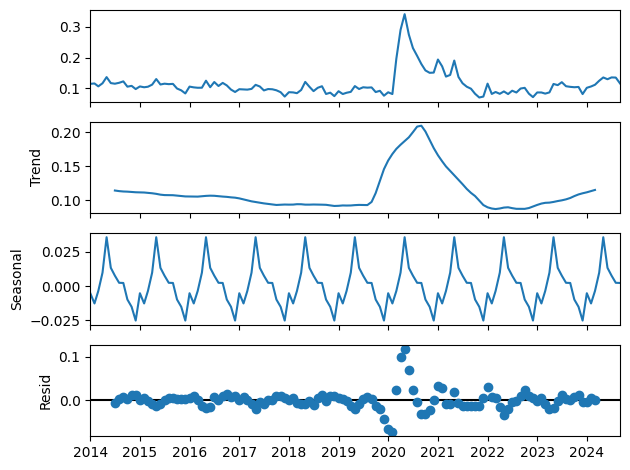

In [848]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=inf, Time=1.13 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-515.599, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-554.192, Time=0.18 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-583.385, Time=0.34 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-536.104, Time=0.24 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=0.67 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=0.32 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-558.609, Time=0.31 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=0.67 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.41 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=inf, Time=0.59 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=inf, Time=0.57 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=inf, Time=1.12 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=inf, Time=1.01 sec

Best model:  ARIMA(0,1,1)(0,1,1)[12]          
Total fit time: 

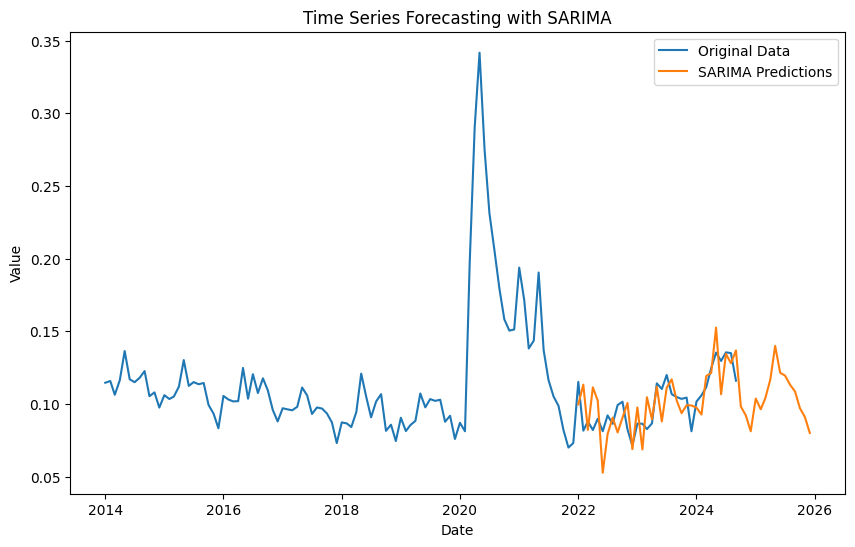

SARIMA - MSE: 0.00024165109090527778, RMSE: 0.015545130778004982, MAPE: 13.84%


In [849]:
model_sarima(data_filtered,'Canada', '15-24', 'Female')

## 15-24 Total

In [850]:
data_filtered = prepare_data(combined_df, country='Canada', age='15-24', sex='Total')

In [851]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7246
Strong seasonality detected.


(0.7245941194017327, True)

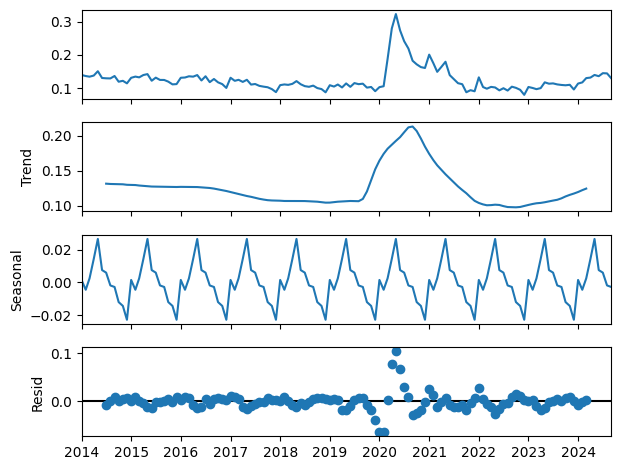

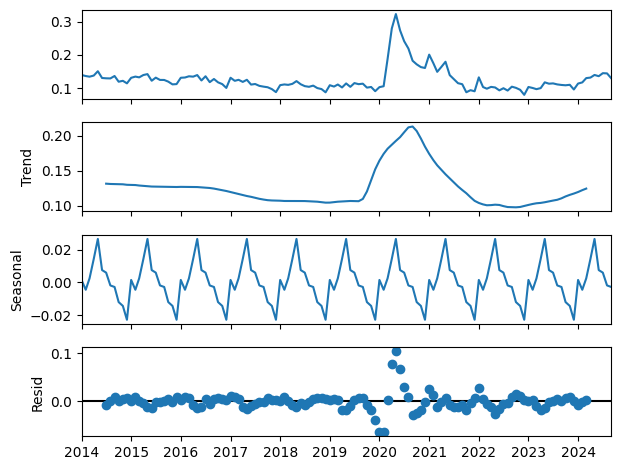

In [852]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-638.072, Time=2.08 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-561.905, Time=0.02 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-605.813, Time=0.44 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-639.686, Time=0.33 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-587.681, Time=0.13 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=inf, Time=0.58 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=0.70 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-609.989, Time=0.19 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.28 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-639.343, Time=0.36 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-634.710, Time=0.32 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-635.696, Time=0.59 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=-637.108, Time=0.24 sec

Best model:  ARIMA(0,1,1)(0,1,1)[12]  

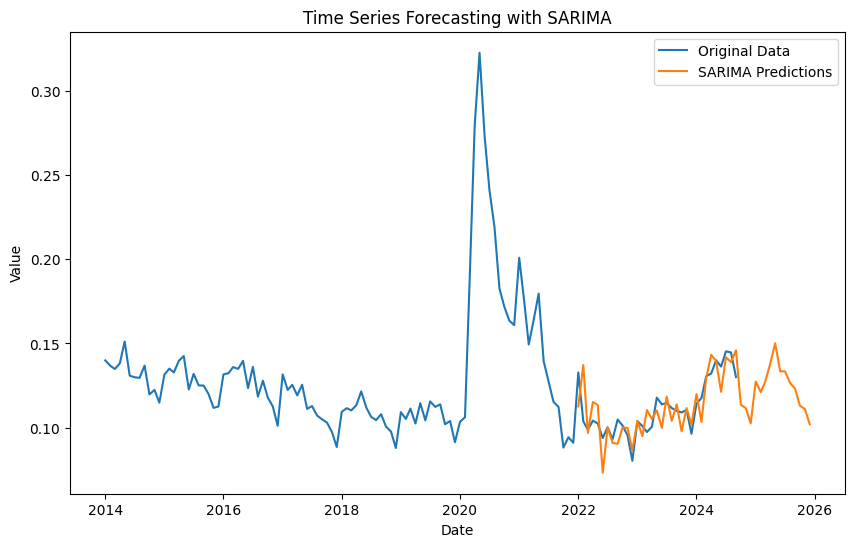

SARIMA - MSE: 0.0001255368672519039, RMSE: 0.011204323596357965, MAPE: 7.77%


In [853]:
model_sarima(data_filtered,'Canada', '15-24', 'Total')

## 25+ Male

In [854]:
data_filtered = prepare_data(combined_df, country='Canada', age='25+', sex='Male')

In [855]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7721
Strong seasonality detected.


(0.7720931298915559, True)

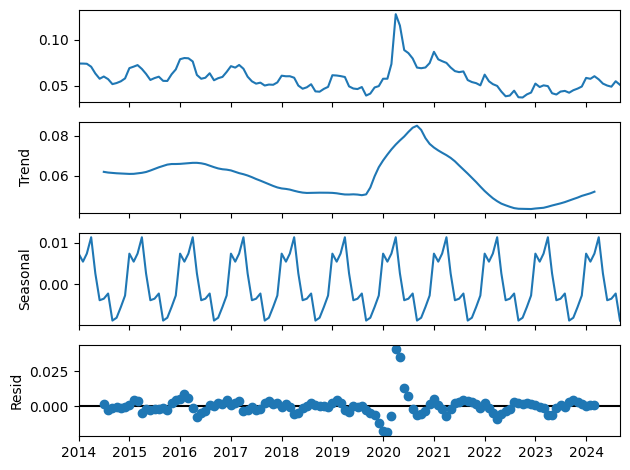

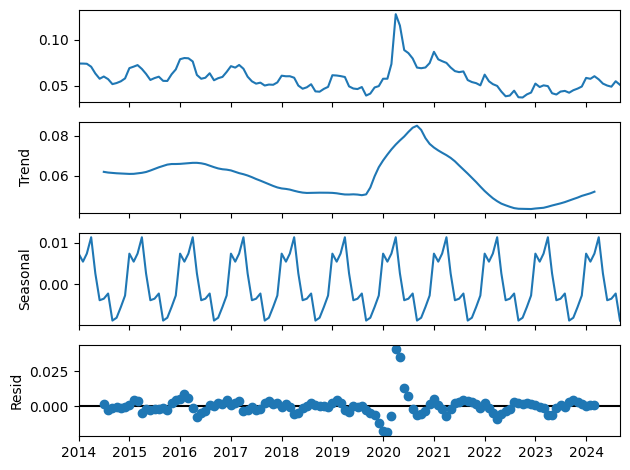

In [856]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-820.782, Time=1.48 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-764.669, Time=0.04 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-793.921, Time=0.80 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-822.986, Time=0.84 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-770.764, Time=0.06 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-816.342, Time=1.97 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=1.43 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-797.051, Time=0.09 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=1.49 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.92 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-823.705, Time=0.14 sec
 ARIMA(0,1,2)(0,1,0)[12]             : AIC=-775.658, Time=0.13 sec
 ARIMA(0,1,2)(1,1,1)[12]             : AIC=-817.337, Time=0.93 sec
 ARIMA(0,1,2)(0,1,2)[12]             : AIC=inf, Time=1.56 sec
 ARIMA(0,1,2)(1,1,0)[12]             : 

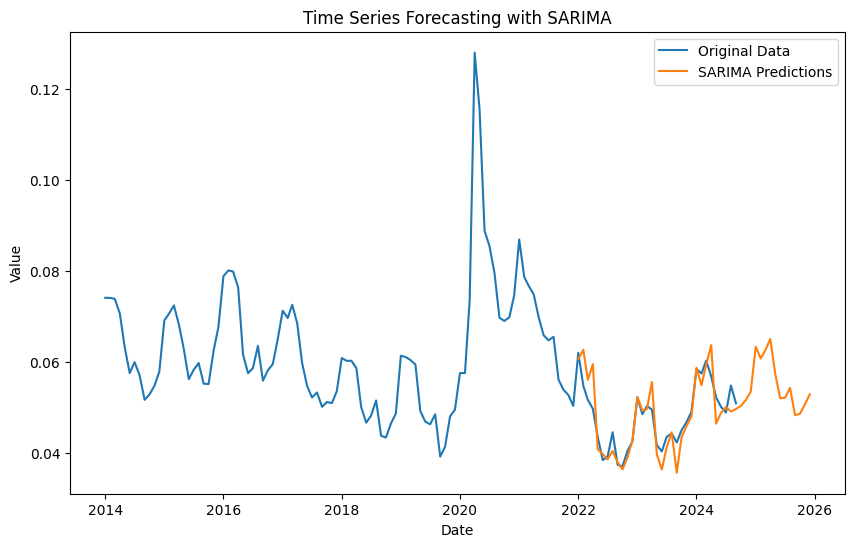

SARIMA - MSE: 1.3773945556643944e-05, RMSE: 0.0037113266572270276, MAPE: 5.50%


In [857]:
model_sarima(data_filtered,'Canada', '25+', 'Male')

## 25+ Female

In [858]:
data_filtered = prepare_data(combined_df, country='Canada', age='25+', sex='Female')

In [859]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7679
Strong seasonality detected.


(0.7679485208629929, True)

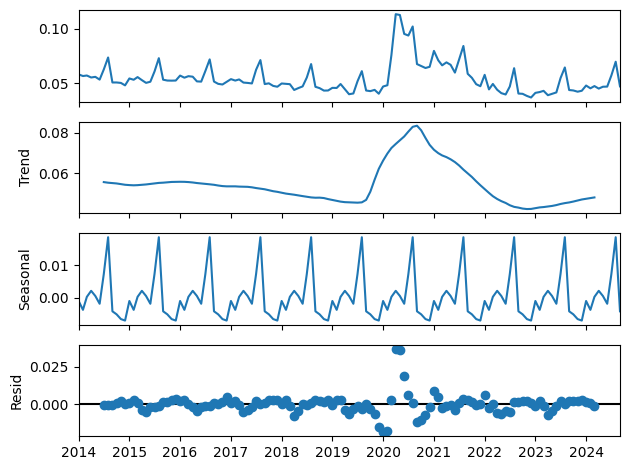

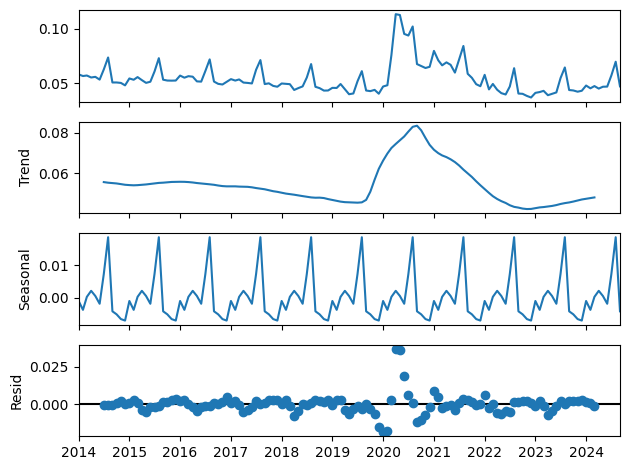

In [860]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-857.344, Time=1.27 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-793.725, Time=0.06 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-828.059, Time=0.18 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-859.362, Time=0.31 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-814.620, Time=0.11 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-849.871, Time=0.33 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=0.63 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-834.915, Time=0.25 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=0.78 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=inf, Time=0.37 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-857.669, Time=0.55 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-853.114, Time=0.39 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-856.959, Time=0.88 sec
 ARIMA(0,1,1)(0,1,1)[12] intercept   : AIC=-857.363, Time=0.37 sec

Best model:  ARIMA(0,1,1)(0,1,1)[

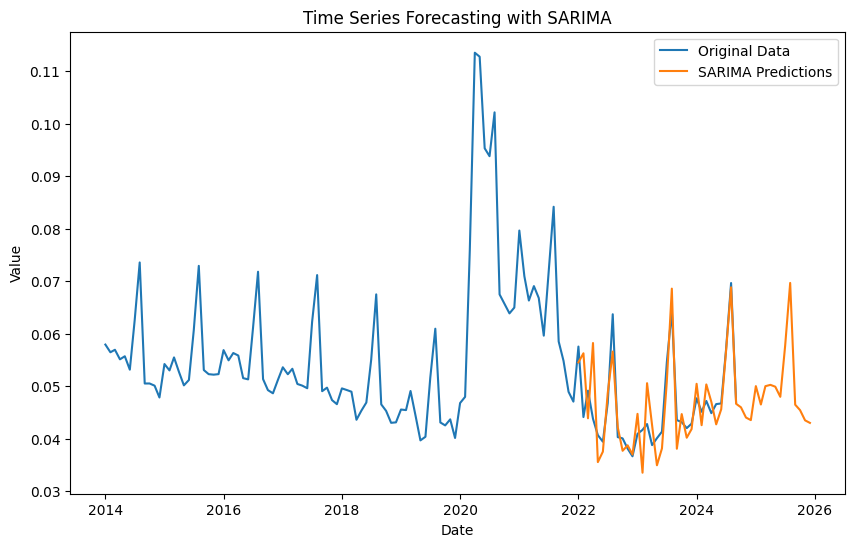

SARIMA - MSE: 2.6421064144216214e-05, RMSE: 0.0051401424245069525, MAPE: 8.99%


In [861]:
model_sarima(data_filtered,'Canada', '25+', 'Female')

## 25+ Total

In [862]:
data_filtered = prepare_data(combined_df, country='Canada', age='25+', sex='Total')

In [863]:
calculate_seasonal_strength(data_filtered, 'Value', period=12)

Seasonal Strength: 0.7480
Strong seasonality detected.


(0.7480069787315213, True)

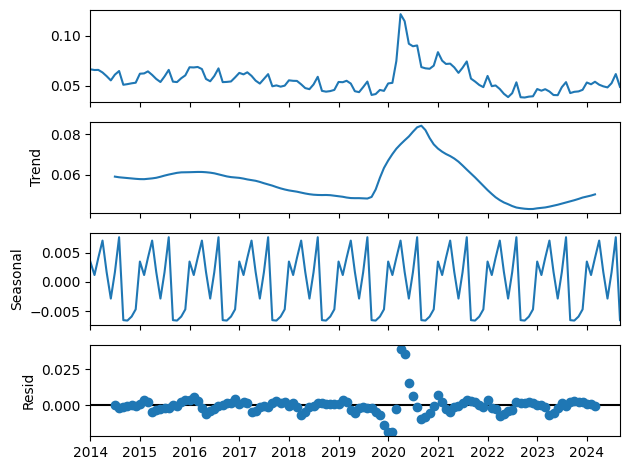

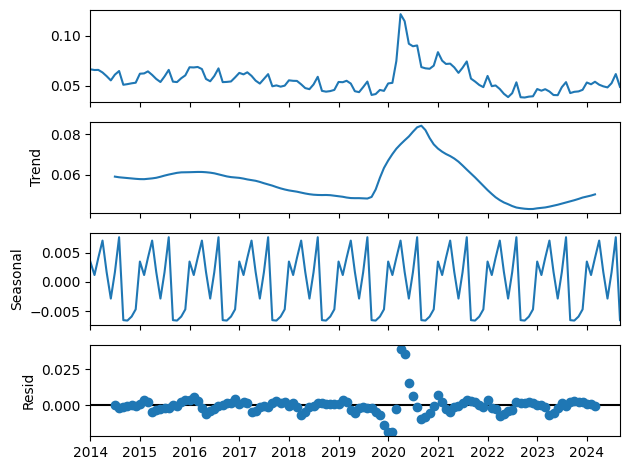

In [864]:
result = seasonal_decompose(data_filtered, model='additive', period=12)
result.plot()

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,1,1)[12]             : AIC=-854.617, Time=0.84 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=-789.746, Time=0.07 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=-823.228, Time=0.13 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=-856.368, Time=0.17 sec
 ARIMA(0,1,1)(0,1,0)[12]             : AIC=-813.845, Time=0.05 sec
 ARIMA(0,1,1)(1,1,1)[12]             : AIC=-850.290, Time=0.73 sec
 ARIMA(0,1,1)(0,1,2)[12]             : AIC=inf, Time=0.61 sec
 ARIMA(0,1,1)(1,1,0)[12]             : AIC=-832.725, Time=0.20 sec
 ARIMA(0,1,1)(1,1,2)[12]             : AIC=inf, Time=0.31 sec
 ARIMA(0,1,0)(0,1,1)[12]             : AIC=-836.336, Time=0.30 sec
 ARIMA(0,1,2)(0,1,1)[12]             : AIC=-855.257, Time=0.54 sec
 ARIMA(1,1,0)(0,1,1)[12]             : AIC=-846.862, Time=0.33 sec
 ARIMA(1,1,2)(0,1,1)[12]             : AIC=-857.217, Time=0.78 sec
 ARIMA(1,1,2)(0,1,0)[12]             : AIC=-815.746, Time=0.17 sec
 ARIMA(1,1,2)(1,1,1)[12]     

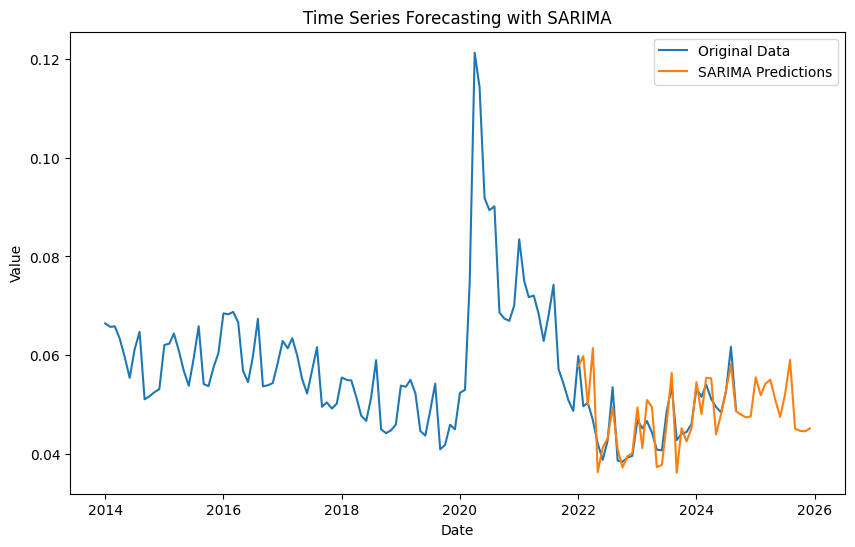

SARIMA - MSE: 1.996040739249254e-05, RMSE: 0.004467707173986735, MAPE: 7.09%


In [865]:
model_sarima(data_filtered,'Canada', '25+', 'Total')

## Final dataframe with results

In [866]:
forecast_results_df

,Model,Country,Age,Sex,Date,Forecast,MSE,RMSE,MAPE
0,SARIMA,Italy,15-24,Male,2022-01-01,0.248991,0.000019,0.004396,0.009529
1,SARIMA,Italy,15-24,Male,2022-02-01,0.233000,0.000019,0.004396,0.009529
2,SARIMA,Italy,15-24,Male,2022-03-01,0.233000,0.000019,0.004396,0.009529
3,SARIMA,Italy,15-24,Male,2022-04-01,0.226813,0.000019,0.004396,0.009529
4,SARIMA,Italy,15-24,Male,2022-05-01,0.222000,0.000019,0.004396,0.009529
...,...,...,...,...,...,...,...,...,...
6475,SARIMA,Canada,25+,Total,2025-08-01,0.059050,0.000020,0.004468,0.070905
6476,SARIMA,Canada,25+,Total,2025-09-01,0.045148,0.000020,0.004468,0.070905
6477,SARIMA,Canada,25+,Total,2025-10-01,0.044696,0.000020,0.004468,0.070905
6478,SARIMA,Canada,25+,Total,2025-11-01,0.044592,0.000020,0.004468,0.070905


In [867]:
data = forecast_results_df.copy()
filtered_data = data[pd.to_datetime(data['Date']) >= pd.to_datetime("2023-09-01")]

In [868]:
filtered_data

,Model,Country,Age,Sex,Date,Forecast,MSE,RMSE,MAPE
20,SARIMA,Italy,15-24,Male,2023-09-01,0.213000,0.000019,0.004396,0.009529
21,SARIMA,Italy,15-24,Male,2023-10-01,0.209479,0.000019,0.004396,0.009529
22,SARIMA,Italy,15-24,Male,2023-11-01,0.209479,0.000019,0.004396,0.009529
23,SARIMA,Italy,15-24,Male,2023-12-01,0.209479,0.000019,0.004396,0.009529
24,SARIMA,Italy,15-24,Male,2024-01-01,0.205788,0.000019,0.004396,0.009529
...,...,...,...,...,...,...,...,...,...
6475,SARIMA,Canada,25+,Total,2025-08-01,0.059050,0.000020,0.004468,0.070905
6476,SARIMA,Canada,25+,Total,2025-09-01,0.045148,0.000020,0.004468,0.070905
6477,SARIMA,Canada,25+,Total,2025-10-01,0.044696,0.000020,0.004468,0.070905
6478,SARIMA,Canada,25+,Total,2025-11-01,0.044592,0.000020,0.004468,0.070905


In [869]:
forecast_results_df = filtered_data

filtered_df = forecast_results_df.loc[
    forecast_results_df.groupby(['Country', 'Age', 'Sex', 'Date'])['RMSE'].idxmin()
].reset_index(drop=True)

filtered_df.to_csv('filtered_results-3.csv', index=False)
filtered_df

,Model,Country,Age,Sex,Date,Forecast,MSE,RMSE,MAPE
0,SARIMA,Canada,15-24,Female,2023-09-01,0.102357,0.000242,0.015545,0.138369
1,SARIMA,Canada,15-24,Female,2023-10-01,0.093731,0.000242,0.015545,0.138369
2,SARIMA,Canada,15-24,Female,2023-11-01,0.099196,0.000242,0.015545,0.138369
3,SARIMA,Canada,15-24,Female,2023-12-01,0.099025,0.000242,0.015545,0.138369
4,SARIMA,Canada,15-24,Female,2024-01-01,0.097523,0.000242,0.015545,0.138369
...,...,...,...,...,...,...,...,...,...
2823,ARIMA,United States of America,25+,Total,2025-08-01,0.029308,0.000007,0.002675,0.069663
2824,ARIMA,United States of America,25+,Total,2025-09-01,0.029101,0.000007,0.002675,0.069663
2825,ARIMA,United States of America,25+,Total,2025-10-01,0.028894,0.000007,0.002675,0.069663
2826,ARIMA,United States of America,25+,Total,2025-11-01,0.028688,0.000007,0.002675,0.069663


In [870]:
filtered_data.to_csv("filtered_data_2025.csv", index=False)

In [871]:
filtered_df = filtered_df.drop(columns=['Model'])
filtered_df.to_csv('filtered_data_2025_without_model_column.csv', index=False)

In [ ]:
columns_to_keep = ['Age', 'Sex', 'Country', 'Unemployment Rate (%)', 'Year', 'Month']
def process_forecast_data(forecast_df, initial_df, output_file):

    mapped_df = forecast_df.rename(columns={'Forecast': 'Unemployment Rate (%)'})

    mapped_df['Year'] = pd.to_datetime(mapped_df['Date']).dt.year
    mapped_df['Month'] = pd.to_datetime(mapped_df['Date']).dt.month

    cleaned_df = mapped_df[columns_to_keep]

    combined_df = pd.concat([initial_df, cleaned_df], ignore_index=True)
    combined_df.to_csv(output_file, index=False)

    return combined_df

In [ ]:
selected_countries = [
    'Canada', 'Czechia', 'France', 'Germany', 'Greece', 'Hungary', 'Iceland',
    'Ireland', 'Italy', 'Latvia', 'Lithuania', 'Netherlands', 'Norway',
    'Slovak Republic', 'Slovenia', 'Spain', 'United States of America'
]

filtered_initial_data = combined_df[combined_df["Country"].isin(selected_countries)]

filtered_output_file = "datasets/filtered_initial_unemployment_data.csv"
filtered_initial_data.to_csv(filtered_output_file, index=False)

In [872]:
combined_df_with_2025 = process_forecast_data(filtered_df, filtered_initial_data, 'datasets/df_with_2025_.csv')

,Age,Sex,Country,Unemployment Rate (%),Year,Month
0,25+,Female,Ireland,0.096000,2014,4
1,25+,Total,Norway,0.028000,2014,10
2,25+,Male,Iceland,0.052000,2021,1
3,25+,Male,Iceland,0.049000,2021,2
4,25+,Male,Iceland,0.048000,2021,3
...,...,...,...,...,...,...
30822,25+,Total,United States of America,0.058255,2014,1
30823,15-24,Male,United States of America,0.164923,2014,1
30824,25+,Male,United States of America,0.062145,2014,1
30825,15-24,Female,United States of America,0.133269,2014,1
